## Customer-Centric Retail Analysis: Trends,Correlations, and Time Series Forecasts
Submitted by

Name                          Reg No

MUHAMMED AJMAL T              223036

MUHAMMED FARIS MUKTHAR M V    223037

NASREEN OT                    223038

NIDIN V NANDAN                223039

In [1]:
#loading necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px


In [2]:
#Reading the dataset
df=pd.read_csv('/content/customer_shopping_data.csv')

In [3]:
df

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,invoice_date,shopping_mall
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,5/8/2022,Kanyon
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,12/12/2021,Forum Istanbul
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,9/11/2021,Metrocity
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,16/05/2021,Metropol AVM
4,I337046,C189076,Female,53,Books,4,60.60,Cash,24/10/2021,Kanyon
...,...,...,...,...,...,...,...,...,...,...
99452,I219422,C441542,Female,45,Souvenir,5,58.65,Credit Card,21/09/2022,Kanyon
99453,I325143,C569580,Male,27,Food & Beverage,2,10.46,Cash,22/09/2021,Forum Istanbul
99454,I824010,C103292,Male,63,Food & Beverage,2,10.46,Debit Card,28/03/2021,Metrocity
99455,I702964,C800631,Male,56,Technology,4,4200.00,Cash,16/03/2021,Istinye Park


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99457 entries, 0 to 99456
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   invoice_no      99457 non-null  object 
 1   customer_id     99457 non-null  object 
 2   gender          99457 non-null  object 
 3   age             99457 non-null  int64  
 4   category        99457 non-null  object 
 5   quantity        99457 non-null  int64  
 6   price           99457 non-null  float64
 7   payment_method  99457 non-null  object 
 8   invoice_date    99457 non-null  object 
 9   shopping_mall   99457 non-null  object 
dtypes: float64(1), int64(2), object(7)
memory usage: 7.6+ MB


It gives as the details about the dataset

Here we can see that the dataset have 10 columns and 99457 rows

we can see that the invoice_date column is in object datatype as we are doing time series it will be better to convert it to datetime format

## *Starting Data Pre-Processing*

In [5]:
df.isnull().any()

invoice_no        False
customer_id       False
gender            False
age               False
category          False
quantity          False
price             False
payment_method    False
invoice_date      False
shopping_mall     False
dtype: bool

it is clear from the result that the dataset is frre from null values

In [6]:
df.describe()

,age,quantity,price
count,99457.000000,99457.000000,99457.000000
mean,43.427089,3.003429,689.256321
std,14.990054,1.413025,941.184567
min,18.000000,1.000000,5.230000
25%,30.000000,2.000000,45.450000
50%,43.000000,3.000000,203.300000
75%,56.000000,4.000000,1200.320000
max,69.000000,5.000000,5250.000000


this gives as the statistical information about the dataset

In [7]:
df.dtypes

invoice_no         object
customer_id        object
gender             object
age                 int64
category           object
quantity            int64
price             float64
payment_method     object
invoice_date       object
shopping_mall      object
dtype: object

Here the invoice date is in object datatype for the convinience of our analysis let us convert it to datetime format

In [8]:
df['invoice_date'] = pd.to_datetime(df['invoice_date'],dayfirst=True)

In [9]:
df.dtypes

invoice_no                object
customer_id               object
gender                    object
age                        int64
category                  object
quantity                   int64
price                    float64
payment_method            object
invoice_date      datetime64[ns]
shopping_mall             object
dtype: object

now we have converted invoice_date to datetime format

Starting feature engineering by creating 3 new features out of the invoice date


1.   Day
2.   Month
3.   Year






In [10]:
df['Day'] = df['invoice_date'].dt.day_name()
df['Month'] = df['invoice_date'].dt.month_name()
df['Year'] = df['invoice_date'].dt.year

## Now in the dataset we can see that the price is given for a single item and there is no total payment column so using the feature engineering we are gonna create a new column named Total_Payment by multiplying the column quantity with the column price

In [11]:
df['Total_Payment'] = df['quantity'] * df['price']

In [12]:
## convert Age column to Age Range Column To help us In Analysis
cut_labels_4 = ['10-20', '21-30', '31-50', '51-70']
cut_bins = [0,20, 30, 50, 71]
df["Age_Range"] =pd.cut(df.age,
                            bins=cut_bins,
                         labels=cut_labels_4)

In [13]:
df

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,invoice_date,shopping_mall,Day,Month,Year,Total_Payment,Age_Range
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,2022-08-05,Kanyon,Friday,August,2022,7502.00,21-30
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,2021-12-12,Forum Istanbul,Sunday,December,2021,5401.53,21-30
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,2021-11-09,Metrocity,Tuesday,November,2021,300.08,10-20
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,2021-05-16,Metropol AVM,Sunday,May,2021,15004.25,51-70
4,I337046,C189076,Female,53,Books,4,60.60,Cash,2021-10-24,Kanyon,Sunday,October,2021,242.40,51-70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99452,I219422,C441542,Female,45,Souvenir,5,58.65,Credit Card,2022-09-21,Kanyon,Wednesday,September,2022,293.25,31-50
99453,I325143,C569580,Male,27,Food & Beverage,2,10.46,Cash,2021-09-22,Forum Istanbul,Wednesday,September,2021,20.92,21-30
99454,I824010,C103292,Male,63,Food & Beverage,2,10.46,Debit Card,2021-03-28,Metrocity,Sunday,March,2021,20.92,51-70
99455,I702964,C800631,Male,56,Technology,4,4200.00,Cash,2021-03-16,Istinye Park,Tuesday,March,2021,16800.00,51-70


Now in our dataset we have a total of 15 columns

age


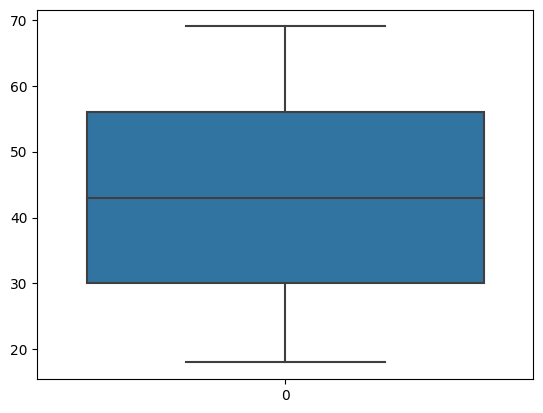

quantity


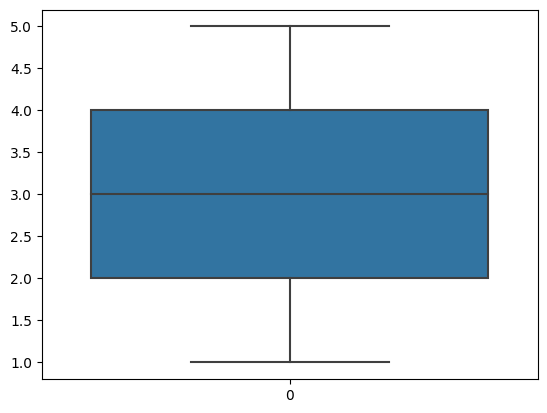

price


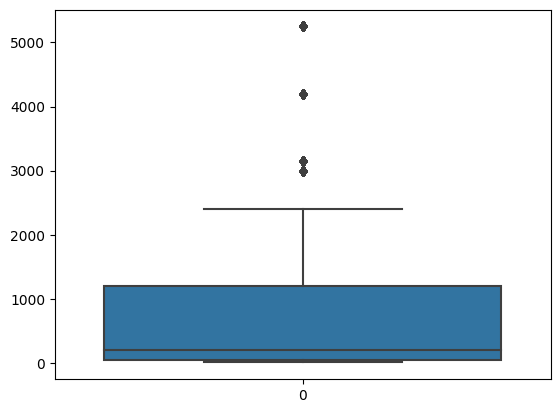

Total_Payment


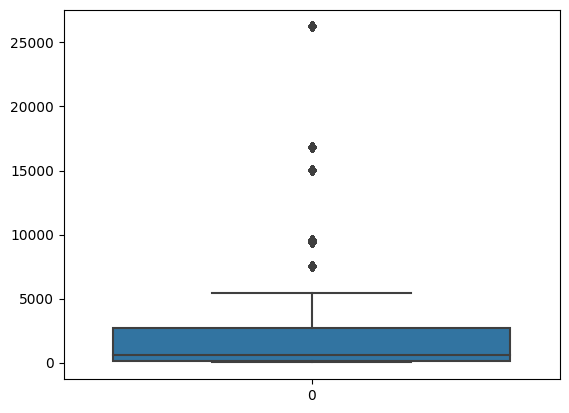

In [14]:
#Checking for outliers
a=["age","quantity","price",'Total_Payment']
for i in a:
    print(i)
    sns.boxplot(df[i])
    plt.show()

Here we can see that the outlier are present for the price and Total_Payement column and through the barplot we can see that the outliers are above the upperlimit so we have to replace the values with the upper threshold value

Int64Index([    0,     3,     5,    15,    23,    27,    34,    36,    43,
               53,
            ...
            99374, 99384, 99387, 99393, 99404, 99424, 99430, 99436, 99448,
            99455],
           dtype='int64', length=13986)


<ipython-input-15-ced33f17aa2a>:1: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  Q1=np.percentile(df["Total_Payment"],25,interpolation="midpoint")
<ipython-input-15-ced33f17aa2a>:2: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  Q2=np.percentile(df["Total_Payment"],50,interpolation="midpoint")
<ipython-input-15-ced33f17aa2a>:3: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.2

<Axes: >

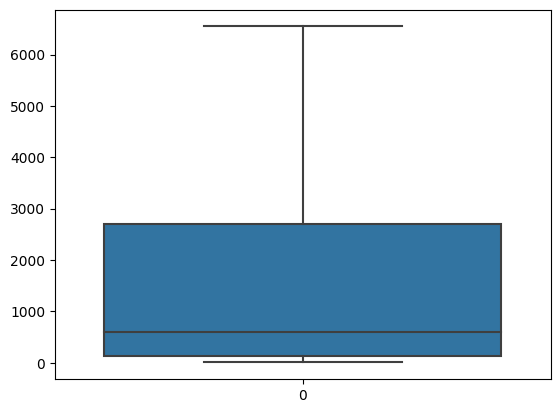

In [15]:
Q1=np.percentile(df["Total_Payment"],25,interpolation="midpoint")
Q2=np.percentile(df["Total_Payment"],50,interpolation="midpoint")
Q3=np.percentile(df["Total_Payment"],75,interpolation="midpoint")
IQR=Q3-Q1
low_lim=Q1-1.5*IQR
up_lim=Q3+1.5*IQR


index1 = (df['Total_Payment']>up_lim)
index1 = df.loc[index1].index
print(index1)
df.loc[list(index1),'Total_Payment']=up_lim

sns.boxplot(df['Total_Payment'])

now Total_Payment column is free of outliers

Int64Index([    3,    15,    23,    53,    69,    70,    73,    87,   100,
              146,
            ...
            99250, 99270, 99288, 99304, 99307, 99332, 99374, 99387, 99424,
            99455],
           dtype='int64', length=5024)


<ipython-input-16-d3c3e1b0489d>:1: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  Q1=np.percentile(df["price"],25,interpolation="midpoint")
<ipython-input-16-d3c3e1b0489d>:2: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  Q2=np.percentile(df["price"],50,interpolation="midpoint")
<ipython-input-16-d3c3e1b0489d>:3: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  Q3=np.perce

<Axes: >

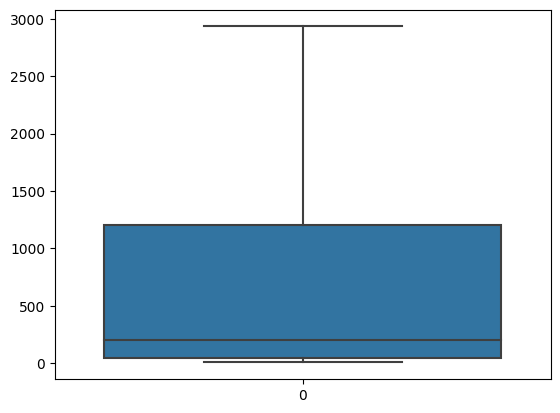

In [16]:
Q1=np.percentile(df["price"],25,interpolation="midpoint")
Q2=np.percentile(df["price"],50,interpolation="midpoint")
Q3=np.percentile(df["price"],75,interpolation="midpoint")
IQR=Q3-Q1
low_lim=Q1-1.5*IQR
up_lim=Q3+1.5*IQR


index1 = (df['price']>up_lim)
index1 = df.loc[index1].index
print(index1)
df.loc[list(index1),'price']=up_lim

sns.boxplot(df['price'])

now price column is free of outliers

So after running the outlier removal method and plotting the new bar plot it is able to understand that the outliers has been removed


In [17]:
#checking for the items in category column
df['category'].unique()

array(['Clothing', 'Shoes', 'Books', 'Cosmetics', 'Food & Beverage',
       'Toys', 'Technology', 'Souvenir'], dtype=object)

In [18]:
#checking for the items in payment_method column
df['payment_method'].unique()

array(['Credit Card', 'Debit Card', 'Cash'], dtype=object)

In [19]:
#checking for the items in shopping_mall column
df['shopping_mall'].unique()

array(['Kanyon', 'Forum Istanbul', 'Metrocity', 'Metropol AVM',
       'Istinye Park', 'Mall of Istanbul', 'Emaar Square Mall',
       'Cevahir AVM', 'Viaport Outlet', 'Zorlu Center'], dtype=object)

In [20]:
#checking for the counts of each item in the category column in the dataset
df['category'].value_counts()

Clothing           34487
Cosmetics          15097
Food & Beverage    14776
Toys               10087
Shoes              10034
Souvenir            4999
Technology          4996
Books               4981
Name: category, dtype: int64

In [21]:
#checking for the counts of each item in the payment_method column in the dataset
df['payment_method'].value_counts()

Cash           44447
Credit Card    34931
Debit Card     20079
Name: payment_method, dtype: int64

In [22]:
#checking for the counts of each item in the shopping_mall column in the dataset
df['shopping_mall'].value_counts()

Mall of Istanbul     19943
Kanyon               19823
Metrocity            15011
Metropol AVM         10161
Istinye Park          9781
Zorlu Center          5075
Cevahir AVM           4991
Forum Istanbul        4947
Viaport Outlet        4914
Emaar Square Mall     4811
Name: shopping_mall, dtype: int64

Starting to extract the trends through visualiazation

<ipython-input-23-743d015ef066>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap="coolwarm")


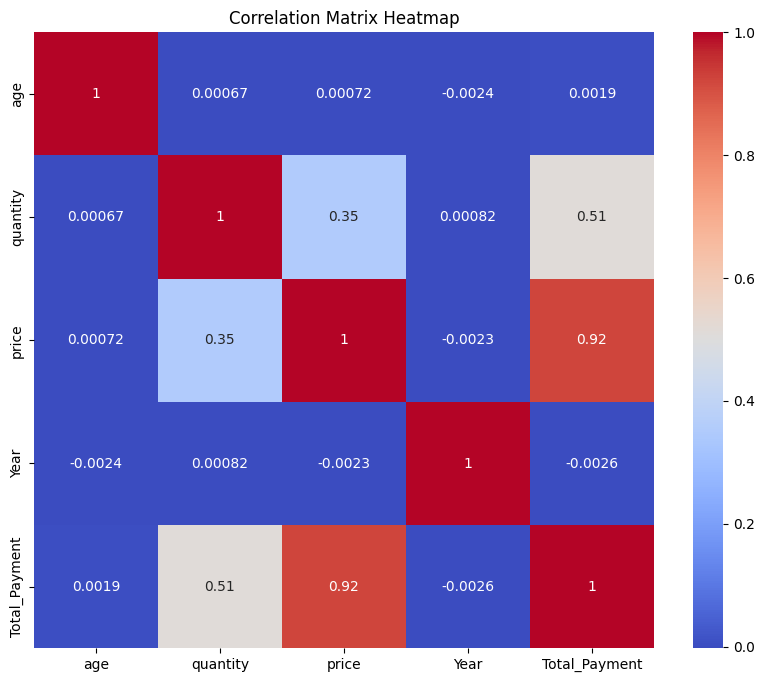

In [23]:
#plotting heatmap to check the correlation between different variables in the dataset
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm")

plt.title("Correlation Matrix Heatmap")

plt.show()

Text(0, 0.5, 'Total Number')

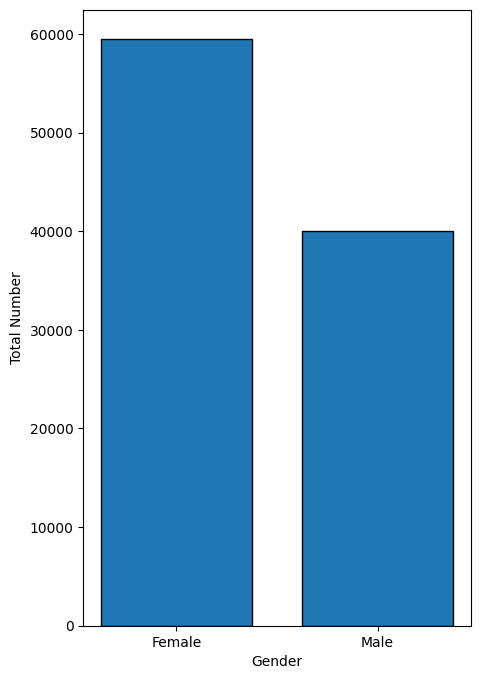

In [24]:
#checking for which gender make the most purchases in the malls
plt.figure(figsize=(5, 8))
bar_width=0.75

plt.bar(df['gender'].value_counts().index, df['gender'].value_counts().values, width=bar_width, edgecolor='black')
plt.xlabel("Gender")
plt.ylabel("Total Number")

In a dataset containing a total of 99,457 purchases, it's
evident that the majority of purchases are attributed to females, accounting for 59.80% of
the total. In contrast, the number of purchases made by males is slightly lower at 40.10%,
approximately 20% less than that of females.

In [25]:
#Most used payment method of each age

In [26]:
df2 =df.groupby(['Age_Range'])['payment_method'].value_counts().to_frame()
df2.rename(columns={'payment_method':'Total'}, inplace = True)
df2 = df2.reset_index()
df2

,Age_Range,payment_method,Total
0,10-20,Cash,2502
1,10-20,Credit Card,1998
2,10-20,Debit Card,1124
3,21-30,Cash,8675
4,21-30,Credit Card,6787
5,21-30,Debit Card,3938
6,31-50,Cash,17082
7,31-50,Credit Card,13471
8,31-50,Debit Card,7779
9,51-70,Cash,16188


In [27]:
fig= px.bar( df2 , x=(df2['Age_Range']) ,
           y= df2['Total']
        , color='payment_method'
        , barmode = 'group')
fig.update_xaxes(title='Ages')
fig.update_yaxes(title='Total')

Cash and Credit Cards are the most frequently employed payment methods across
all age groups.

The bar graph reveals age-related patterns in payment method usage. Specifically,
age groups between 31 and 70 tend to make more purchases.



In [28]:
#checking which category of product is getting more sale for different age groups

In [29]:
d =df.groupby(['Age_Range'])['category'].value_counts().to_frame()
d.rename(columns={'category':'Total'}, inplace = True)
d = d.reset_index()
d

,Age_Range,category,Total
0,10-20,Clothing,1974
1,10-20,Food & Beverage,863
2,10-20,Cosmetics,825
3,10-20,Shoes,575
4,10-20,Toys,569
5,10-20,Books,289
6,10-20,Souvenir,277
7,10-20,Technology,252
8,21-30,Clothing,6752
9,21-30,Cosmetics,2894


In [30]:
fig= px.bar( d , x=(d['Age_Range']) ,
           y= d['Total']
        , color='category'
        , barmode = 'group')
fig.update_xaxes(title='Ages')
fig.update_yaxes(title='Total')

The age group "31-50" tends to make the highest number of purchases across all
product categories. This group has the highest total purchases in "Clothing,"
"Cosmetics," "Food & Beverage," "Shoes," "Toys," "Books," "Souvenir," and
"Technology."

The age group "51-70" is the second-largest consumer group

the category books and are gettingmore sales for aged customers rather than the younger generation

In [31]:
#Genders And their Preferred Categories

In [32]:
df3=df.groupby(['gender'])['category'].value_counts().to_frame()
df3.rename(columns=({'category':'Total'}),inplace=True)
df3=df3.reset_index()
df3

,gender,category,Total
0,Female,Clothing,20652
1,Female,Cosmetics,9070
2,Female,Food & Beverage,8804
3,Female,Toys,6085
4,Female,Shoes,5967
5,Female,Souvenir,3017
6,Female,Technology,2981
7,Female,Books,2906
8,Male,Clothing,13835
9,Male,Cosmetics,6027


In [33]:
fig= px.bar( df3 , x=df3['category'] ,
           y= df3['Total']
        , color='gender'
        , barmode = 'group')
fig.update_xaxes(title='Categories ')
fig.update_yaxes(title='Total Sales')

Observing this graph, as previously noted, females account for the majority of purchases,
with the "clothing" category seeing the highest purchase activity.

"Cosmetics" and "Food & Beverage" also show higher total sales among females
compared to males.

# Total Sales Across All years

In [34]:

custom_month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
df4 =df.groupby(['Month','Year'])['Total_Payment'].sum().reset_index()
df4

,Month,Year,Total_Payment
0,April,2021,7171724.975
1,April,2022,7079208.130
2,August,2021,7104043.505
3,August,2022,7234962.735
4,December,2021,7295451.140
5,December,2022,7258584.830
6,February,2021,6460786.620
7,February,2022,6381841.715
8,February,2023,6964664.940
9,January,2021,7312813.105


In [35]:
df4['Month'] = pd.Categorical(df4['Month'], categories=custom_month_order, ordered=True)

df4 = df4.sort_values(['Month', 'Year'])

df4.reset_index(drop=True, inplace=True)

print(df4)


        Month  Year  Total_Payment
0     January  2021    7312813.105
1     January  2022    7347581.185
2     January  2023    7180324.510
3    February  2021    6460786.620
4    February  2022    6381841.715
5    February  2023    6964664.940
6       March  2021    7291754.525
7       March  2022    7520488.875
8       March  2023    1905416.835
9       April  2021    7171724.975
10      April  2022    7079208.130
11        May  2021    7321239.435
12        May  2022    7452818.180
13       June  2021    7025564.240
14       June  2022    7089883.920
15       July  2021    7803243.310
16       July  2022    7588735.025
17     August  2021    7104043.505
18     August  2022    7234962.735
19  September  2021    6921147.265
20  September  2022    7049667.420
21    October  2021    7507980.455
22    October  2022    7585571.355
23   November  2021    7183632.000
24   November  2022    6724617.080
25   December  2021    7295451.140
26   December  2022    7258584.830


In [36]:
px.line(df4 , x='Month' , y='Total_Payment' , color='Year')

There is a recurring pattern in total payments that follows a yearly cycle. Total
payments tend to peak and dip around the same months each year.

The highest total payments occur in the months of January and July.

In the month of february there is a dip in the sale

After march most of the months have a constant scale of sale

In [37]:
fig= px.bar( df4 , x=df4['Month']
        , y= df4['Total_Payment']
        , color='Year'
        , barmode = 'group')
fig.update_xaxes(title='Month ')
fig.update_yaxes(title='Total Sales')

In [38]:
#payment method used for each category

In [39]:
df5 =df.groupby(['category'])['payment_method'].value_counts().to_frame()
df5.rename(columns={'payment_method':'Total'}, inplace = True)
df5 = df5.reset_index()
df5

,category,payment_method,Total
0,Books,Cash,2268
1,Books,Credit Card,1696
2,Books,Debit Card,1017
3,Clothing,Cash,15456
4,Clothing,Credit Card,12025
5,Clothing,Debit Card,7006
6,Cosmetics,Cash,6674
7,Cosmetics,Credit Card,5336
8,Cosmetics,Debit Card,3087
9,Food & Beverage,Cash,6587


In [40]:
fig= px.bar( df5 , x=(df5['category']) ,
           y= df5['Total']
        , color='payment_method'
        , barmode = 'group')
fig.update_xaxes(title='category')
fig.update_yaxes(title='Total')

"Cash" is the most frequently used payment method.

credit cards are the most used card

In [41]:
#category distirbution by shopping malls

In [42]:
df6 =df.groupby(['shopping_mall'])['category'].value_counts().to_frame()
df6.rename(columns={'category':'Total'}, inplace = True)
df6 = df6.reset_index()

df6

,shopping_mall,category,Total
0,Cevahir AVM,Clothing,1729
1,Cevahir AVM,Food & Beverage,772
2,Cevahir AVM,Cosmetics,732
3,Cevahir AVM,Toys,514
4,Cevahir AVM,Shoes,490
...,...,...,...
75,Zorlu Center,Shoes,519
76,Zorlu Center,Toys,513
77,Zorlu Center,Books,261
78,Zorlu Center,Souvenir,257


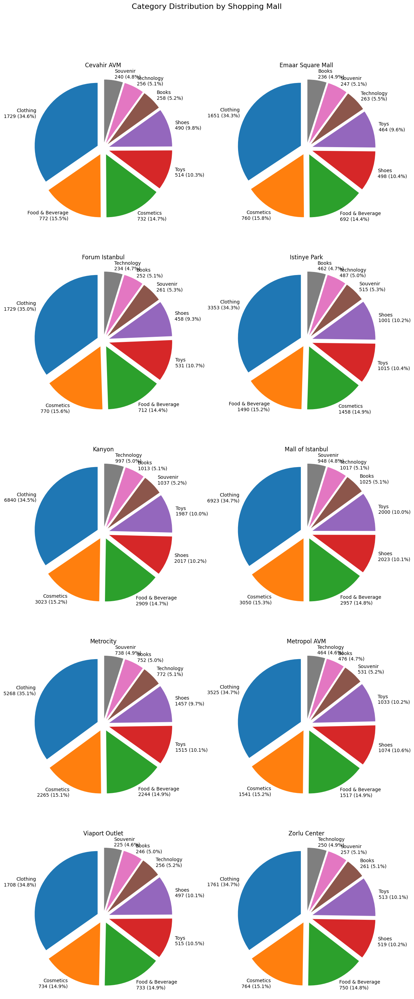

In [43]:
unique_malls = df6['shopping_mall'].unique()
num_cols = 2

num_rows = (len(unique_malls) + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 6 * num_rows))
fig.suptitle('Category Distribution by Shopping Mall', fontsize=16)


for i, mall in enumerate(unique_malls):
    mall_data = df6[df6['shopping_mall'] == mall]
    ax = axes[i // num_cols, i % num_cols]


    percentages = mall_data['Total'] / mall_data['Total'].sum() * 100


    labels = [f"{category}\n{count} ({percentage:.1f}%)" for category, count, percentage in zip(
        mall_data['category'], mall_data['Total'], percentages
    )]


    explode = [0.1] * len(mall_data['category'])

    ax.pie(mall_data['Total'], labels=labels, autopct='', startangle=90, explode=explode)
    ax.set_title(mall)

plt.tight_layout(rect=[0, 0, 1, 0.95])

plt.show()


The sales of clothing is more in the Mall of Istanbul(6923) followed by Kanyon
Mall(6840).

Emaar Square Mall is the mall with the smallest sales among all the other malls

Clothing category is the most dominant category in terms of sales across all the
malls.

In [44]:
#Payment Method Distribution by Shopping Mall

In [45]:
df7 =df.groupby(['shopping_mall'])['payment_method'].value_counts().to_frame()
df7.rename(columns={'payment_method':'Total'}, inplace = True)
df7 = df7.reset_index()
df7

,shopping_mall,payment_method,Total
0,Cevahir AVM,Cash,2228
1,Cevahir AVM,Credit Card,1779
2,Cevahir AVM,Debit Card,984
3,Emaar Square Mall,Cash,2114
4,Emaar Square Mall,Credit Card,1696
5,Emaar Square Mall,Debit Card,1001
6,Forum Istanbul,Cash,2183
7,Forum Istanbul,Credit Card,1750
8,Forum Istanbul,Debit Card,1014
9,Istinye Park,Cash,4436


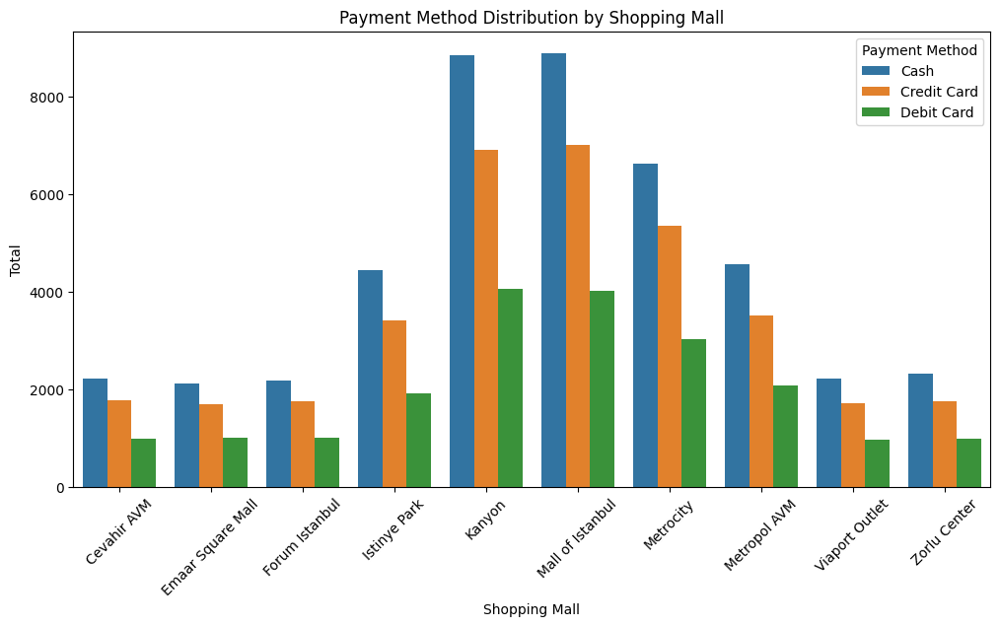

In [46]:
plt.figure(figsize=(12, 6))
sns.barplot(x="shopping_mall", y="Total", hue="payment_method", data=df7)
plt.title("Payment Method Distribution by Shopping Mall")
plt.xlabel("Shopping Mall")
plt.ylabel("Total")
plt.xticks(rotation=45)
plt.legend(title="Payment Method")
plt.show()


In all the malls most of the payments are done through cash mode. This leads to
the insights that still digital payments have not found much popularity in the
istanbul city.

As we have already identified the Mall of Istanbul and Kanyon Mall,as a result
most of the card used payments are also found in this mall.

## Correlations

## Correlation between Different Categories for Forum istanbul Mall

Total Monthly Payment for Clothing in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31     232699.450
1    2021-02-28     213439.845
2    2021-03-31     176229.925
3    2021-04-30     244893.760
4    2021-05-31     245057.215
5    2021-06-30     199799.620
6    2021-07-31     235291.200
7    2021-08-31     159452.275
8    2021-09-30     194589.290
9    2021-10-31     239492.320
10   2021-11-30     164499.150
11   2021-12-31     181903.790
12   2022-01-31     232481.510
13   2022-02-28     182149.385
14   2022-03-31     174892.980
15   2022-04-30     243830.065
16   2022-05-31     247403.370
17   2022-06-30     167499.950
18   2022-07-31     198326.875
19   2022-08-31     231635.755
20   2022-09-30     153450.675
21   2022-10-31     218132.155
22   2022-11-30     216686.240
23   2022-12-31     228498.330
24   2023-01-31     203537.205
25   2023-02-28     203700.660
26   2023-03-31      55351.345
Total Monthly Payment for Shoes in Forum Istanbul Mall
   invoice_date  To

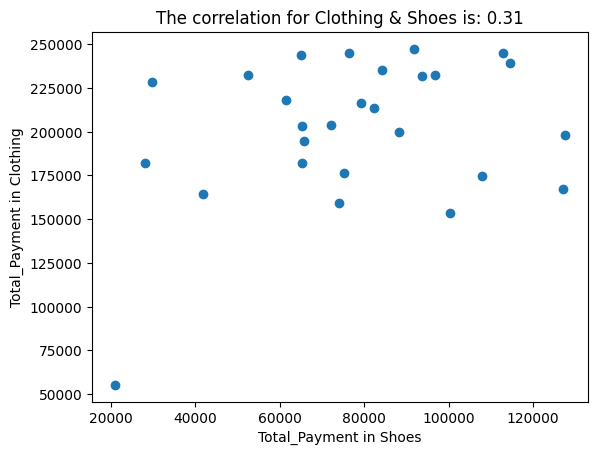

Total Monthly Payment for Books in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        2348.25
1    2021-02-28        1954.35
2    2021-03-31        1196.85
3    2021-04-30        2272.50
4    2021-05-31        1848.30
5    2021-06-30        1090.80
6    2021-07-31        1742.25
7    2021-08-31        1515.00
8    2021-09-30        2499.75
9    2021-10-31        1227.15
10   2021-11-30         606.00
11   2021-12-31         984.75
12   2022-01-31        1363.50
13   2022-02-28        1515.00
14   2022-03-31        1060.50
15   2022-04-30         802.95
16   2022-05-31        2030.10
17   2022-06-30        1469.55
18   2022-07-31         999.90
19   2022-08-31        1893.75
20   2022-09-30        1666.50
21   2022-10-31        1787.70
22   2022-11-30        1621.05
23   2022-12-31        2772.45
24   2023-01-31        1333.20
25   2023-02-28        2211.90
26   2023-03-31         242.40


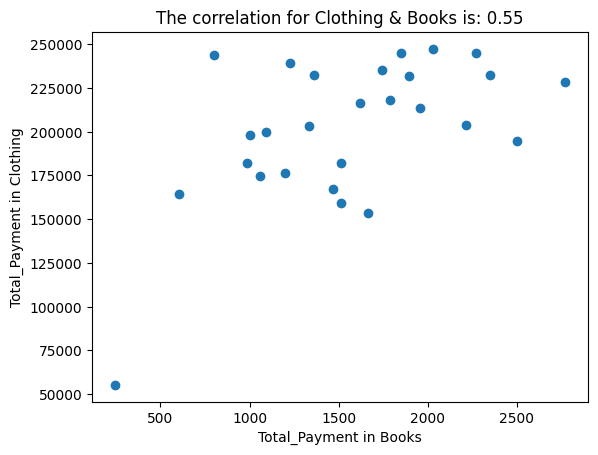

Total Monthly Payment for Cosmetics in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31       14596.94
1    2021-02-28       14881.56
2    2021-03-31       15328.82
3    2021-04-30        9148.50
4    2021-05-31       16995.88
5    2021-06-30       17443.14
6    2021-07-31       10449.62
7    2021-08-31       13255.16
8    2021-09-30       12198.00
9    2021-10-31       13743.08
10   2021-11-30       13011.20
11   2021-12-31       11344.14
12   2022-01-31       13458.46
13   2022-02-28       14190.34
14   2022-03-31       12157.34
15   2022-04-30       17565.12
16   2022-05-31       14190.34
17   2022-06-30        4919.86
18   2022-07-31        8253.98
19   2022-08-31       15084.86
20   2022-09-30       11872.72
21   2022-10-31       18378.32
22   2022-11-30       16264.00
23   2022-12-31       13499.12
24   2023-01-31       14271.66
25   2023-02-28       12035.36
26   2023-03-31        4635.24


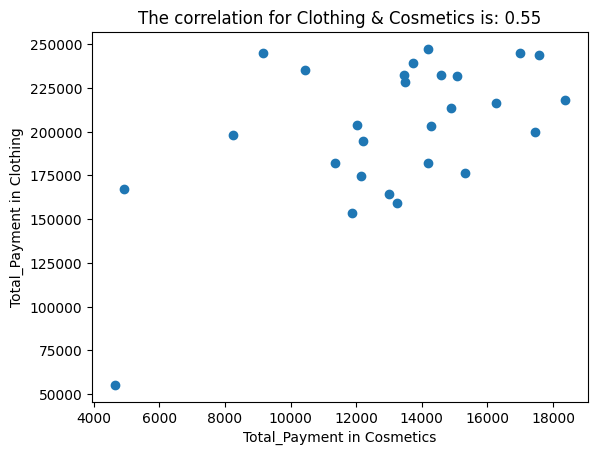

Total Monthly Payment for Food & Beverage in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1715.44
1    2021-02-28        1108.76
2    2021-03-31        1187.21
3    2021-04-30        1385.95
4    2021-05-31        1276.12
5    2021-06-30        1971.71
6    2021-07-31        1553.31
7    2021-08-31        1642.22
8    2021-09-30        1046.00
9    2021-10-31        1312.73
10   2021-11-30        1046.00
11   2021-12-31        1229.05
12   2022-01-31        1636.99
13   2022-02-28        1223.82
14   2022-03-31        1694.52
15   2022-04-30        1694.52
16   2022-05-31        1344.11
17   2022-06-30        1694.52
18   2022-07-31        1788.66
19   2022-08-31        1511.47
20   2022-09-30        1621.30
21   2022-10-31        1657.91
22   2022-11-30        2003.09
23   2022-12-31        1349.34
24   2023-01-31        1255.20
25   2023-02-28        1631.76
26   2023-03-31         580.53


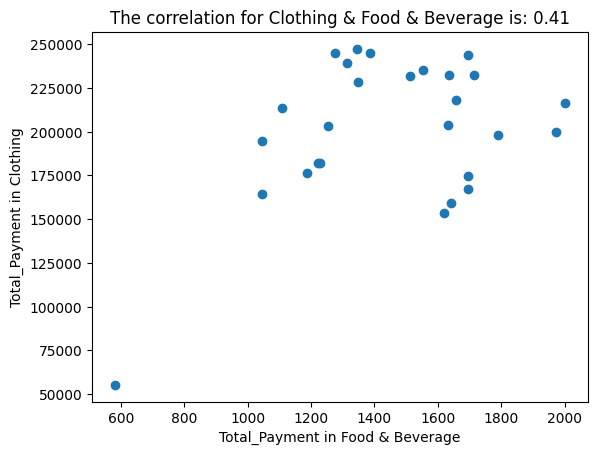

Total Monthly Payment for Toys in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        5555.20
1    2021-02-28        8852.48
2    2021-03-31        6988.80
3    2021-04-30        7562.24
4    2021-05-31        7633.92
5    2021-06-30        9139.20
6    2021-07-31        5053.44
7    2021-08-31        8995.84
8    2021-09-30        6558.72
9    2021-10-31        9533.44
10   2021-11-30        8995.84
11   2021-12-31        5125.12
12   2022-01-31       10393.60
13   2022-02-28        6128.64
14   2022-03-31        6128.64
15   2022-04-30       10967.04
16   2022-05-31        7203.84
17   2022-06-30        5949.44
18   2022-07-31        5483.52
19   2022-08-31        5877.76
20   2022-09-30        6128.64
21   2022-10-31        9891.84
22   2022-11-30       10286.08
23   2022-12-31        8350.72
24   2023-01-31        8780.80
25   2023-02-28        7096.32
26   2023-03-31         752.64


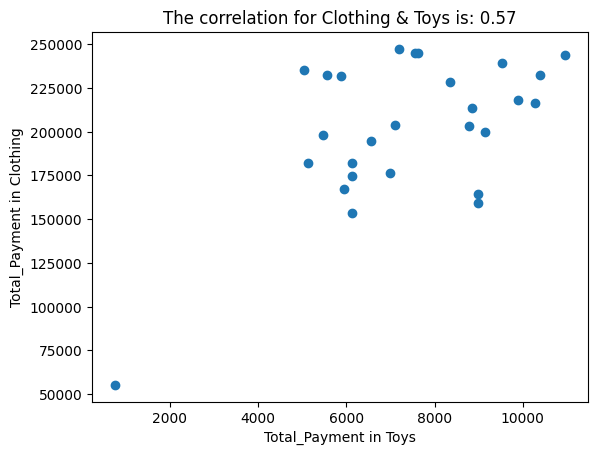

Total Monthly Payment for Technology in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31      65780.925
1    2021-02-28       7597.275
2    2021-03-31      20691.825
3    2021-04-30      68375.475
4    2021-05-31      39036.375
5    2021-06-30      37739.100
6    2021-07-31      59728.200
7    2021-08-31      33044.550
8    2021-09-30      28041.825
9    2021-10-31      52686.375
10   2021-11-30      52130.925
11   2021-12-31      48733.650
12   2022-01-31      42989.100
13   2022-02-28      67325.475
14   2022-03-31      31191.825
15   2022-04-30      57380.925
16   2022-05-31      60530.925
17   2022-06-30      21494.550
18   2022-07-31      38541.825
19   2022-08-31      30944.550
20   2022-09-30      37986.375
21   2022-10-31      89067.300
22   2022-11-30      33291.825
23   2022-12-31      20691.825
24   2023-01-31      30389.100
25   2023-02-28      26189.100
26   2023-03-31      22544.550


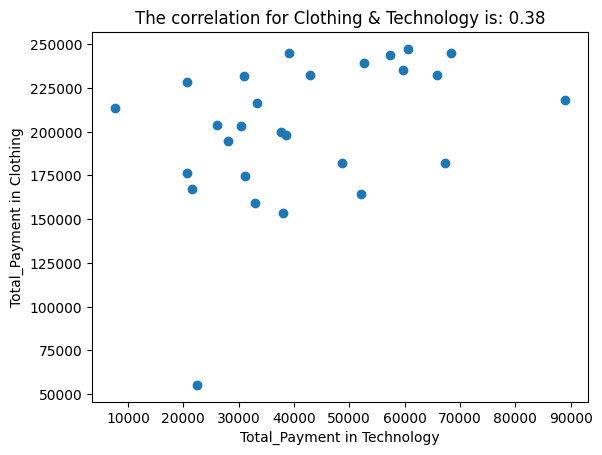

Total Monthly Payment for Souvenir in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1219.92
1    2021-02-28        1489.71
2    2021-03-31         985.32
3    2021-04-30         844.56
4    2021-05-31         750.72
5    2021-06-30        1137.81
6    2021-07-31        1161.27
7    2021-08-31        1231.65
8    2021-09-30        1653.93
9    2021-10-31         387.09
10   2021-11-30         234.60
11   2021-12-31         797.64
12   2022-01-31        3319.59
13   2022-02-28        2310.81
14   2022-03-31        1090.89
15   2022-04-30        1501.44
16   2022-05-31        1290.30
17   2022-06-30        1290.30
18   2022-07-31        1560.09
19   2022-08-31        1137.81
20   2022-09-30        1407.60
21   2022-10-31        2005.83
22   2022-11-30        1395.87
23   2022-12-31         539.58
24   2023-01-31         961.86
25   2023-02-28        1114.35
26   2023-03-31          58.65


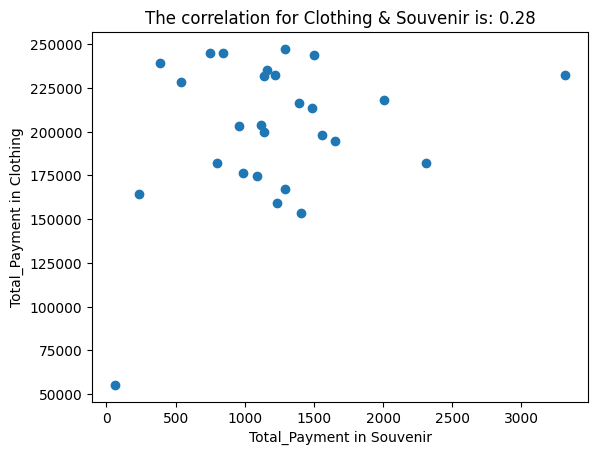

Total Monthly Payment for Shoes in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31      52596.580
1    2021-02-28      82386.700
2    2021-03-31      75239.255
3    2021-04-30      76385.000
4    2021-05-31     112776.990
5    2021-06-30      88333.805
6    2021-07-31      84132.615
7    2021-08-31      73984.320
8    2021-09-30      65800.320
9    2021-10-31     114632.095
10   2021-11-30      41793.520
11   2021-12-31      65200.150
12   2022-01-31      96845.375
13   2022-02-28      27989.610
14   2022-03-31     107975.630
15   2022-04-30      65036.365
16   2022-05-31      91771.040
17   2022-06-30     127126.475
18   2022-07-31     127672.050
19   2022-08-31      93789.930
20   2022-09-30     100228.015
21   2022-10-31      61435.345
22   2022-11-30      79331.255
23   2022-12-31      29790.120
24   2023-01-31      65200.150
25   2023-02-28      72238.405
26   2023-03-31      20896.760
Total Monthly Payment for Books in Forum Istanbul Mall
   invoice_date  Total

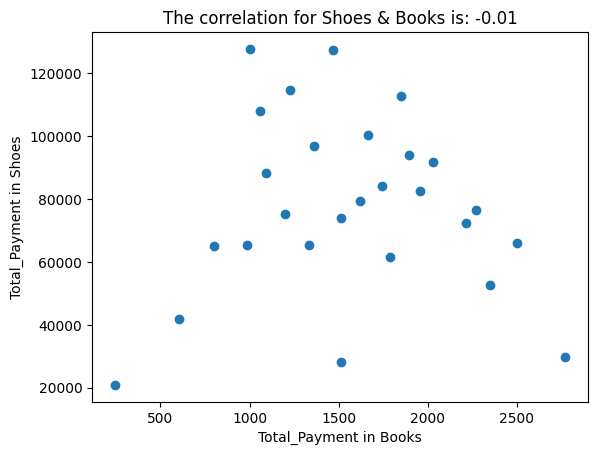

Total Monthly Payment for Cosmetics in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31       14596.94
1    2021-02-28       14881.56
2    2021-03-31       15328.82
3    2021-04-30        9148.50
4    2021-05-31       16995.88
5    2021-06-30       17443.14
6    2021-07-31       10449.62
7    2021-08-31       13255.16
8    2021-09-30       12198.00
9    2021-10-31       13743.08
10   2021-11-30       13011.20
11   2021-12-31       11344.14
12   2022-01-31       13458.46
13   2022-02-28       14190.34
14   2022-03-31       12157.34
15   2022-04-30       17565.12
16   2022-05-31       14190.34
17   2022-06-30        4919.86
18   2022-07-31        8253.98
19   2022-08-31       15084.86
20   2022-09-30       11872.72
21   2022-10-31       18378.32
22   2022-11-30       16264.00
23   2022-12-31       13499.12
24   2023-01-31       14271.66
25   2023-02-28       12035.36
26   2023-03-31        4635.24


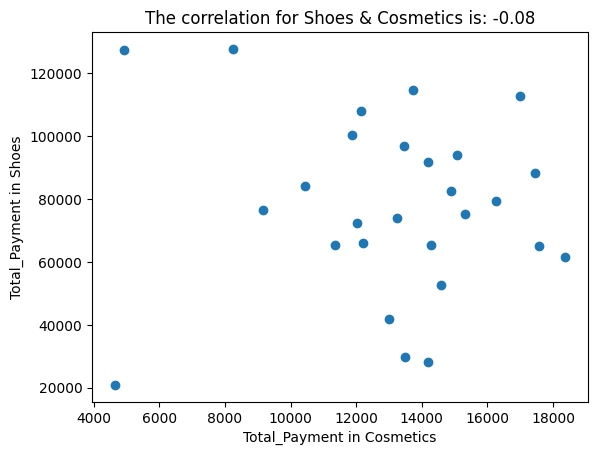

Total Monthly Payment for Food & Beverage in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1715.44
1    2021-02-28        1108.76
2    2021-03-31        1187.21
3    2021-04-30        1385.95
4    2021-05-31        1276.12
5    2021-06-30        1971.71
6    2021-07-31        1553.31
7    2021-08-31        1642.22
8    2021-09-30        1046.00
9    2021-10-31        1312.73
10   2021-11-30        1046.00
11   2021-12-31        1229.05
12   2022-01-31        1636.99
13   2022-02-28        1223.82
14   2022-03-31        1694.52
15   2022-04-30        1694.52
16   2022-05-31        1344.11
17   2022-06-30        1694.52
18   2022-07-31        1788.66
19   2022-08-31        1511.47
20   2022-09-30        1621.30
21   2022-10-31        1657.91
22   2022-11-30        2003.09
23   2022-12-31        1349.34
24   2023-01-31        1255.20
25   2023-02-28        1631.76
26   2023-03-31         580.53


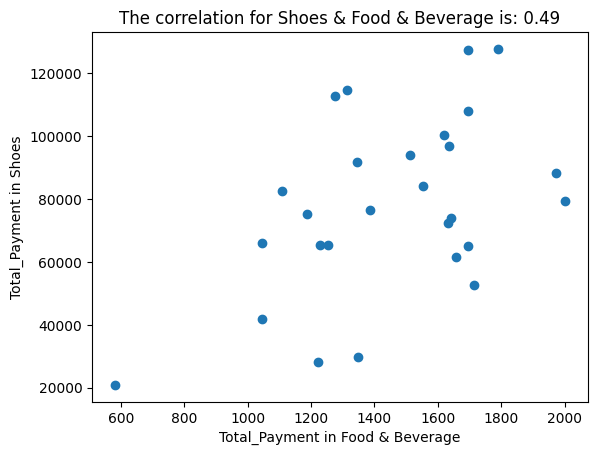

Total Monthly Payment for Toys in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        5555.20
1    2021-02-28        8852.48
2    2021-03-31        6988.80
3    2021-04-30        7562.24
4    2021-05-31        7633.92
5    2021-06-30        9139.20
6    2021-07-31        5053.44
7    2021-08-31        8995.84
8    2021-09-30        6558.72
9    2021-10-31        9533.44
10   2021-11-30        8995.84
11   2021-12-31        5125.12
12   2022-01-31       10393.60
13   2022-02-28        6128.64
14   2022-03-31        6128.64
15   2022-04-30       10967.04
16   2022-05-31        7203.84
17   2022-06-30        5949.44
18   2022-07-31        5483.52
19   2022-08-31        5877.76
20   2022-09-30        6128.64
21   2022-10-31        9891.84
22   2022-11-30       10286.08
23   2022-12-31        8350.72
24   2023-01-31        8780.80
25   2023-02-28        7096.32
26   2023-03-31         752.64


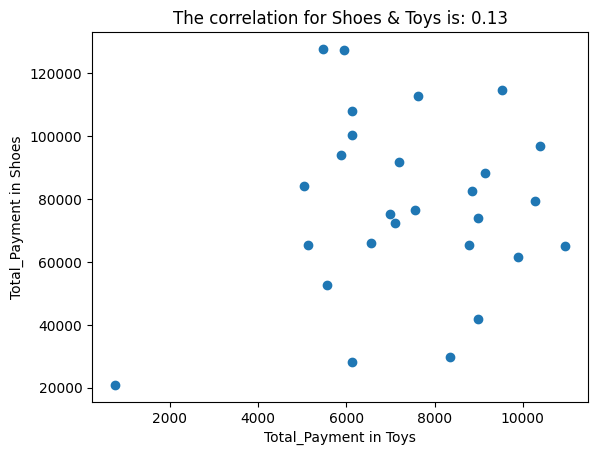

Total Monthly Payment for Technology in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31      65780.925
1    2021-02-28       7597.275
2    2021-03-31      20691.825
3    2021-04-30      68375.475
4    2021-05-31      39036.375
5    2021-06-30      37739.100
6    2021-07-31      59728.200
7    2021-08-31      33044.550
8    2021-09-30      28041.825
9    2021-10-31      52686.375
10   2021-11-30      52130.925
11   2021-12-31      48733.650
12   2022-01-31      42989.100
13   2022-02-28      67325.475
14   2022-03-31      31191.825
15   2022-04-30      57380.925
16   2022-05-31      60530.925
17   2022-06-30      21494.550
18   2022-07-31      38541.825
19   2022-08-31      30944.550
20   2022-09-30      37986.375
21   2022-10-31      89067.300
22   2022-11-30      33291.825
23   2022-12-31      20691.825
24   2023-01-31      30389.100
25   2023-02-28      26189.100
26   2023-03-31      22544.550


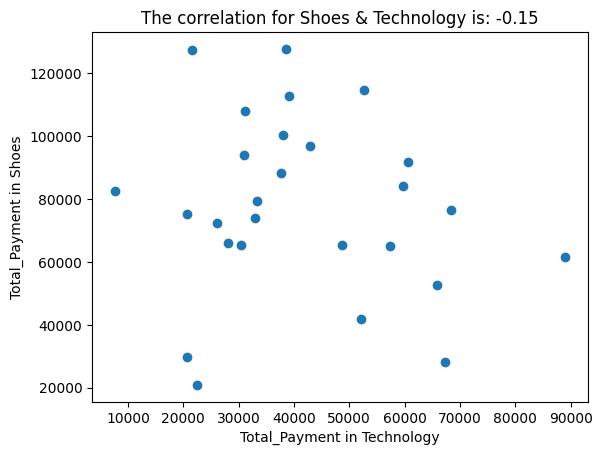

Total Monthly Payment for Souvenir in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1219.92
1    2021-02-28        1489.71
2    2021-03-31         985.32
3    2021-04-30         844.56
4    2021-05-31         750.72
5    2021-06-30        1137.81
6    2021-07-31        1161.27
7    2021-08-31        1231.65
8    2021-09-30        1653.93
9    2021-10-31         387.09
10   2021-11-30         234.60
11   2021-12-31         797.64
12   2022-01-31        3319.59
13   2022-02-28        2310.81
14   2022-03-31        1090.89
15   2022-04-30        1501.44
16   2022-05-31        1290.30
17   2022-06-30        1290.30
18   2022-07-31        1560.09
19   2022-08-31        1137.81
20   2022-09-30        1407.60
21   2022-10-31        2005.83
22   2022-11-30        1395.87
23   2022-12-31         539.58
24   2023-01-31         961.86
25   2023-02-28        1114.35
26   2023-03-31          58.65


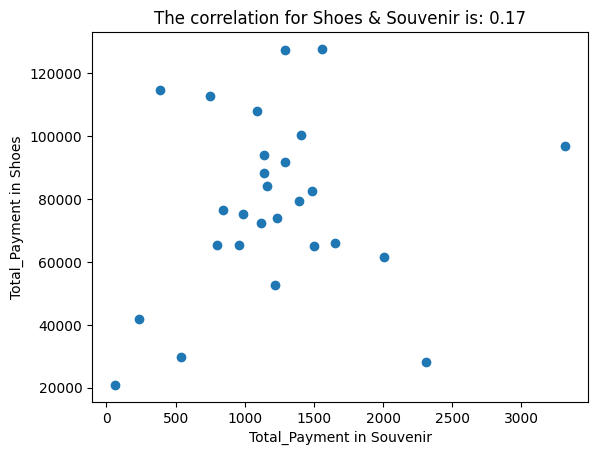

Total Monthly Payment for Books in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        2348.25
1    2021-02-28        1954.35
2    2021-03-31        1196.85
3    2021-04-30        2272.50
4    2021-05-31        1848.30
5    2021-06-30        1090.80
6    2021-07-31        1742.25
7    2021-08-31        1515.00
8    2021-09-30        2499.75
9    2021-10-31        1227.15
10   2021-11-30         606.00
11   2021-12-31         984.75
12   2022-01-31        1363.50
13   2022-02-28        1515.00
14   2022-03-31        1060.50
15   2022-04-30         802.95
16   2022-05-31        2030.10
17   2022-06-30        1469.55
18   2022-07-31         999.90
19   2022-08-31        1893.75
20   2022-09-30        1666.50
21   2022-10-31        1787.70
22   2022-11-30        1621.05
23   2022-12-31        2772.45
24   2023-01-31        1333.20
25   2023-02-28        2211.90
26   2023-03-31         242.40
Total Monthly Payment for Cosmetics in Forum Istanbul Mall
   invoice_date  T

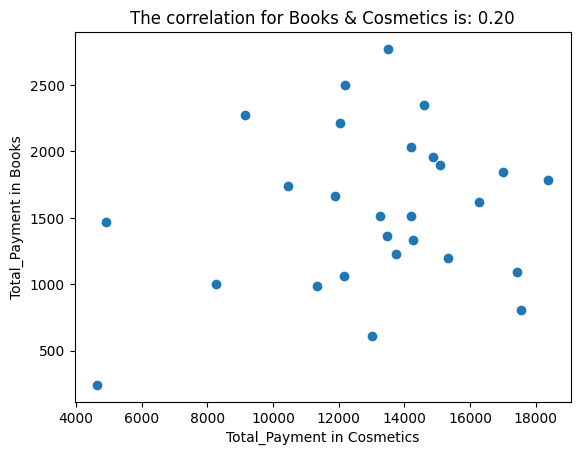

Total Monthly Payment for Food & Beverage in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1715.44
1    2021-02-28        1108.76
2    2021-03-31        1187.21
3    2021-04-30        1385.95
4    2021-05-31        1276.12
5    2021-06-30        1971.71
6    2021-07-31        1553.31
7    2021-08-31        1642.22
8    2021-09-30        1046.00
9    2021-10-31        1312.73
10   2021-11-30        1046.00
11   2021-12-31        1229.05
12   2022-01-31        1636.99
13   2022-02-28        1223.82
14   2022-03-31        1694.52
15   2022-04-30        1694.52
16   2022-05-31        1344.11
17   2022-06-30        1694.52
18   2022-07-31        1788.66
19   2022-08-31        1511.47
20   2022-09-30        1621.30
21   2022-10-31        1657.91
22   2022-11-30        2003.09
23   2022-12-31        1349.34
24   2023-01-31        1255.20
25   2023-02-28        1631.76
26   2023-03-31         580.53


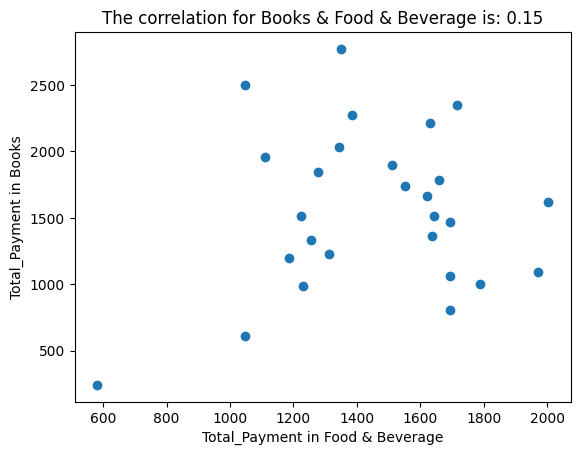

Total Monthly Payment for Toys in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        5555.20
1    2021-02-28        8852.48
2    2021-03-31        6988.80
3    2021-04-30        7562.24
4    2021-05-31        7633.92
5    2021-06-30        9139.20
6    2021-07-31        5053.44
7    2021-08-31        8995.84
8    2021-09-30        6558.72
9    2021-10-31        9533.44
10   2021-11-30        8995.84
11   2021-12-31        5125.12
12   2022-01-31       10393.60
13   2022-02-28        6128.64
14   2022-03-31        6128.64
15   2022-04-30       10967.04
16   2022-05-31        7203.84
17   2022-06-30        5949.44
18   2022-07-31        5483.52
19   2022-08-31        5877.76
20   2022-09-30        6128.64
21   2022-10-31        9891.84
22   2022-11-30       10286.08
23   2022-12-31        8350.72
24   2023-01-31        8780.80
25   2023-02-28        7096.32
26   2023-03-31         752.64


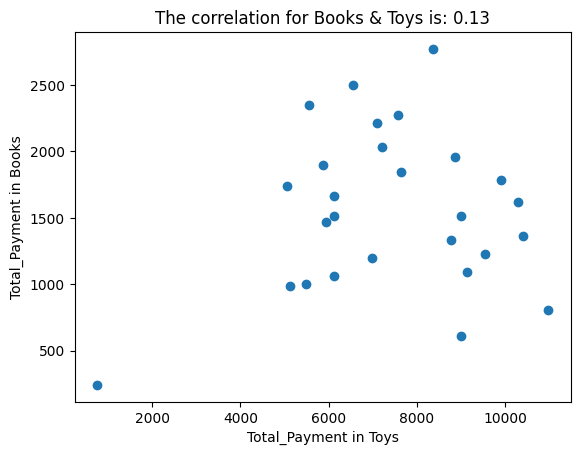

Total Monthly Payment for Technology in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31      65780.925
1    2021-02-28       7597.275
2    2021-03-31      20691.825
3    2021-04-30      68375.475
4    2021-05-31      39036.375
5    2021-06-30      37739.100
6    2021-07-31      59728.200
7    2021-08-31      33044.550
8    2021-09-30      28041.825
9    2021-10-31      52686.375
10   2021-11-30      52130.925
11   2021-12-31      48733.650
12   2022-01-31      42989.100
13   2022-02-28      67325.475
14   2022-03-31      31191.825
15   2022-04-30      57380.925
16   2022-05-31      60530.925
17   2022-06-30      21494.550
18   2022-07-31      38541.825
19   2022-08-31      30944.550
20   2022-09-30      37986.375
21   2022-10-31      89067.300
22   2022-11-30      33291.825
23   2022-12-31      20691.825
24   2023-01-31      30389.100
25   2023-02-28      26189.100
26   2023-03-31      22544.550


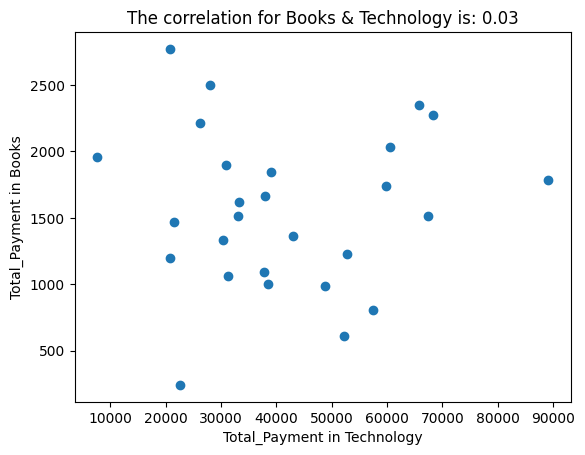

Total Monthly Payment for Souvenir in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1219.92
1    2021-02-28        1489.71
2    2021-03-31         985.32
3    2021-04-30         844.56
4    2021-05-31         750.72
5    2021-06-30        1137.81
6    2021-07-31        1161.27
7    2021-08-31        1231.65
8    2021-09-30        1653.93
9    2021-10-31         387.09
10   2021-11-30         234.60
11   2021-12-31         797.64
12   2022-01-31        3319.59
13   2022-02-28        2310.81
14   2022-03-31        1090.89
15   2022-04-30        1501.44
16   2022-05-31        1290.30
17   2022-06-30        1290.30
18   2022-07-31        1560.09
19   2022-08-31        1137.81
20   2022-09-30        1407.60
21   2022-10-31        2005.83
22   2022-11-30        1395.87
23   2022-12-31         539.58
24   2023-01-31         961.86
25   2023-02-28        1114.35
26   2023-03-31          58.65


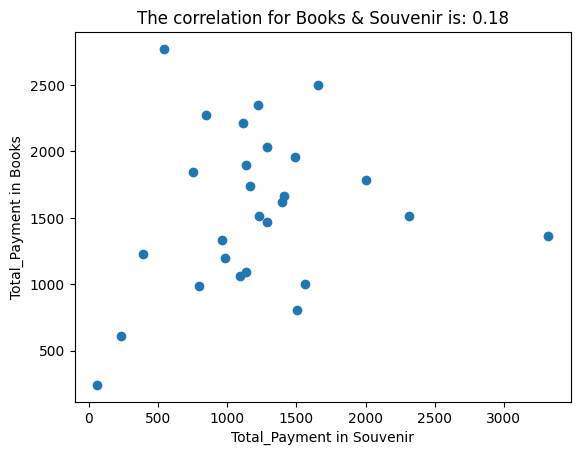

Total Monthly Payment for Cosmetics in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31       14596.94
1    2021-02-28       14881.56
2    2021-03-31       15328.82
3    2021-04-30        9148.50
4    2021-05-31       16995.88
5    2021-06-30       17443.14
6    2021-07-31       10449.62
7    2021-08-31       13255.16
8    2021-09-30       12198.00
9    2021-10-31       13743.08
10   2021-11-30       13011.20
11   2021-12-31       11344.14
12   2022-01-31       13458.46
13   2022-02-28       14190.34
14   2022-03-31       12157.34
15   2022-04-30       17565.12
16   2022-05-31       14190.34
17   2022-06-30        4919.86
18   2022-07-31        8253.98
19   2022-08-31       15084.86
20   2022-09-30       11872.72
21   2022-10-31       18378.32
22   2022-11-30       16264.00
23   2022-12-31       13499.12
24   2023-01-31       14271.66
25   2023-02-28       12035.36
26   2023-03-31        4635.24
Total Monthly Payment for Food & Beverage in Forum Istanbul Mall
   invoi

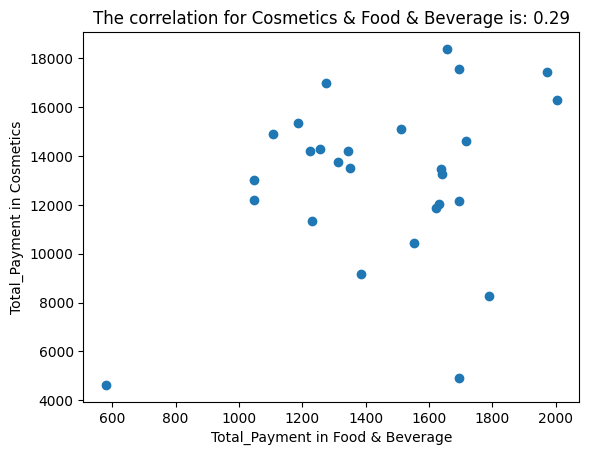

Total Monthly Payment for Toys in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        5555.20
1    2021-02-28        8852.48
2    2021-03-31        6988.80
3    2021-04-30        7562.24
4    2021-05-31        7633.92
5    2021-06-30        9139.20
6    2021-07-31        5053.44
7    2021-08-31        8995.84
8    2021-09-30        6558.72
9    2021-10-31        9533.44
10   2021-11-30        8995.84
11   2021-12-31        5125.12
12   2022-01-31       10393.60
13   2022-02-28        6128.64
14   2022-03-31        6128.64
15   2022-04-30       10967.04
16   2022-05-31        7203.84
17   2022-06-30        5949.44
18   2022-07-31        5483.52
19   2022-08-31        5877.76
20   2022-09-30        6128.64
21   2022-10-31        9891.84
22   2022-11-30       10286.08
23   2022-12-31        8350.72
24   2023-01-31        8780.80
25   2023-02-28        7096.32
26   2023-03-31         752.64


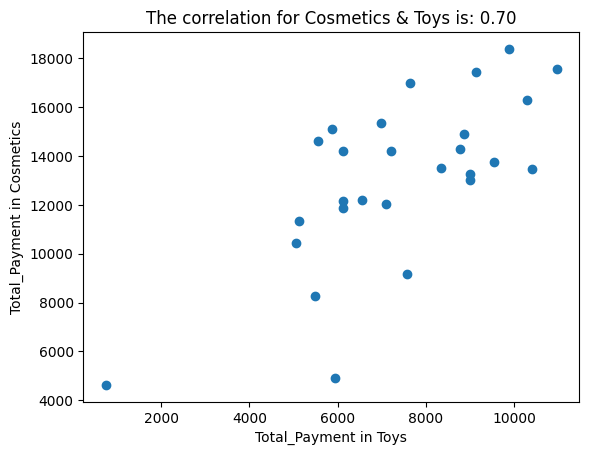

Total Monthly Payment for Technology in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31      65780.925
1    2021-02-28       7597.275
2    2021-03-31      20691.825
3    2021-04-30      68375.475
4    2021-05-31      39036.375
5    2021-06-30      37739.100
6    2021-07-31      59728.200
7    2021-08-31      33044.550
8    2021-09-30      28041.825
9    2021-10-31      52686.375
10   2021-11-30      52130.925
11   2021-12-31      48733.650
12   2022-01-31      42989.100
13   2022-02-28      67325.475
14   2022-03-31      31191.825
15   2022-04-30      57380.925
16   2022-05-31      60530.925
17   2022-06-30      21494.550
18   2022-07-31      38541.825
19   2022-08-31      30944.550
20   2022-09-30      37986.375
21   2022-10-31      89067.300
22   2022-11-30      33291.825
23   2022-12-31      20691.825
24   2023-01-31      30389.100
25   2023-02-28      26189.100
26   2023-03-31      22544.550


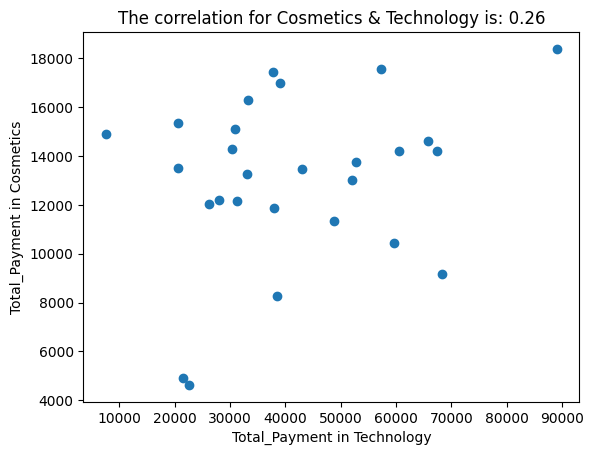

Total Monthly Payment for Souvenir in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1219.92
1    2021-02-28        1489.71
2    2021-03-31         985.32
3    2021-04-30         844.56
4    2021-05-31         750.72
5    2021-06-30        1137.81
6    2021-07-31        1161.27
7    2021-08-31        1231.65
8    2021-09-30        1653.93
9    2021-10-31         387.09
10   2021-11-30         234.60
11   2021-12-31         797.64
12   2022-01-31        3319.59
13   2022-02-28        2310.81
14   2022-03-31        1090.89
15   2022-04-30        1501.44
16   2022-05-31        1290.30
17   2022-06-30        1290.30
18   2022-07-31        1560.09
19   2022-08-31        1137.81
20   2022-09-30        1407.60
21   2022-10-31        2005.83
22   2022-11-30        1395.87
23   2022-12-31         539.58
24   2023-01-31         961.86
25   2023-02-28        1114.35
26   2023-03-31          58.65


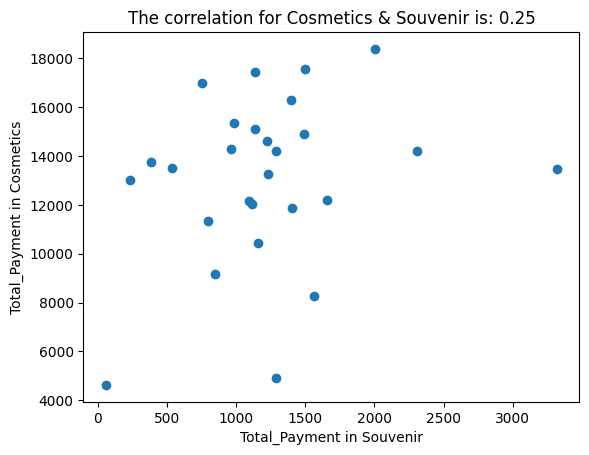

Total Monthly Payment for Food & Beverage in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1715.44
1    2021-02-28        1108.76
2    2021-03-31        1187.21
3    2021-04-30        1385.95
4    2021-05-31        1276.12
5    2021-06-30        1971.71
6    2021-07-31        1553.31
7    2021-08-31        1642.22
8    2021-09-30        1046.00
9    2021-10-31        1312.73
10   2021-11-30        1046.00
11   2021-12-31        1229.05
12   2022-01-31        1636.99
13   2022-02-28        1223.82
14   2022-03-31        1694.52
15   2022-04-30        1694.52
16   2022-05-31        1344.11
17   2022-06-30        1694.52
18   2022-07-31        1788.66
19   2022-08-31        1511.47
20   2022-09-30        1621.30
21   2022-10-31        1657.91
22   2022-11-30        2003.09
23   2022-12-31        1349.34
24   2023-01-31        1255.20
25   2023-02-28        1631.76
26   2023-03-31         580.53
Total Monthly Payment for Toys in Forum Istanbul Mall
   invoice_da

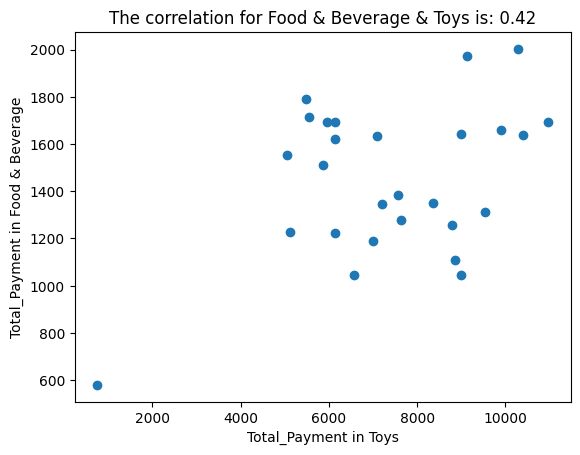

Total Monthly Payment for Technology in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31      65780.925
1    2021-02-28       7597.275
2    2021-03-31      20691.825
3    2021-04-30      68375.475
4    2021-05-31      39036.375
5    2021-06-30      37739.100
6    2021-07-31      59728.200
7    2021-08-31      33044.550
8    2021-09-30      28041.825
9    2021-10-31      52686.375
10   2021-11-30      52130.925
11   2021-12-31      48733.650
12   2022-01-31      42989.100
13   2022-02-28      67325.475
14   2022-03-31      31191.825
15   2022-04-30      57380.925
16   2022-05-31      60530.925
17   2022-06-30      21494.550
18   2022-07-31      38541.825
19   2022-08-31      30944.550
20   2022-09-30      37986.375
21   2022-10-31      89067.300
22   2022-11-30      33291.825
23   2022-12-31      20691.825
24   2023-01-31      30389.100
25   2023-02-28      26189.100
26   2023-03-31      22544.550


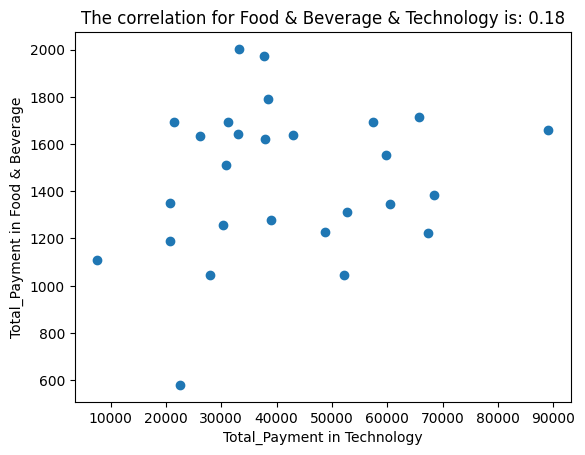

Total Monthly Payment for Souvenir in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1219.92
1    2021-02-28        1489.71
2    2021-03-31         985.32
3    2021-04-30         844.56
4    2021-05-31         750.72
5    2021-06-30        1137.81
6    2021-07-31        1161.27
7    2021-08-31        1231.65
8    2021-09-30        1653.93
9    2021-10-31         387.09
10   2021-11-30         234.60
11   2021-12-31         797.64
12   2022-01-31        3319.59
13   2022-02-28        2310.81
14   2022-03-31        1090.89
15   2022-04-30        1501.44
16   2022-05-31        1290.30
17   2022-06-30        1290.30
18   2022-07-31        1560.09
19   2022-08-31        1137.81
20   2022-09-30        1407.60
21   2022-10-31        2005.83
22   2022-11-30        1395.87
23   2022-12-31         539.58
24   2023-01-31         961.86
25   2023-02-28        1114.35
26   2023-03-31          58.65


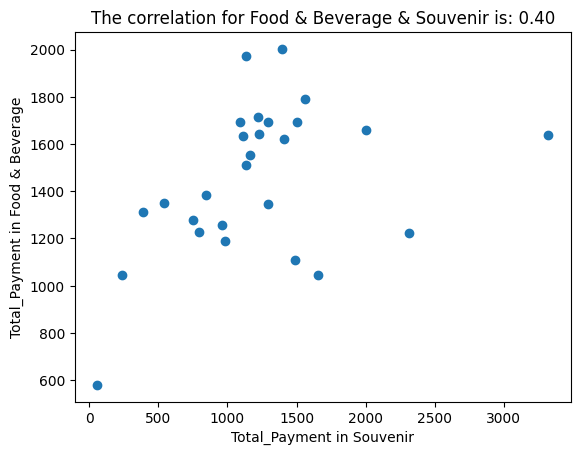

Total Monthly Payment for Toys in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        5555.20
1    2021-02-28        8852.48
2    2021-03-31        6988.80
3    2021-04-30        7562.24
4    2021-05-31        7633.92
5    2021-06-30        9139.20
6    2021-07-31        5053.44
7    2021-08-31        8995.84
8    2021-09-30        6558.72
9    2021-10-31        9533.44
10   2021-11-30        8995.84
11   2021-12-31        5125.12
12   2022-01-31       10393.60
13   2022-02-28        6128.64
14   2022-03-31        6128.64
15   2022-04-30       10967.04
16   2022-05-31        7203.84
17   2022-06-30        5949.44
18   2022-07-31        5483.52
19   2022-08-31        5877.76
20   2022-09-30        6128.64
21   2022-10-31        9891.84
22   2022-11-30       10286.08
23   2022-12-31        8350.72
24   2023-01-31        8780.80
25   2023-02-28        7096.32
26   2023-03-31         752.64
Total Monthly Payment for Technology in Forum Istanbul Mall
   invoice_date  T

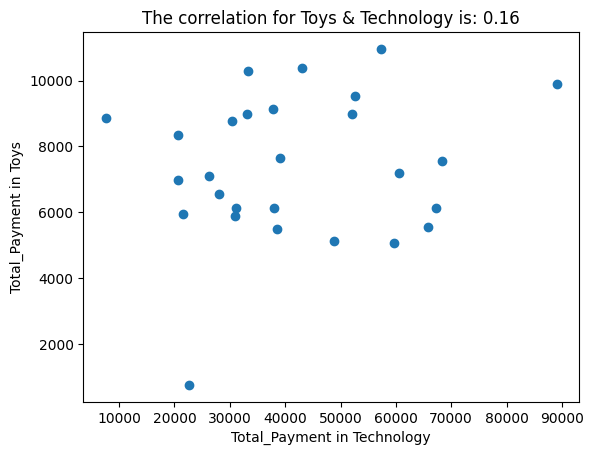

Total Monthly Payment for Souvenir in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1219.92
1    2021-02-28        1489.71
2    2021-03-31         985.32
3    2021-04-30         844.56
4    2021-05-31         750.72
5    2021-06-30        1137.81
6    2021-07-31        1161.27
7    2021-08-31        1231.65
8    2021-09-30        1653.93
9    2021-10-31         387.09
10   2021-11-30         234.60
11   2021-12-31         797.64
12   2022-01-31        3319.59
13   2022-02-28        2310.81
14   2022-03-31        1090.89
15   2022-04-30        1501.44
16   2022-05-31        1290.30
17   2022-06-30        1290.30
18   2022-07-31        1560.09
19   2022-08-31        1137.81
20   2022-09-30        1407.60
21   2022-10-31        2005.83
22   2022-11-30        1395.87
23   2022-12-31         539.58
24   2023-01-31         961.86
25   2023-02-28        1114.35
26   2023-03-31          58.65


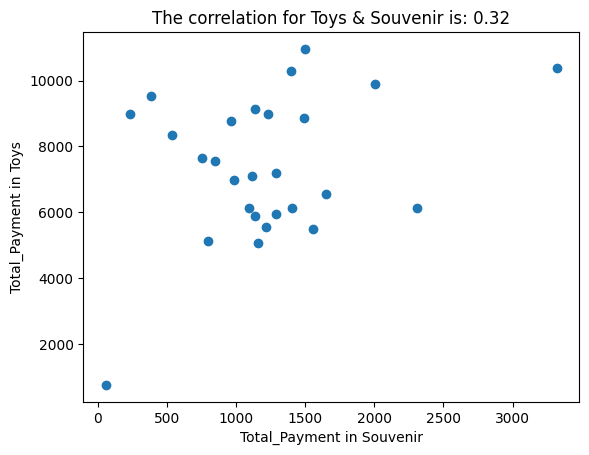

Total Monthly Payment for Technology in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31      65780.925
1    2021-02-28       7597.275
2    2021-03-31      20691.825
3    2021-04-30      68375.475
4    2021-05-31      39036.375
5    2021-06-30      37739.100
6    2021-07-31      59728.200
7    2021-08-31      33044.550
8    2021-09-30      28041.825
9    2021-10-31      52686.375
10   2021-11-30      52130.925
11   2021-12-31      48733.650
12   2022-01-31      42989.100
13   2022-02-28      67325.475
14   2022-03-31      31191.825
15   2022-04-30      57380.925
16   2022-05-31      60530.925
17   2022-06-30      21494.550
18   2022-07-31      38541.825
19   2022-08-31      30944.550
20   2022-09-30      37986.375
21   2022-10-31      89067.300
22   2022-11-30      33291.825
23   2022-12-31      20691.825
24   2023-01-31      30389.100
25   2023-02-28      26189.100
26   2023-03-31      22544.550
Total Monthly Payment for Souvenir in Forum Istanbul Mall
   invoice_dat

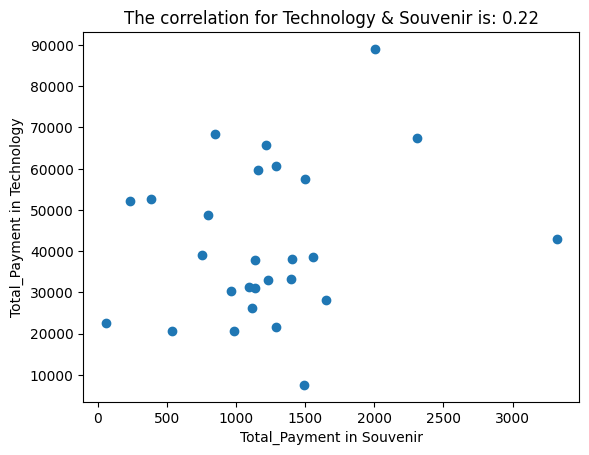

Total Monthly Payment for Souvenir in Forum Istanbul Mall
   invoice_date  Total_Payment
0    2021-01-31        1219.92
1    2021-02-28        1489.71
2    2021-03-31         985.32
3    2021-04-30         844.56
4    2021-05-31         750.72
5    2021-06-30        1137.81
6    2021-07-31        1161.27
7    2021-08-31        1231.65
8    2021-09-30        1653.93
9    2021-10-31         387.09
10   2021-11-30         234.60
11   2021-12-31         797.64
12   2022-01-31        3319.59
13   2022-02-28        2310.81
14   2022-03-31        1090.89
15   2022-04-30        1501.44
16   2022-05-31        1290.30
17   2022-06-30        1290.30
18   2022-07-31        1560.09
19   2022-08-31        1137.81
20   2022-09-30        1407.60
21   2022-10-31        2005.83
22   2022-11-30        1395.87
23   2022-12-31         539.58
24   2023-01-31         961.86
25   2023-02-28        1114.35
26   2023-03-31          58.65


In [47]:
# creating an empty dictionary to store the correlation values
correlation_dict_Forum_istanbul_Mall = {}
categories = df['category'].unique()
for i, category_i in enumerate(categories):

    filtered_df_i = df[(df['category'] == category_i) & (df['shopping_mall'] == 'Forum Istanbul')]


    result_df_i = filtered_df_i.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})


    result_df_i = result_df_i.reset_index()


    result_df_i = result_df_i.rename(columns={'Total_Payment': 'Total_Payment'})

    print('Total Monthly Payment for', category_i, 'in Forum Istanbul Mall')

    print(result_df_i)

    for j in range(i + 1, len(categories)):
        category_j = categories[j]

        filtered_df_j = df[(df['category'] == category_j) & (df['shopping_mall'] == 'Forum Istanbul')]


        result_df_j = filtered_df_j.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})


        result_df_j = result_df_j.reset_index()


        result_df_j = result_df_j.rename(columns={'Total_Payment': 'Total_Payment'})

        print('Total Monthly Payment for', category_j, 'in Forum Istanbul Mall')

        print(result_df_j)


        correlation_key = f'The correlation for {category_i} & {category_j} is'
        correlation_value = result_df_i['Total_Payment'].corr(result_df_j['Total_Payment'])
        correlation_dict_Forum_istanbul_Mall[correlation_key] = correlation_value


        plt.scatter(result_df_j['Total_Payment'], result_df_i['Total_Payment'])
        plt.xlabel(f'Total_Payment in {category_j}')
        plt.ylabel(f'Total_Payment in {category_i}')
        plt.title(f'{correlation_key}: {correlation_value:.2f}')
        plt.show()



In [48]:
# Display all correlation values stored in the dictionary
correlation_dict_Forum_istanbul_Mall

{'The correlation for Clothing & Shoes is': 0.3074573873915598,
 'The correlation for Clothing & Books is': 0.5549155759757178,
 'The correlation for Clothing & Cosmetics is': 0.5509662503846081,
 'The correlation for Clothing & Food & Beverage is': 0.4141645589369376,
 'The correlation for Clothing & Toys is': 0.5728478228813645,
 'The correlation for Clothing & Technology is': 0.3764138897866189,
 'The correlation for Clothing & Souvenir is': 0.27791530624343413,
 'The correlation for Shoes & Books is': -0.014252223684123353,
 'The correlation for Shoes & Cosmetics is': -0.07639124524638165,
 'The correlation for Shoes & Food & Beverage is': 0.48680907536870405,
 'The correlation for Shoes & Toys is': 0.13191983351127032,
 'The correlation for Shoes & Technology is': -0.14511456782568313,
 'The correlation for Shoes & Souvenir is': 0.1720938673951914,
 'The correlation for Books & Cosmetics is': 0.19695701372235533,
 'The correlation for Books & Food & Beverage is': 0.148175308750488

In [49]:
# Create a new dictionary with correlations >= 0.65
filtered_correlation_dict_Forum_istanbul_Mall = {key: value for key, value in correlation_dict_Forum_istanbul_Mall.items() if value >= 0.65}

# Print the filtered dictionary
print(filtered_correlation_dict_Forum_istanbul_Mall)

{'The correlation for Cosmetics & Toys is': 0.6977429478693891}


In [50]:
table = {
    'city': ['Istanbull'],
    'mall': ['Forum istanbul Mall'],
    'correlation': [0.6977429478693891],
    'item1': ['Cosmetics'],
    'item2': ['Toys']
}
# Creating a DataFrame from the data
correlation_table = pd.DataFrame(table)
correlation_table

,city,mall,correlation,item1,item2
0,Istanbull,Forum istanbul Mall,0.697743,Cosmetics,Toys


## Correlation between Different Categories for Kanyon Mall

Total Monthly Payment for Clothing in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31     875883.160
1    2021-02-28     813711.290
2    2021-03-31     923786.990
3    2021-04-30     858315.065
4    2021-05-31     758005.380
5    2021-06-30     726333.525
6    2021-07-31     939336.665
7    2021-08-31     771099.930
8    2021-09-30     753695.290
9    2021-10-31     805337.530
10   2021-11-30     761579.510
11   2021-12-31     919095.505
12   2022-01-31     791696.480
13   2022-02-28     756887.200
14   2022-03-31     790169.250
15   2022-04-30     840528.205
16   2022-05-31     811174.850
17   2022-06-30     828579.490
18   2022-07-31     899370.715
19   2022-08-31     778193.705
20   2022-09-30     673464.135
21   2022-10-31     922805.435
22   2022-11-30     758442.085
23   2022-12-31     731025.835
24   2023-01-31     774946.485
25   2023-02-28     809456.510
26   2023-03-31     219086.880
Total Monthly Payment for Shoes in Kanyon Mall
   invoice_date  Total_Payment
0   

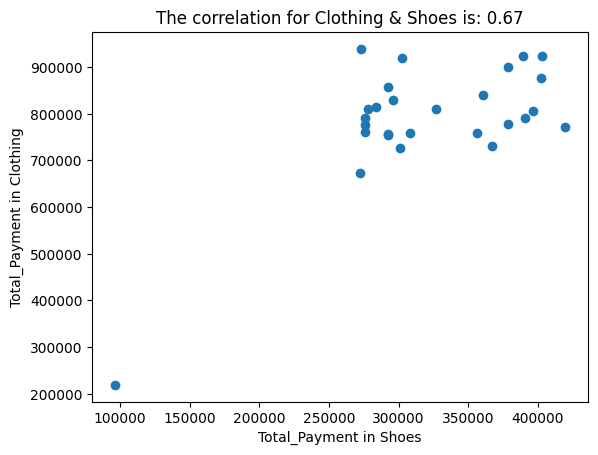

Total Monthly Payment for Books in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        8287.05
1    2021-02-28        5832.75
2    2021-03-31        6181.20
3    2021-04-30        5681.25
4    2021-05-31        4999.50
5    2021-06-30        4423.80
6    2021-07-31        5090.40
7    2021-08-31        6090.30
8    2021-09-30        4848.00
9    2021-10-31        6514.50
10   2021-11-30        4423.80
11   2021-12-31        6650.85
12   2022-01-31        6135.75
13   2022-02-28        4908.60
14   2022-03-31        5863.05
15   2022-04-30        4060.20
16   2022-05-31        7014.45
17   2022-06-30        6408.45
18   2022-07-31        8423.40
19   2022-08-31        6272.10
20   2022-09-30        5347.95
21   2022-10-31        9544.50
22   2022-11-30        5696.40
23   2022-12-31        8559.75
24   2023-01-31        8287.05
25   2023-02-28        6211.50
26   2023-03-31        1272.60


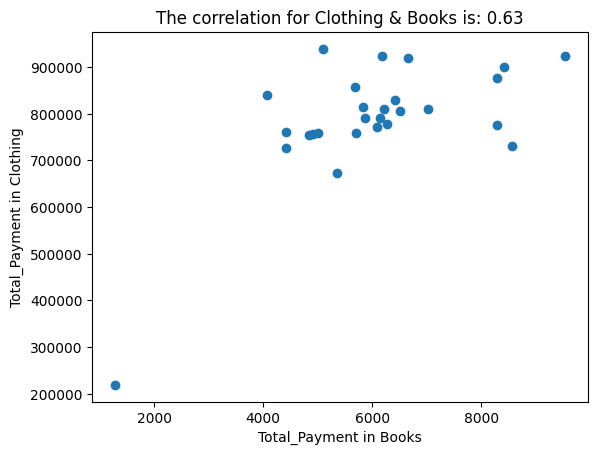

Total Monthly Payment for Cosmetics in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31       49239.26
1    2021-02-28       50946.98
2    2021-03-31       44034.78
3    2021-04-30       46352.40
4    2021-05-31       44604.02
5    2021-06-30       55826.18
6    2021-07-31       50337.08
7    2021-08-31       52329.42
8    2021-09-30       53915.16
9    2021-10-31       48466.72
10   2021-11-30       45173.26
11   2021-12-31       53264.60
12   2022-01-31       56151.46
13   2022-02-28       40009.44
14   2022-03-31       62128.48
15   2022-04-30       49605.20
16   2022-05-31       56476.74
17   2022-06-30       59038.32
18   2022-07-31       49808.50
19   2022-08-31       50052.46
20   2022-09-30       54037.14
21   2022-10-31       55256.94
22   2022-11-30       54565.72
23   2022-12-31       57818.52
24   2023-01-31       55988.82
25   2023-02-28       57411.92
26   2023-03-31       16711.26


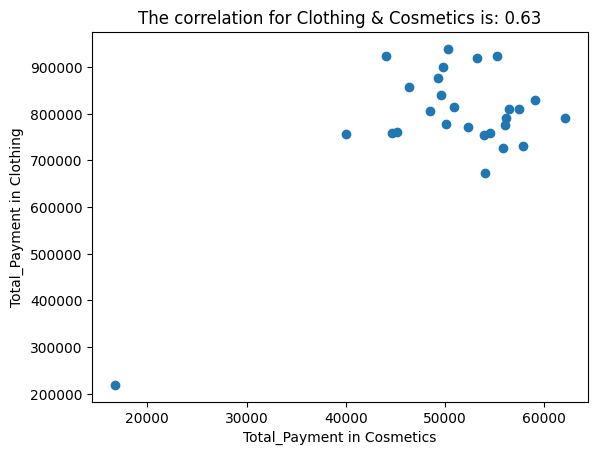

Total Monthly Payment for Food & Beverage in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5705.93
1    2021-02-28        5193.39
2    2021-03-31        5580.41
3    2021-04-30        5695.47
4    2021-05-31        6950.67
5    2021-06-30        6417.21
6    2021-07-31        6694.40
7    2021-08-31        7243.55
8    2021-09-30        4654.70
9    2021-10-31        8127.42
10   2021-11-30        7416.14
11   2021-12-31        5711.16
12   2022-01-31        6589.80
13   2022-02-28        6035.42
14   2022-03-31        6751.93
15   2022-04-30        5810.53
16   2022-05-31        5862.83
17   2022-06-30        6364.91
18   2022-07-31        6579.34
19   2022-08-31        5852.37
20   2022-09-30        6558.42
21   2022-10-31        6260.31
22   2022-11-30        6192.32
23   2022-12-31        7970.52
24   2023-01-31        6741.47
25   2023-02-28        5653.63
26   2023-03-31        1882.80


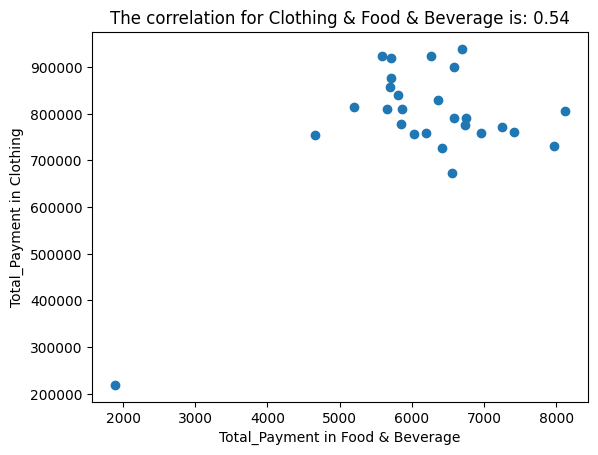

Total Monthly Payment for Toys in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31       30177.28
1    2021-02-28       33510.40
2    2021-03-31       31933.44
3    2021-04-30       25303.04
4    2021-05-31       31037.44
5    2021-06-30       25088.00
6    2021-07-31       28349.44
7    2021-08-31       23439.36
8    2021-09-30       34012.16
9    2021-10-31       34263.04
10   2021-11-30       30428.16
11   2021-12-31       29747.20
12   2022-01-31       36879.36
13   2022-02-28       22292.48
14   2022-03-31       29030.40
15   2022-04-30       26414.08
16   2022-05-31       31109.12
17   2022-06-30       31790.08
18   2022-07-31       27238.40
19   2022-08-31       30213.12
20   2022-09-30       29675.52
21   2022-10-31       39746.56
22   2022-11-30       43438.08
23   2022-12-31       25088.00
24   2023-01-31       34944.00
25   2023-02-28       20106.24
26   2023-03-31        4981.76


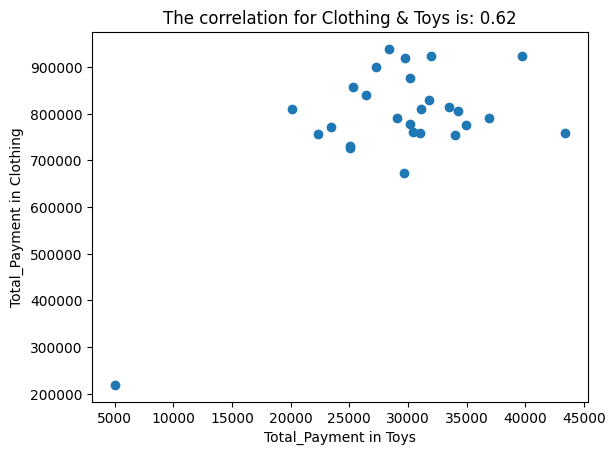

Total Monthly Payment for Technology in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31     200184.600
1    2021-02-28     165100.950
2    2021-03-31     155898.225
3    2021-04-30     179740.050
4    2021-05-31     187831.875
5    2021-06-30     209387.325
6    2021-07-31     188634.600
7    2021-08-31     200987.325
8    2021-09-30     241568.250
9    2021-10-31     166150.950
10   2021-11-30     136503.675
11   2021-12-31     197776.425
12   2022-01-31     200740.050
13   2022-02-28     160098.225
14   2022-03-31     168250.950
15   2022-04-30     178503.675
16   2022-05-31     179184.600
17   2022-06-30     213031.875
18   2022-07-31     173995.500
19   2022-08-31     191537.325
20   2022-09-30     204631.875
21   2022-10-31     211734.600
22   2022-11-30     123409.125
23   2022-12-31     227918.250
24   2023-01-31     254601.900
25   2023-02-28     238665.525
26   2023-03-31      52130.925


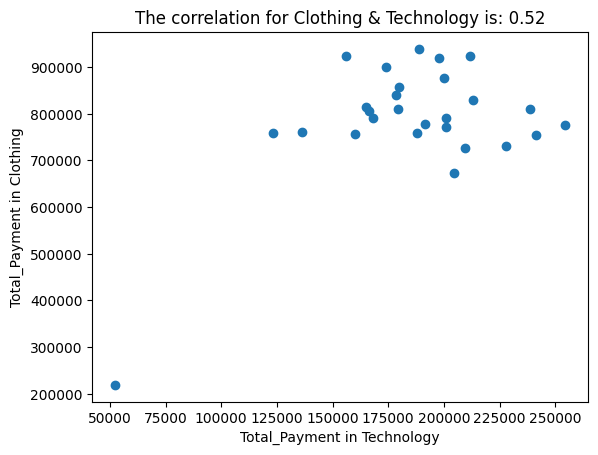

Total Monthly Payment for Souvenir in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5935.38
1    2021-02-28        5442.72
2    2021-03-31        4832.76
3    2021-04-30        5560.02
4    2021-05-31        6768.21
5    2021-06-30        3636.30
6    2021-07-31        3507.27
7    2021-08-31        3331.32
8    2021-09-30        4562.97
9    2021-10-31        4938.33
10   2021-11-30        4363.56
11   2021-12-31        7026.27
12   2022-01-31        6404.58
13   2022-02-28        4738.92
14   2022-03-31        5384.07
15   2022-04-30        4762.38
16   2022-05-31        4821.03
17   2022-06-30        4504.32
18   2022-07-31        2955.96
19   2022-08-31        6791.67
20   2022-09-30        4328.37
21   2022-10-31        4363.56
22   2022-11-30        4715.46
23   2022-12-31        3894.36
24   2023-01-31        4797.57
25   2023-02-28        4363.56
26   2023-03-31         668.61


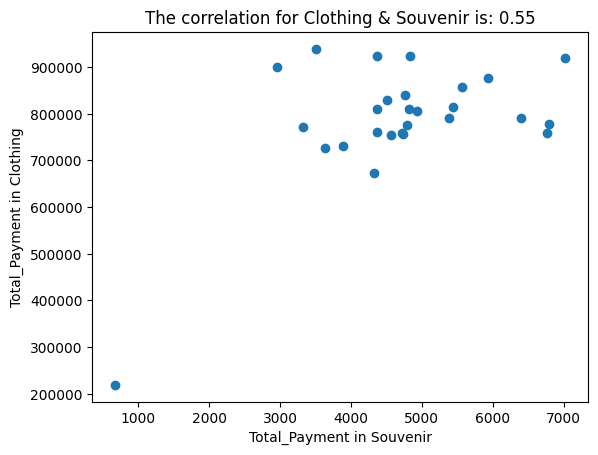

Total Monthly Payment for Shoes in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31     402494.565
1    2021-02-28     283606.685
2    2021-03-31     402603.755
3    2021-04-30     292445.450
4    2021-05-31     356554.450
5    2021-06-30     300684.045
6    2021-07-31     272694.435
7    2021-08-31     419735.710
8    2021-09-30     292172.850
9    2021-10-31     396492.865
10   2021-11-30     275586.095
11   2021-12-31     302102.765
12   2022-01-31     276186.640
13   2022-02-28     292663.830
14   2022-03-31     390327.380
15   2022-04-30     360264.660
16   2022-05-31     326982.335
17   2022-06-30     295664.680
18   2022-07-31     378433.170
19   2022-08-31     378542.360
20   2022-09-30     271985.075
21   2022-10-31     388909.035
22   2022-11-30     308104.465
23   2022-12-31     366702.745
24   2023-01-31     275968.260
25   2023-02-28     278314.345
26   2023-03-31      96136.015
Total Monthly Payment for Books in Kanyon Mall
   invoice_date  Total_Payment
0    20

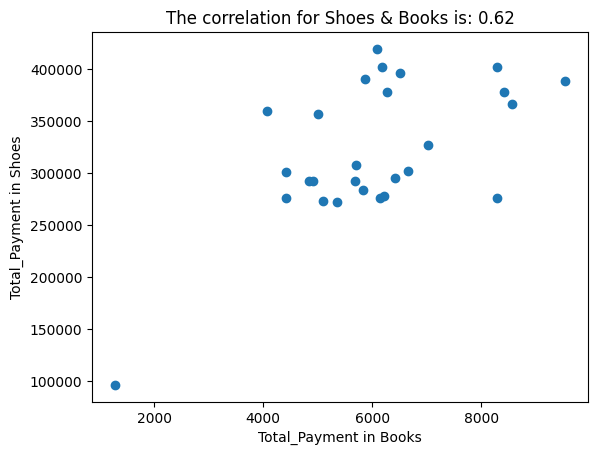

Total Monthly Payment for Cosmetics in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31       49239.26
1    2021-02-28       50946.98
2    2021-03-31       44034.78
3    2021-04-30       46352.40
4    2021-05-31       44604.02
5    2021-06-30       55826.18
6    2021-07-31       50337.08
7    2021-08-31       52329.42
8    2021-09-30       53915.16
9    2021-10-31       48466.72
10   2021-11-30       45173.26
11   2021-12-31       53264.60
12   2022-01-31       56151.46
13   2022-02-28       40009.44
14   2022-03-31       62128.48
15   2022-04-30       49605.20
16   2022-05-31       56476.74
17   2022-06-30       59038.32
18   2022-07-31       49808.50
19   2022-08-31       50052.46
20   2022-09-30       54037.14
21   2022-10-31       55256.94
22   2022-11-30       54565.72
23   2022-12-31       57818.52
24   2023-01-31       55988.82
25   2023-02-28       57411.92
26   2023-03-31       16711.26


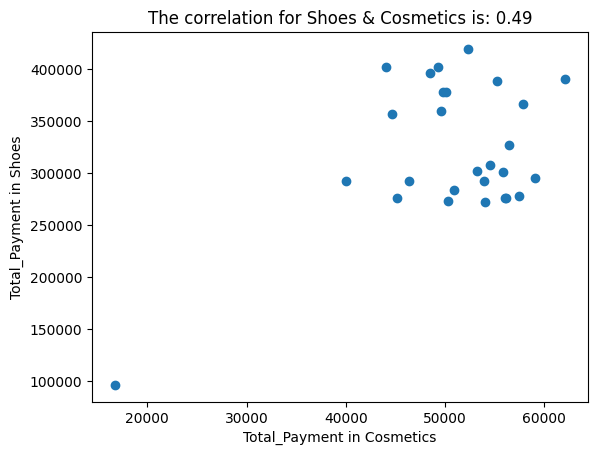

Total Monthly Payment for Food & Beverage in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5705.93
1    2021-02-28        5193.39
2    2021-03-31        5580.41
3    2021-04-30        5695.47
4    2021-05-31        6950.67
5    2021-06-30        6417.21
6    2021-07-31        6694.40
7    2021-08-31        7243.55
8    2021-09-30        4654.70
9    2021-10-31        8127.42
10   2021-11-30        7416.14
11   2021-12-31        5711.16
12   2022-01-31        6589.80
13   2022-02-28        6035.42
14   2022-03-31        6751.93
15   2022-04-30        5810.53
16   2022-05-31        5862.83
17   2022-06-30        6364.91
18   2022-07-31        6579.34
19   2022-08-31        5852.37
20   2022-09-30        6558.42
21   2022-10-31        6260.31
22   2022-11-30        6192.32
23   2022-12-31        7970.52
24   2023-01-31        6741.47
25   2023-02-28        5653.63
26   2023-03-31        1882.80


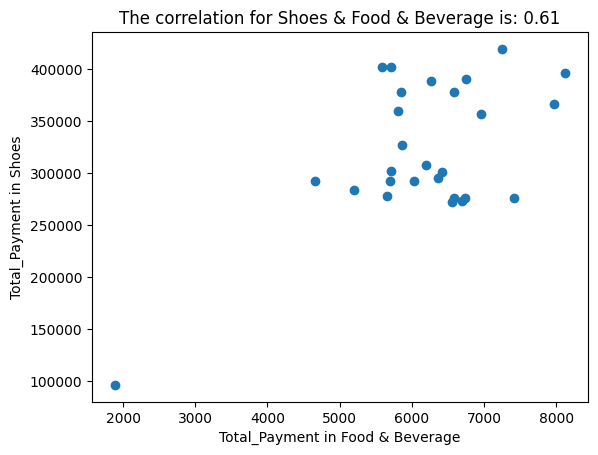

Total Monthly Payment for Toys in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31       30177.28
1    2021-02-28       33510.40
2    2021-03-31       31933.44
3    2021-04-30       25303.04
4    2021-05-31       31037.44
5    2021-06-30       25088.00
6    2021-07-31       28349.44
7    2021-08-31       23439.36
8    2021-09-30       34012.16
9    2021-10-31       34263.04
10   2021-11-30       30428.16
11   2021-12-31       29747.20
12   2022-01-31       36879.36
13   2022-02-28       22292.48
14   2022-03-31       29030.40
15   2022-04-30       26414.08
16   2022-05-31       31109.12
17   2022-06-30       31790.08
18   2022-07-31       27238.40
19   2022-08-31       30213.12
20   2022-09-30       29675.52
21   2022-10-31       39746.56
22   2022-11-30       43438.08
23   2022-12-31       25088.00
24   2023-01-31       34944.00
25   2023-02-28       20106.24
26   2023-03-31        4981.76


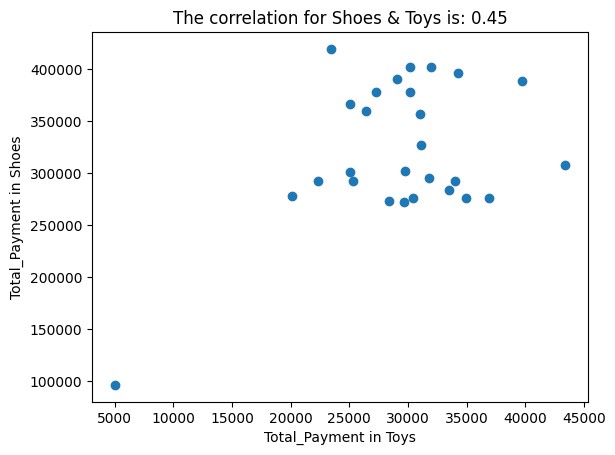

Total Monthly Payment for Technology in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31     200184.600
1    2021-02-28     165100.950
2    2021-03-31     155898.225
3    2021-04-30     179740.050
4    2021-05-31     187831.875
5    2021-06-30     209387.325
6    2021-07-31     188634.600
7    2021-08-31     200987.325
8    2021-09-30     241568.250
9    2021-10-31     166150.950
10   2021-11-30     136503.675
11   2021-12-31     197776.425
12   2022-01-31     200740.050
13   2022-02-28     160098.225
14   2022-03-31     168250.950
15   2022-04-30     178503.675
16   2022-05-31     179184.600
17   2022-06-30     213031.875
18   2022-07-31     173995.500
19   2022-08-31     191537.325
20   2022-09-30     204631.875
21   2022-10-31     211734.600
22   2022-11-30     123409.125
23   2022-12-31     227918.250
24   2023-01-31     254601.900
25   2023-02-28     238665.525
26   2023-03-31      52130.925


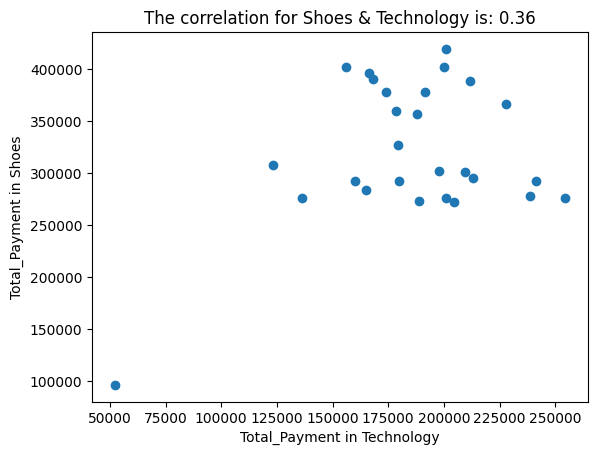

Total Monthly Payment for Souvenir in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5935.38
1    2021-02-28        5442.72
2    2021-03-31        4832.76
3    2021-04-30        5560.02
4    2021-05-31        6768.21
5    2021-06-30        3636.30
6    2021-07-31        3507.27
7    2021-08-31        3331.32
8    2021-09-30        4562.97
9    2021-10-31        4938.33
10   2021-11-30        4363.56
11   2021-12-31        7026.27
12   2022-01-31        6404.58
13   2022-02-28        4738.92
14   2022-03-31        5384.07
15   2022-04-30        4762.38
16   2022-05-31        4821.03
17   2022-06-30        4504.32
18   2022-07-31        2955.96
19   2022-08-31        6791.67
20   2022-09-30        4328.37
21   2022-10-31        4363.56
22   2022-11-30        4715.46
23   2022-12-31        3894.36
24   2023-01-31        4797.57
25   2023-02-28        4363.56
26   2023-03-31         668.61


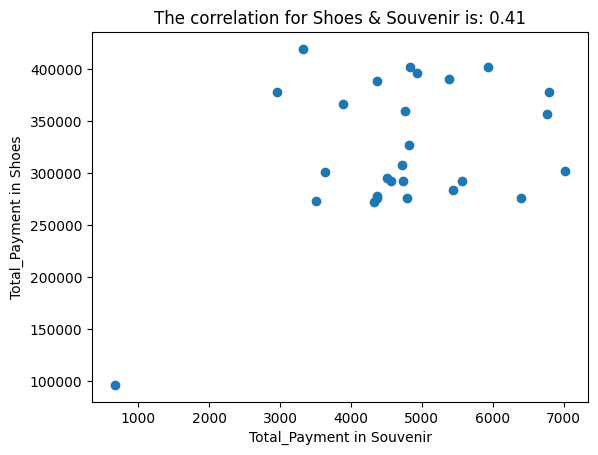

Total Monthly Payment for Books in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        8287.05
1    2021-02-28        5832.75
2    2021-03-31        6181.20
3    2021-04-30        5681.25
4    2021-05-31        4999.50
5    2021-06-30        4423.80
6    2021-07-31        5090.40
7    2021-08-31        6090.30
8    2021-09-30        4848.00
9    2021-10-31        6514.50
10   2021-11-30        4423.80
11   2021-12-31        6650.85
12   2022-01-31        6135.75
13   2022-02-28        4908.60
14   2022-03-31        5863.05
15   2022-04-30        4060.20
16   2022-05-31        7014.45
17   2022-06-30        6408.45
18   2022-07-31        8423.40
19   2022-08-31        6272.10
20   2022-09-30        5347.95
21   2022-10-31        9544.50
22   2022-11-30        5696.40
23   2022-12-31        8559.75
24   2023-01-31        8287.05
25   2023-02-28        6211.50
26   2023-03-31        1272.60
Total Monthly Payment for Cosmetics in Kanyon Mall
   invoice_date  Total_Payment
0  

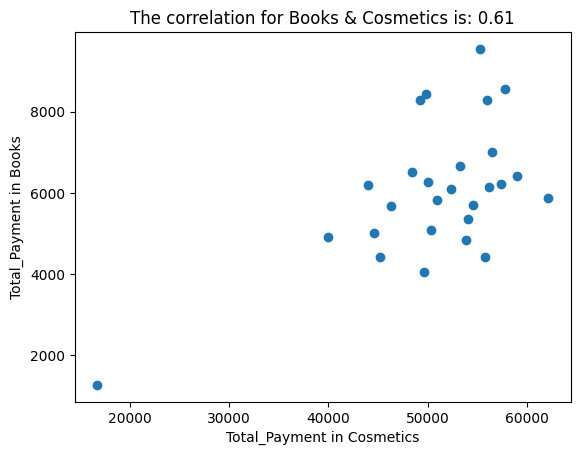

Total Monthly Payment for Food & Beverage in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5705.93
1    2021-02-28        5193.39
2    2021-03-31        5580.41
3    2021-04-30        5695.47
4    2021-05-31        6950.67
5    2021-06-30        6417.21
6    2021-07-31        6694.40
7    2021-08-31        7243.55
8    2021-09-30        4654.70
9    2021-10-31        8127.42
10   2021-11-30        7416.14
11   2021-12-31        5711.16
12   2022-01-31        6589.80
13   2022-02-28        6035.42
14   2022-03-31        6751.93
15   2022-04-30        5810.53
16   2022-05-31        5862.83
17   2022-06-30        6364.91
18   2022-07-31        6579.34
19   2022-08-31        5852.37
20   2022-09-30        6558.42
21   2022-10-31        6260.31
22   2022-11-30        6192.32
23   2022-12-31        7970.52
24   2023-01-31        6741.47
25   2023-02-28        5653.63
26   2023-03-31        1882.80


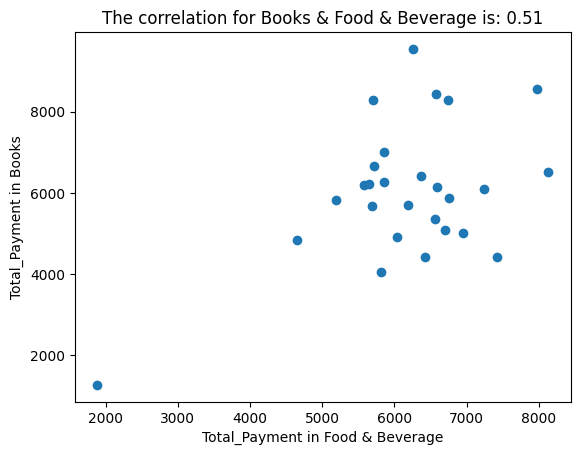

Total Monthly Payment for Toys in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31       30177.28
1    2021-02-28       33510.40
2    2021-03-31       31933.44
3    2021-04-30       25303.04
4    2021-05-31       31037.44
5    2021-06-30       25088.00
6    2021-07-31       28349.44
7    2021-08-31       23439.36
8    2021-09-30       34012.16
9    2021-10-31       34263.04
10   2021-11-30       30428.16
11   2021-12-31       29747.20
12   2022-01-31       36879.36
13   2022-02-28       22292.48
14   2022-03-31       29030.40
15   2022-04-30       26414.08
16   2022-05-31       31109.12
17   2022-06-30       31790.08
18   2022-07-31       27238.40
19   2022-08-31       30213.12
20   2022-09-30       29675.52
21   2022-10-31       39746.56
22   2022-11-30       43438.08
23   2022-12-31       25088.00
24   2023-01-31       34944.00
25   2023-02-28       20106.24
26   2023-03-31        4981.76


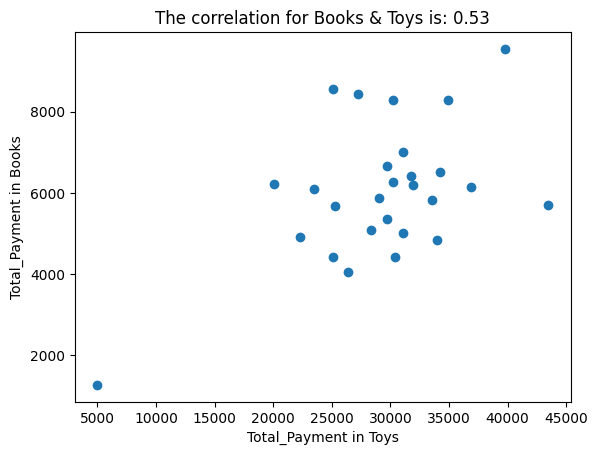

Total Monthly Payment for Technology in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31     200184.600
1    2021-02-28     165100.950
2    2021-03-31     155898.225
3    2021-04-30     179740.050
4    2021-05-31     187831.875
5    2021-06-30     209387.325
6    2021-07-31     188634.600
7    2021-08-31     200987.325
8    2021-09-30     241568.250
9    2021-10-31     166150.950
10   2021-11-30     136503.675
11   2021-12-31     197776.425
12   2022-01-31     200740.050
13   2022-02-28     160098.225
14   2022-03-31     168250.950
15   2022-04-30     178503.675
16   2022-05-31     179184.600
17   2022-06-30     213031.875
18   2022-07-31     173995.500
19   2022-08-31     191537.325
20   2022-09-30     204631.875
21   2022-10-31     211734.600
22   2022-11-30     123409.125
23   2022-12-31     227918.250
24   2023-01-31     254601.900
25   2023-02-28     238665.525
26   2023-03-31      52130.925


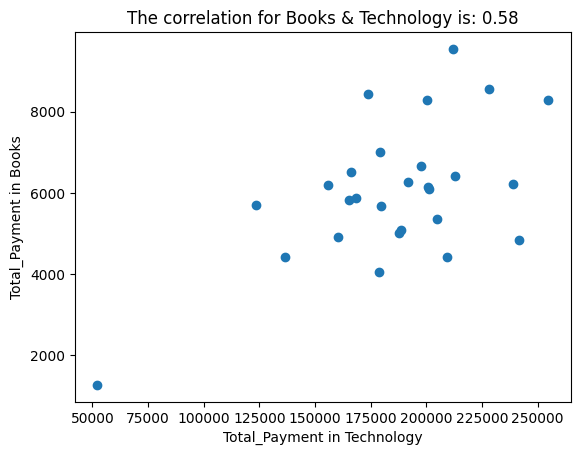

Total Monthly Payment for Souvenir in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5935.38
1    2021-02-28        5442.72
2    2021-03-31        4832.76
3    2021-04-30        5560.02
4    2021-05-31        6768.21
5    2021-06-30        3636.30
6    2021-07-31        3507.27
7    2021-08-31        3331.32
8    2021-09-30        4562.97
9    2021-10-31        4938.33
10   2021-11-30        4363.56
11   2021-12-31        7026.27
12   2022-01-31        6404.58
13   2022-02-28        4738.92
14   2022-03-31        5384.07
15   2022-04-30        4762.38
16   2022-05-31        4821.03
17   2022-06-30        4504.32
18   2022-07-31        2955.96
19   2022-08-31        6791.67
20   2022-09-30        4328.37
21   2022-10-31        4363.56
22   2022-11-30        4715.46
23   2022-12-31        3894.36
24   2023-01-31        4797.57
25   2023-02-28        4363.56
26   2023-03-31         668.61


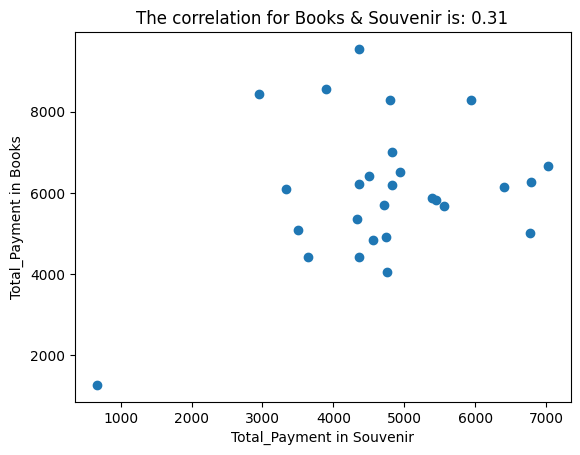

Total Monthly Payment for Cosmetics in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31       49239.26
1    2021-02-28       50946.98
2    2021-03-31       44034.78
3    2021-04-30       46352.40
4    2021-05-31       44604.02
5    2021-06-30       55826.18
6    2021-07-31       50337.08
7    2021-08-31       52329.42
8    2021-09-30       53915.16
9    2021-10-31       48466.72
10   2021-11-30       45173.26
11   2021-12-31       53264.60
12   2022-01-31       56151.46
13   2022-02-28       40009.44
14   2022-03-31       62128.48
15   2022-04-30       49605.20
16   2022-05-31       56476.74
17   2022-06-30       59038.32
18   2022-07-31       49808.50
19   2022-08-31       50052.46
20   2022-09-30       54037.14
21   2022-10-31       55256.94
22   2022-11-30       54565.72
23   2022-12-31       57818.52
24   2023-01-31       55988.82
25   2023-02-28       57411.92
26   2023-03-31       16711.26
Total Monthly Payment for Food & Beverage in Kanyon Mall
   invoice_date  Total_P

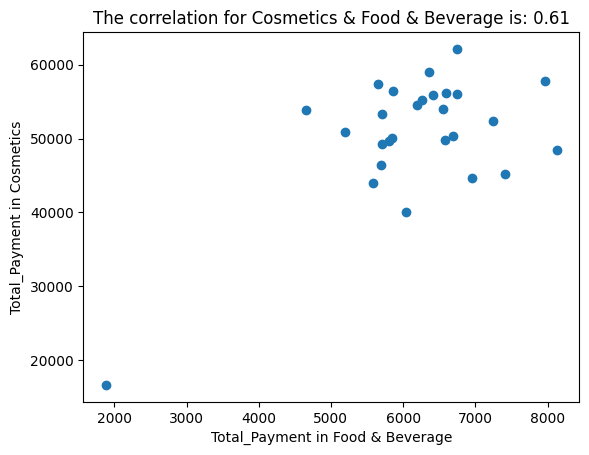

Total Monthly Payment for Toys in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31       30177.28
1    2021-02-28       33510.40
2    2021-03-31       31933.44
3    2021-04-30       25303.04
4    2021-05-31       31037.44
5    2021-06-30       25088.00
6    2021-07-31       28349.44
7    2021-08-31       23439.36
8    2021-09-30       34012.16
9    2021-10-31       34263.04
10   2021-11-30       30428.16
11   2021-12-31       29747.20
12   2022-01-31       36879.36
13   2022-02-28       22292.48
14   2022-03-31       29030.40
15   2022-04-30       26414.08
16   2022-05-31       31109.12
17   2022-06-30       31790.08
18   2022-07-31       27238.40
19   2022-08-31       30213.12
20   2022-09-30       29675.52
21   2022-10-31       39746.56
22   2022-11-30       43438.08
23   2022-12-31       25088.00
24   2023-01-31       34944.00
25   2023-02-28       20106.24
26   2023-03-31        4981.76


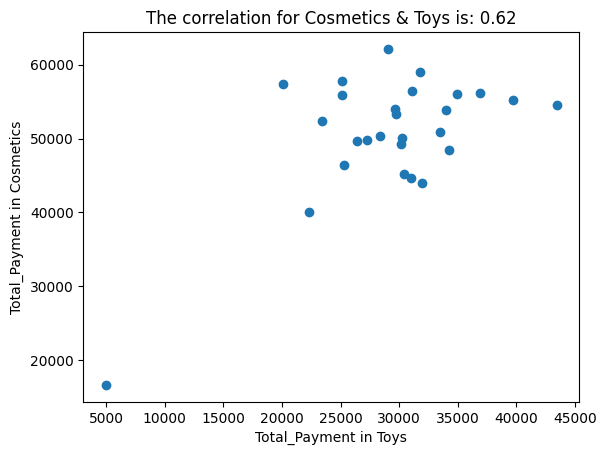

Total Monthly Payment for Technology in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31     200184.600
1    2021-02-28     165100.950
2    2021-03-31     155898.225
3    2021-04-30     179740.050
4    2021-05-31     187831.875
5    2021-06-30     209387.325
6    2021-07-31     188634.600
7    2021-08-31     200987.325
8    2021-09-30     241568.250
9    2021-10-31     166150.950
10   2021-11-30     136503.675
11   2021-12-31     197776.425
12   2022-01-31     200740.050
13   2022-02-28     160098.225
14   2022-03-31     168250.950
15   2022-04-30     178503.675
16   2022-05-31     179184.600
17   2022-06-30     213031.875
18   2022-07-31     173995.500
19   2022-08-31     191537.325
20   2022-09-30     204631.875
21   2022-10-31     211734.600
22   2022-11-30     123409.125
23   2022-12-31     227918.250
24   2023-01-31     254601.900
25   2023-02-28     238665.525
26   2023-03-31      52130.925


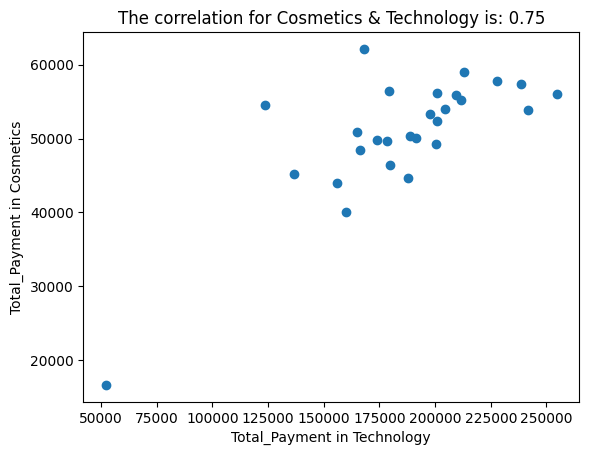

Total Monthly Payment for Souvenir in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5935.38
1    2021-02-28        5442.72
2    2021-03-31        4832.76
3    2021-04-30        5560.02
4    2021-05-31        6768.21
5    2021-06-30        3636.30
6    2021-07-31        3507.27
7    2021-08-31        3331.32
8    2021-09-30        4562.97
9    2021-10-31        4938.33
10   2021-11-30        4363.56
11   2021-12-31        7026.27
12   2022-01-31        6404.58
13   2022-02-28        4738.92
14   2022-03-31        5384.07
15   2022-04-30        4762.38
16   2022-05-31        4821.03
17   2022-06-30        4504.32
18   2022-07-31        2955.96
19   2022-08-31        6791.67
20   2022-09-30        4328.37
21   2022-10-31        4363.56
22   2022-11-30        4715.46
23   2022-12-31        3894.36
24   2023-01-31        4797.57
25   2023-02-28        4363.56
26   2023-03-31         668.61


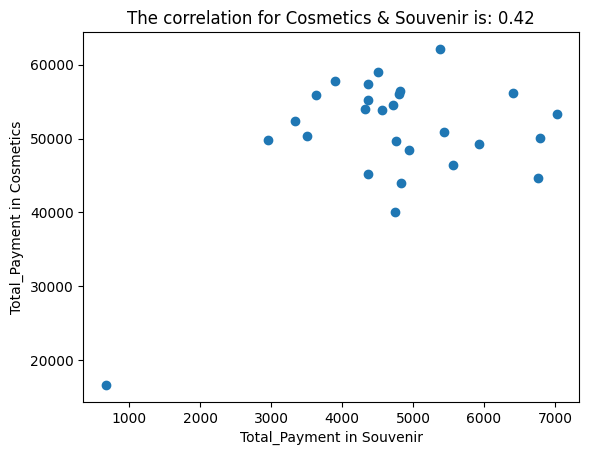

Total Monthly Payment for Food & Beverage in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5705.93
1    2021-02-28        5193.39
2    2021-03-31        5580.41
3    2021-04-30        5695.47
4    2021-05-31        6950.67
5    2021-06-30        6417.21
6    2021-07-31        6694.40
7    2021-08-31        7243.55
8    2021-09-30        4654.70
9    2021-10-31        8127.42
10   2021-11-30        7416.14
11   2021-12-31        5711.16
12   2022-01-31        6589.80
13   2022-02-28        6035.42
14   2022-03-31        6751.93
15   2022-04-30        5810.53
16   2022-05-31        5862.83
17   2022-06-30        6364.91
18   2022-07-31        6579.34
19   2022-08-31        5852.37
20   2022-09-30        6558.42
21   2022-10-31        6260.31
22   2022-11-30        6192.32
23   2022-12-31        7970.52
24   2023-01-31        6741.47
25   2023-02-28        5653.63
26   2023-03-31        1882.80
Total Monthly Payment for Toys in Kanyon Mall
   invoice_date  Total_Paymen

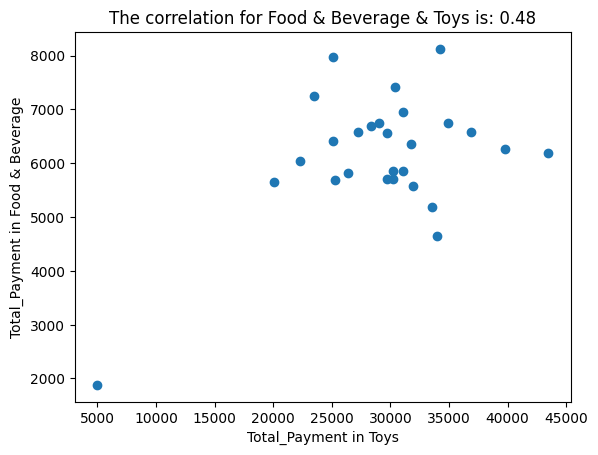

Total Monthly Payment for Technology in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31     200184.600
1    2021-02-28     165100.950
2    2021-03-31     155898.225
3    2021-04-30     179740.050
4    2021-05-31     187831.875
5    2021-06-30     209387.325
6    2021-07-31     188634.600
7    2021-08-31     200987.325
8    2021-09-30     241568.250
9    2021-10-31     166150.950
10   2021-11-30     136503.675
11   2021-12-31     197776.425
12   2022-01-31     200740.050
13   2022-02-28     160098.225
14   2022-03-31     168250.950
15   2022-04-30     178503.675
16   2022-05-31     179184.600
17   2022-06-30     213031.875
18   2022-07-31     173995.500
19   2022-08-31     191537.325
20   2022-09-30     204631.875
21   2022-10-31     211734.600
22   2022-11-30     123409.125
23   2022-12-31     227918.250
24   2023-01-31     254601.900
25   2023-02-28     238665.525
26   2023-03-31      52130.925


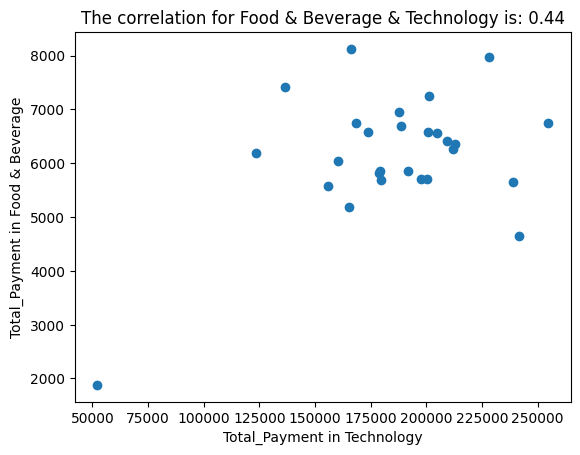

Total Monthly Payment for Souvenir in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5935.38
1    2021-02-28        5442.72
2    2021-03-31        4832.76
3    2021-04-30        5560.02
4    2021-05-31        6768.21
5    2021-06-30        3636.30
6    2021-07-31        3507.27
7    2021-08-31        3331.32
8    2021-09-30        4562.97
9    2021-10-31        4938.33
10   2021-11-30        4363.56
11   2021-12-31        7026.27
12   2022-01-31        6404.58
13   2022-02-28        4738.92
14   2022-03-31        5384.07
15   2022-04-30        4762.38
16   2022-05-31        4821.03
17   2022-06-30        4504.32
18   2022-07-31        2955.96
19   2022-08-31        6791.67
20   2022-09-30        4328.37
21   2022-10-31        4363.56
22   2022-11-30        4715.46
23   2022-12-31        3894.36
24   2023-01-31        4797.57
25   2023-02-28        4363.56
26   2023-03-31         668.61


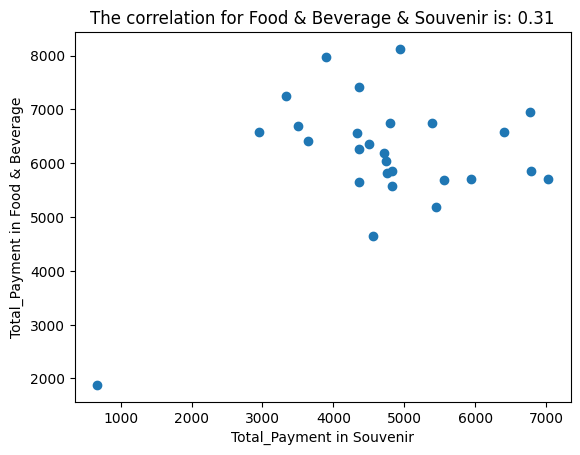

Total Monthly Payment for Toys in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31       30177.28
1    2021-02-28       33510.40
2    2021-03-31       31933.44
3    2021-04-30       25303.04
4    2021-05-31       31037.44
5    2021-06-30       25088.00
6    2021-07-31       28349.44
7    2021-08-31       23439.36
8    2021-09-30       34012.16
9    2021-10-31       34263.04
10   2021-11-30       30428.16
11   2021-12-31       29747.20
12   2022-01-31       36879.36
13   2022-02-28       22292.48
14   2022-03-31       29030.40
15   2022-04-30       26414.08
16   2022-05-31       31109.12
17   2022-06-30       31790.08
18   2022-07-31       27238.40
19   2022-08-31       30213.12
20   2022-09-30       29675.52
21   2022-10-31       39746.56
22   2022-11-30       43438.08
23   2022-12-31       25088.00
24   2023-01-31       34944.00
25   2023-02-28       20106.24
26   2023-03-31        4981.76
Total Monthly Payment for Technology in Kanyon Mall
   invoice_date  Total_Payment
0  

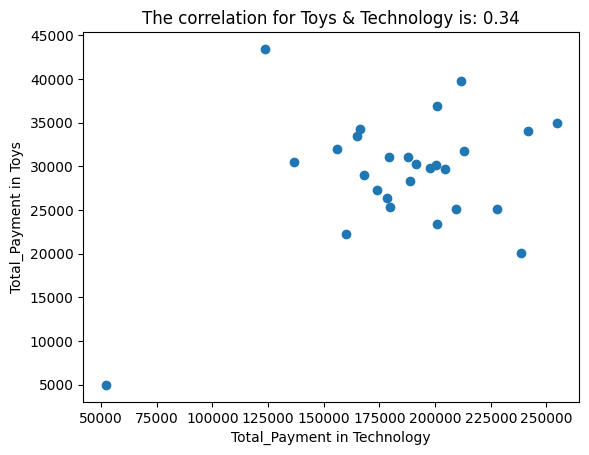

Total Monthly Payment for Souvenir in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5935.38
1    2021-02-28        5442.72
2    2021-03-31        4832.76
3    2021-04-30        5560.02
4    2021-05-31        6768.21
5    2021-06-30        3636.30
6    2021-07-31        3507.27
7    2021-08-31        3331.32
8    2021-09-30        4562.97
9    2021-10-31        4938.33
10   2021-11-30        4363.56
11   2021-12-31        7026.27
12   2022-01-31        6404.58
13   2022-02-28        4738.92
14   2022-03-31        5384.07
15   2022-04-30        4762.38
16   2022-05-31        4821.03
17   2022-06-30        4504.32
18   2022-07-31        2955.96
19   2022-08-31        6791.67
20   2022-09-30        4328.37
21   2022-10-31        4363.56
22   2022-11-30        4715.46
23   2022-12-31        3894.36
24   2023-01-31        4797.57
25   2023-02-28        4363.56
26   2023-03-31         668.61


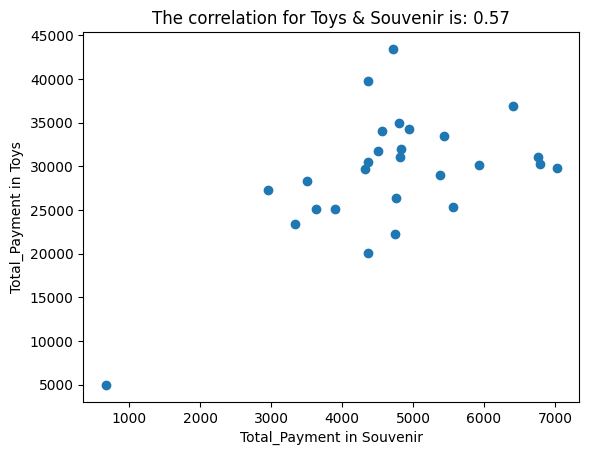

Total Monthly Payment for Technology in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31     200184.600
1    2021-02-28     165100.950
2    2021-03-31     155898.225
3    2021-04-30     179740.050
4    2021-05-31     187831.875
5    2021-06-30     209387.325
6    2021-07-31     188634.600
7    2021-08-31     200987.325
8    2021-09-30     241568.250
9    2021-10-31     166150.950
10   2021-11-30     136503.675
11   2021-12-31     197776.425
12   2022-01-31     200740.050
13   2022-02-28     160098.225
14   2022-03-31     168250.950
15   2022-04-30     178503.675
16   2022-05-31     179184.600
17   2022-06-30     213031.875
18   2022-07-31     173995.500
19   2022-08-31     191537.325
20   2022-09-30     204631.875
21   2022-10-31     211734.600
22   2022-11-30     123409.125
23   2022-12-31     227918.250
24   2023-01-31     254601.900
25   2023-02-28     238665.525
26   2023-03-31      52130.925
Total Monthly Payment for Souvenir in Kanyon Mall
   invoice_date  Total_Payment

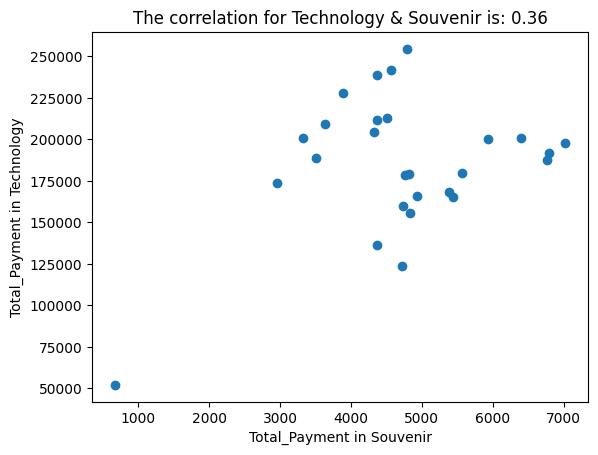

Total Monthly Payment for Souvenir in Kanyon Mall
   invoice_date  Total_Payment
0    2021-01-31        5935.38
1    2021-02-28        5442.72
2    2021-03-31        4832.76
3    2021-04-30        5560.02
4    2021-05-31        6768.21
5    2021-06-30        3636.30
6    2021-07-31        3507.27
7    2021-08-31        3331.32
8    2021-09-30        4562.97
9    2021-10-31        4938.33
10   2021-11-30        4363.56
11   2021-12-31        7026.27
12   2022-01-31        6404.58
13   2022-02-28        4738.92
14   2022-03-31        5384.07
15   2022-04-30        4762.38
16   2022-05-31        4821.03
17   2022-06-30        4504.32
18   2022-07-31        2955.96
19   2022-08-31        6791.67
20   2022-09-30        4328.37
21   2022-10-31        4363.56
22   2022-11-30        4715.46
23   2022-12-31        3894.36
24   2023-01-31        4797.57
25   2023-02-28        4363.56
26   2023-03-31         668.61


In [51]:
# creating an empty dictionary to store the correlation values
correlation_dict_Kanyon_Mall = {}

categories = df['category'].unique()
for i, category_i in enumerate(categories):

    filtered_df_i = df[(df['category'] == category_i) & (df['shopping_mall'] == 'Kanyon')]

    result_df_i = filtered_df_i.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

    result_df_i = result_df_i.reset_index()

    result_df_i = result_df_i.rename(columns={'Total_Payment': 'Total_Payment'})

    print('Total Monthly Payment for', category_i, 'in Kanyon Mall')
    print(result_df_i)

    for j in range(i + 1, len(categories)):
        category_j = categories[j]
        filtered_df_j = df[(df['category'] == category_j) & (df['shopping_mall'] == 'Kanyon')]

        result_df_j = filtered_df_j.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

        result_df_j = result_df_j.reset_index()

        result_df_j = result_df_j.rename(columns={'Total_Payment': 'Total_Payment'})

        print('Total Monthly Payment for', category_j, 'in Kanyon Mall')
        print(result_df_j)

        correlation_key = f'The correlation for {category_i} & {category_j} is'
        correlation_value = result_df_i['Total_Payment'].corr(result_df_j['Total_Payment'])
        correlation_dict_Kanyon_Mall[correlation_key] = correlation_value

        plt.scatter(result_df_j['Total_Payment'], result_df_i['Total_Payment'])
        plt.xlabel(f'Total_Payment in {category_j}')
        plt.ylabel(f'Total_Payment in {category_i}')
        plt.title(f'{correlation_key}: {correlation_value:.2f}')
        plt.show()



In [52]:
correlation_dict_Kanyon_Mall

{'The correlation for Clothing & Shoes is': 0.6685875249956222,
 'The correlation for Clothing & Books is': 0.6347660031233875,
 'The correlation for Clothing & Cosmetics is': 0.6330615361296567,
 'The correlation for Clothing & Food & Beverage is': 0.5383813992252717,
 'The correlation for Clothing & Toys is': 0.6182222363586319,
 'The correlation for Clothing & Technology is': 0.5195285234094996,
 'The correlation for Clothing & Souvenir is': 0.5479684143243225,
 'The correlation for Shoes & Books is': 0.6205166168035346,
 'The correlation for Shoes & Cosmetics is': 0.490314604830705,
 'The correlation for Shoes & Food & Beverage is': 0.6128407779515969,
 'The correlation for Shoes & Toys is': 0.44728310234246293,
 'The correlation for Shoes & Technology is': 0.3559354920268592,
 'The correlation for Shoes & Souvenir is': 0.4074231114899687,
 'The correlation for Books & Cosmetics is': 0.6058691194649276,
 'The correlation for Books & Food & Beverage is': 0.5056233731605047,
 'The co

In [53]:
# Create a new dictionary with correlations >= 0.65
filtered_correlation_dict_Kanyon_Mall = {key: value for key, value in correlation_dict_Kanyon_Mall.items() if value >= 0.65}

# Print the filtered dictionary
print(filtered_correlation_dict_Kanyon_Mall)

{'The correlation for Clothing & Shoes is': 0.6685875249956222, 'The correlation for Cosmetics & Technology is': 0.7477605501526325}


In [54]:
table_kanyon = {
    'city': ['Istanbull','Istanbull'],
    'mall': ['Kanyon Mall','Kanyon Mall'],
    'correlation': [0.6685875249956222,0.7477605501526325],
    'item1': ['Clothing','Cosmetics'],
    'item2': ['Shoes','Technology']
}
# Creating a DataFrame from the data
table_kanyon = pd.DataFrame(table_kanyon)
correlation_table= pd.concat([correlation_table, table_kanyon], ignore_index=True)
correlation_table

,city,mall,correlation,item1,item2
0,Istanbull,Forum istanbul Mall,0.697743,Cosmetics,Toys
1,Istanbull,Kanyon Mall,0.668588,Clothing,Shoes
2,Istanbull,Kanyon Mall,0.747761,Cosmetics,Technology


## Correlation between Different Categories for Metrocity_Mall

Total Monthly Payment for Clothing in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31     594734.205
1    2021-02-28     533817.140
2    2021-03-31     697115.970
3    2021-04-30     573237.415
4    2021-05-31     565353.195
5    2021-06-30     691224.165
6    2021-07-31     726579.120
7    2021-08-31     667844.755
8    2021-09-30     542383.660
9    2021-10-31     599207.750
10   2021-11-30     720849.945
11   2021-12-31     731653.650
12   2022-01-31     564998.630
13   2022-02-28     531853.205
14   2022-03-31     549913.315
15   2022-04-30     681321.525
16   2022-05-31     673765.040
17   2022-06-30     655460.160
18   2022-07-31     710374.800
19   2022-08-31     515948.965
20   2022-09-30     626597.170
21   2022-10-31     643974.980
22   2022-11-30     532425.710
23   2022-12-31     538782.700
24   2023-01-31     625342.365
25   2023-02-28     575992.620
26   2023-03-31     167800.030
Total Monthly Payment for Shoes in Metrocity Mall
   invoice_date  Total_Paymen

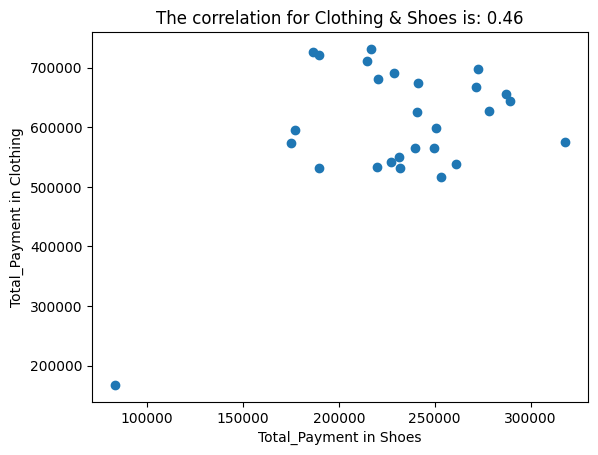

Total Monthly Payment for Books in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        5181.30
1    2021-02-28        4999.50
2    2021-03-31        5408.55
3    2021-04-30        5514.60
4    2021-05-31        4863.15
5    2021-06-30        3711.75
6    2021-07-31        7514.40
7    2021-08-31        2923.95
8    2021-09-30        5211.60
9    2021-10-31        4302.60
10   2021-11-30        3590.55
11   2021-12-31        4045.05
12   2022-01-31        5120.70
13   2022-02-28        4363.20
14   2022-03-31        5696.40
15   2022-04-30        4560.15
16   2022-05-31        4787.40
17   2022-06-30        4014.75
18   2022-07-31        4423.80
19   2022-08-31        5590.35
20   2022-09-30        4529.85
21   2022-10-31        4575.30
22   2022-11-30        5044.95
23   2022-12-31        5060.10
24   2023-01-31        4226.85
25   2023-02-28        5514.60
26   2023-03-31        1136.25


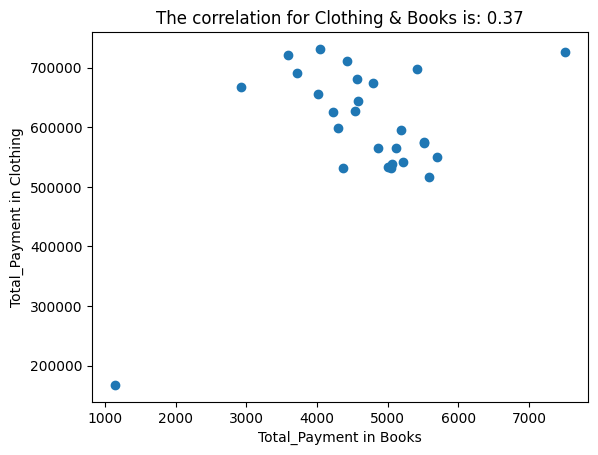

Total Monthly Payment for Cosmetics in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31       33259.88
1    2021-02-28       24070.72
2    2021-03-31       35252.22
3    2021-04-30       42286.40
4    2021-05-31       31226.88
5    2021-06-30       42367.72
6    2021-07-31       36146.74
7    2021-08-31       41147.92
8    2021-09-30       33381.86
9    2021-10-31       45132.60
10   2021-11-30       32853.28
11   2021-12-31       35496.18
12   2022-01-31       40456.70
13   2022-02-28       32284.04
14   2022-03-31       40090.76
15   2022-04-30       38586.34
16   2022-05-31       33991.76
17   2022-06-30       49198.60
18   2022-07-31       36431.36
19   2022-08-31       41798.48
20   2022-09-30       40944.62
21   2022-10-31       41717.16
22   2022-11-30       38830.30
23   2022-12-31       41757.82
24   2023-01-31       37244.56
25   2023-02-28       35984.10
26   2023-03-31        9921.04


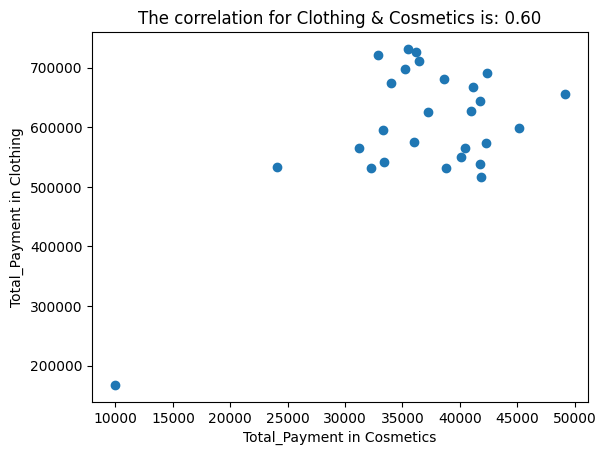

Total Monthly Payment for Food & Beverage in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        4299.06
1    2021-02-28        4136.93
2    2021-03-31        5904.67
3    2021-04-30        6600.26
4    2021-05-31        5721.62
5    2021-06-30        4754.07
6    2021-07-31        4555.33
7    2021-08-31        5868.06
8    2021-09-30        4722.69
9    2021-10-31        6124.33
10   2021-11-30        4701.77
11   2021-12-31        6171.40
12   2022-01-31        4654.70
13   2022-02-28        3619.16
14   2022-03-31        6479.97
15   2022-04-30        5407.82
16   2022-05-31        5894.21
17   2022-06-30        4037.56
18   2022-07-31        4607.63
19   2022-08-31        4544.87
20   2022-09-30        4016.64
21   2022-10-31        4340.90
22   2022-11-30        3776.06
23   2022-12-31        4863.90
24   2023-01-31        4293.83
25   2023-02-28        4701.77
26   2023-03-31        1103.53


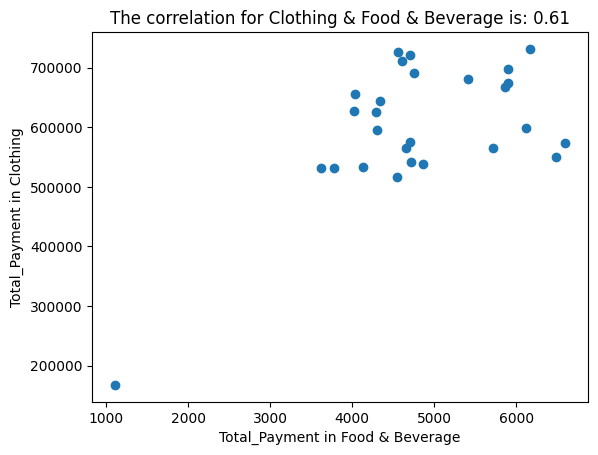

Total Monthly Payment for Toys in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31       19998.72
1    2021-02-28       18135.04
2    2021-03-31       25984.00
3    2021-04-30       25482.24
4    2021-05-31       24299.52
5    2021-06-30       24908.80
6    2021-07-31       29173.76
7    2021-08-31       20536.32
8    2021-09-30       23403.52
9    2021-10-31       21934.08
10   2021-11-30       23009.28
11   2021-12-31       17454.08
12   2022-01-31       23511.04
13   2022-02-28       21575.68
14   2022-03-31       19676.16
15   2022-04-30       24192.00
16   2022-05-31       21898.24
17   2022-06-30       26234.88
18   2022-07-31       25195.52
19   2022-08-31       18242.56
20   2022-09-30       27525.12
21   2022-10-31       23296.00
22   2022-11-30       21432.32
23   2022-12-31       26485.76
24   2023-01-31       26951.68
25   2023-02-28       24371.20
26   2023-03-31        1039.36


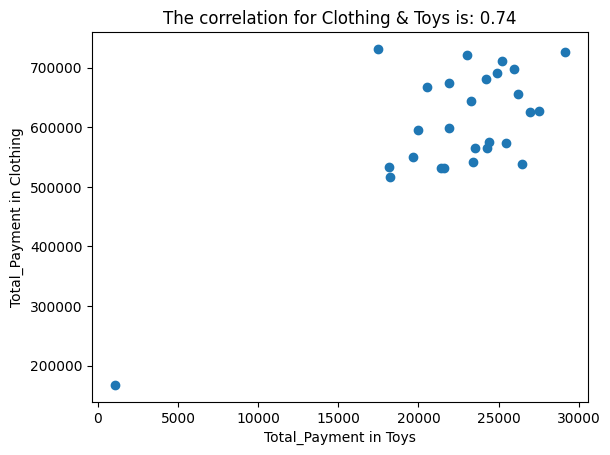

Total Monthly Payment for Technology in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31     114761.850
1    2021-02-28     144656.400
2    2021-03-31     117725.475
3    2021-04-30     113959.125
4    2021-05-31     124459.125
5    2021-06-30     107411.850
6    2021-07-31     166645.500
7    2021-08-31     161395.500
8    2021-09-30     161950.950
9    2021-10-31     226620.975
10   2021-11-30     121864.575
11   2021-12-31     104817.300
12   2022-01-31     172945.500
13   2022-02-28     101667.300
14   2022-03-31     149042.775
15   2022-04-30     161890.050
16   2022-05-31     139159.125
17   2022-06-30     145459.125
18   2022-07-31     143667.300
19   2022-08-31     151450.950
20   2022-09-30     182642.775
21   2022-10-31     147498.225
22   2022-11-30     148053.675
23   2022-12-31     179184.600
24   2023-01-31     183631.875
25   2023-02-28     117109.125
26   2023-03-31      18344.550


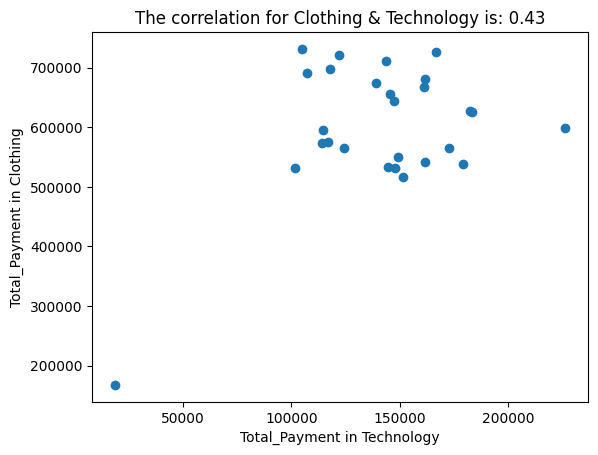

Total Monthly Payment for Souvenir in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        3812.25
1    2021-02-28        2768.28
2    2021-03-31        3953.01
3    2021-04-30        4457.40
4    2021-05-31        3706.68
5    2021-06-30        2533.68
6    2021-07-31        3507.27
7    2021-08-31        4586.43
8    2021-09-30        3554.19
9    2021-10-31        4387.02
10   2021-11-30        4832.76
11   2021-12-31        2768.28
12   2022-01-31        3343.05
13   2022-02-28        2768.28
14   2022-03-31        3284.40
15   2022-04-30        2580.60
16   2022-05-31        3812.25
17   2022-06-30        4457.40
18   2022-07-31        3659.76
19   2022-08-31        3612.84
20   2022-09-30        4187.61
21   2022-10-31        2604.06
22   2022-11-30        4175.88
23   2022-12-31        3096.72
24   2023-01-31        3460.35
25   2023-02-28        3167.10
26   2023-03-31        1149.54


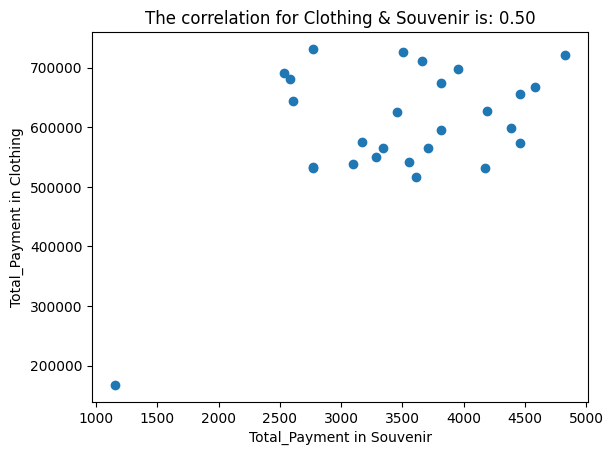

Total Monthly Payment for Shoes in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31     177267.780
1    2021-02-28     220152.450
2    2021-03-31     272312.645
3    2021-04-30     174867.100
4    2021-05-31     239576.270
5    2021-06-30     228991.590
6    2021-07-31     186434.115
7    2021-08-31     271657.880
8    2021-09-30     227027.295
9    2021-10-31     250815.715
10   2021-11-30     189871.350
11   2021-12-31     216606.025
12   2022-01-31     249506.185
13   2022-02-28     189434.965
14   2022-03-31     231228.485
15   2022-04-30     220370.830
16   2022-05-31     241376.780
17   2022-06-30     287316.895
18   2022-07-31     214423.725
19   2022-08-31     253161.800
20   2022-09-30     278150.560
21   2022-10-31     289008.215
22   2022-11-30     232101.255
23   2022-12-31     260854.820
24   2023-01-31     240831.205
25   2023-02-28     318198.165
26   2023-03-31      83041.465
Total Monthly Payment for Books in Metrocity Mall
   invoice_date  Total_Payment
0

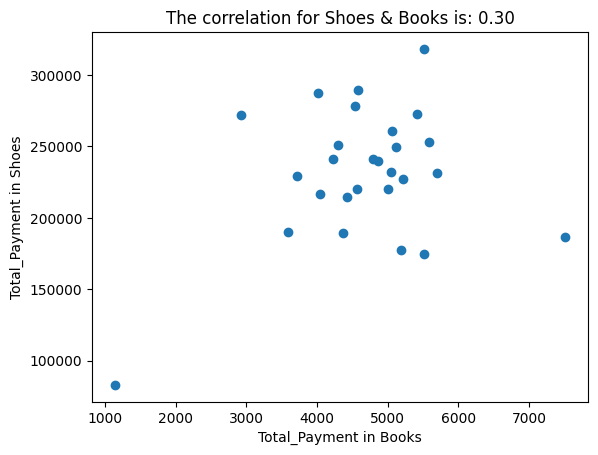

Total Monthly Payment for Cosmetics in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31       33259.88
1    2021-02-28       24070.72
2    2021-03-31       35252.22
3    2021-04-30       42286.40
4    2021-05-31       31226.88
5    2021-06-30       42367.72
6    2021-07-31       36146.74
7    2021-08-31       41147.92
8    2021-09-30       33381.86
9    2021-10-31       45132.60
10   2021-11-30       32853.28
11   2021-12-31       35496.18
12   2022-01-31       40456.70
13   2022-02-28       32284.04
14   2022-03-31       40090.76
15   2022-04-30       38586.34
16   2022-05-31       33991.76
17   2022-06-30       49198.60
18   2022-07-31       36431.36
19   2022-08-31       41798.48
20   2022-09-30       40944.62
21   2022-10-31       41717.16
22   2022-11-30       38830.30
23   2022-12-31       41757.82
24   2023-01-31       37244.56
25   2023-02-28       35984.10
26   2023-03-31        9921.04


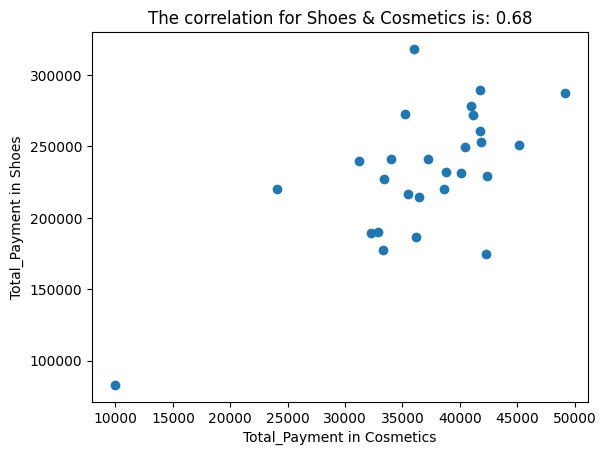

Total Monthly Payment for Food & Beverage in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        4299.06
1    2021-02-28        4136.93
2    2021-03-31        5904.67
3    2021-04-30        6600.26
4    2021-05-31        5721.62
5    2021-06-30        4754.07
6    2021-07-31        4555.33
7    2021-08-31        5868.06
8    2021-09-30        4722.69
9    2021-10-31        6124.33
10   2021-11-30        4701.77
11   2021-12-31        6171.40
12   2022-01-31        4654.70
13   2022-02-28        3619.16
14   2022-03-31        6479.97
15   2022-04-30        5407.82
16   2022-05-31        5894.21
17   2022-06-30        4037.56
18   2022-07-31        4607.63
19   2022-08-31        4544.87
20   2022-09-30        4016.64
21   2022-10-31        4340.90
22   2022-11-30        3776.06
23   2022-12-31        4863.90
24   2023-01-31        4293.83
25   2023-02-28        4701.77
26   2023-03-31        1103.53


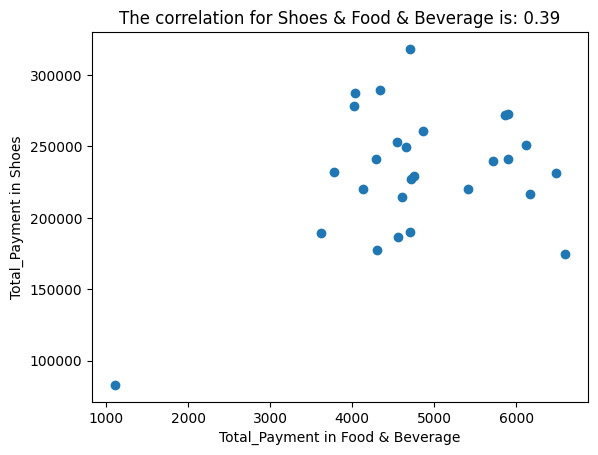

Total Monthly Payment for Toys in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31       19998.72
1    2021-02-28       18135.04
2    2021-03-31       25984.00
3    2021-04-30       25482.24
4    2021-05-31       24299.52
5    2021-06-30       24908.80
6    2021-07-31       29173.76
7    2021-08-31       20536.32
8    2021-09-30       23403.52
9    2021-10-31       21934.08
10   2021-11-30       23009.28
11   2021-12-31       17454.08
12   2022-01-31       23511.04
13   2022-02-28       21575.68
14   2022-03-31       19676.16
15   2022-04-30       24192.00
16   2022-05-31       21898.24
17   2022-06-30       26234.88
18   2022-07-31       25195.52
19   2022-08-31       18242.56
20   2022-09-30       27525.12
21   2022-10-31       23296.00
22   2022-11-30       21432.32
23   2022-12-31       26485.76
24   2023-01-31       26951.68
25   2023-02-28       24371.20
26   2023-03-31        1039.36


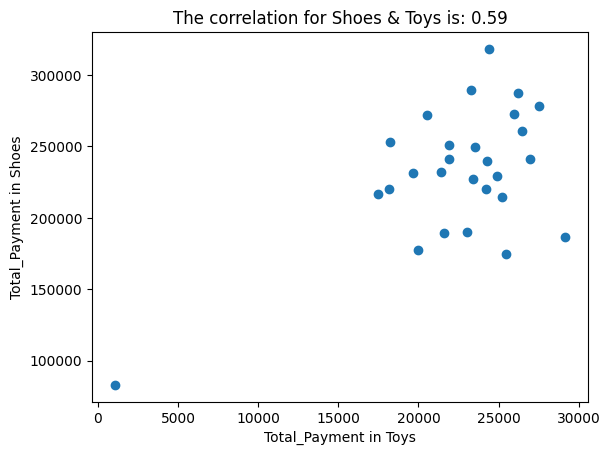

Total Monthly Payment for Technology in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31     114761.850
1    2021-02-28     144656.400
2    2021-03-31     117725.475
3    2021-04-30     113959.125
4    2021-05-31     124459.125
5    2021-06-30     107411.850
6    2021-07-31     166645.500
7    2021-08-31     161395.500
8    2021-09-30     161950.950
9    2021-10-31     226620.975
10   2021-11-30     121864.575
11   2021-12-31     104817.300
12   2022-01-31     172945.500
13   2022-02-28     101667.300
14   2022-03-31     149042.775
15   2022-04-30     161890.050
16   2022-05-31     139159.125
17   2022-06-30     145459.125
18   2022-07-31     143667.300
19   2022-08-31     151450.950
20   2022-09-30     182642.775
21   2022-10-31     147498.225
22   2022-11-30     148053.675
23   2022-12-31     179184.600
24   2023-01-31     183631.875
25   2023-02-28     117109.125
26   2023-03-31      18344.550


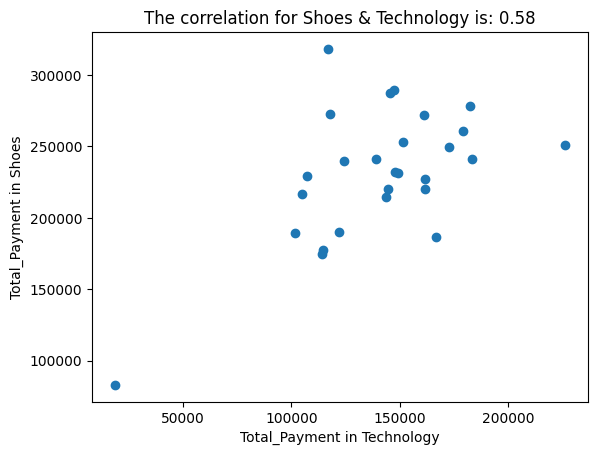

Total Monthly Payment for Souvenir in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        3812.25
1    2021-02-28        2768.28
2    2021-03-31        3953.01
3    2021-04-30        4457.40
4    2021-05-31        3706.68
5    2021-06-30        2533.68
6    2021-07-31        3507.27
7    2021-08-31        4586.43
8    2021-09-30        3554.19
9    2021-10-31        4387.02
10   2021-11-30        4832.76
11   2021-12-31        2768.28
12   2022-01-31        3343.05
13   2022-02-28        2768.28
14   2022-03-31        3284.40
15   2022-04-30        2580.60
16   2022-05-31        3812.25
17   2022-06-30        4457.40
18   2022-07-31        3659.76
19   2022-08-31        3612.84
20   2022-09-30        4187.61
21   2022-10-31        2604.06
22   2022-11-30        4175.88
23   2022-12-31        3096.72
24   2023-01-31        3460.35
25   2023-02-28        3167.10
26   2023-03-31        1149.54


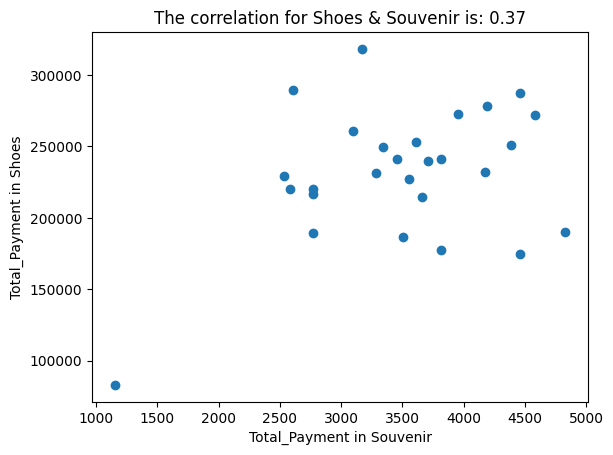

Total Monthly Payment for Books in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        5181.30
1    2021-02-28        4999.50
2    2021-03-31        5408.55
3    2021-04-30        5514.60
4    2021-05-31        4863.15
5    2021-06-30        3711.75
6    2021-07-31        7514.40
7    2021-08-31        2923.95
8    2021-09-30        5211.60
9    2021-10-31        4302.60
10   2021-11-30        3590.55
11   2021-12-31        4045.05
12   2022-01-31        5120.70
13   2022-02-28        4363.20
14   2022-03-31        5696.40
15   2022-04-30        4560.15
16   2022-05-31        4787.40
17   2022-06-30        4014.75
18   2022-07-31        4423.80
19   2022-08-31        5590.35
20   2022-09-30        4529.85
21   2022-10-31        4575.30
22   2022-11-30        5044.95
23   2022-12-31        5060.10
24   2023-01-31        4226.85
25   2023-02-28        5514.60
26   2023-03-31        1136.25
Total Monthly Payment for Cosmetics in Metrocity Mall
   invoice_date  Total_Payme

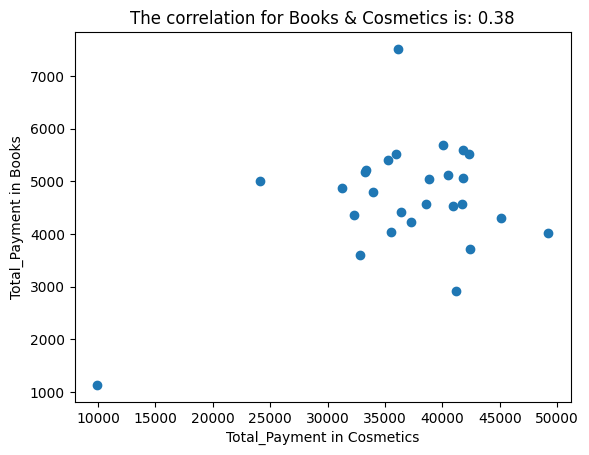

Total Monthly Payment for Food & Beverage in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        4299.06
1    2021-02-28        4136.93
2    2021-03-31        5904.67
3    2021-04-30        6600.26
4    2021-05-31        5721.62
5    2021-06-30        4754.07
6    2021-07-31        4555.33
7    2021-08-31        5868.06
8    2021-09-30        4722.69
9    2021-10-31        6124.33
10   2021-11-30        4701.77
11   2021-12-31        6171.40
12   2022-01-31        4654.70
13   2022-02-28        3619.16
14   2022-03-31        6479.97
15   2022-04-30        5407.82
16   2022-05-31        5894.21
17   2022-06-30        4037.56
18   2022-07-31        4607.63
19   2022-08-31        4544.87
20   2022-09-30        4016.64
21   2022-10-31        4340.90
22   2022-11-30        3776.06
23   2022-12-31        4863.90
24   2023-01-31        4293.83
25   2023-02-28        4701.77
26   2023-03-31        1103.53


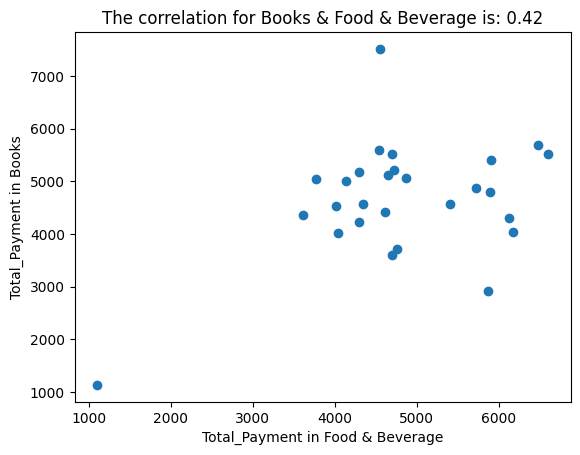

Total Monthly Payment for Toys in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31       19998.72
1    2021-02-28       18135.04
2    2021-03-31       25984.00
3    2021-04-30       25482.24
4    2021-05-31       24299.52
5    2021-06-30       24908.80
6    2021-07-31       29173.76
7    2021-08-31       20536.32
8    2021-09-30       23403.52
9    2021-10-31       21934.08
10   2021-11-30       23009.28
11   2021-12-31       17454.08
12   2022-01-31       23511.04
13   2022-02-28       21575.68
14   2022-03-31       19676.16
15   2022-04-30       24192.00
16   2022-05-31       21898.24
17   2022-06-30       26234.88
18   2022-07-31       25195.52
19   2022-08-31       18242.56
20   2022-09-30       27525.12
21   2022-10-31       23296.00
22   2022-11-30       21432.32
23   2022-12-31       26485.76
24   2023-01-31       26951.68
25   2023-02-28       24371.20
26   2023-03-31        1039.36


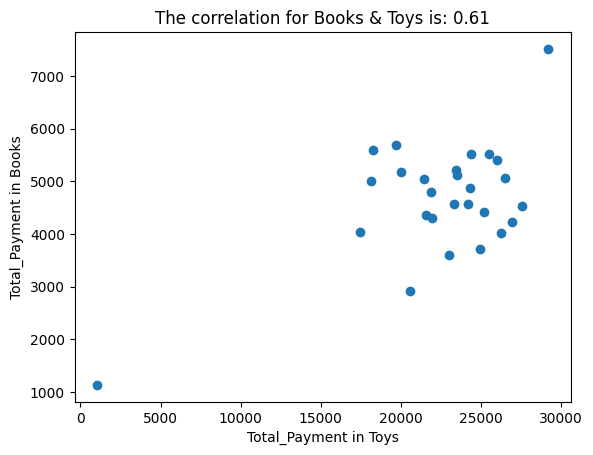

Total Monthly Payment for Technology in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31     114761.850
1    2021-02-28     144656.400
2    2021-03-31     117725.475
3    2021-04-30     113959.125
4    2021-05-31     124459.125
5    2021-06-30     107411.850
6    2021-07-31     166645.500
7    2021-08-31     161395.500
8    2021-09-30     161950.950
9    2021-10-31     226620.975
10   2021-11-30     121864.575
11   2021-12-31     104817.300
12   2022-01-31     172945.500
13   2022-02-28     101667.300
14   2022-03-31     149042.775
15   2022-04-30     161890.050
16   2022-05-31     139159.125
17   2022-06-30     145459.125
18   2022-07-31     143667.300
19   2022-08-31     151450.950
20   2022-09-30     182642.775
21   2022-10-31     147498.225
22   2022-11-30     148053.675
23   2022-12-31     179184.600
24   2023-01-31     183631.875
25   2023-02-28     117109.125
26   2023-03-31      18344.550


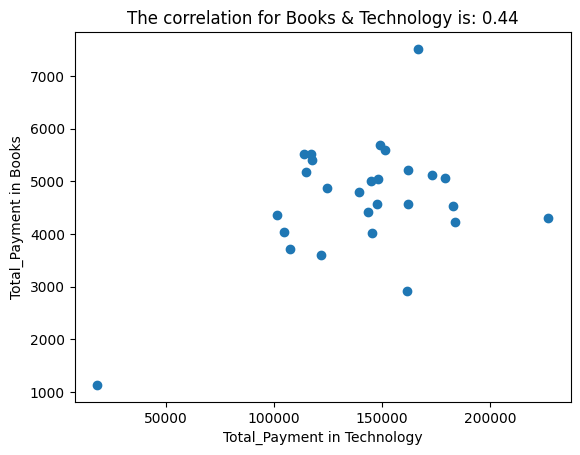

Total Monthly Payment for Souvenir in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        3812.25
1    2021-02-28        2768.28
2    2021-03-31        3953.01
3    2021-04-30        4457.40
4    2021-05-31        3706.68
5    2021-06-30        2533.68
6    2021-07-31        3507.27
7    2021-08-31        4586.43
8    2021-09-30        3554.19
9    2021-10-31        4387.02
10   2021-11-30        4832.76
11   2021-12-31        2768.28
12   2022-01-31        3343.05
13   2022-02-28        2768.28
14   2022-03-31        3284.40
15   2022-04-30        2580.60
16   2022-05-31        3812.25
17   2022-06-30        4457.40
18   2022-07-31        3659.76
19   2022-08-31        3612.84
20   2022-09-30        4187.61
21   2022-10-31        2604.06
22   2022-11-30        4175.88
23   2022-12-31        3096.72
24   2023-01-31        3460.35
25   2023-02-28        3167.10
26   2023-03-31        1149.54


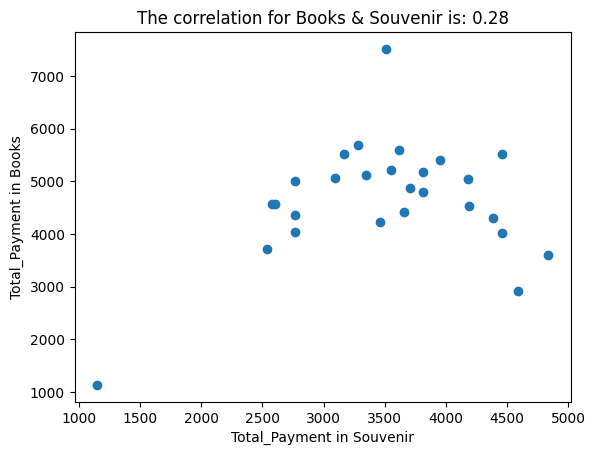

Total Monthly Payment for Cosmetics in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31       33259.88
1    2021-02-28       24070.72
2    2021-03-31       35252.22
3    2021-04-30       42286.40
4    2021-05-31       31226.88
5    2021-06-30       42367.72
6    2021-07-31       36146.74
7    2021-08-31       41147.92
8    2021-09-30       33381.86
9    2021-10-31       45132.60
10   2021-11-30       32853.28
11   2021-12-31       35496.18
12   2022-01-31       40456.70
13   2022-02-28       32284.04
14   2022-03-31       40090.76
15   2022-04-30       38586.34
16   2022-05-31       33991.76
17   2022-06-30       49198.60
18   2022-07-31       36431.36
19   2022-08-31       41798.48
20   2022-09-30       40944.62
21   2022-10-31       41717.16
22   2022-11-30       38830.30
23   2022-12-31       41757.82
24   2023-01-31       37244.56
25   2023-02-28       35984.10
26   2023-03-31        9921.04
Total Monthly Payment for Food & Beverage in Metrocity Mall
   invoice_date  T

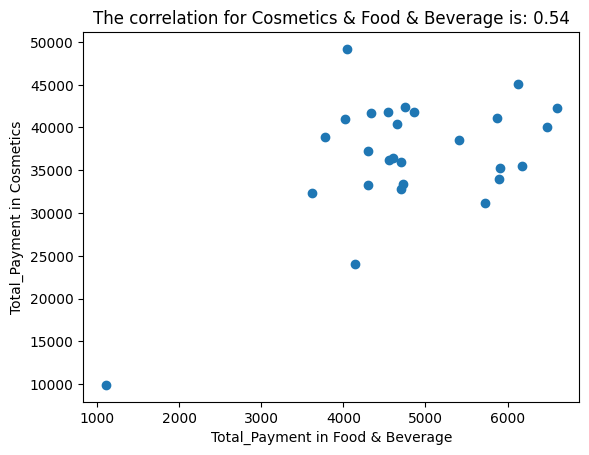

Total Monthly Payment for Toys in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31       19998.72
1    2021-02-28       18135.04
2    2021-03-31       25984.00
3    2021-04-30       25482.24
4    2021-05-31       24299.52
5    2021-06-30       24908.80
6    2021-07-31       29173.76
7    2021-08-31       20536.32
8    2021-09-30       23403.52
9    2021-10-31       21934.08
10   2021-11-30       23009.28
11   2021-12-31       17454.08
12   2022-01-31       23511.04
13   2022-02-28       21575.68
14   2022-03-31       19676.16
15   2022-04-30       24192.00
16   2022-05-31       21898.24
17   2022-06-30       26234.88
18   2022-07-31       25195.52
19   2022-08-31       18242.56
20   2022-09-30       27525.12
21   2022-10-31       23296.00
22   2022-11-30       21432.32
23   2022-12-31       26485.76
24   2023-01-31       26951.68
25   2023-02-28       24371.20
26   2023-03-31        1039.36


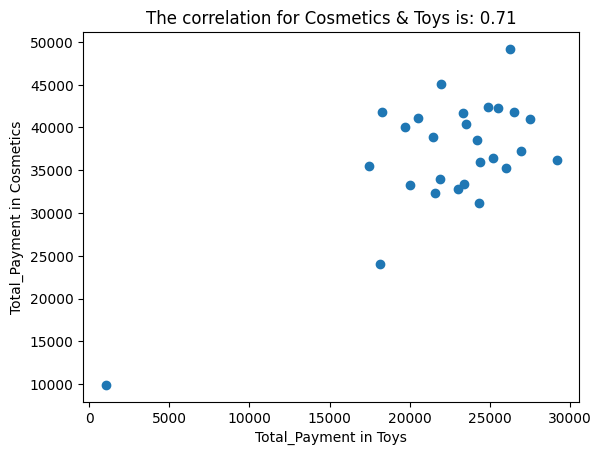

Total Monthly Payment for Technology in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31     114761.850
1    2021-02-28     144656.400
2    2021-03-31     117725.475
3    2021-04-30     113959.125
4    2021-05-31     124459.125
5    2021-06-30     107411.850
6    2021-07-31     166645.500
7    2021-08-31     161395.500
8    2021-09-30     161950.950
9    2021-10-31     226620.975
10   2021-11-30     121864.575
11   2021-12-31     104817.300
12   2022-01-31     172945.500
13   2022-02-28     101667.300
14   2022-03-31     149042.775
15   2022-04-30     161890.050
16   2022-05-31     139159.125
17   2022-06-30     145459.125
18   2022-07-31     143667.300
19   2022-08-31     151450.950
20   2022-09-30     182642.775
21   2022-10-31     147498.225
22   2022-11-30     148053.675
23   2022-12-31     179184.600
24   2023-01-31     183631.875
25   2023-02-28     117109.125
26   2023-03-31      18344.550


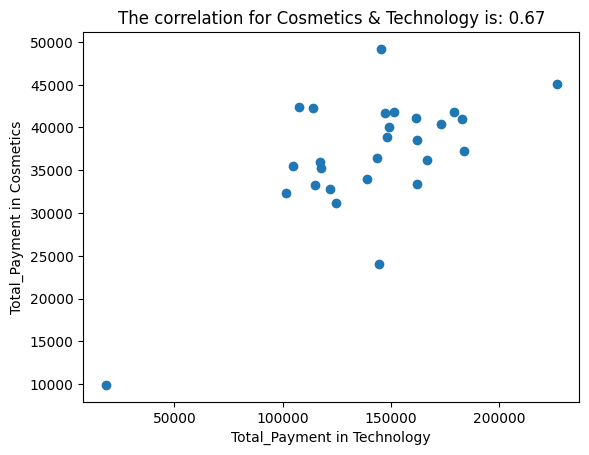

Total Monthly Payment for Souvenir in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        3812.25
1    2021-02-28        2768.28
2    2021-03-31        3953.01
3    2021-04-30        4457.40
4    2021-05-31        3706.68
5    2021-06-30        2533.68
6    2021-07-31        3507.27
7    2021-08-31        4586.43
8    2021-09-30        3554.19
9    2021-10-31        4387.02
10   2021-11-30        4832.76
11   2021-12-31        2768.28
12   2022-01-31        3343.05
13   2022-02-28        2768.28
14   2022-03-31        3284.40
15   2022-04-30        2580.60
16   2022-05-31        3812.25
17   2022-06-30        4457.40
18   2022-07-31        3659.76
19   2022-08-31        3612.84
20   2022-09-30        4187.61
21   2022-10-31        2604.06
22   2022-11-30        4175.88
23   2022-12-31        3096.72
24   2023-01-31        3460.35
25   2023-02-28        3167.10
26   2023-03-31        1149.54


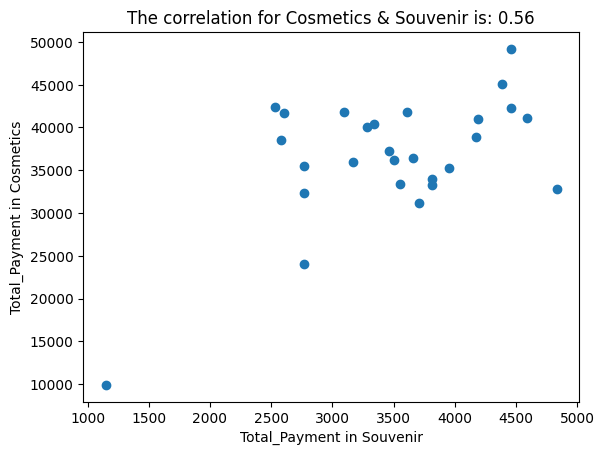

Total Monthly Payment for Food & Beverage in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        4299.06
1    2021-02-28        4136.93
2    2021-03-31        5904.67
3    2021-04-30        6600.26
4    2021-05-31        5721.62
5    2021-06-30        4754.07
6    2021-07-31        4555.33
7    2021-08-31        5868.06
8    2021-09-30        4722.69
9    2021-10-31        6124.33
10   2021-11-30        4701.77
11   2021-12-31        6171.40
12   2022-01-31        4654.70
13   2022-02-28        3619.16
14   2022-03-31        6479.97
15   2022-04-30        5407.82
16   2022-05-31        5894.21
17   2022-06-30        4037.56
18   2022-07-31        4607.63
19   2022-08-31        4544.87
20   2022-09-30        4016.64
21   2022-10-31        4340.90
22   2022-11-30        3776.06
23   2022-12-31        4863.90
24   2023-01-31        4293.83
25   2023-02-28        4701.77
26   2023-03-31        1103.53
Total Monthly Payment for Toys in Metrocity Mall
   invoice_date  Total_

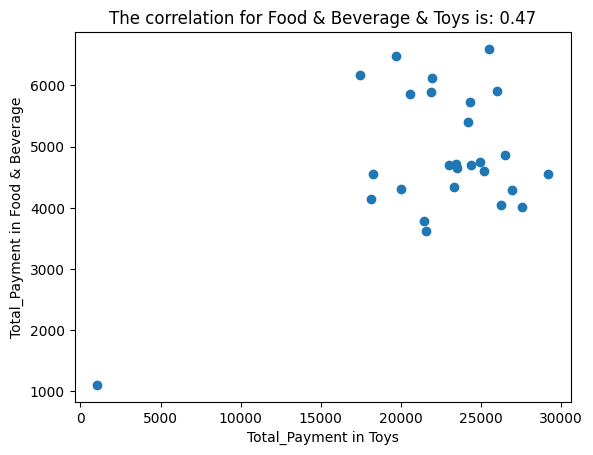

Total Monthly Payment for Technology in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31     114761.850
1    2021-02-28     144656.400
2    2021-03-31     117725.475
3    2021-04-30     113959.125
4    2021-05-31     124459.125
5    2021-06-30     107411.850
6    2021-07-31     166645.500
7    2021-08-31     161395.500
8    2021-09-30     161950.950
9    2021-10-31     226620.975
10   2021-11-30     121864.575
11   2021-12-31     104817.300
12   2022-01-31     172945.500
13   2022-02-28     101667.300
14   2022-03-31     149042.775
15   2022-04-30     161890.050
16   2022-05-31     139159.125
17   2022-06-30     145459.125
18   2022-07-31     143667.300
19   2022-08-31     151450.950
20   2022-09-30     182642.775
21   2022-10-31     147498.225
22   2022-11-30     148053.675
23   2022-12-31     179184.600
24   2023-01-31     183631.875
25   2023-02-28     117109.125
26   2023-03-31      18344.550


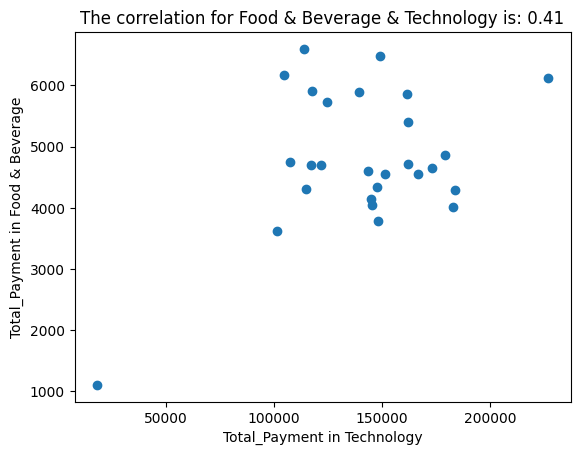

Total Monthly Payment for Souvenir in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        3812.25
1    2021-02-28        2768.28
2    2021-03-31        3953.01
3    2021-04-30        4457.40
4    2021-05-31        3706.68
5    2021-06-30        2533.68
6    2021-07-31        3507.27
7    2021-08-31        4586.43
8    2021-09-30        3554.19
9    2021-10-31        4387.02
10   2021-11-30        4832.76
11   2021-12-31        2768.28
12   2022-01-31        3343.05
13   2022-02-28        2768.28
14   2022-03-31        3284.40
15   2022-04-30        2580.60
16   2022-05-31        3812.25
17   2022-06-30        4457.40
18   2022-07-31        3659.76
19   2022-08-31        3612.84
20   2022-09-30        4187.61
21   2022-10-31        2604.06
22   2022-11-30        4175.88
23   2022-12-31        3096.72
24   2023-01-31        3460.35
25   2023-02-28        3167.10
26   2023-03-31        1149.54


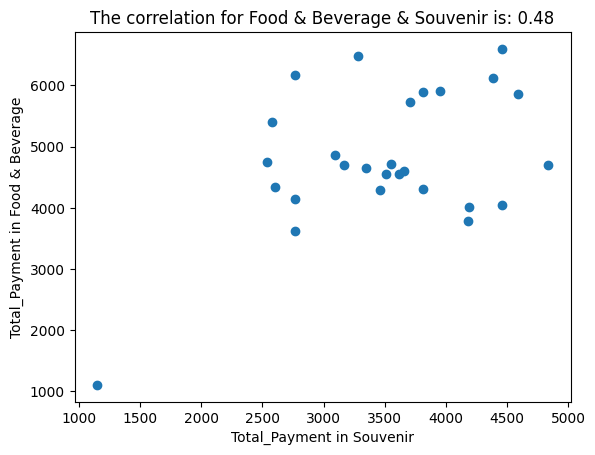

Total Monthly Payment for Toys in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31       19998.72
1    2021-02-28       18135.04
2    2021-03-31       25984.00
3    2021-04-30       25482.24
4    2021-05-31       24299.52
5    2021-06-30       24908.80
6    2021-07-31       29173.76
7    2021-08-31       20536.32
8    2021-09-30       23403.52
9    2021-10-31       21934.08
10   2021-11-30       23009.28
11   2021-12-31       17454.08
12   2022-01-31       23511.04
13   2022-02-28       21575.68
14   2022-03-31       19676.16
15   2022-04-30       24192.00
16   2022-05-31       21898.24
17   2022-06-30       26234.88
18   2022-07-31       25195.52
19   2022-08-31       18242.56
20   2022-09-30       27525.12
21   2022-10-31       23296.00
22   2022-11-30       21432.32
23   2022-12-31       26485.76
24   2023-01-31       26951.68
25   2023-02-28       24371.20
26   2023-03-31        1039.36
Total Monthly Payment for Technology in Metrocity Mall
   invoice_date  Total_Payme

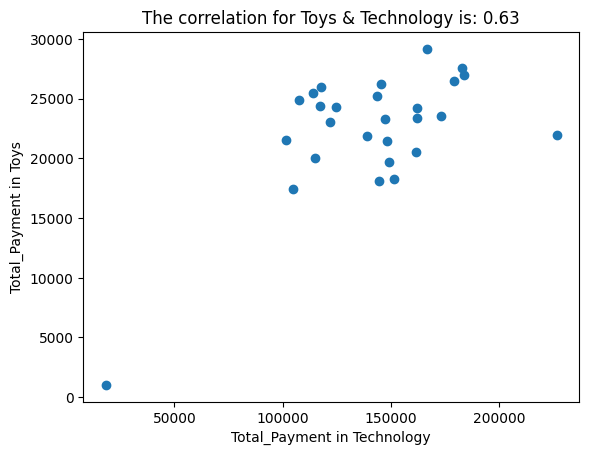

Total Monthly Payment for Souvenir in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        3812.25
1    2021-02-28        2768.28
2    2021-03-31        3953.01
3    2021-04-30        4457.40
4    2021-05-31        3706.68
5    2021-06-30        2533.68
6    2021-07-31        3507.27
7    2021-08-31        4586.43
8    2021-09-30        3554.19
9    2021-10-31        4387.02
10   2021-11-30        4832.76
11   2021-12-31        2768.28
12   2022-01-31        3343.05
13   2022-02-28        2768.28
14   2022-03-31        3284.40
15   2022-04-30        2580.60
16   2022-05-31        3812.25
17   2022-06-30        4457.40
18   2022-07-31        3659.76
19   2022-08-31        3612.84
20   2022-09-30        4187.61
21   2022-10-31        2604.06
22   2022-11-30        4175.88
23   2022-12-31        3096.72
24   2023-01-31        3460.35
25   2023-02-28        3167.10
26   2023-03-31        1149.54


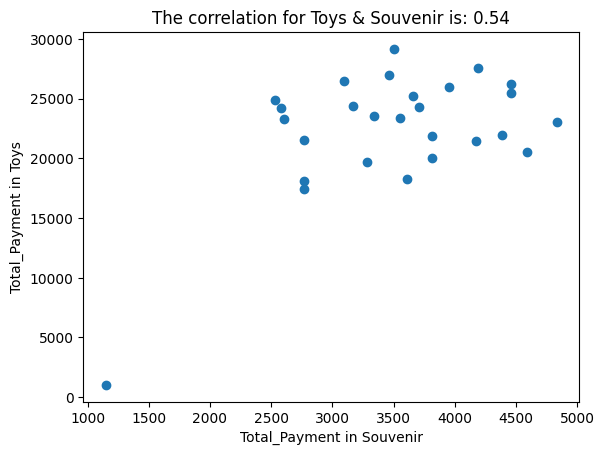

Total Monthly Payment for Technology in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31     114761.850
1    2021-02-28     144656.400
2    2021-03-31     117725.475
3    2021-04-30     113959.125
4    2021-05-31     124459.125
5    2021-06-30     107411.850
6    2021-07-31     166645.500
7    2021-08-31     161395.500
8    2021-09-30     161950.950
9    2021-10-31     226620.975
10   2021-11-30     121864.575
11   2021-12-31     104817.300
12   2022-01-31     172945.500
13   2022-02-28     101667.300
14   2022-03-31     149042.775
15   2022-04-30     161890.050
16   2022-05-31     139159.125
17   2022-06-30     145459.125
18   2022-07-31     143667.300
19   2022-08-31     151450.950
20   2022-09-30     182642.775
21   2022-10-31     147498.225
22   2022-11-30     148053.675
23   2022-12-31     179184.600
24   2023-01-31     183631.875
25   2023-02-28     117109.125
26   2023-03-31      18344.550
Total Monthly Payment for Souvenir in Metrocity Mall
   invoice_date  Total_P

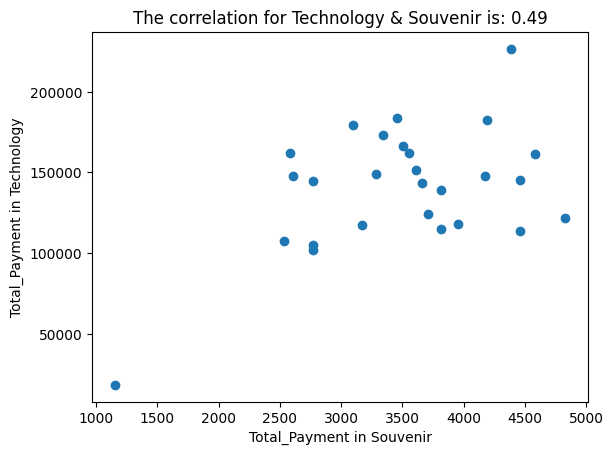

Total Monthly Payment for Souvenir in Metrocity Mall
   invoice_date  Total_Payment
0    2021-01-31        3812.25
1    2021-02-28        2768.28
2    2021-03-31        3953.01
3    2021-04-30        4457.40
4    2021-05-31        3706.68
5    2021-06-30        2533.68
6    2021-07-31        3507.27
7    2021-08-31        4586.43
8    2021-09-30        3554.19
9    2021-10-31        4387.02
10   2021-11-30        4832.76
11   2021-12-31        2768.28
12   2022-01-31        3343.05
13   2022-02-28        2768.28
14   2022-03-31        3284.40
15   2022-04-30        2580.60
16   2022-05-31        3812.25
17   2022-06-30        4457.40
18   2022-07-31        3659.76
19   2022-08-31        3612.84
20   2022-09-30        4187.61
21   2022-10-31        2604.06
22   2022-11-30        4175.88
23   2022-12-31        3096.72
24   2023-01-31        3460.35
25   2023-02-28        3167.10
26   2023-03-31        1149.54


In [55]:
# creating an empty dictionary to store the correlation values
correlation_dict_Metrocity_Mall = {}

categories = df['category'].unique()
for i, category_i in enumerate(categories):
    filtered_df_i = df[(df['category'] == category_i) & (df['shopping_mall'] == 'Metrocity')]

    result_df_i = filtered_df_i.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

    result_df_i = result_df_i.reset_index()

    result_df_i = result_df_i.rename(columns={'Total_Payment': 'Total_Payment'})

    print('Total Monthly Payment for', category_i, 'in Metrocity Mall')
    print(result_df_i)

    for j in range(i + 1, len(categories)):
        category_j = categories[j]
        filtered_df_j = df[(df['category'] == category_j) & (df['shopping_mall'] == 'Metrocity')]

        result_df_j = filtered_df_j.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

        result_df_j = result_df_j.reset_index()

        result_df_j = result_df_j.rename(columns={'Total_Payment': 'Total_Payment'})

        print('Total Monthly Payment for', category_j, 'in Metrocity Mall')
        print(result_df_j)

        correlation_key = f'The correlation for {category_i} & {category_j} is'
        correlation_value = result_df_i['Total_Payment'].corr(result_df_j['Total_Payment'])
        correlation_dict_Metrocity_Mall[correlation_key] = correlation_value

        plt.scatter(result_df_j['Total_Payment'], result_df_i['Total_Payment'])
        plt.xlabel(f'Total_Payment in {category_j}')
        plt.ylabel(f'Total_Payment in {category_i}')
        plt.title(f'{correlation_key}: {correlation_value:.2f}')
        plt.show()



In [56]:
correlation_dict_Metrocity_Mall

{'The correlation for Clothing & Shoes is': 0.4612198696547712,
 'The correlation for Clothing & Books is': 0.36700573592328306,
 'The correlation for Clothing & Cosmetics is': 0.5970300188142166,
 'The correlation for Clothing & Food & Beverage is': 0.6075016153383657,
 'The correlation for Clothing & Toys is': 0.7440721460174076,
 'The correlation for Clothing & Technology is': 0.433183471609875,
 'The correlation for Clothing & Souvenir is': 0.49634433345665285,
 'The correlation for Shoes & Books is': 0.30159749406908537,
 'The correlation for Shoes & Cosmetics is': 0.6761210888921592,
 'The correlation for Shoes & Food & Beverage is': 0.38738328270485134,
 'The correlation for Shoes & Toys is': 0.5883952504352989,
 'The correlation for Shoes & Technology is': 0.5826100308607862,
 'The correlation for Shoes & Souvenir is': 0.3664219072803385,
 'The correlation for Books & Cosmetics is': 0.37506882997743485,
 'The correlation for Books & Food & Beverage is': 0.4178680454366621,
 'Th

In [57]:
# Create a new dictionary with correlations >= 0.65
filtered_correlation_dict_Metrocity_Mall = {key: value for key, value in correlation_dict_Metrocity_Mall.items() if value >= 0.65}

# Print the filtered dictionary
print(filtered_correlation_dict_Metrocity_Mall)

{'The correlation for Clothing & Toys is': 0.7440721460174076, 'The correlation for Shoes & Cosmetics is': 0.6761210888921592, 'The correlation for Cosmetics & Toys is': 0.7080544351956704, 'The correlation for Cosmetics & Technology is': 0.6684093115884789}


In [58]:
table_metrocity = {
    'city': ['Istanbull','Istanbull','Istanbull','Istanbull'],
    'mall': ['Metrocity Mall','Metrocity Mall','Metrocity Mall','Metrocity Mall'],
    'correlation': [0.7440721460174076,0.6761210888921592,0.7080544351956704,0.6684093115884789],
    'item1': ['Clothing','Shoes','Cosmetics','Cosmetics'],
    'item2': ['Toys','Cosmetics','Toys','Technology']
}
# Creating a DataFrame from the data
table_metrocity = pd.DataFrame(table_metrocity)
correlation_table= pd.concat([correlation_table, table_metrocity], ignore_index=True)
correlation_table

,city,mall,correlation,item1,item2
0,Istanbull,Forum istanbul Mall,0.697743,Cosmetics,Toys
1,Istanbull,Kanyon Mall,0.668588,Clothing,Shoes
2,Istanbull,Kanyon Mall,0.747761,Cosmetics,Technology
3,Istanbull,Metrocity Mall,0.744072,Clothing,Toys
4,Istanbull,Metrocity Mall,0.676121,Shoes,Cosmetics
5,Istanbull,Metrocity Mall,0.708054,Cosmetics,Toys
6,Istanbull,Metrocity Mall,0.668409,Cosmetics,Technology



## Correlation between Different Categories for Metropol_AVM

Total Monthly Payment for Clothing in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31     294161.365
1    2021-02-28     409147.315
2    2021-03-31     411411.330
3    2021-04-30     434763.085
4    2021-05-31     447830.805
5    2021-06-30     494288.720
6    2021-07-31     435036.335
7    2021-08-31     419595.630
8    2021-09-30     399953.805
9    2021-10-31     393379.700
10   2021-11-30     465153.305
11   2021-12-31     440110.865
12   2022-01-31     391933.785
13   2022-02-28     301772.335
14   2022-03-31     525933.745
15   2022-04-30     438937.375
16   2022-05-31     404455.005
17   2022-06-30     342092.850
18   2022-07-31     348257.905
19   2022-08-31     447994.260
20   2022-09-30     470227.835
21   2022-10-31     392397.320
22   2022-11-30     428925.765
23   2022-12-31     443465.405
24   2023-01-31     457133.285
25   2023-02-28     363344.045
26   2023-03-31     111439.475
Total Monthly Payment for Shoes in Metropol AVM Mall
   invoice_date  Total_

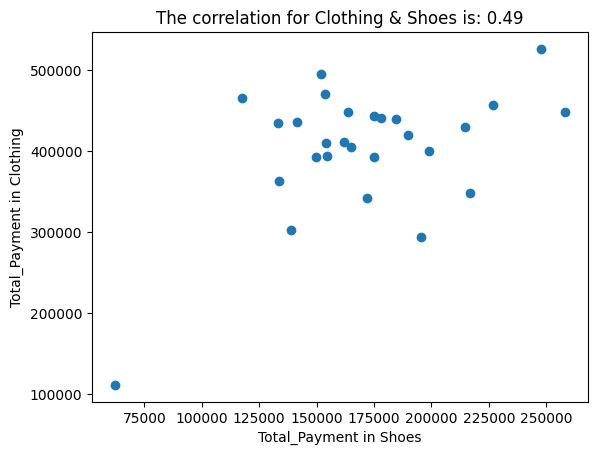

Total Monthly Payment for Books in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        3317.85
1    2021-02-28        1666.50
2    2021-03-31        3545.10
3    2021-04-30        2317.95
4    2021-05-31        3848.10
5    2021-06-30        2166.45
6    2021-07-31        2105.85
7    2021-08-31        4423.80
8    2021-09-30        3151.20
9    2021-10-31        5347.95
10   2021-11-30        3863.25
11   2021-12-31        1302.90
12   2022-01-31        3605.70
13   2022-02-28        2848.20
14   2022-03-31        3469.35
15   2022-04-30        2908.80
16   2022-05-31        2454.30
17   2022-06-30        3151.20
18   2022-07-31        4226.85
19   2022-08-31        5590.35
20   2022-09-30        3711.75
21   2022-10-31        1227.15
22   2022-11-30        2742.15
23   2022-12-31        3378.45
24   2023-01-31        4181.40
25   2023-02-28        2817.90
26   2023-03-31         348.45


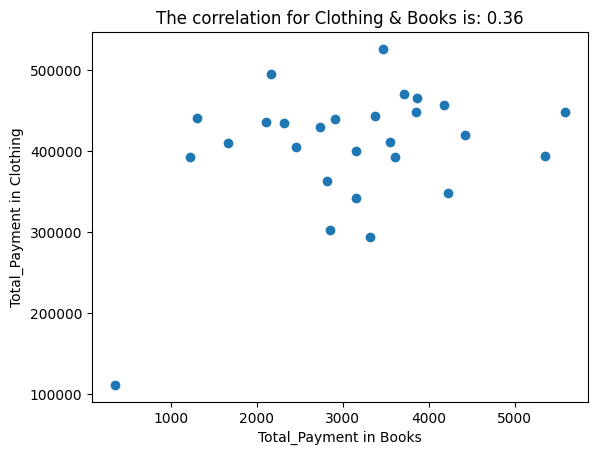

Total Monthly Payment for Cosmetics in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       29112.56
1    2021-02-28       29193.88
2    2021-03-31       17117.86
3    2021-04-30       21997.06
4    2021-05-31       28909.26
5    2021-06-30       24721.28
6    2021-07-31       23745.44
7    2021-08-31       27689.46
8    2021-09-30       27730.12
9    2021-10-31       23704.78
10   2021-11-30       32771.96
11   2021-12-31       34357.70
12   2022-01-31       36309.38
13   2022-02-28       26672.96
14   2022-03-31       23623.46
15   2022-04-30       27038.90
16   2022-05-31       28055.40
17   2022-06-30       21468.48
18   2022-07-31       20167.36
19   2022-08-31       25331.18
20   2022-09-30       30942.26
21   2022-10-31       21956.40
22   2022-11-30       17687.10
23   2022-12-31       23379.50
24   2023-01-31       29803.78
25   2023-02-28       21712.44
26   2023-03-31        5570.42


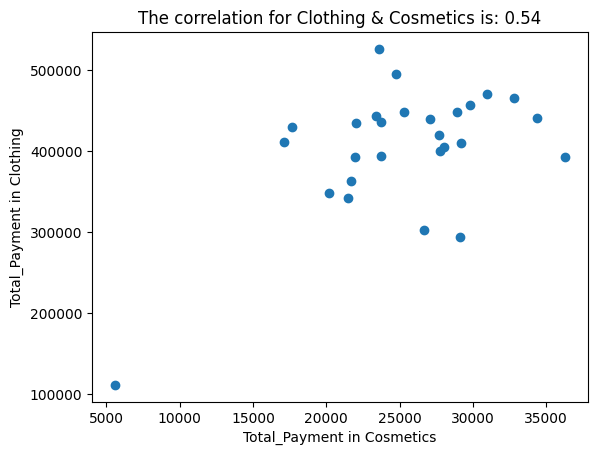

Total Monthly Payment for Food & Beverage in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2055.39
1    2021-02-28        2384.88
2    2021-03-31        3059.55
3    2021-04-30        3153.69
4    2021-05-31        4042.79
5    2021-06-30        3514.56
6    2021-07-31        4068.94
7    2021-08-31        4058.48
8    2021-09-30        3859.74
9    2021-10-31        2991.56
10   2021-11-30        3451.80
11   2021-12-31        3681.92
12   2022-01-31        2029.24
13   2022-02-28        3331.51
14   2022-03-31        5078.33
15   2022-04-30        3483.18
16   2022-05-31        3389.04
17   2022-06-30        3577.32
18   2022-07-31        3514.56
19   2022-08-31        2740.52
20   2022-09-30        3436.11
21   2022-10-31        3786.52
22   2022-11-30        4042.79
23   2022-12-31        2944.49
24   2023-01-31        4136.93
25   2023-02-28        2186.14
26   2023-03-31         638.06


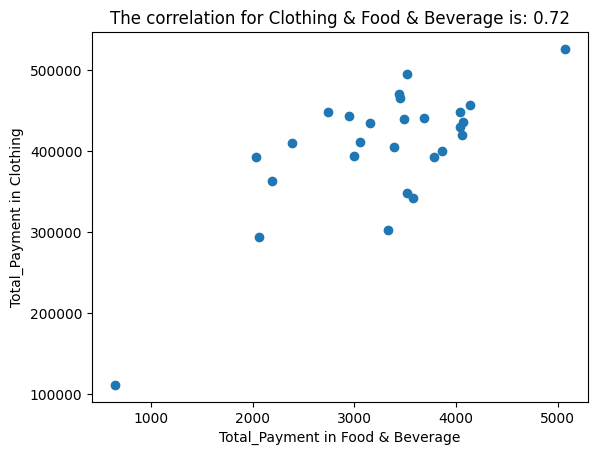

Total Monthly Payment for Toys in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       17561.60
1    2021-02-28       13440.00
2    2021-03-31       13224.96
3    2021-04-30       17776.64
4    2021-05-31       16629.76
5    2021-06-30       15375.36
6    2021-07-31       15733.76
7    2021-08-31       10429.44
8    2021-09-30       19927.04
9    2021-10-31       13977.60
10   2021-11-30       13511.68
11   2021-12-31       14085.12
12   2022-01-31       23296.00
13   2022-02-28       12759.04
14   2022-03-31       17704.96
15   2022-04-30       11898.88
16   2022-05-31       20249.60
17   2022-06-30       14085.12
18   2022-07-31       14837.76
19   2022-08-31       21002.24
20   2022-09-30       16593.92
21   2022-10-31       11432.96
22   2022-11-30       15733.76
23   2022-12-31       14694.40
24   2023-01-31       16880.64
25   2023-02-28       18170.88
26   2023-03-31        2293.76


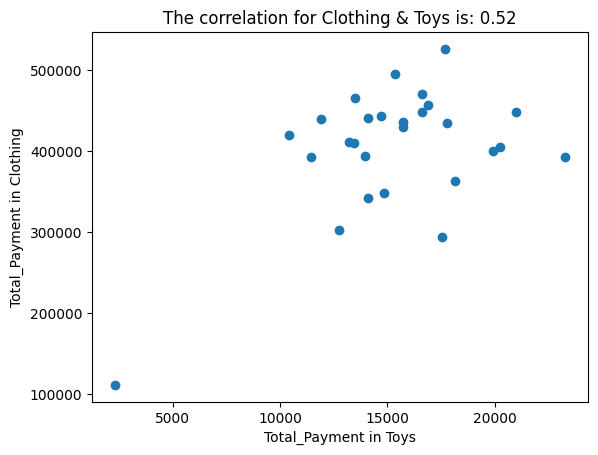

Total Monthly Payment for Technology in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      93267.300
1    2021-02-28     102717.300
2    2021-03-31     149103.675
3    2021-04-30     105867.300
4    2021-05-31      51883.650
5    2021-06-30     105064.575
6    2021-07-31      67633.650
7    2021-08-31      99814.575
8    2021-09-30      79370.025
9    2021-10-31     121556.400
10   2021-11-30     125261.850
11   2021-12-31      99814.575
12   2022-01-31      89870.025
13   2022-02-28      83630.925
14   2022-03-31      71278.200
15   2022-04-30      51636.375
16   2022-05-31      82767.300
17   2022-06-30      85670.025
18   2022-07-31      69980.925
19   2022-08-31      79122.750
20   2022-09-30      88820.025
21   2022-10-31      75725.475
22   2022-11-30     110561.850
23   2022-12-31      81470.025
24   2023-01-31      72822.750
25   2023-02-28      77578.200
26   2023-03-31      23841.825


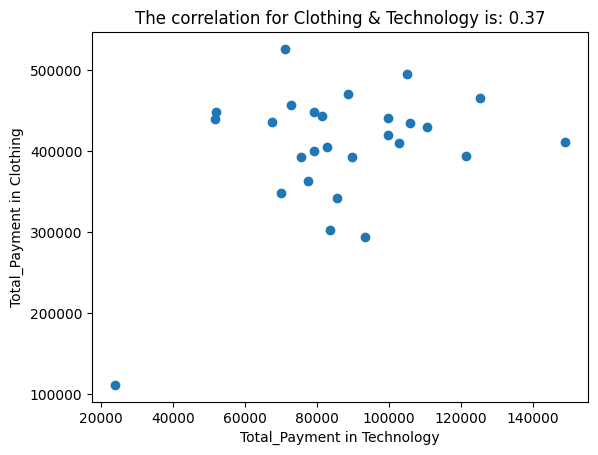

Total Monthly Payment for Souvenir in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2322.54
1    2021-02-28        2756.55
2    2021-03-31        2639.25
3    2021-04-30        3448.62
4    2021-05-31        3530.73
5    2021-06-30        3214.02
6    2021-07-31        1466.25
7    2021-08-31        3366.51
8    2021-09-30        1630.47
9    2021-10-31        1630.47
10   2021-11-30        1947.18
11   2021-12-31        2158.32
12   2022-01-31        2815.20
13   2022-02-28        1184.73
14   2022-03-31        3096.72
15   2022-04-30        1712.58
16   2022-05-31        2803.47
17   2022-06-30        2850.39
18   2022-07-31        2627.52
19   2022-08-31        2768.28
20   2022-09-30        3917.82
21   2022-10-31        3319.59
22   2022-11-30        1454.52
23   2022-12-31        2475.03
24   2023-01-31        2158.32
25   2023-02-28        4070.31
26   2023-03-31         504.39


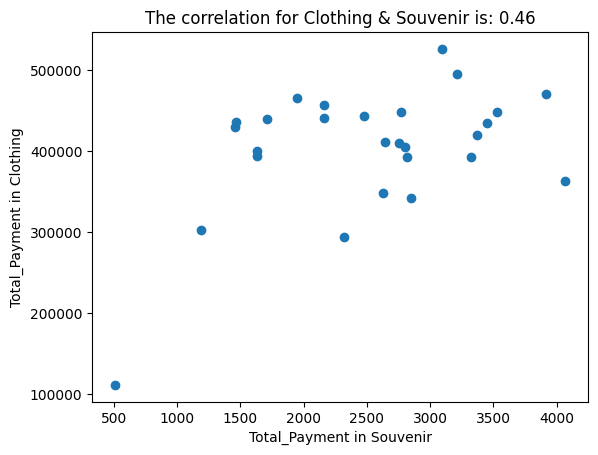

Total Monthly Payment for Shoes in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31     195382.070
1    2021-02-28     154079.530
2    2021-03-31     161881.740
3    2021-04-30     133346.555
4    2021-05-31     258344.950
5    2021-06-30     151733.445
6    2021-07-31     141475.960
7    2021-08-31     189816.755
8    2021-09-30     198819.305
9    2021-10-31     154679.700
10   2021-11-30     117523.755
11   2021-12-31     177977.140
12   2022-01-31     175030.885
13   2022-02-28     138857.275
14   2022-03-31     247814.865
15   2022-04-30     184524.415
16   2022-05-31     164827.995
17   2022-06-30     171920.845
18   2022-07-31     216715.215
19   2022-08-31     163736.845
20   2022-09-30     153588.550
21   2022-10-31     149769.150
22   2022-11-30     214532.915
23   2022-12-31     174867.100
24   2023-01-31     226645.130
25   2023-02-28     133619.155
26   2023-03-31      62090.110
Total Monthly Payment for Books in Metropol AVM Mall
   invoice_date  Total_Pay

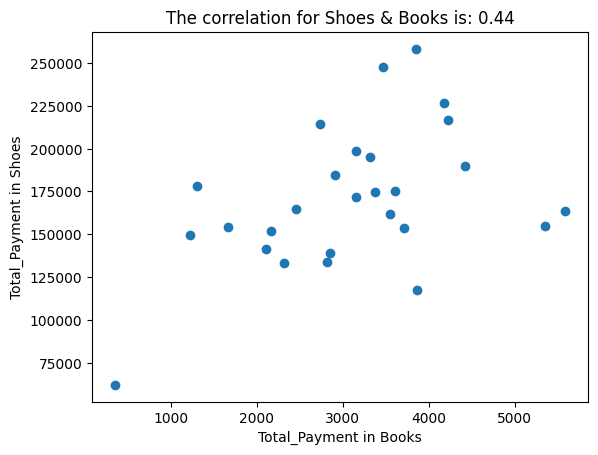

Total Monthly Payment for Cosmetics in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       29112.56
1    2021-02-28       29193.88
2    2021-03-31       17117.86
3    2021-04-30       21997.06
4    2021-05-31       28909.26
5    2021-06-30       24721.28
6    2021-07-31       23745.44
7    2021-08-31       27689.46
8    2021-09-30       27730.12
9    2021-10-31       23704.78
10   2021-11-30       32771.96
11   2021-12-31       34357.70
12   2022-01-31       36309.38
13   2022-02-28       26672.96
14   2022-03-31       23623.46
15   2022-04-30       27038.90
16   2022-05-31       28055.40
17   2022-06-30       21468.48
18   2022-07-31       20167.36
19   2022-08-31       25331.18
20   2022-09-30       30942.26
21   2022-10-31       21956.40
22   2022-11-30       17687.10
23   2022-12-31       23379.50
24   2023-01-31       29803.78
25   2023-02-28       21712.44
26   2023-03-31        5570.42


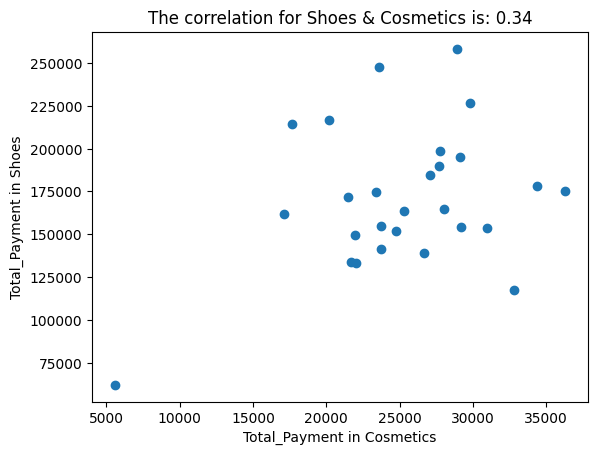

Total Monthly Payment for Food & Beverage in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2055.39
1    2021-02-28        2384.88
2    2021-03-31        3059.55
3    2021-04-30        3153.69
4    2021-05-31        4042.79
5    2021-06-30        3514.56
6    2021-07-31        4068.94
7    2021-08-31        4058.48
8    2021-09-30        3859.74
9    2021-10-31        2991.56
10   2021-11-30        3451.80
11   2021-12-31        3681.92
12   2022-01-31        2029.24
13   2022-02-28        3331.51
14   2022-03-31        5078.33
15   2022-04-30        3483.18
16   2022-05-31        3389.04
17   2022-06-30        3577.32
18   2022-07-31        3514.56
19   2022-08-31        2740.52
20   2022-09-30        3436.11
21   2022-10-31        3786.52
22   2022-11-30        4042.79
23   2022-12-31        2944.49
24   2023-01-31        4136.93
25   2023-02-28        2186.14
26   2023-03-31         638.06


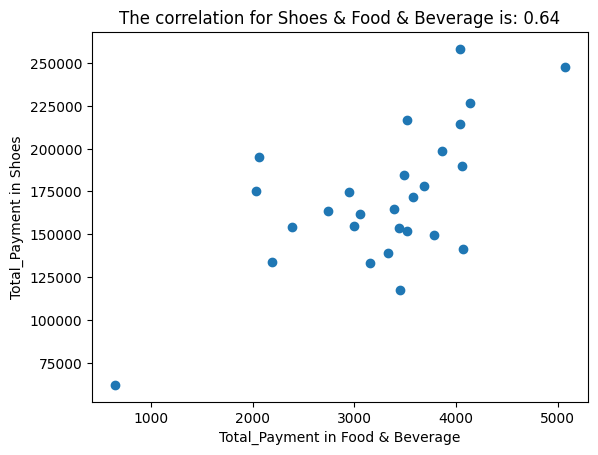

Total Monthly Payment for Toys in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       17561.60
1    2021-02-28       13440.00
2    2021-03-31       13224.96
3    2021-04-30       17776.64
4    2021-05-31       16629.76
5    2021-06-30       15375.36
6    2021-07-31       15733.76
7    2021-08-31       10429.44
8    2021-09-30       19927.04
9    2021-10-31       13977.60
10   2021-11-30       13511.68
11   2021-12-31       14085.12
12   2022-01-31       23296.00
13   2022-02-28       12759.04
14   2022-03-31       17704.96
15   2022-04-30       11898.88
16   2022-05-31       20249.60
17   2022-06-30       14085.12
18   2022-07-31       14837.76
19   2022-08-31       21002.24
20   2022-09-30       16593.92
21   2022-10-31       11432.96
22   2022-11-30       15733.76
23   2022-12-31       14694.40
24   2023-01-31       16880.64
25   2023-02-28       18170.88
26   2023-03-31        2293.76


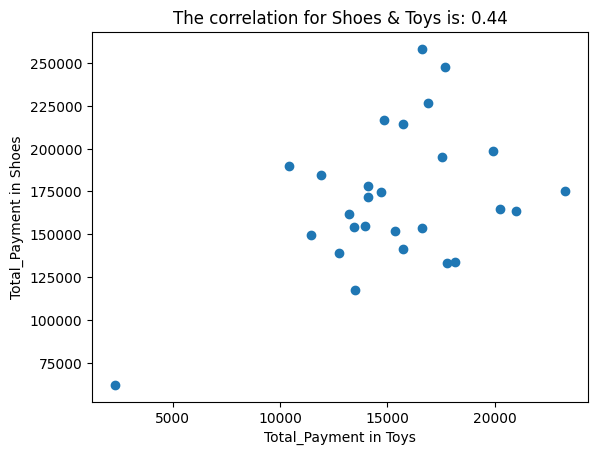

Total Monthly Payment for Technology in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      93267.300
1    2021-02-28     102717.300
2    2021-03-31     149103.675
3    2021-04-30     105867.300
4    2021-05-31      51883.650
5    2021-06-30     105064.575
6    2021-07-31      67633.650
7    2021-08-31      99814.575
8    2021-09-30      79370.025
9    2021-10-31     121556.400
10   2021-11-30     125261.850
11   2021-12-31      99814.575
12   2022-01-31      89870.025
13   2022-02-28      83630.925
14   2022-03-31      71278.200
15   2022-04-30      51636.375
16   2022-05-31      82767.300
17   2022-06-30      85670.025
18   2022-07-31      69980.925
19   2022-08-31      79122.750
20   2022-09-30      88820.025
21   2022-10-31      75725.475
22   2022-11-30     110561.850
23   2022-12-31      81470.025
24   2023-01-31      72822.750
25   2023-02-28      77578.200
26   2023-03-31      23841.825


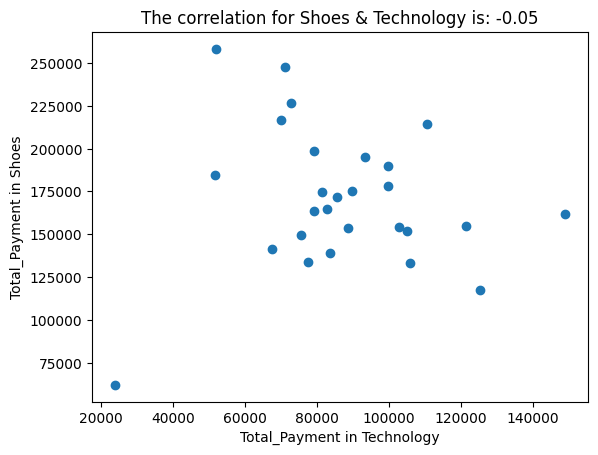

Total Monthly Payment for Souvenir in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2322.54
1    2021-02-28        2756.55
2    2021-03-31        2639.25
3    2021-04-30        3448.62
4    2021-05-31        3530.73
5    2021-06-30        3214.02
6    2021-07-31        1466.25
7    2021-08-31        3366.51
8    2021-09-30        1630.47
9    2021-10-31        1630.47
10   2021-11-30        1947.18
11   2021-12-31        2158.32
12   2022-01-31        2815.20
13   2022-02-28        1184.73
14   2022-03-31        3096.72
15   2022-04-30        1712.58
16   2022-05-31        2803.47
17   2022-06-30        2850.39
18   2022-07-31        2627.52
19   2022-08-31        2768.28
20   2022-09-30        3917.82
21   2022-10-31        3319.59
22   2022-11-30        1454.52
23   2022-12-31        2475.03
24   2023-01-31        2158.32
25   2023-02-28        4070.31
26   2023-03-31         504.39


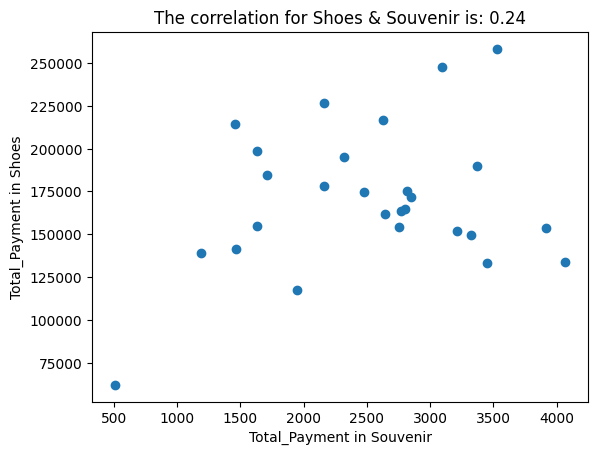

Total Monthly Payment for Books in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        3317.85
1    2021-02-28        1666.50
2    2021-03-31        3545.10
3    2021-04-30        2317.95
4    2021-05-31        3848.10
5    2021-06-30        2166.45
6    2021-07-31        2105.85
7    2021-08-31        4423.80
8    2021-09-30        3151.20
9    2021-10-31        5347.95
10   2021-11-30        3863.25
11   2021-12-31        1302.90
12   2022-01-31        3605.70
13   2022-02-28        2848.20
14   2022-03-31        3469.35
15   2022-04-30        2908.80
16   2022-05-31        2454.30
17   2022-06-30        3151.20
18   2022-07-31        4226.85
19   2022-08-31        5590.35
20   2022-09-30        3711.75
21   2022-10-31        1227.15
22   2022-11-30        2742.15
23   2022-12-31        3378.45
24   2023-01-31        4181.40
25   2023-02-28        2817.90
26   2023-03-31         348.45
Total Monthly Payment for Cosmetics in Metropol AVM Mall
   invoice_date  Total

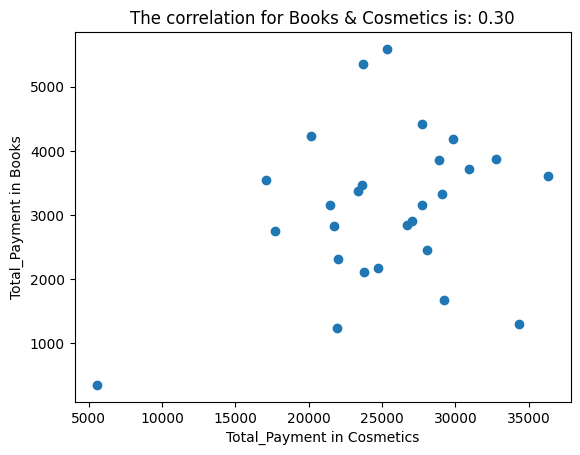

Total Monthly Payment for Food & Beverage in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2055.39
1    2021-02-28        2384.88
2    2021-03-31        3059.55
3    2021-04-30        3153.69
4    2021-05-31        4042.79
5    2021-06-30        3514.56
6    2021-07-31        4068.94
7    2021-08-31        4058.48
8    2021-09-30        3859.74
9    2021-10-31        2991.56
10   2021-11-30        3451.80
11   2021-12-31        3681.92
12   2022-01-31        2029.24
13   2022-02-28        3331.51
14   2022-03-31        5078.33
15   2022-04-30        3483.18
16   2022-05-31        3389.04
17   2022-06-30        3577.32
18   2022-07-31        3514.56
19   2022-08-31        2740.52
20   2022-09-30        3436.11
21   2022-10-31        3786.52
22   2022-11-30        4042.79
23   2022-12-31        2944.49
24   2023-01-31        4136.93
25   2023-02-28        2186.14
26   2023-03-31         638.06


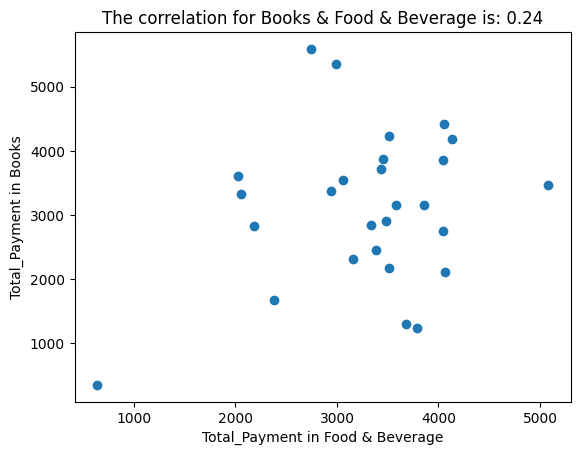

Total Monthly Payment for Toys in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       17561.60
1    2021-02-28       13440.00
2    2021-03-31       13224.96
3    2021-04-30       17776.64
4    2021-05-31       16629.76
5    2021-06-30       15375.36
6    2021-07-31       15733.76
7    2021-08-31       10429.44
8    2021-09-30       19927.04
9    2021-10-31       13977.60
10   2021-11-30       13511.68
11   2021-12-31       14085.12
12   2022-01-31       23296.00
13   2022-02-28       12759.04
14   2022-03-31       17704.96
15   2022-04-30       11898.88
16   2022-05-31       20249.60
17   2022-06-30       14085.12
18   2022-07-31       14837.76
19   2022-08-31       21002.24
20   2022-09-30       16593.92
21   2022-10-31       11432.96
22   2022-11-30       15733.76
23   2022-12-31       14694.40
24   2023-01-31       16880.64
25   2023-02-28       18170.88
26   2023-03-31        2293.76


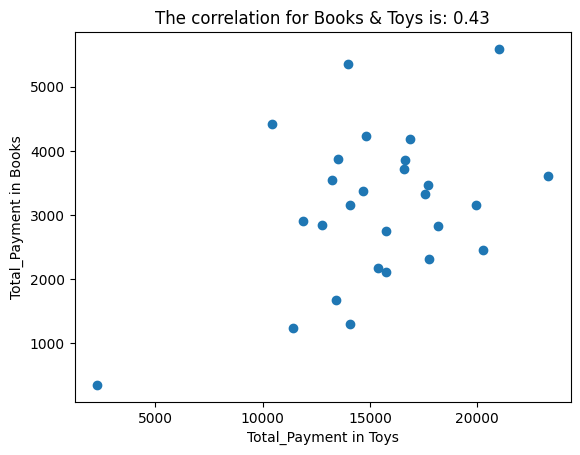

Total Monthly Payment for Technology in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      93267.300
1    2021-02-28     102717.300
2    2021-03-31     149103.675
3    2021-04-30     105867.300
4    2021-05-31      51883.650
5    2021-06-30     105064.575
6    2021-07-31      67633.650
7    2021-08-31      99814.575
8    2021-09-30      79370.025
9    2021-10-31     121556.400
10   2021-11-30     125261.850
11   2021-12-31      99814.575
12   2022-01-31      89870.025
13   2022-02-28      83630.925
14   2022-03-31      71278.200
15   2022-04-30      51636.375
16   2022-05-31      82767.300
17   2022-06-30      85670.025
18   2022-07-31      69980.925
19   2022-08-31      79122.750
20   2022-09-30      88820.025
21   2022-10-31      75725.475
22   2022-11-30     110561.850
23   2022-12-31      81470.025
24   2023-01-31      72822.750
25   2023-02-28      77578.200
26   2023-03-31      23841.825


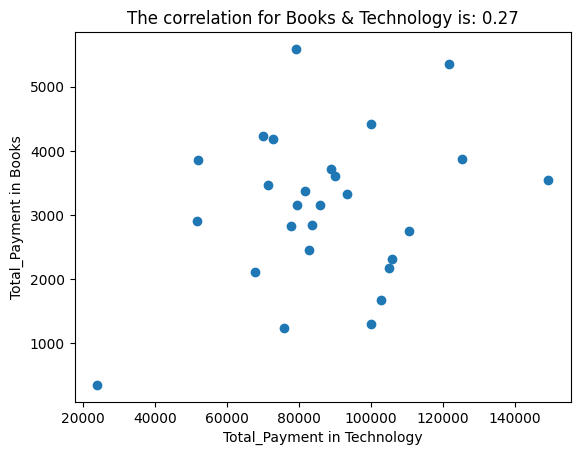

Total Monthly Payment for Souvenir in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2322.54
1    2021-02-28        2756.55
2    2021-03-31        2639.25
3    2021-04-30        3448.62
4    2021-05-31        3530.73
5    2021-06-30        3214.02
6    2021-07-31        1466.25
7    2021-08-31        3366.51
8    2021-09-30        1630.47
9    2021-10-31        1630.47
10   2021-11-30        1947.18
11   2021-12-31        2158.32
12   2022-01-31        2815.20
13   2022-02-28        1184.73
14   2022-03-31        3096.72
15   2022-04-30        1712.58
16   2022-05-31        2803.47
17   2022-06-30        2850.39
18   2022-07-31        2627.52
19   2022-08-31        2768.28
20   2022-09-30        3917.82
21   2022-10-31        3319.59
22   2022-11-30        1454.52
23   2022-12-31        2475.03
24   2023-01-31        2158.32
25   2023-02-28        4070.31
26   2023-03-31         504.39


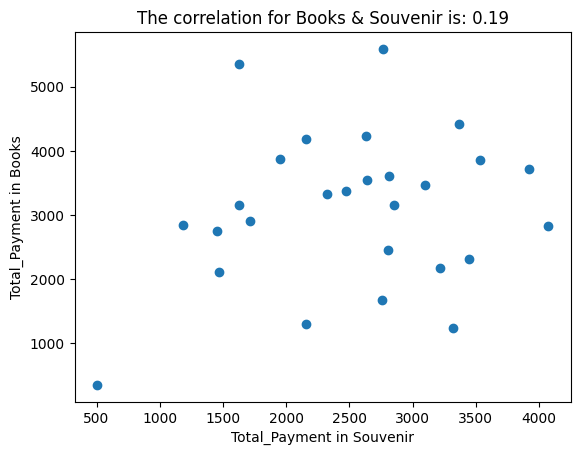

Total Monthly Payment for Cosmetics in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       29112.56
1    2021-02-28       29193.88
2    2021-03-31       17117.86
3    2021-04-30       21997.06
4    2021-05-31       28909.26
5    2021-06-30       24721.28
6    2021-07-31       23745.44
7    2021-08-31       27689.46
8    2021-09-30       27730.12
9    2021-10-31       23704.78
10   2021-11-30       32771.96
11   2021-12-31       34357.70
12   2022-01-31       36309.38
13   2022-02-28       26672.96
14   2022-03-31       23623.46
15   2022-04-30       27038.90
16   2022-05-31       28055.40
17   2022-06-30       21468.48
18   2022-07-31       20167.36
19   2022-08-31       25331.18
20   2022-09-30       30942.26
21   2022-10-31       21956.40
22   2022-11-30       17687.10
23   2022-12-31       23379.50
24   2023-01-31       29803.78
25   2023-02-28       21712.44
26   2023-03-31        5570.42
Total Monthly Payment for Food & Beverage in Metropol AVM Mall
   invoice_d

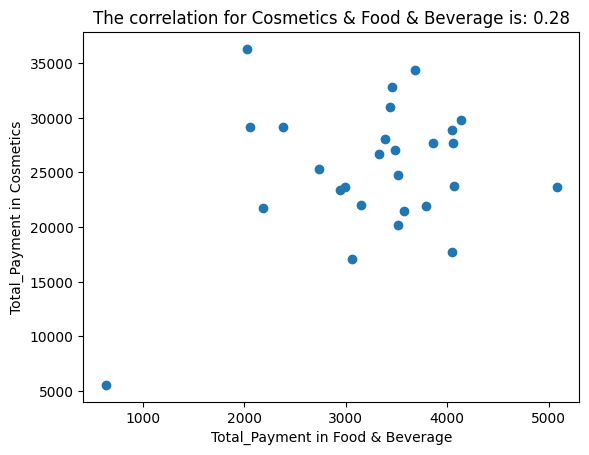

Total Monthly Payment for Toys in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       17561.60
1    2021-02-28       13440.00
2    2021-03-31       13224.96
3    2021-04-30       17776.64
4    2021-05-31       16629.76
5    2021-06-30       15375.36
6    2021-07-31       15733.76
7    2021-08-31       10429.44
8    2021-09-30       19927.04
9    2021-10-31       13977.60
10   2021-11-30       13511.68
11   2021-12-31       14085.12
12   2022-01-31       23296.00
13   2022-02-28       12759.04
14   2022-03-31       17704.96
15   2022-04-30       11898.88
16   2022-05-31       20249.60
17   2022-06-30       14085.12
18   2022-07-31       14837.76
19   2022-08-31       21002.24
20   2022-09-30       16593.92
21   2022-10-31       11432.96
22   2022-11-30       15733.76
23   2022-12-31       14694.40
24   2023-01-31       16880.64
25   2023-02-28       18170.88
26   2023-03-31        2293.76


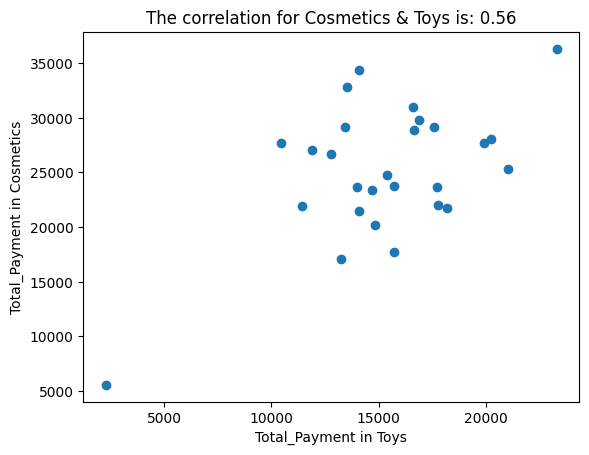

Total Monthly Payment for Technology in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      93267.300
1    2021-02-28     102717.300
2    2021-03-31     149103.675
3    2021-04-30     105867.300
4    2021-05-31      51883.650
5    2021-06-30     105064.575
6    2021-07-31      67633.650
7    2021-08-31      99814.575
8    2021-09-30      79370.025
9    2021-10-31     121556.400
10   2021-11-30     125261.850
11   2021-12-31      99814.575
12   2022-01-31      89870.025
13   2022-02-28      83630.925
14   2022-03-31      71278.200
15   2022-04-30      51636.375
16   2022-05-31      82767.300
17   2022-06-30      85670.025
18   2022-07-31      69980.925
19   2022-08-31      79122.750
20   2022-09-30      88820.025
21   2022-10-31      75725.475
22   2022-11-30     110561.850
23   2022-12-31      81470.025
24   2023-01-31      72822.750
25   2023-02-28      77578.200
26   2023-03-31      23841.825


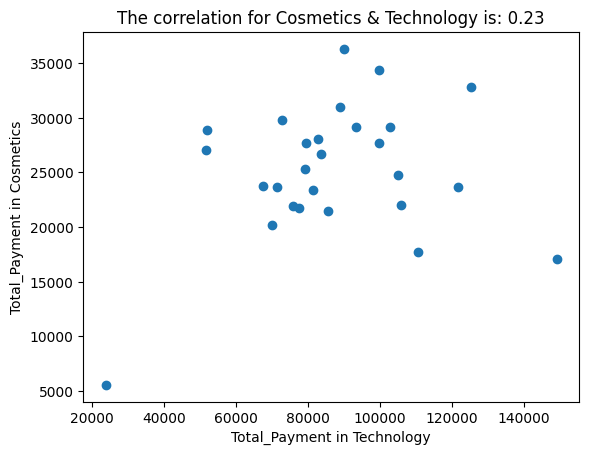

Total Monthly Payment for Souvenir in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2322.54
1    2021-02-28        2756.55
2    2021-03-31        2639.25
3    2021-04-30        3448.62
4    2021-05-31        3530.73
5    2021-06-30        3214.02
6    2021-07-31        1466.25
7    2021-08-31        3366.51
8    2021-09-30        1630.47
9    2021-10-31        1630.47
10   2021-11-30        1947.18
11   2021-12-31        2158.32
12   2022-01-31        2815.20
13   2022-02-28        1184.73
14   2022-03-31        3096.72
15   2022-04-30        1712.58
16   2022-05-31        2803.47
17   2022-06-30        2850.39
18   2022-07-31        2627.52
19   2022-08-31        2768.28
20   2022-09-30        3917.82
21   2022-10-31        3319.59
22   2022-11-30        1454.52
23   2022-12-31        2475.03
24   2023-01-31        2158.32
25   2023-02-28        4070.31
26   2023-03-31         504.39


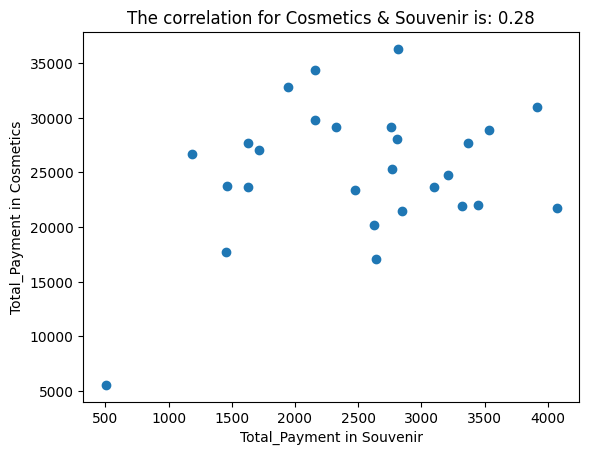

Total Monthly Payment for Food & Beverage in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2055.39
1    2021-02-28        2384.88
2    2021-03-31        3059.55
3    2021-04-30        3153.69
4    2021-05-31        4042.79
5    2021-06-30        3514.56
6    2021-07-31        4068.94
7    2021-08-31        4058.48
8    2021-09-30        3859.74
9    2021-10-31        2991.56
10   2021-11-30        3451.80
11   2021-12-31        3681.92
12   2022-01-31        2029.24
13   2022-02-28        3331.51
14   2022-03-31        5078.33
15   2022-04-30        3483.18
16   2022-05-31        3389.04
17   2022-06-30        3577.32
18   2022-07-31        3514.56
19   2022-08-31        2740.52
20   2022-09-30        3436.11
21   2022-10-31        3786.52
22   2022-11-30        4042.79
23   2022-12-31        2944.49
24   2023-01-31        4136.93
25   2023-02-28        2186.14
26   2023-03-31         638.06
Total Monthly Payment for Toys in Metropol AVM Mall
   invoice_date  

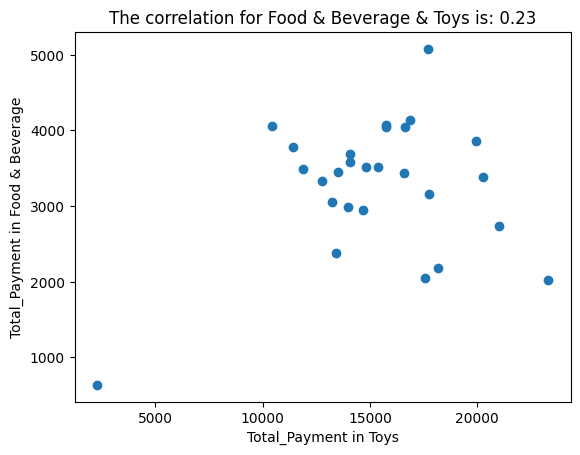

Total Monthly Payment for Technology in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      93267.300
1    2021-02-28     102717.300
2    2021-03-31     149103.675
3    2021-04-30     105867.300
4    2021-05-31      51883.650
5    2021-06-30     105064.575
6    2021-07-31      67633.650
7    2021-08-31      99814.575
8    2021-09-30      79370.025
9    2021-10-31     121556.400
10   2021-11-30     125261.850
11   2021-12-31      99814.575
12   2022-01-31      89870.025
13   2022-02-28      83630.925
14   2022-03-31      71278.200
15   2022-04-30      51636.375
16   2022-05-31      82767.300
17   2022-06-30      85670.025
18   2022-07-31      69980.925
19   2022-08-31      79122.750
20   2022-09-30      88820.025
21   2022-10-31      75725.475
22   2022-11-30     110561.850
23   2022-12-31      81470.025
24   2023-01-31      72822.750
25   2023-02-28      77578.200
26   2023-03-31      23841.825


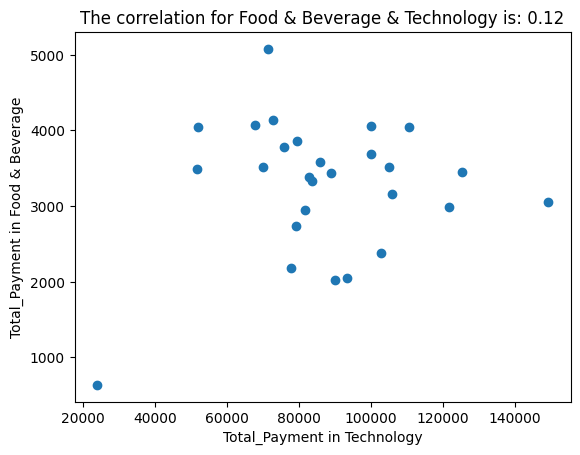

Total Monthly Payment for Souvenir in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2322.54
1    2021-02-28        2756.55
2    2021-03-31        2639.25
3    2021-04-30        3448.62
4    2021-05-31        3530.73
5    2021-06-30        3214.02
6    2021-07-31        1466.25
7    2021-08-31        3366.51
8    2021-09-30        1630.47
9    2021-10-31        1630.47
10   2021-11-30        1947.18
11   2021-12-31        2158.32
12   2022-01-31        2815.20
13   2022-02-28        1184.73
14   2022-03-31        3096.72
15   2022-04-30        1712.58
16   2022-05-31        2803.47
17   2022-06-30        2850.39
18   2022-07-31        2627.52
19   2022-08-31        2768.28
20   2022-09-30        3917.82
21   2022-10-31        3319.59
22   2022-11-30        1454.52
23   2022-12-31        2475.03
24   2023-01-31        2158.32
25   2023-02-28        4070.31
26   2023-03-31         504.39


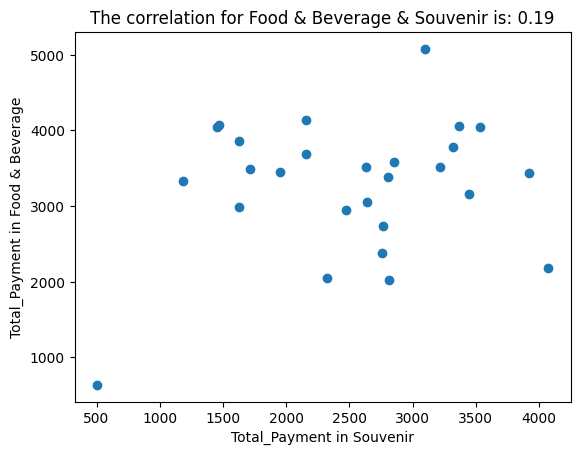

Total Monthly Payment for Toys in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       17561.60
1    2021-02-28       13440.00
2    2021-03-31       13224.96
3    2021-04-30       17776.64
4    2021-05-31       16629.76
5    2021-06-30       15375.36
6    2021-07-31       15733.76
7    2021-08-31       10429.44
8    2021-09-30       19927.04
9    2021-10-31       13977.60
10   2021-11-30       13511.68
11   2021-12-31       14085.12
12   2022-01-31       23296.00
13   2022-02-28       12759.04
14   2022-03-31       17704.96
15   2022-04-30       11898.88
16   2022-05-31       20249.60
17   2022-06-30       14085.12
18   2022-07-31       14837.76
19   2022-08-31       21002.24
20   2022-09-30       16593.92
21   2022-10-31       11432.96
22   2022-11-30       15733.76
23   2022-12-31       14694.40
24   2023-01-31       16880.64
25   2023-02-28       18170.88
26   2023-03-31        2293.76
Total Monthly Payment for Technology in Metropol AVM Mall
   invoice_date  Total

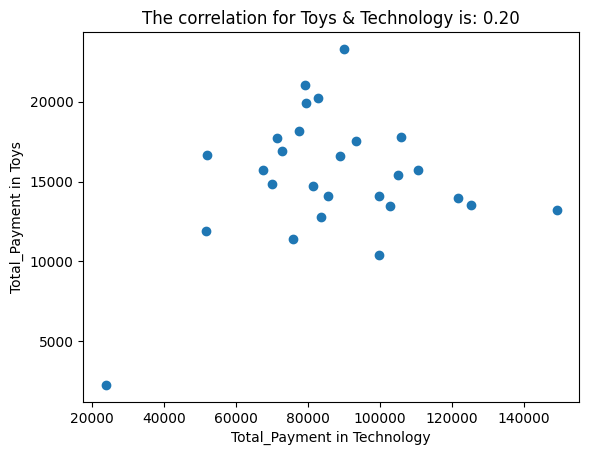

Total Monthly Payment for Souvenir in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2322.54
1    2021-02-28        2756.55
2    2021-03-31        2639.25
3    2021-04-30        3448.62
4    2021-05-31        3530.73
5    2021-06-30        3214.02
6    2021-07-31        1466.25
7    2021-08-31        3366.51
8    2021-09-30        1630.47
9    2021-10-31        1630.47
10   2021-11-30        1947.18
11   2021-12-31        2158.32
12   2022-01-31        2815.20
13   2022-02-28        1184.73
14   2022-03-31        3096.72
15   2022-04-30        1712.58
16   2022-05-31        2803.47
17   2022-06-30        2850.39
18   2022-07-31        2627.52
19   2022-08-31        2768.28
20   2022-09-30        3917.82
21   2022-10-31        3319.59
22   2022-11-30        1454.52
23   2022-12-31        2475.03
24   2023-01-31        2158.32
25   2023-02-28        4070.31
26   2023-03-31         504.39


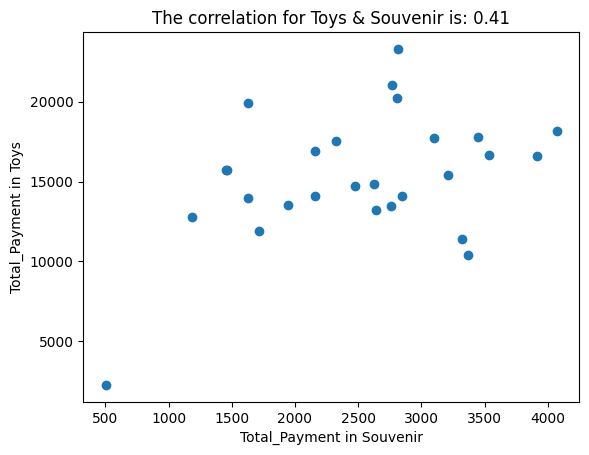

Total Monthly Payment for Technology in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      93267.300
1    2021-02-28     102717.300
2    2021-03-31     149103.675
3    2021-04-30     105867.300
4    2021-05-31      51883.650
5    2021-06-30     105064.575
6    2021-07-31      67633.650
7    2021-08-31      99814.575
8    2021-09-30      79370.025
9    2021-10-31     121556.400
10   2021-11-30     125261.850
11   2021-12-31      99814.575
12   2022-01-31      89870.025
13   2022-02-28      83630.925
14   2022-03-31      71278.200
15   2022-04-30      51636.375
16   2022-05-31      82767.300
17   2022-06-30      85670.025
18   2022-07-31      69980.925
19   2022-08-31      79122.750
20   2022-09-30      88820.025
21   2022-10-31      75725.475
22   2022-11-30     110561.850
23   2022-12-31      81470.025
24   2023-01-31      72822.750
25   2023-02-28      77578.200
26   2023-03-31      23841.825
Total Monthly Payment for Souvenir in Metropol AVM Mall
   invoice_date  T

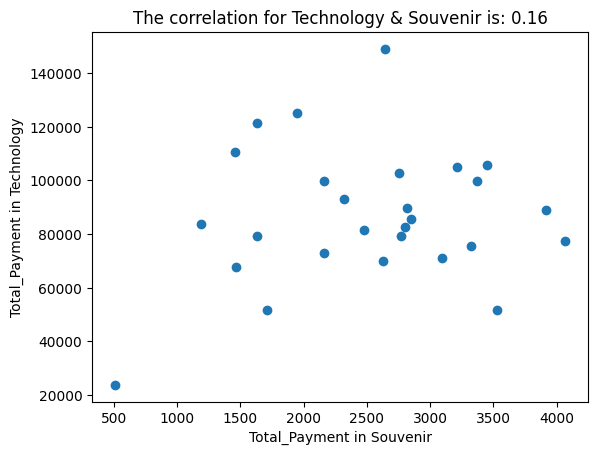

Total Monthly Payment for Souvenir in Metropol AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2322.54
1    2021-02-28        2756.55
2    2021-03-31        2639.25
3    2021-04-30        3448.62
4    2021-05-31        3530.73
5    2021-06-30        3214.02
6    2021-07-31        1466.25
7    2021-08-31        3366.51
8    2021-09-30        1630.47
9    2021-10-31        1630.47
10   2021-11-30        1947.18
11   2021-12-31        2158.32
12   2022-01-31        2815.20
13   2022-02-28        1184.73
14   2022-03-31        3096.72
15   2022-04-30        1712.58
16   2022-05-31        2803.47
17   2022-06-30        2850.39
18   2022-07-31        2627.52
19   2022-08-31        2768.28
20   2022-09-30        3917.82
21   2022-10-31        3319.59
22   2022-11-30        1454.52
23   2022-12-31        2475.03
24   2023-01-31        2158.32
25   2023-02-28        4070.31
26   2023-03-31         504.39


In [59]:
# creating an empty dictionary to store the correlation values
correlation_dict_Metropol_AVM = {}

categories = df['category'].unique()
for i, category_i in enumerate(categories):
    filtered_df_i = df[(df['category'] == category_i) & (df['shopping_mall'] == 'Metropol AVM')]

    result_df_i = filtered_df_i.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

    result_df_i = result_df_i.reset_index()

    result_df_i = result_df_i.rename(columns={'Total_Payment': 'Total_Payment'})

    print('Total Monthly Payment for', category_i, 'in Metropol AVM Mall')
    print(result_df_i)

    for j in range(i + 1, len(categories)):
        category_j = categories[j]
        filtered_df_j = df[(df['category'] == category_j) & (df['shopping_mall'] == 'Metropol AVM')]

        result_df_j = filtered_df_j.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

        result_df_j = result_df_j.reset_index()

        result_df_j = result_df_j.rename(columns={'Total_Payment': 'Total_Payment'})

        print('Total Monthly Payment for', category_j, 'in Metropol AVM Mall')
        print(result_df_j)

        correlation_key = f'The correlation for {category_i} & {category_j} is'
        correlation_value = result_df_i['Total_Payment'].corr(result_df_j['Total_Payment'])
        correlation_dict_Metropol_AVM[correlation_key] = correlation_value

        plt.scatter(result_df_j['Total_Payment'], result_df_i['Total_Payment'])
        plt.xlabel(f'Total_Payment in {category_j}')
        plt.ylabel(f'Total_Payment in {category_i}')
        plt.title(f'{correlation_key}: {correlation_value:.2f}')
        plt.show()



In [60]:
correlation_dict_Metropol_AVM

{'The correlation for Clothing & Shoes is': 0.49042040654830826,
 'The correlation for Clothing & Books is': 0.35980739640333037,
 'The correlation for Clothing & Cosmetics is': 0.5350979781967146,
 'The correlation for Clothing & Food & Beverage is': 0.7197522148842125,
 'The correlation for Clothing & Toys is': 0.5153292857923887,
 'The correlation for Clothing & Technology is': 0.3722710085890232,
 'The correlation for Clothing & Souvenir is': 0.46202257118188905,
 'The correlation for Shoes & Books is': 0.43981732701424664,
 'The correlation for Shoes & Cosmetics is': 0.33659187621556397,
 'The correlation for Shoes & Food & Beverage is': 0.6435208707961968,
 'The correlation for Shoes & Toys is': 0.44268177508299994,
 'The correlation for Shoes & Technology is': -0.049766788679319815,
 'The correlation for Shoes & Souvenir is': 0.2443033707934291,
 'The correlation for Books & Cosmetics is': 0.2971665316798064,
 'The correlation for Books & Food & Beverage is': 0.23937857938953094

In [61]:
# Create a new dictionary with correlations >= 0.65
filtered_correlation_dict_Metropol_AVM_Mall = {key: value for key, value in correlation_dict_Metropol_AVM.items() if value >= 0.65}

# Print the filtered dictionary
print(filtered_correlation_dict_Metropol_AVM_Mall)

{'The correlation for Clothing & Food & Beverage is': 0.7197522148842125}


In [62]:
table_Metropol_AVM = {
    'city': ['Istanbull'],
    'mall': ['Metropol AVM'],
    'correlation': [0.7197522148842125],
    'item1': ['Clothing'],
    'item2': ['Food & Beverage']
}
# Creating a DataFrame from the data
table_Metropol_AVM = pd.DataFrame(table_Metropol_AVM)
correlation_table = pd.concat([correlation_table, table_Metropol_AVM], ignore_index=True)
correlation_table

,city,mall,correlation,item1,item2
0,Istanbull,Forum istanbul Mall,0.697743,Cosmetics,Toys
1,Istanbull,Kanyon Mall,0.668588,Clothing,Shoes
2,Istanbull,Kanyon Mall,0.747761,Cosmetics,Technology
3,Istanbull,Metrocity Mall,0.744072,Clothing,Toys
4,Istanbull,Metrocity Mall,0.676121,Shoes,Cosmetics
5,Istanbull,Metrocity Mall,0.708054,Cosmetics,Toys
6,Istanbull,Metrocity Mall,0.668409,Cosmetics,Technology
7,Istanbull,Metropol AVM,0.719752,Clothing,Food & Beverage


## Correlation between Different Categories for Istinye_Park_Mall

Total Monthly Payment for Clothing in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31     390160.135
1    2021-02-28     374883.710
2    2021-03-31     388605.250
3    2021-04-30     386286.750
4    2021-05-31     391088.030
5    2021-06-30     326570.830
6    2021-07-31     519768.690
7    2021-08-31     343402.140
8    2021-09-30     407292.350
9    2021-10-31     384349.645
10   2021-11-30     504737.035
11   2021-12-31     340673.765
12   2022-01-31     498735.435
13   2022-02-28     380148.525
14   2022-03-31     432717.835
15   2022-04-30     307638.135
16   2022-05-31     478875.670
17   2022-06-30     410238.665
18   2022-07-31     404700.600
19   2022-08-31     379248.285
20   2022-09-30     383995.080
21   2022-10-31     464226.235
22   2022-11-30     375129.305
23   2022-12-31     429280.330
24   2023-01-31     413293.950
25   2023-02-28     386259.095
26   2023-03-31      95698.690
Total Monthly Payment for Shoes in Istinye Park Mall
   invoice_date  Total_

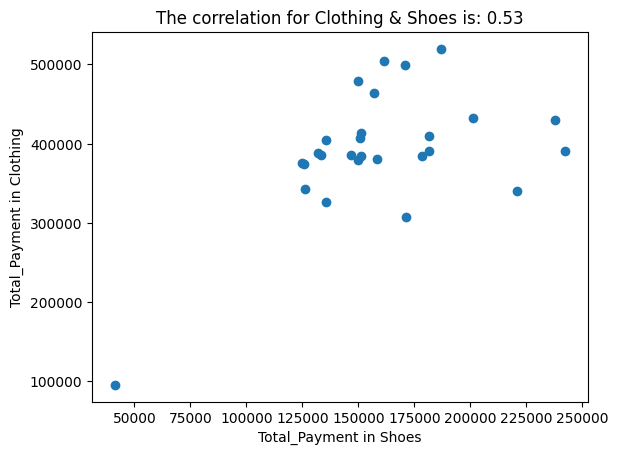

Total Monthly Payment for Books in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        2424.00
1    2021-02-28        3045.15
2    2021-03-31        4029.90
3    2021-04-30        4226.85
4    2021-05-31        1393.80
5    2021-06-30        1605.90
6    2021-07-31        2469.45
7    2021-08-31        2333.10
8    2021-09-30        1181.70
9    2021-10-31        4302.60
10   2021-11-30        3514.80
11   2021-12-31        3711.75
12   2022-01-31        1575.60
13   2022-02-28        2817.90
14   2022-03-31        2484.60
15   2022-04-30        4681.35
16   2022-05-31        3242.10
17   2022-06-30        2893.65
18   2022-07-31        4423.80
19   2022-08-31        3408.75
20   2022-09-30        2969.40
21   2022-10-31        2439.15
22   2022-11-30        1742.25
23   2022-12-31        2545.20
24   2023-01-31        3014.85
25   2023-02-28        3105.75
26   2023-03-31         499.95


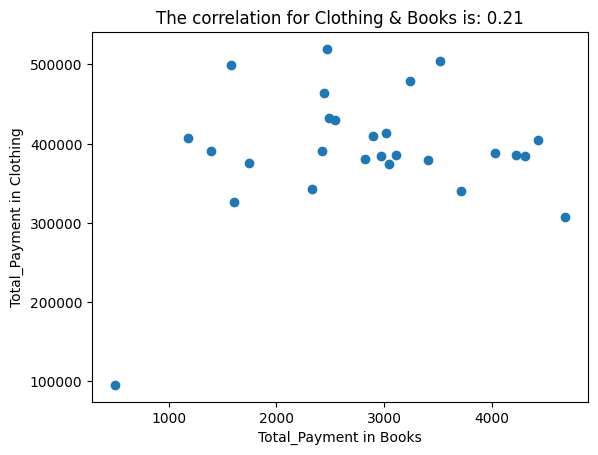

Total Monthly Payment for Cosmetics in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31       24192.70
1    2021-02-28       25168.54
2    2021-03-31       21997.06
3    2021-04-30       20289.34
4    2021-05-31       28218.04
5    2021-06-30       20411.32
6    2021-07-31       26672.96
7    2021-08-31       28177.38
8    2021-09-30       20939.90
9    2021-10-31       24965.24
10   2021-11-30       28502.66
11   2021-12-31       25168.54
12   2022-01-31       22647.62
13   2022-02-28       23867.42
14   2022-03-31       28218.04
15   2022-04-30       22200.36
16   2022-05-31       26957.58
17   2022-06-30       20289.34
18   2022-07-31       26185.04
19   2022-08-31       28827.94
20   2022-09-30       23867.42
21   2022-10-31       27933.42
22   2022-11-30       30779.62
23   2022-12-31       18540.96
24   2023-01-31       25087.22
25   2023-02-28       25819.10
26   2023-03-31        9433.12


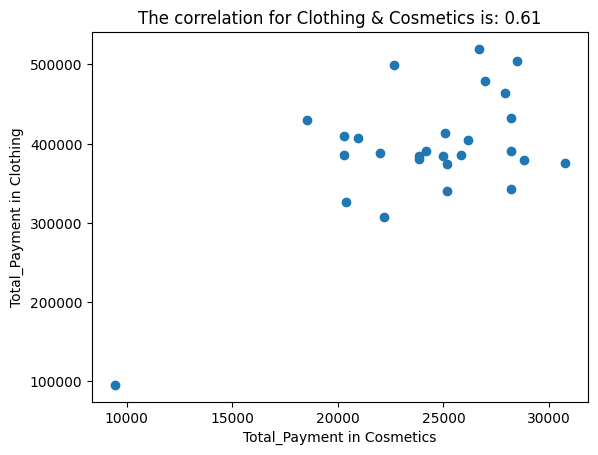

Total Monthly Payment for Food & Beverage in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3174.61
1    2021-02-28        2609.77
2    2021-03-31        2740.52
3    2021-04-30        3216.45
4    2021-05-31        2688.22
5    2021-06-30        4283.37
6    2021-07-31        3300.13
7    2021-08-31        2662.07
8    2021-09-30        3117.08
9    2021-10-31        3179.84
10   2021-11-30        3718.53
11   2021-12-31        4597.17
12   2022-01-31        3483.18
13   2022-02-28        3111.85
14   2022-03-31        3885.89
15   2022-04-30        2923.57
16   2022-05-31        3985.26
17   2022-06-30        3451.80
18   2022-07-31        3101.39
19   2022-08-31        2928.80
20   2022-09-30        2646.38
21   2022-10-31        2913.11
22   2022-11-30        3002.02
23   2022-12-31        3279.21
24   2023-01-31        3708.07
25   2023-02-28        3326.28
26   2023-03-31         883.87


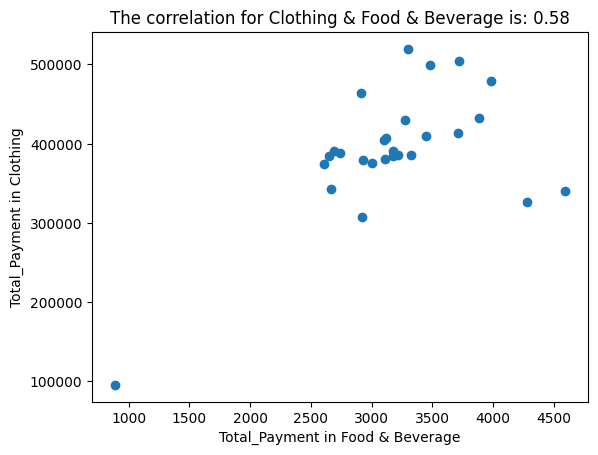

Total Monthly Payment for Toys in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31       11683.84
1    2021-02-28       13081.60
2    2021-03-31       19138.56
3    2021-04-30       10572.80
4    2021-05-31       15124.48
5    2021-06-30       14120.96
6    2021-07-31       11934.72
7    2021-08-31       13977.60
8    2021-09-30       13404.16
9    2021-10-31       13189.12
10   2021-11-30       12113.92
11   2021-12-31       19783.68
12   2022-01-31       19174.40
13   2022-02-28       16092.16
14   2022-03-31       21826.56
15   2022-04-30       12472.32
16   2022-05-31       19712.00
17   2022-06-30        9175.04
18   2022-07-31       14407.68
19   2022-08-31       19281.92
20   2022-09-30       15912.96
21   2022-10-31       17633.28
22   2022-11-30       20142.08
23   2022-12-31       16988.16
24   2023-01-31       15375.36
25   2023-02-28       12149.76
26   2023-03-31        1792.00


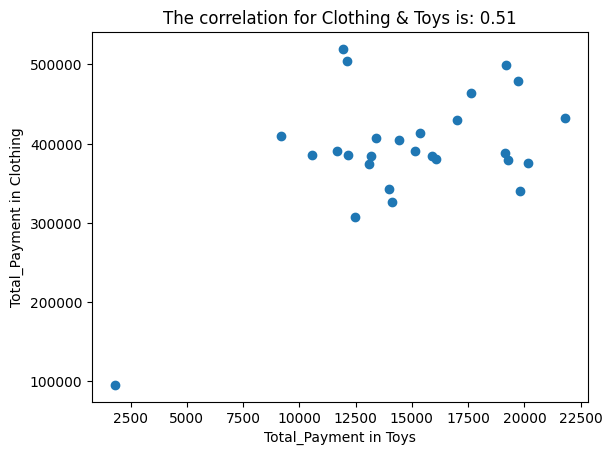

Total Monthly Payment for Technology in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31      68436.375
1    2021-02-28      62878.200
2    2021-03-31      82520.025
3    2021-04-30      96170.025
4    2021-05-31      81470.025
5    2021-06-30     126867.300
6    2021-07-31     126806.400
7    2021-08-31     116614.575
8    2021-09-30      61025.475
9    2021-10-31      96170.025
10   2021-11-30      85175.475
11   2021-12-31      89067.300
12   2022-01-31      84372.750
13   2022-02-28      95922.750
14   2022-03-31     113711.850
15   2022-04-30      92772.750
16   2022-05-31     114514.575
17   2022-06-30      58678.200
18   2022-07-31      82272.750
19   2022-08-31     112909.125
20   2022-09-30      89870.025
21   2022-10-31     114761.850
22   2022-11-30      74675.475
23   2022-12-31      85917.300
24   2023-01-31      80975.475
25   2023-02-28      84372.750
26   2023-03-31      39283.650


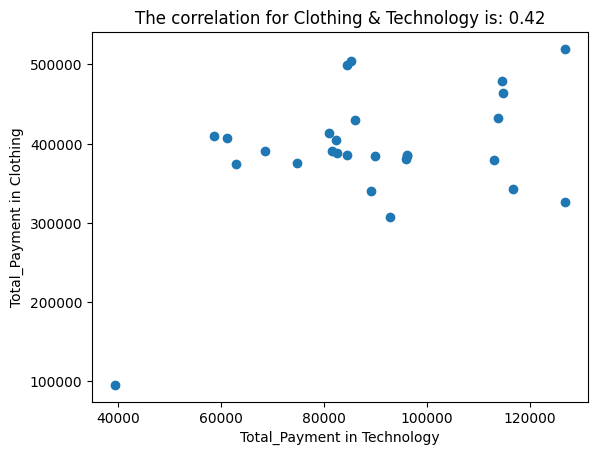

Total Monthly Payment for Souvenir in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3401.70
1    2021-02-28        1724.31
2    2021-03-31        3777.06
3    2021-04-30        2041.02
4    2021-05-31        2580.60
5    2021-06-30        1876.80
6    2021-07-31        4457.40
7    2021-08-31        2404.65
8    2021-09-30        3718.41
9    2021-10-31        2486.76
10   2021-11-30        1466.25
11   2021-12-31        3472.08
12   2022-01-31        3953.01
13   2022-02-28        2193.51
14   2022-03-31        3835.71
15   2022-04-30        2662.71
16   2022-05-31        1994.10
17   2022-06-30        1618.74
18   2022-07-31        2392.92
19   2022-08-31        1712.58
20   2022-09-30        2087.94
21   2022-10-31        2545.41
22   2022-11-30        1853.34
23   2022-12-31        3331.32
24   2023-01-31        2240.43
25   2023-02-28        2592.33
26   2023-03-31         504.39


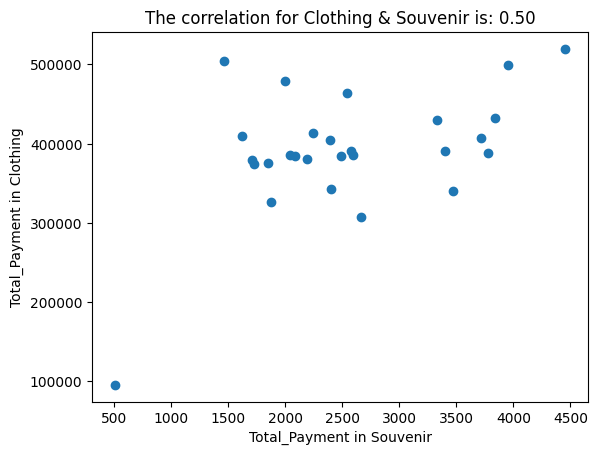

Total Monthly Payment for Shoes in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31     242413.335
1    2021-02-28     125871.540
2    2021-03-31     132091.620
3    2021-04-30     133073.580
4    2021-05-31     181468.970
5    2021-06-30     135528.855
6    2021-07-31     186761.310
7    2021-08-31     126035.325
8    2021-09-30     150478.510
9    2021-10-31     178577.310
10   2021-11-30     161336.165
11   2021-12-31     220916.405
12   2022-01-31     170720.505
13   2022-02-28     158171.530
14   2022-03-31     201274.580
15   2022-04-30     171375.270
16   2022-05-31     149769.150
17   2022-06-30     181632.755
18   2022-07-31     135638.045
19   2022-08-31     149769.150
20   2022-09-30     150969.490
21   2022-10-31     157025.785
22   2022-11-30     124889.580
23   2022-12-31     237557.380
24   2023-01-31     151024.085
25   2023-02-28     146822.895
26   2023-03-31      41138.755
Total Monthly Payment for Books in Istinye Park Mall
   invoice_date  Total_Pay

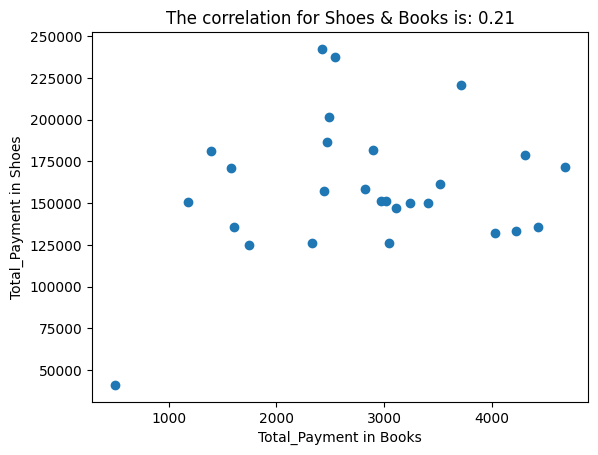

Total Monthly Payment for Cosmetics in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31       24192.70
1    2021-02-28       25168.54
2    2021-03-31       21997.06
3    2021-04-30       20289.34
4    2021-05-31       28218.04
5    2021-06-30       20411.32
6    2021-07-31       26672.96
7    2021-08-31       28177.38
8    2021-09-30       20939.90
9    2021-10-31       24965.24
10   2021-11-30       28502.66
11   2021-12-31       25168.54
12   2022-01-31       22647.62
13   2022-02-28       23867.42
14   2022-03-31       28218.04
15   2022-04-30       22200.36
16   2022-05-31       26957.58
17   2022-06-30       20289.34
18   2022-07-31       26185.04
19   2022-08-31       28827.94
20   2022-09-30       23867.42
21   2022-10-31       27933.42
22   2022-11-30       30779.62
23   2022-12-31       18540.96
24   2023-01-31       25087.22
25   2023-02-28       25819.10
26   2023-03-31        9433.12


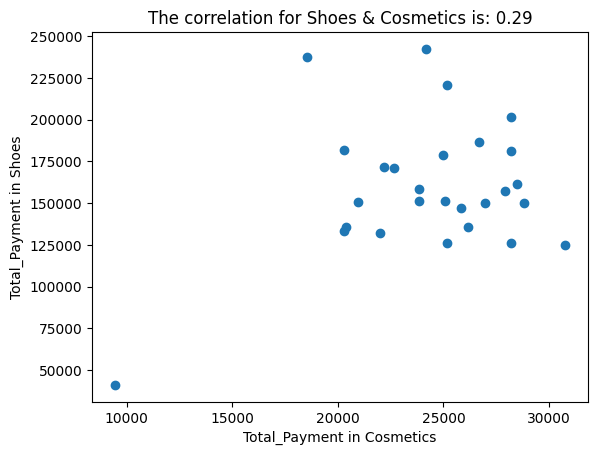

Total Monthly Payment for Food & Beverage in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3174.61
1    2021-02-28        2609.77
2    2021-03-31        2740.52
3    2021-04-30        3216.45
4    2021-05-31        2688.22
5    2021-06-30        4283.37
6    2021-07-31        3300.13
7    2021-08-31        2662.07
8    2021-09-30        3117.08
9    2021-10-31        3179.84
10   2021-11-30        3718.53
11   2021-12-31        4597.17
12   2022-01-31        3483.18
13   2022-02-28        3111.85
14   2022-03-31        3885.89
15   2022-04-30        2923.57
16   2022-05-31        3985.26
17   2022-06-30        3451.80
18   2022-07-31        3101.39
19   2022-08-31        2928.80
20   2022-09-30        2646.38
21   2022-10-31        2913.11
22   2022-11-30        3002.02
23   2022-12-31        3279.21
24   2023-01-31        3708.07
25   2023-02-28        3326.28
26   2023-03-31         883.87


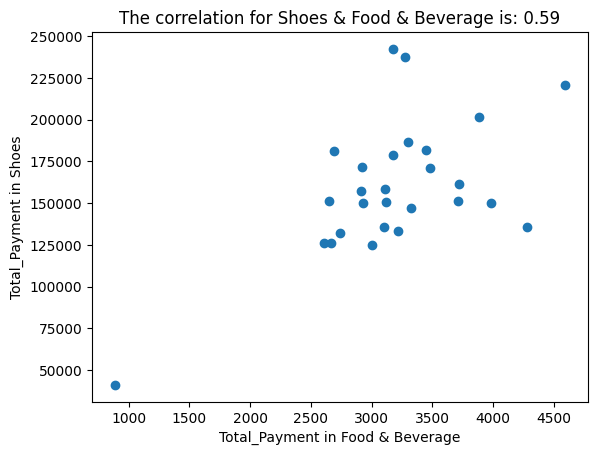

Total Monthly Payment for Toys in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31       11683.84
1    2021-02-28       13081.60
2    2021-03-31       19138.56
3    2021-04-30       10572.80
4    2021-05-31       15124.48
5    2021-06-30       14120.96
6    2021-07-31       11934.72
7    2021-08-31       13977.60
8    2021-09-30       13404.16
9    2021-10-31       13189.12
10   2021-11-30       12113.92
11   2021-12-31       19783.68
12   2022-01-31       19174.40
13   2022-02-28       16092.16
14   2022-03-31       21826.56
15   2022-04-30       12472.32
16   2022-05-31       19712.00
17   2022-06-30        9175.04
18   2022-07-31       14407.68
19   2022-08-31       19281.92
20   2022-09-30       15912.96
21   2022-10-31       17633.28
22   2022-11-30       20142.08
23   2022-12-31       16988.16
24   2023-01-31       15375.36
25   2023-02-28       12149.76
26   2023-03-31        1792.00


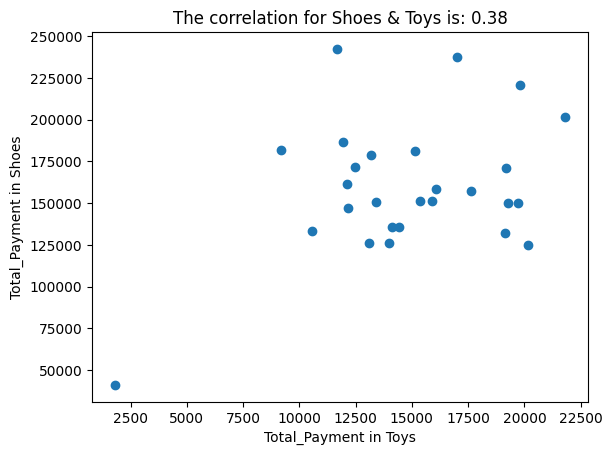

Total Monthly Payment for Technology in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31      68436.375
1    2021-02-28      62878.200
2    2021-03-31      82520.025
3    2021-04-30      96170.025
4    2021-05-31      81470.025
5    2021-06-30     126867.300
6    2021-07-31     126806.400
7    2021-08-31     116614.575
8    2021-09-30      61025.475
9    2021-10-31      96170.025
10   2021-11-30      85175.475
11   2021-12-31      89067.300
12   2022-01-31      84372.750
13   2022-02-28      95922.750
14   2022-03-31     113711.850
15   2022-04-30      92772.750
16   2022-05-31     114514.575
17   2022-06-30      58678.200
18   2022-07-31      82272.750
19   2022-08-31     112909.125
20   2022-09-30      89870.025
21   2022-10-31     114761.850
22   2022-11-30      74675.475
23   2022-12-31      85917.300
24   2023-01-31      80975.475
25   2023-02-28      84372.750
26   2023-03-31      39283.650


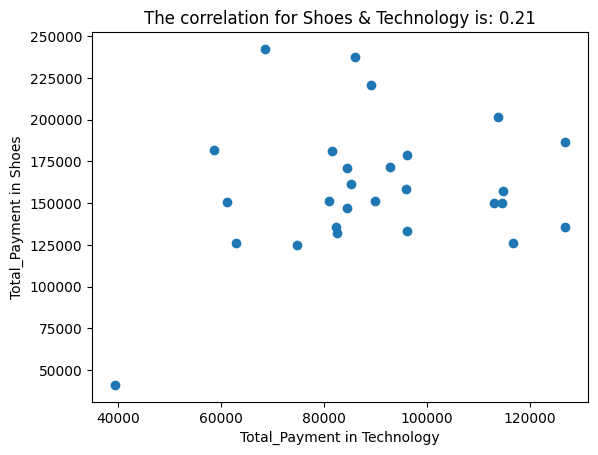

Total Monthly Payment for Souvenir in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3401.70
1    2021-02-28        1724.31
2    2021-03-31        3777.06
3    2021-04-30        2041.02
4    2021-05-31        2580.60
5    2021-06-30        1876.80
6    2021-07-31        4457.40
7    2021-08-31        2404.65
8    2021-09-30        3718.41
9    2021-10-31        2486.76
10   2021-11-30        1466.25
11   2021-12-31        3472.08
12   2022-01-31        3953.01
13   2022-02-28        2193.51
14   2022-03-31        3835.71
15   2022-04-30        2662.71
16   2022-05-31        1994.10
17   2022-06-30        1618.74
18   2022-07-31        2392.92
19   2022-08-31        1712.58
20   2022-09-30        2087.94
21   2022-10-31        2545.41
22   2022-11-30        1853.34
23   2022-12-31        3331.32
24   2023-01-31        2240.43
25   2023-02-28        2592.33
26   2023-03-31         504.39


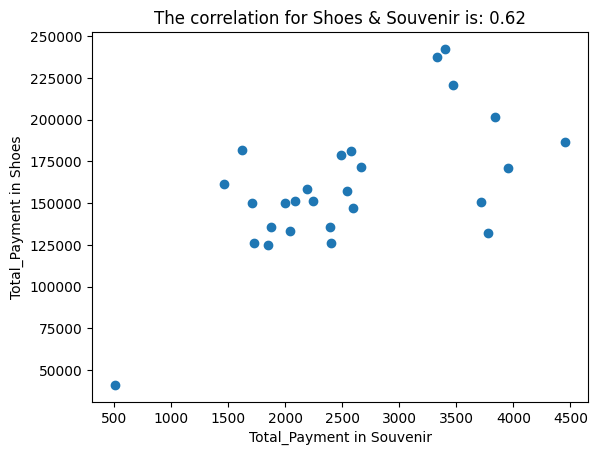

Total Monthly Payment for Books in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        2424.00
1    2021-02-28        3045.15
2    2021-03-31        4029.90
3    2021-04-30        4226.85
4    2021-05-31        1393.80
5    2021-06-30        1605.90
6    2021-07-31        2469.45
7    2021-08-31        2333.10
8    2021-09-30        1181.70
9    2021-10-31        4302.60
10   2021-11-30        3514.80
11   2021-12-31        3711.75
12   2022-01-31        1575.60
13   2022-02-28        2817.90
14   2022-03-31        2484.60
15   2022-04-30        4681.35
16   2022-05-31        3242.10
17   2022-06-30        2893.65
18   2022-07-31        4423.80
19   2022-08-31        3408.75
20   2022-09-30        2969.40
21   2022-10-31        2439.15
22   2022-11-30        1742.25
23   2022-12-31        2545.20
24   2023-01-31        3014.85
25   2023-02-28        3105.75
26   2023-03-31         499.95
Total Monthly Payment for Cosmetics in Istinye Park Mall
   invoice_date  Total

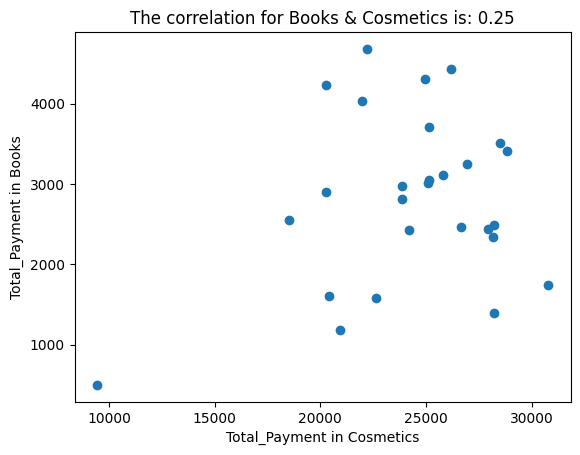

Total Monthly Payment for Food & Beverage in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3174.61
1    2021-02-28        2609.77
2    2021-03-31        2740.52
3    2021-04-30        3216.45
4    2021-05-31        2688.22
5    2021-06-30        4283.37
6    2021-07-31        3300.13
7    2021-08-31        2662.07
8    2021-09-30        3117.08
9    2021-10-31        3179.84
10   2021-11-30        3718.53
11   2021-12-31        4597.17
12   2022-01-31        3483.18
13   2022-02-28        3111.85
14   2022-03-31        3885.89
15   2022-04-30        2923.57
16   2022-05-31        3985.26
17   2022-06-30        3451.80
18   2022-07-31        3101.39
19   2022-08-31        2928.80
20   2022-09-30        2646.38
21   2022-10-31        2913.11
22   2022-11-30        3002.02
23   2022-12-31        3279.21
24   2023-01-31        3708.07
25   2023-02-28        3326.28
26   2023-03-31         883.87


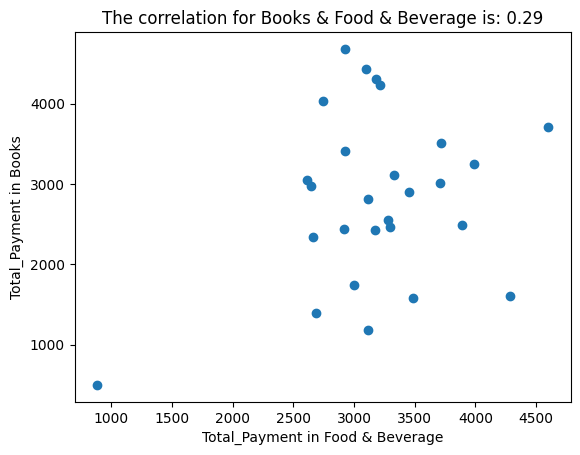

Total Monthly Payment for Toys in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31       11683.84
1    2021-02-28       13081.60
2    2021-03-31       19138.56
3    2021-04-30       10572.80
4    2021-05-31       15124.48
5    2021-06-30       14120.96
6    2021-07-31       11934.72
7    2021-08-31       13977.60
8    2021-09-30       13404.16
9    2021-10-31       13189.12
10   2021-11-30       12113.92
11   2021-12-31       19783.68
12   2022-01-31       19174.40
13   2022-02-28       16092.16
14   2022-03-31       21826.56
15   2022-04-30       12472.32
16   2022-05-31       19712.00
17   2022-06-30        9175.04
18   2022-07-31       14407.68
19   2022-08-31       19281.92
20   2022-09-30       15912.96
21   2022-10-31       17633.28
22   2022-11-30       20142.08
23   2022-12-31       16988.16
24   2023-01-31       15375.36
25   2023-02-28       12149.76
26   2023-03-31        1792.00


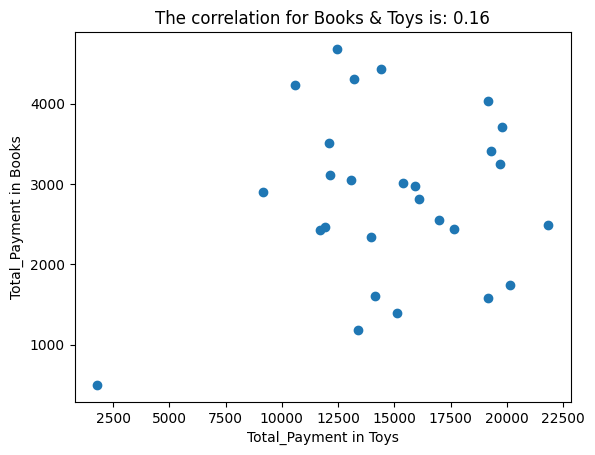

Total Monthly Payment for Technology in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31      68436.375
1    2021-02-28      62878.200
2    2021-03-31      82520.025
3    2021-04-30      96170.025
4    2021-05-31      81470.025
5    2021-06-30     126867.300
6    2021-07-31     126806.400
7    2021-08-31     116614.575
8    2021-09-30      61025.475
9    2021-10-31      96170.025
10   2021-11-30      85175.475
11   2021-12-31      89067.300
12   2022-01-31      84372.750
13   2022-02-28      95922.750
14   2022-03-31     113711.850
15   2022-04-30      92772.750
16   2022-05-31     114514.575
17   2022-06-30      58678.200
18   2022-07-31      82272.750
19   2022-08-31     112909.125
20   2022-09-30      89870.025
21   2022-10-31     114761.850
22   2022-11-30      74675.475
23   2022-12-31      85917.300
24   2023-01-31      80975.475
25   2023-02-28      84372.750
26   2023-03-31      39283.650


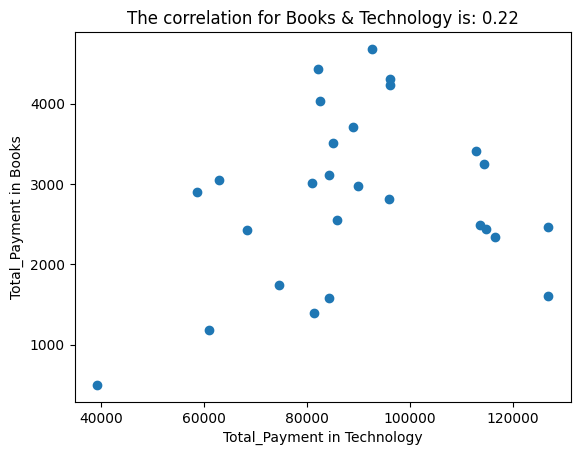

Total Monthly Payment for Souvenir in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3401.70
1    2021-02-28        1724.31
2    2021-03-31        3777.06
3    2021-04-30        2041.02
4    2021-05-31        2580.60
5    2021-06-30        1876.80
6    2021-07-31        4457.40
7    2021-08-31        2404.65
8    2021-09-30        3718.41
9    2021-10-31        2486.76
10   2021-11-30        1466.25
11   2021-12-31        3472.08
12   2022-01-31        3953.01
13   2022-02-28        2193.51
14   2022-03-31        3835.71
15   2022-04-30        2662.71
16   2022-05-31        1994.10
17   2022-06-30        1618.74
18   2022-07-31        2392.92
19   2022-08-31        1712.58
20   2022-09-30        2087.94
21   2022-10-31        2545.41
22   2022-11-30        1853.34
23   2022-12-31        3331.32
24   2023-01-31        2240.43
25   2023-02-28        2592.33
26   2023-03-31         504.39


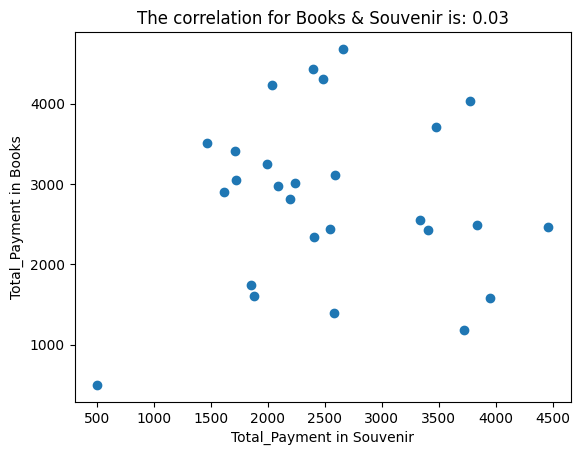

Total Monthly Payment for Cosmetics in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31       24192.70
1    2021-02-28       25168.54
2    2021-03-31       21997.06
3    2021-04-30       20289.34
4    2021-05-31       28218.04
5    2021-06-30       20411.32
6    2021-07-31       26672.96
7    2021-08-31       28177.38
8    2021-09-30       20939.90
9    2021-10-31       24965.24
10   2021-11-30       28502.66
11   2021-12-31       25168.54
12   2022-01-31       22647.62
13   2022-02-28       23867.42
14   2022-03-31       28218.04
15   2022-04-30       22200.36
16   2022-05-31       26957.58
17   2022-06-30       20289.34
18   2022-07-31       26185.04
19   2022-08-31       28827.94
20   2022-09-30       23867.42
21   2022-10-31       27933.42
22   2022-11-30       30779.62
23   2022-12-31       18540.96
24   2023-01-31       25087.22
25   2023-02-28       25819.10
26   2023-03-31        9433.12
Total Monthly Payment for Food & Beverage in Istinye Park Mall
   invoice_d

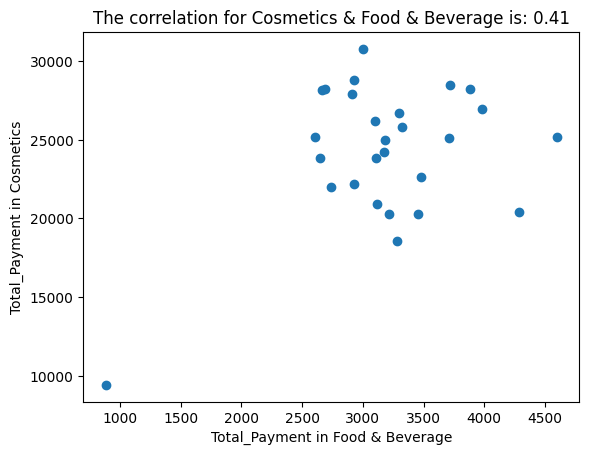

Total Monthly Payment for Toys in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31       11683.84
1    2021-02-28       13081.60
2    2021-03-31       19138.56
3    2021-04-30       10572.80
4    2021-05-31       15124.48
5    2021-06-30       14120.96
6    2021-07-31       11934.72
7    2021-08-31       13977.60
8    2021-09-30       13404.16
9    2021-10-31       13189.12
10   2021-11-30       12113.92
11   2021-12-31       19783.68
12   2022-01-31       19174.40
13   2022-02-28       16092.16
14   2022-03-31       21826.56
15   2022-04-30       12472.32
16   2022-05-31       19712.00
17   2022-06-30        9175.04
18   2022-07-31       14407.68
19   2022-08-31       19281.92
20   2022-09-30       15912.96
21   2022-10-31       17633.28
22   2022-11-30       20142.08
23   2022-12-31       16988.16
24   2023-01-31       15375.36
25   2023-02-28       12149.76
26   2023-03-31        1792.00


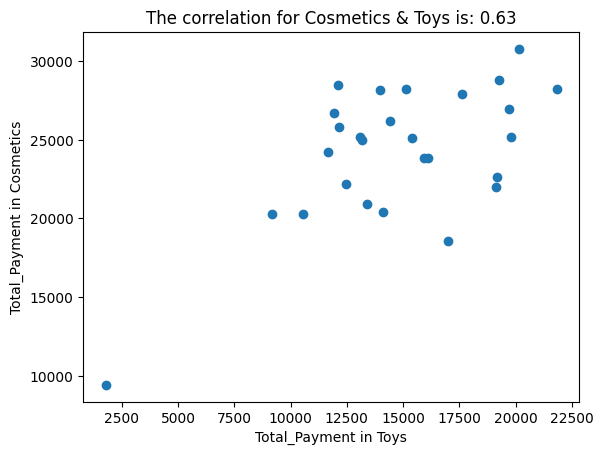

Total Monthly Payment for Technology in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31      68436.375
1    2021-02-28      62878.200
2    2021-03-31      82520.025
3    2021-04-30      96170.025
4    2021-05-31      81470.025
5    2021-06-30     126867.300
6    2021-07-31     126806.400
7    2021-08-31     116614.575
8    2021-09-30      61025.475
9    2021-10-31      96170.025
10   2021-11-30      85175.475
11   2021-12-31      89067.300
12   2022-01-31      84372.750
13   2022-02-28      95922.750
14   2022-03-31     113711.850
15   2022-04-30      92772.750
16   2022-05-31     114514.575
17   2022-06-30      58678.200
18   2022-07-31      82272.750
19   2022-08-31     112909.125
20   2022-09-30      89870.025
21   2022-10-31     114761.850
22   2022-11-30      74675.475
23   2022-12-31      85917.300
24   2023-01-31      80975.475
25   2023-02-28      84372.750
26   2023-03-31      39283.650


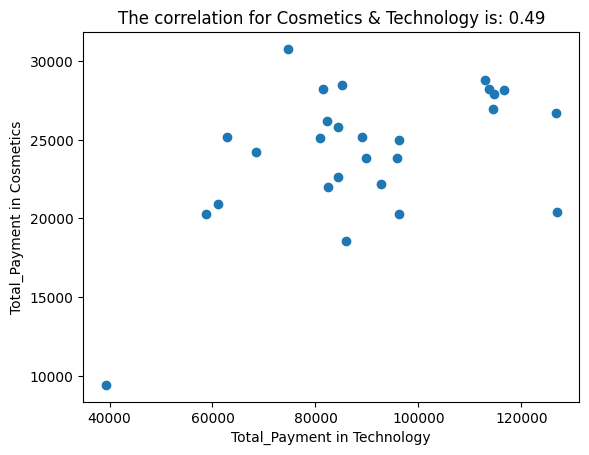

Total Monthly Payment for Souvenir in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3401.70
1    2021-02-28        1724.31
2    2021-03-31        3777.06
3    2021-04-30        2041.02
4    2021-05-31        2580.60
5    2021-06-30        1876.80
6    2021-07-31        4457.40
7    2021-08-31        2404.65
8    2021-09-30        3718.41
9    2021-10-31        2486.76
10   2021-11-30        1466.25
11   2021-12-31        3472.08
12   2022-01-31        3953.01
13   2022-02-28        2193.51
14   2022-03-31        3835.71
15   2022-04-30        2662.71
16   2022-05-31        1994.10
17   2022-06-30        1618.74
18   2022-07-31        2392.92
19   2022-08-31        1712.58
20   2022-09-30        2087.94
21   2022-10-31        2545.41
22   2022-11-30        1853.34
23   2022-12-31        3331.32
24   2023-01-31        2240.43
25   2023-02-28        2592.33
26   2023-03-31         504.39


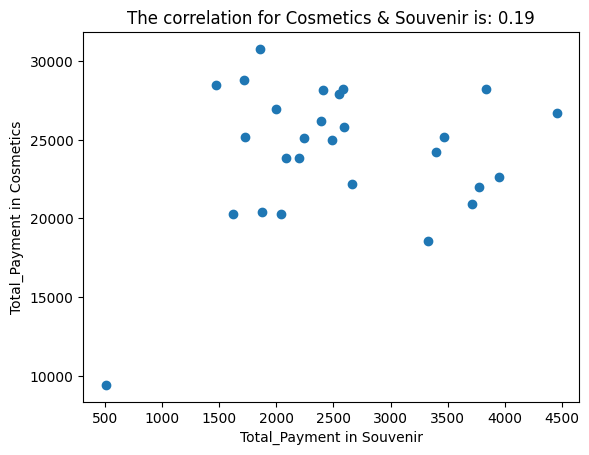

Total Monthly Payment for Food & Beverage in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3174.61
1    2021-02-28        2609.77
2    2021-03-31        2740.52
3    2021-04-30        3216.45
4    2021-05-31        2688.22
5    2021-06-30        4283.37
6    2021-07-31        3300.13
7    2021-08-31        2662.07
8    2021-09-30        3117.08
9    2021-10-31        3179.84
10   2021-11-30        3718.53
11   2021-12-31        4597.17
12   2022-01-31        3483.18
13   2022-02-28        3111.85
14   2022-03-31        3885.89
15   2022-04-30        2923.57
16   2022-05-31        3985.26
17   2022-06-30        3451.80
18   2022-07-31        3101.39
19   2022-08-31        2928.80
20   2022-09-30        2646.38
21   2022-10-31        2913.11
22   2022-11-30        3002.02
23   2022-12-31        3279.21
24   2023-01-31        3708.07
25   2023-02-28        3326.28
26   2023-03-31         883.87
Total Monthly Payment for Toys in Istinye Park Mall
   invoice_date  

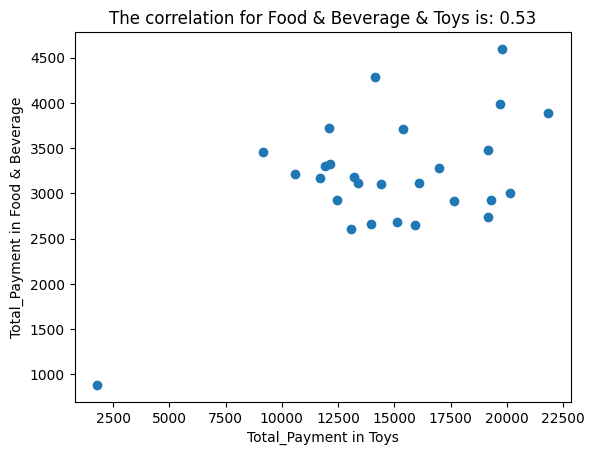

Total Monthly Payment for Technology in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31      68436.375
1    2021-02-28      62878.200
2    2021-03-31      82520.025
3    2021-04-30      96170.025
4    2021-05-31      81470.025
5    2021-06-30     126867.300
6    2021-07-31     126806.400
7    2021-08-31     116614.575
8    2021-09-30      61025.475
9    2021-10-31      96170.025
10   2021-11-30      85175.475
11   2021-12-31      89067.300
12   2022-01-31      84372.750
13   2022-02-28      95922.750
14   2022-03-31     113711.850
15   2022-04-30      92772.750
16   2022-05-31     114514.575
17   2022-06-30      58678.200
18   2022-07-31      82272.750
19   2022-08-31     112909.125
20   2022-09-30      89870.025
21   2022-10-31     114761.850
22   2022-11-30      74675.475
23   2022-12-31      85917.300
24   2023-01-31      80975.475
25   2023-02-28      84372.750
26   2023-03-31      39283.650


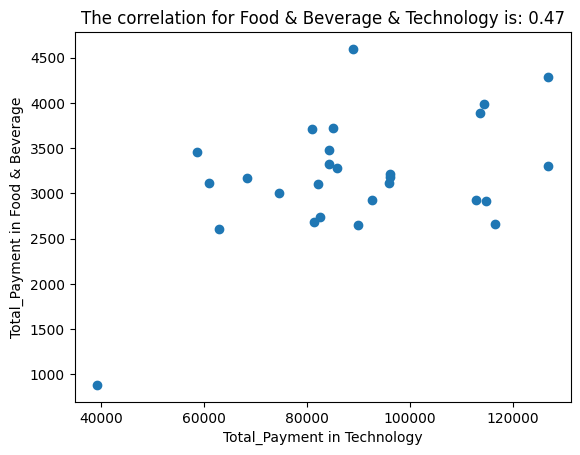

Total Monthly Payment for Souvenir in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3401.70
1    2021-02-28        1724.31
2    2021-03-31        3777.06
3    2021-04-30        2041.02
4    2021-05-31        2580.60
5    2021-06-30        1876.80
6    2021-07-31        4457.40
7    2021-08-31        2404.65
8    2021-09-30        3718.41
9    2021-10-31        2486.76
10   2021-11-30        1466.25
11   2021-12-31        3472.08
12   2022-01-31        3953.01
13   2022-02-28        2193.51
14   2022-03-31        3835.71
15   2022-04-30        2662.71
16   2022-05-31        1994.10
17   2022-06-30        1618.74
18   2022-07-31        2392.92
19   2022-08-31        1712.58
20   2022-09-30        2087.94
21   2022-10-31        2545.41
22   2022-11-30        1853.34
23   2022-12-31        3331.32
24   2023-01-31        2240.43
25   2023-02-28        2592.33
26   2023-03-31         504.39


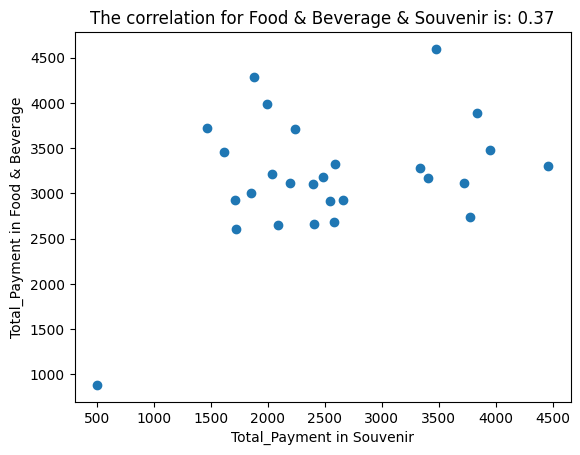

Total Monthly Payment for Toys in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31       11683.84
1    2021-02-28       13081.60
2    2021-03-31       19138.56
3    2021-04-30       10572.80
4    2021-05-31       15124.48
5    2021-06-30       14120.96
6    2021-07-31       11934.72
7    2021-08-31       13977.60
8    2021-09-30       13404.16
9    2021-10-31       13189.12
10   2021-11-30       12113.92
11   2021-12-31       19783.68
12   2022-01-31       19174.40
13   2022-02-28       16092.16
14   2022-03-31       21826.56
15   2022-04-30       12472.32
16   2022-05-31       19712.00
17   2022-06-30        9175.04
18   2022-07-31       14407.68
19   2022-08-31       19281.92
20   2022-09-30       15912.96
21   2022-10-31       17633.28
22   2022-11-30       20142.08
23   2022-12-31       16988.16
24   2023-01-31       15375.36
25   2023-02-28       12149.76
26   2023-03-31        1792.00
Total Monthly Payment for Technology in Istinye Park Mall
   invoice_date  Total

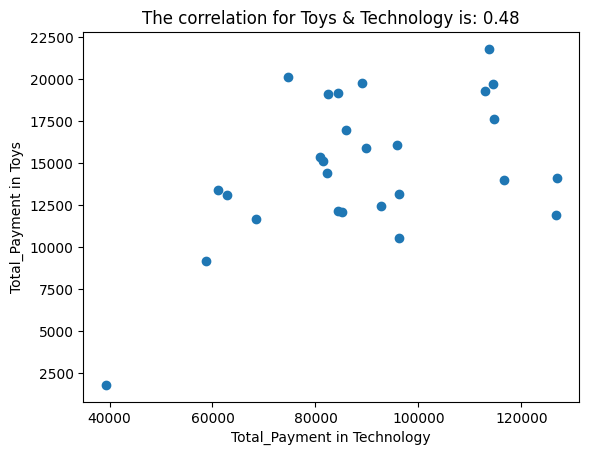

Total Monthly Payment for Souvenir in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3401.70
1    2021-02-28        1724.31
2    2021-03-31        3777.06
3    2021-04-30        2041.02
4    2021-05-31        2580.60
5    2021-06-30        1876.80
6    2021-07-31        4457.40
7    2021-08-31        2404.65
8    2021-09-30        3718.41
9    2021-10-31        2486.76
10   2021-11-30        1466.25
11   2021-12-31        3472.08
12   2022-01-31        3953.01
13   2022-02-28        2193.51
14   2022-03-31        3835.71
15   2022-04-30        2662.71
16   2022-05-31        1994.10
17   2022-06-30        1618.74
18   2022-07-31        2392.92
19   2022-08-31        1712.58
20   2022-09-30        2087.94
21   2022-10-31        2545.41
22   2022-11-30        1853.34
23   2022-12-31        3331.32
24   2023-01-31        2240.43
25   2023-02-28        2592.33
26   2023-03-31         504.39


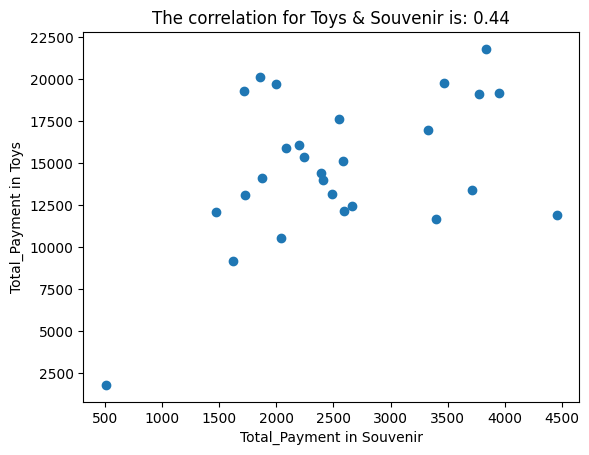

Total Monthly Payment for Technology in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31      68436.375
1    2021-02-28      62878.200
2    2021-03-31      82520.025
3    2021-04-30      96170.025
4    2021-05-31      81470.025
5    2021-06-30     126867.300
6    2021-07-31     126806.400
7    2021-08-31     116614.575
8    2021-09-30      61025.475
9    2021-10-31      96170.025
10   2021-11-30      85175.475
11   2021-12-31      89067.300
12   2022-01-31      84372.750
13   2022-02-28      95922.750
14   2022-03-31     113711.850
15   2022-04-30      92772.750
16   2022-05-31     114514.575
17   2022-06-30      58678.200
18   2022-07-31      82272.750
19   2022-08-31     112909.125
20   2022-09-30      89870.025
21   2022-10-31     114761.850
22   2022-11-30      74675.475
23   2022-12-31      85917.300
24   2023-01-31      80975.475
25   2023-02-28      84372.750
26   2023-03-31      39283.650
Total Monthly Payment for Souvenir in Istinye Park Mall
   invoice_date  T

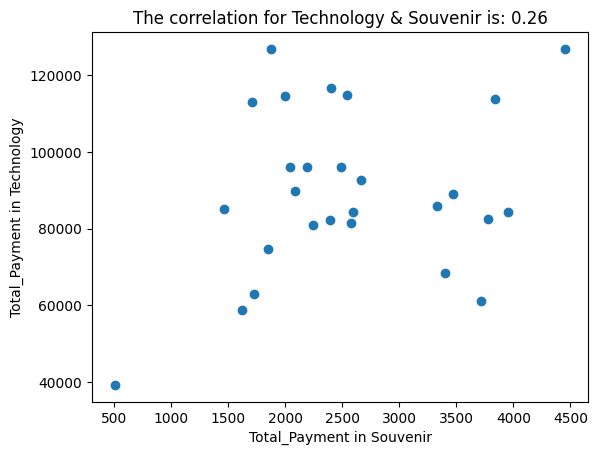

Total Monthly Payment for Souvenir in Istinye Park Mall
   invoice_date  Total_Payment
0    2021-01-31        3401.70
1    2021-02-28        1724.31
2    2021-03-31        3777.06
3    2021-04-30        2041.02
4    2021-05-31        2580.60
5    2021-06-30        1876.80
6    2021-07-31        4457.40
7    2021-08-31        2404.65
8    2021-09-30        3718.41
9    2021-10-31        2486.76
10   2021-11-30        1466.25
11   2021-12-31        3472.08
12   2022-01-31        3953.01
13   2022-02-28        2193.51
14   2022-03-31        3835.71
15   2022-04-30        2662.71
16   2022-05-31        1994.10
17   2022-06-30        1618.74
18   2022-07-31        2392.92
19   2022-08-31        1712.58
20   2022-09-30        2087.94
21   2022-10-31        2545.41
22   2022-11-30        1853.34
23   2022-12-31        3331.32
24   2023-01-31        2240.43
25   2023-02-28        2592.33
26   2023-03-31         504.39


In [63]:
# creating an empty dictionary to store the correlation values
correlation_dict_Istinye_Park_Mall = {}

categories = df['category'].unique()
for i, category_i in enumerate(categories):
    filtered_df_i = df[(df['category'] == category_i) & (df['shopping_mall'] == 'Istinye Park')]

    result_df_i = filtered_df_i.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

    result_df_i = result_df_i.reset_index()

    result_df_i = result_df_i.rename(columns={'Total_Payment': 'Total_Payment'})

    print('Total Monthly Payment for', category_i, 'in Istinye Park Mall')
    print(result_df_i)

    for j in range(i + 1, len(categories)):
        category_j = categories[j]
        filtered_df_j = df[(df['category'] == category_j) & (df['shopping_mall'] == 'Istinye Park')]

        result_df_j = filtered_df_j.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

        result_df_j = result_df_j.reset_index()

        result_df_j = result_df_j.rename(columns={'Total_Payment': 'Total_Payment'})

        print('Total Monthly Payment for', category_j, 'in Istinye Park Mall')
        print(result_df_j)

        correlation_key = f'The correlation for {category_i} & {category_j} is'
        correlation_value = result_df_i['Total_Payment'].corr(result_df_j['Total_Payment'])
        correlation_dict_Istinye_Park_Mall[correlation_key] = correlation_value

        plt.scatter(result_df_j['Total_Payment'], result_df_i['Total_Payment'])
        plt.xlabel(f'Total_Payment in {category_j}')
        plt.ylabel(f'Total_Payment in {category_i}')
        plt.title(f'{correlation_key}: {correlation_value:.2f}')
        plt.show()



In [64]:
correlation_dict_Istinye_Park_Mall

{'The correlation for Clothing & Shoes is': 0.5324769373620396,
 'The correlation for Clothing & Books is': 0.21112768100150572,
 'The correlation for Clothing & Cosmetics is': 0.6073300385530757,
 'The correlation for Clothing & Food & Beverage is': 0.5800042623096683,
 'The correlation for Clothing & Toys is': 0.5121053962949841,
 'The correlation for Clothing & Technology is': 0.4182651000596105,
 'The correlation for Clothing & Souvenir is': 0.4969047322191963,
 'The correlation for Shoes & Books is': 0.20617348181907952,
 'The correlation for Shoes & Cosmetics is': 0.2942964724274402,
 'The correlation for Shoes & Food & Beverage is': 0.5939684635412801,
 'The correlation for Shoes & Toys is': 0.38497584788136596,
 'The correlation for Shoes & Technology is': 0.21496429580387616,
 'The correlation for Shoes & Souvenir is': 0.624918045536435,
 'The correlation for Books & Cosmetics is': 0.2534639638530651,
 'The correlation for Books & Food & Beverage is': 0.2883754241848799,
 'The

In [65]:
# Create a new dictionary with correlations >= 0.65
filtered_correlation_dict_Istinye_Park_Mall = {key: value for key, value in correlation_dict_Istinye_Park_Mall.items() if value >= 0.65}

# Print the filtered dictionary
print(filtered_correlation_dict_Istinye_Park_Mall)

{}


## Correlation between Different Categories for Mall_of_Istanbul

Total Monthly Payment for Clothing in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31     820340.705
1    2021-02-28     765944.085
2    2021-03-31     866744.960
3    2021-04-30     925424.015
4    2021-05-31     782421.655
5    2021-06-30     793906.010
6    2021-07-31     871873.150
7    2021-08-31     823069.080
8    2021-09-30     805555.470
9    2021-10-31     837337.120
10   2021-11-30     909518.950
11   2021-12-31     747230.155
12   2022-01-31     866635.165
13   2022-02-28     801299.040
14   2022-03-31     882293.810
15   2022-04-30     717576.720
16   2022-05-31     859679.665
17   2022-06-30     758851.135
18   2022-07-31     865625.955
19   2022-08-31     795816.285
20   2022-09-30     804628.400
21   2022-10-31     906845.885
22   2022-11-30     753777.430
23   2022-12-31     789787.030
24   2023-01-31     809946.875
25   2023-02-28     800563.080
26   2023-03-31     224242.725
Total Monthly Payment for Shoes in Mall of Istanbul
   invoice_date  Total_Pa

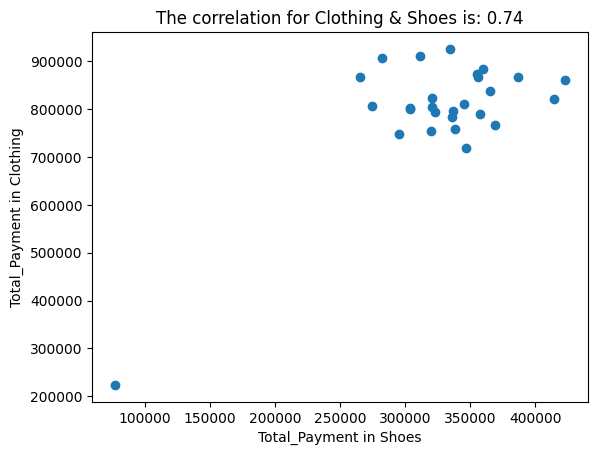

Total Monthly Payment for Books in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        6393.30
1    2021-02-28        3666.30
2    2021-03-31        5923.65
3    2021-04-30        8090.10
4    2021-05-31        8484.00
5    2021-06-30        6741.75
6    2021-07-31        6787.20
7    2021-08-31        6226.65
8    2021-09-30        6635.70
9    2021-10-31        5196.45
10   2021-11-30        3090.60
11   2021-12-31        5908.50
12   2022-01-31        6044.85
13   2022-02-28        8787.00
14   2022-03-31        8696.10
15   2022-04-30        6923.55
16   2022-05-31        6166.05
17   2022-06-30        6423.60
18   2022-07-31        7802.25
19   2022-08-31        8983.95
20   2022-09-30        5484.30
21   2022-10-31        6317.55
22   2022-11-30        8074.95
23   2022-12-31        6862.95
24   2023-01-31        5408.55
25   2023-02-28        6075.15
26   2023-03-31        1045.35


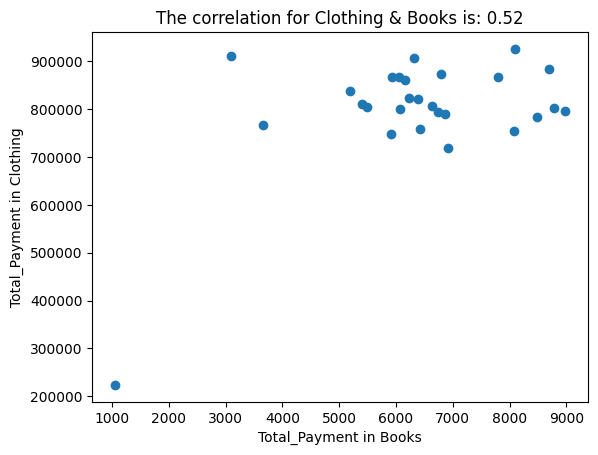

Total Monthly Payment for Cosmetics in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31       53874.50
1    2021-02-28       49889.82
2    2021-03-31       51597.54
3    2021-04-30       35984.10
4    2021-05-31       47572.20
5    2021-06-30       48060.12
6    2021-07-31       55744.86
7    2021-08-31       50987.64
8    2021-09-30       39033.60
9    2021-10-31       54525.06
10   2021-11-30       56110.80
11   2021-12-31       56924.00
12   2022-01-31       45905.14
13   2022-02-28       44034.78
14   2022-03-31       51434.90
15   2022-04-30       61925.18
16   2022-05-31       49930.48
17   2022-06-30       52817.34
18   2022-07-31       51963.48
19   2022-08-31       61030.66
20   2022-09-30       44644.68
21   2022-10-31       62169.14
22   2022-11-30       62901.02
23   2022-12-31       55704.20
24   2023-01-31       62535.08
25   2023-02-28       45091.94
26   2023-03-31       15125.52


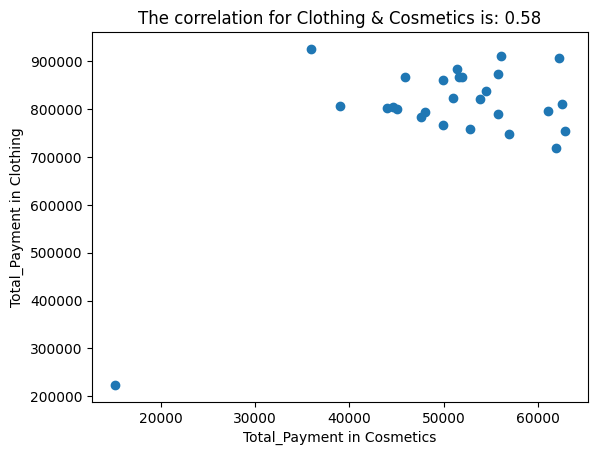

Total Monthly Payment for Food & Beverage in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        7745.63
1    2021-02-28        5993.58
2    2021-03-31        6438.13
3    2021-04-30        5967.43
4    2021-05-31        6464.28
5    2021-06-30        7824.08
6    2021-07-31        6249.85
7    2021-08-31        6103.41
8    2021-09-30        7212.17
9    2021-10-31        6778.08
10   2021-11-30        6228.93
11   2021-12-31        6260.31
12   2022-01-31        6072.03
13   2022-02-28        4623.32
14   2022-03-31        5674.55
15   2022-04-30        6647.33
16   2022-05-31        7112.80
17   2022-06-30        6160.94
18   2022-07-31        7295.85
19   2022-08-31        6605.49
20   2022-09-30        7144.18
21   2022-10-31        6234.16
22   2022-11-30        6757.16
23   2022-12-31        6181.86
24   2023-01-31        7620.11
25   2023-02-28        6239.39
26   2023-03-31        1542.85


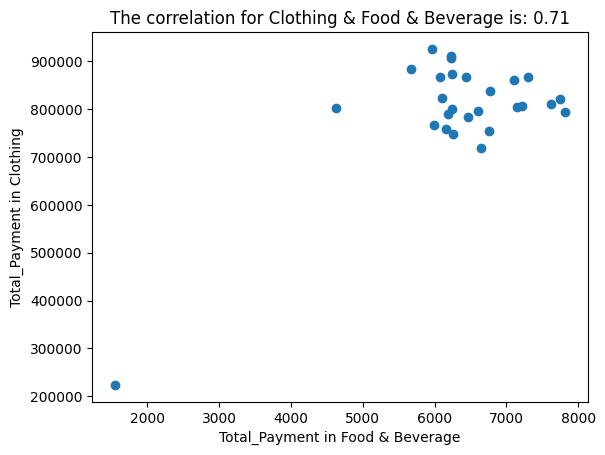

Total Monthly Payment for Toys in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31       29460.48
1    2021-02-28       26270.72
2    2021-03-31       30929.92
3    2021-04-30       24084.48
4    2021-05-31       29532.16
5    2021-06-30       29460.48
6    2021-07-31       35624.96
7    2021-08-31       31467.52
8    2021-09-30       27130.88
9    2021-10-31       30679.04
10   2021-11-30       34693.12
11   2021-12-31       33402.88
12   2022-01-31       30750.72
13   2022-02-28       31216.64
14   2022-03-31       33725.44
15   2022-04-30       25768.96
16   2022-05-31       29747.20
17   2022-06-30       29568.00
18   2022-07-31       25231.36
19   2022-08-31       34944.00
20   2022-09-30       30213.12
21   2022-10-31       27955.20
22   2022-11-30       27991.04
23   2022-12-31       32542.72
24   2023-01-31       25303.04
25   2023-02-28       34836.48
26   2023-03-31        7992.32


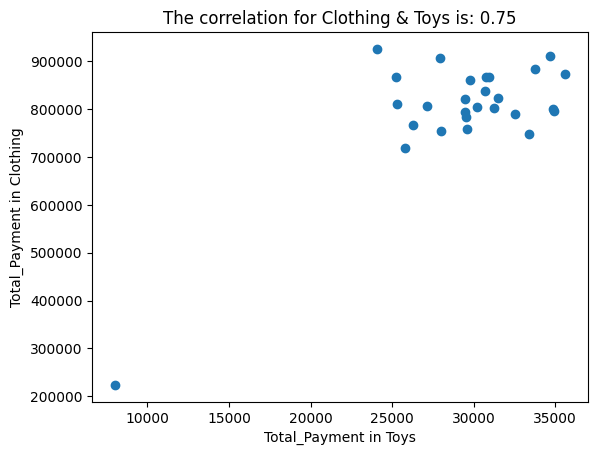

Total Monthly Payment for Technology in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31     260407.350
1    2021-02-28     193637.325
2    2021-03-31     179492.775
3    2021-04-30     174242.775
4    2021-05-31     223470.975
5    2021-06-30     229276.425
6    2021-07-31     181037.325
7    2021-08-31     219826.425
8    2021-09-30     206176.425
9    2021-10-31     140703.675
10   2021-11-30     157195.500
11   2021-12-31     175292.775
12   2022-01-31     226373.700
13   2022-02-28     180790.050
14   2022-03-31     159850.950
15   2022-04-30     145150.950
16   2022-05-31     176590.050
17   2022-06-30     201481.875
18   2022-07-31     217787.325
19   2022-08-31     221926.425
20   2022-09-30     161950.950
21   2022-10-31     269054.625
22   2022-11-30     158553.675
23   2022-12-31     223223.700
24   2023-01-31     189745.500
25   2023-02-28     194934.600
26   2023-03-31      35639.100


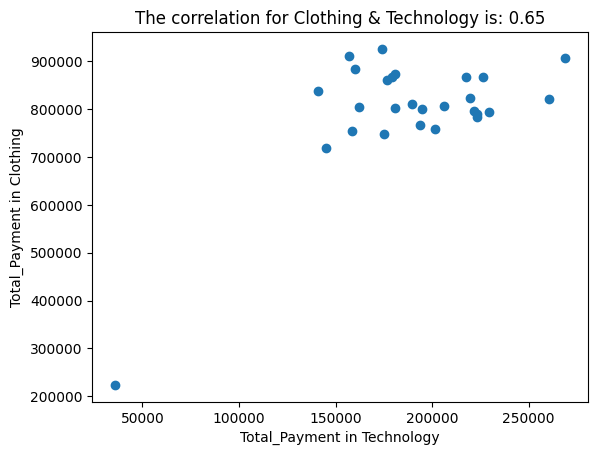

Total Monthly Payment for Souvenir in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        4211.07
1    2021-02-28        4269.72
2    2021-03-31        4304.91
3    2021-04-30        4293.18
4    2021-05-31        4246.26
5    2021-06-30        6545.34
6    2021-07-31        4152.42
7    2021-08-31        4914.87
8    2021-09-30        5032.17
9    2021-10-31        2686.17
10   2021-11-30        4703.73
11   2021-12-31        5266.77
12   2022-01-31        4480.86
13   2022-02-28        6275.55
14   2022-03-31        4738.92
15   2022-04-30        5677.32
16   2022-05-31        4105.50
17   2022-06-30        3999.93
18   2022-07-31        5489.64
19   2022-08-31        7495.47
20   2022-09-30        3389.97
21   2022-10-31        4480.86
22   2022-11-30        5865.00
23   2022-12-31        6439.77
24   2023-01-31        4433.94
25   2023-02-28        5219.85
26   2023-03-31         821.10


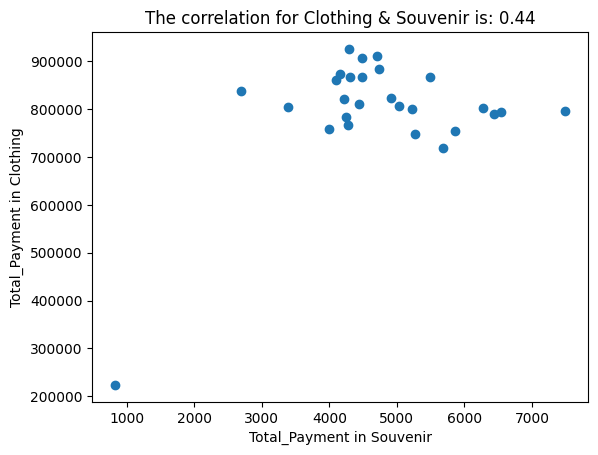

Total Monthly Payment for Shoes in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31     414607.155
1    2021-02-28     368775.855
2    2021-03-31     265219.795
3    2021-04-30     334402.755
4    2021-05-31     336039.480
5    2021-06-30     323054.120
6    2021-07-31     355572.490
7    2021-08-31     320653.440
8    2021-09-30     274167.750
9    2021-10-31     364902.235
10   2021-11-30     311214.505
11   2021-12-31     295610.085
12   2022-01-31     355845.090
13   2022-02-28     303684.895
14   2022-03-31     359555.300
15   2022-04-30     346569.940
16   2022-05-31     423336.730
17   2022-06-30     338385.565
18   2022-07-31     386999.335
19   2022-08-31     336639.650
20   2022-09-30     320435.060
21   2022-10-31     282515.535
22   2022-11-30     320107.865
23   2022-12-31     357209.215
24   2023-01-31     345478.790
25   2023-02-28     303357.700
26   2023-03-31      76439.595
Total Monthly Payment for Books in Mall of Istanbul
   invoice_date  Total_Payme

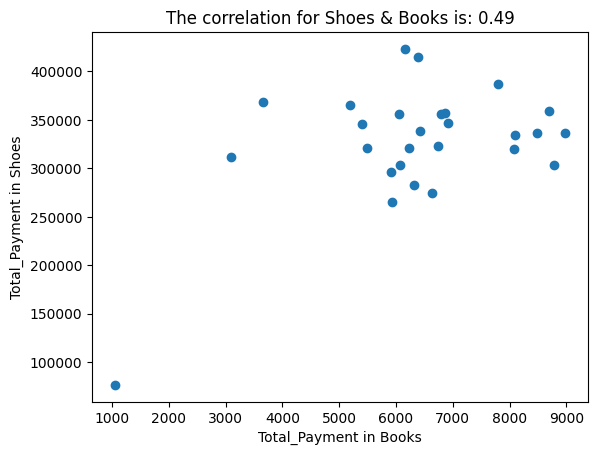

Total Monthly Payment for Cosmetics in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31       53874.50
1    2021-02-28       49889.82
2    2021-03-31       51597.54
3    2021-04-30       35984.10
4    2021-05-31       47572.20
5    2021-06-30       48060.12
6    2021-07-31       55744.86
7    2021-08-31       50987.64
8    2021-09-30       39033.60
9    2021-10-31       54525.06
10   2021-11-30       56110.80
11   2021-12-31       56924.00
12   2022-01-31       45905.14
13   2022-02-28       44034.78
14   2022-03-31       51434.90
15   2022-04-30       61925.18
16   2022-05-31       49930.48
17   2022-06-30       52817.34
18   2022-07-31       51963.48
19   2022-08-31       61030.66
20   2022-09-30       44644.68
21   2022-10-31       62169.14
22   2022-11-30       62901.02
23   2022-12-31       55704.20
24   2023-01-31       62535.08
25   2023-02-28       45091.94
26   2023-03-31       15125.52


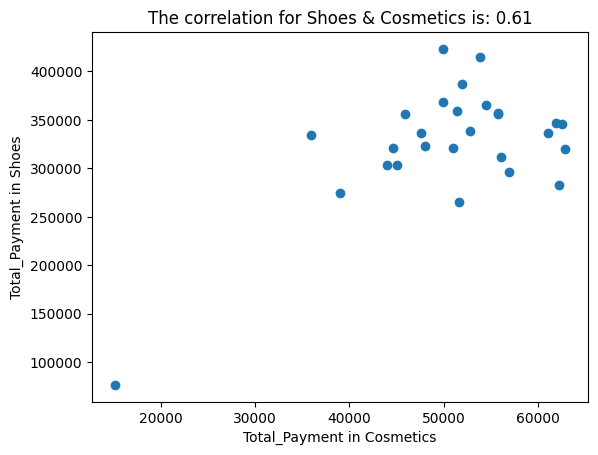

Total Monthly Payment for Food & Beverage in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        7745.63
1    2021-02-28        5993.58
2    2021-03-31        6438.13
3    2021-04-30        5967.43
4    2021-05-31        6464.28
5    2021-06-30        7824.08
6    2021-07-31        6249.85
7    2021-08-31        6103.41
8    2021-09-30        7212.17
9    2021-10-31        6778.08
10   2021-11-30        6228.93
11   2021-12-31        6260.31
12   2022-01-31        6072.03
13   2022-02-28        4623.32
14   2022-03-31        5674.55
15   2022-04-30        6647.33
16   2022-05-31        7112.80
17   2022-06-30        6160.94
18   2022-07-31        7295.85
19   2022-08-31        6605.49
20   2022-09-30        7144.18
21   2022-10-31        6234.16
22   2022-11-30        6757.16
23   2022-12-31        6181.86
24   2023-01-31        7620.11
25   2023-02-28        6239.39
26   2023-03-31        1542.85


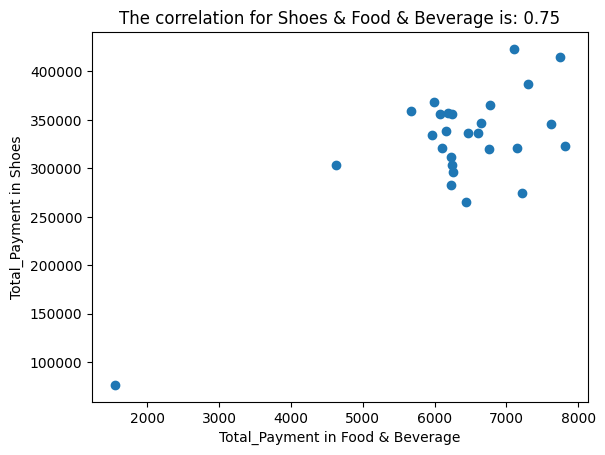

Total Monthly Payment for Toys in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31       29460.48
1    2021-02-28       26270.72
2    2021-03-31       30929.92
3    2021-04-30       24084.48
4    2021-05-31       29532.16
5    2021-06-30       29460.48
6    2021-07-31       35624.96
7    2021-08-31       31467.52
8    2021-09-30       27130.88
9    2021-10-31       30679.04
10   2021-11-30       34693.12
11   2021-12-31       33402.88
12   2022-01-31       30750.72
13   2022-02-28       31216.64
14   2022-03-31       33725.44
15   2022-04-30       25768.96
16   2022-05-31       29747.20
17   2022-06-30       29568.00
18   2022-07-31       25231.36
19   2022-08-31       34944.00
20   2022-09-30       30213.12
21   2022-10-31       27955.20
22   2022-11-30       27991.04
23   2022-12-31       32542.72
24   2023-01-31       25303.04
25   2023-02-28       34836.48
26   2023-03-31        7992.32


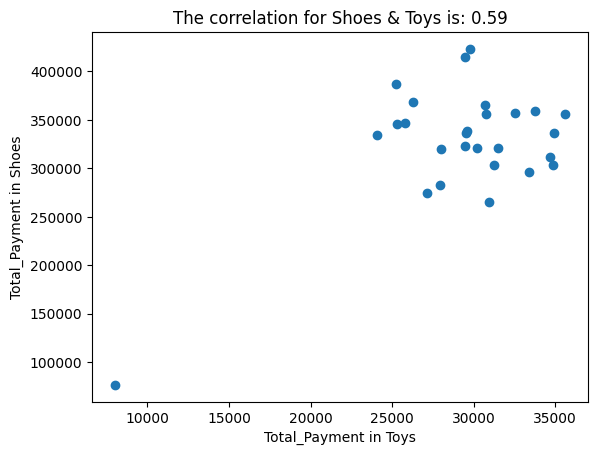

Total Monthly Payment for Technology in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31     260407.350
1    2021-02-28     193637.325
2    2021-03-31     179492.775
3    2021-04-30     174242.775
4    2021-05-31     223470.975
5    2021-06-30     229276.425
6    2021-07-31     181037.325
7    2021-08-31     219826.425
8    2021-09-30     206176.425
9    2021-10-31     140703.675
10   2021-11-30     157195.500
11   2021-12-31     175292.775
12   2022-01-31     226373.700
13   2022-02-28     180790.050
14   2022-03-31     159850.950
15   2022-04-30     145150.950
16   2022-05-31     176590.050
17   2022-06-30     201481.875
18   2022-07-31     217787.325
19   2022-08-31     221926.425
20   2022-09-30     161950.950
21   2022-10-31     269054.625
22   2022-11-30     158553.675
23   2022-12-31     223223.700
24   2023-01-31     189745.500
25   2023-02-28     194934.600
26   2023-03-31      35639.100


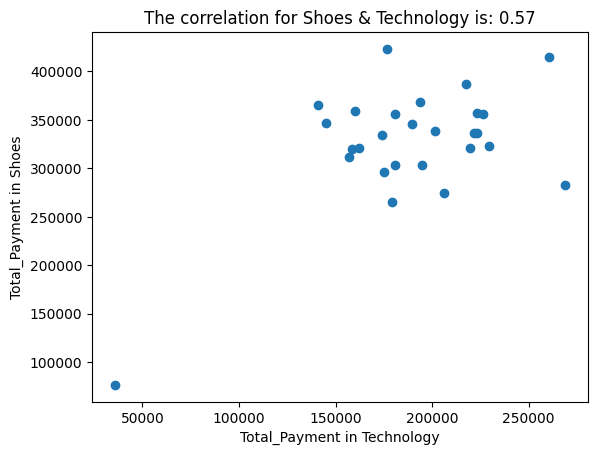

Total Monthly Payment for Souvenir in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        4211.07
1    2021-02-28        4269.72
2    2021-03-31        4304.91
3    2021-04-30        4293.18
4    2021-05-31        4246.26
5    2021-06-30        6545.34
6    2021-07-31        4152.42
7    2021-08-31        4914.87
8    2021-09-30        5032.17
9    2021-10-31        2686.17
10   2021-11-30        4703.73
11   2021-12-31        5266.77
12   2022-01-31        4480.86
13   2022-02-28        6275.55
14   2022-03-31        4738.92
15   2022-04-30        5677.32
16   2022-05-31        4105.50
17   2022-06-30        3999.93
18   2022-07-31        5489.64
19   2022-08-31        7495.47
20   2022-09-30        3389.97
21   2022-10-31        4480.86
22   2022-11-30        5865.00
23   2022-12-31        6439.77
24   2023-01-31        4433.94
25   2023-02-28        5219.85
26   2023-03-31         821.10


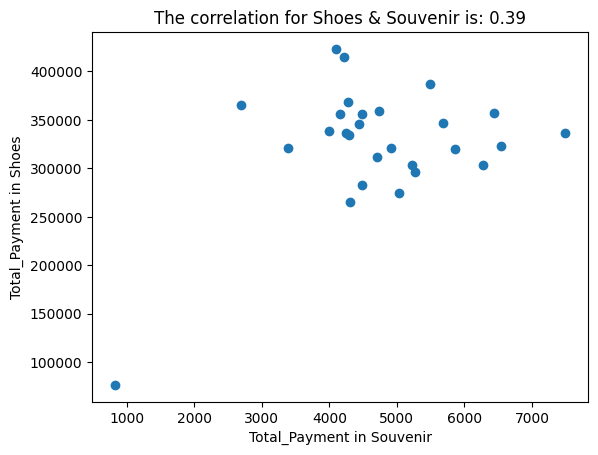

Total Monthly Payment for Books in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        6393.30
1    2021-02-28        3666.30
2    2021-03-31        5923.65
3    2021-04-30        8090.10
4    2021-05-31        8484.00
5    2021-06-30        6741.75
6    2021-07-31        6787.20
7    2021-08-31        6226.65
8    2021-09-30        6635.70
9    2021-10-31        5196.45
10   2021-11-30        3090.60
11   2021-12-31        5908.50
12   2022-01-31        6044.85
13   2022-02-28        8787.00
14   2022-03-31        8696.10
15   2022-04-30        6923.55
16   2022-05-31        6166.05
17   2022-06-30        6423.60
18   2022-07-31        7802.25
19   2022-08-31        8983.95
20   2022-09-30        5484.30
21   2022-10-31        6317.55
22   2022-11-30        8074.95
23   2022-12-31        6862.95
24   2023-01-31        5408.55
25   2023-02-28        6075.15
26   2023-03-31        1045.35
Total Monthly Payment for Cosmetics in Mall of Istanbul
   invoice_date  Total_P

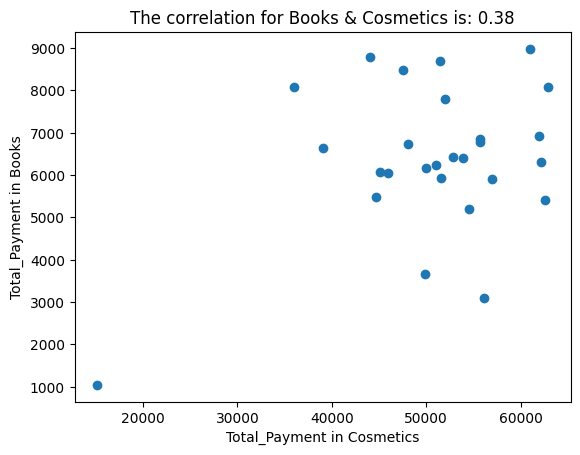

Total Monthly Payment for Food & Beverage in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        7745.63
1    2021-02-28        5993.58
2    2021-03-31        6438.13
3    2021-04-30        5967.43
4    2021-05-31        6464.28
5    2021-06-30        7824.08
6    2021-07-31        6249.85
7    2021-08-31        6103.41
8    2021-09-30        7212.17
9    2021-10-31        6778.08
10   2021-11-30        6228.93
11   2021-12-31        6260.31
12   2022-01-31        6072.03
13   2022-02-28        4623.32
14   2022-03-31        5674.55
15   2022-04-30        6647.33
16   2022-05-31        7112.80
17   2022-06-30        6160.94
18   2022-07-31        7295.85
19   2022-08-31        6605.49
20   2022-09-30        7144.18
21   2022-10-31        6234.16
22   2022-11-30        6757.16
23   2022-12-31        6181.86
24   2023-01-31        7620.11
25   2023-02-28        6239.39
26   2023-03-31        1542.85


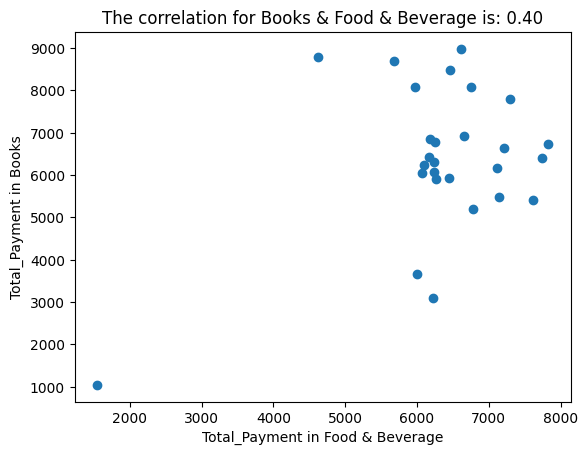

Total Monthly Payment for Toys in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31       29460.48
1    2021-02-28       26270.72
2    2021-03-31       30929.92
3    2021-04-30       24084.48
4    2021-05-31       29532.16
5    2021-06-30       29460.48
6    2021-07-31       35624.96
7    2021-08-31       31467.52
8    2021-09-30       27130.88
9    2021-10-31       30679.04
10   2021-11-30       34693.12
11   2021-12-31       33402.88
12   2022-01-31       30750.72
13   2022-02-28       31216.64
14   2022-03-31       33725.44
15   2022-04-30       25768.96
16   2022-05-31       29747.20
17   2022-06-30       29568.00
18   2022-07-31       25231.36
19   2022-08-31       34944.00
20   2022-09-30       30213.12
21   2022-10-31       27955.20
22   2022-11-30       27991.04
23   2022-12-31       32542.72
24   2023-01-31       25303.04
25   2023-02-28       34836.48
26   2023-03-31        7992.32


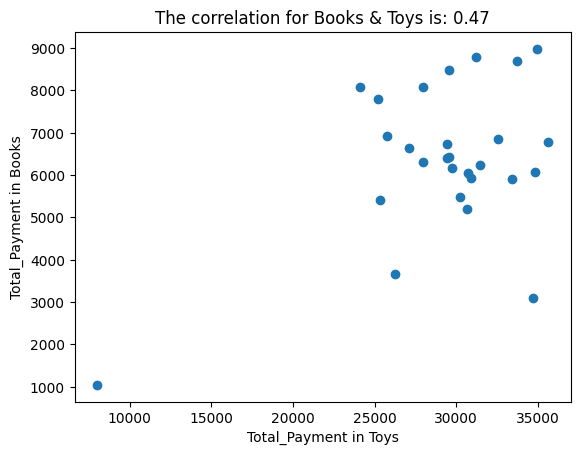

Total Monthly Payment for Technology in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31     260407.350
1    2021-02-28     193637.325
2    2021-03-31     179492.775
3    2021-04-30     174242.775
4    2021-05-31     223470.975
5    2021-06-30     229276.425
6    2021-07-31     181037.325
7    2021-08-31     219826.425
8    2021-09-30     206176.425
9    2021-10-31     140703.675
10   2021-11-30     157195.500
11   2021-12-31     175292.775
12   2022-01-31     226373.700
13   2022-02-28     180790.050
14   2022-03-31     159850.950
15   2022-04-30     145150.950
16   2022-05-31     176590.050
17   2022-06-30     201481.875
18   2022-07-31     217787.325
19   2022-08-31     221926.425
20   2022-09-30     161950.950
21   2022-10-31     269054.625
22   2022-11-30     158553.675
23   2022-12-31     223223.700
24   2023-01-31     189745.500
25   2023-02-28     194934.600
26   2023-03-31      35639.100


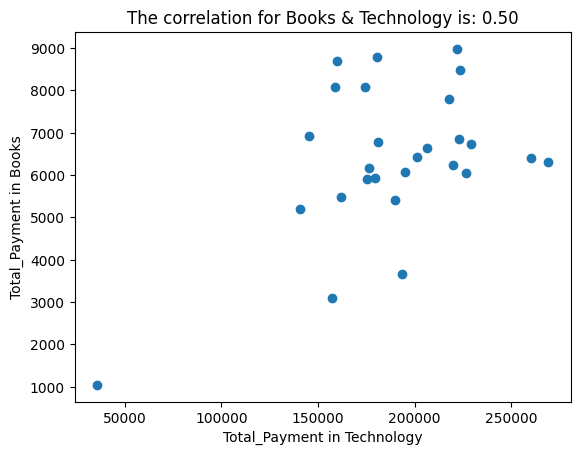

Total Monthly Payment for Souvenir in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        4211.07
1    2021-02-28        4269.72
2    2021-03-31        4304.91
3    2021-04-30        4293.18
4    2021-05-31        4246.26
5    2021-06-30        6545.34
6    2021-07-31        4152.42
7    2021-08-31        4914.87
8    2021-09-30        5032.17
9    2021-10-31        2686.17
10   2021-11-30        4703.73
11   2021-12-31        5266.77
12   2022-01-31        4480.86
13   2022-02-28        6275.55
14   2022-03-31        4738.92
15   2022-04-30        5677.32
16   2022-05-31        4105.50
17   2022-06-30        3999.93
18   2022-07-31        5489.64
19   2022-08-31        7495.47
20   2022-09-30        3389.97
21   2022-10-31        4480.86
22   2022-11-30        5865.00
23   2022-12-31        6439.77
24   2023-01-31        4433.94
25   2023-02-28        5219.85
26   2023-03-31         821.10


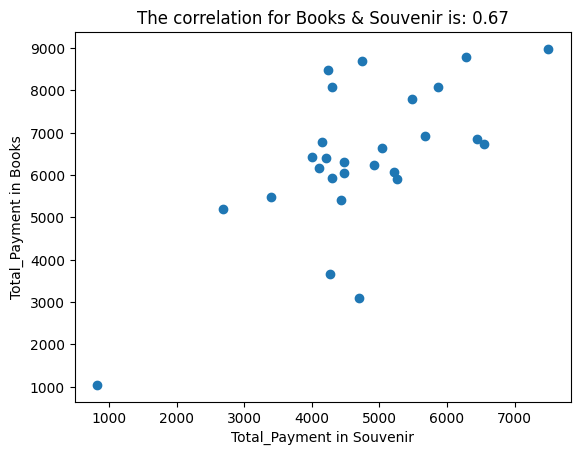

Total Monthly Payment for Cosmetics in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31       53874.50
1    2021-02-28       49889.82
2    2021-03-31       51597.54
3    2021-04-30       35984.10
4    2021-05-31       47572.20
5    2021-06-30       48060.12
6    2021-07-31       55744.86
7    2021-08-31       50987.64
8    2021-09-30       39033.60
9    2021-10-31       54525.06
10   2021-11-30       56110.80
11   2021-12-31       56924.00
12   2022-01-31       45905.14
13   2022-02-28       44034.78
14   2022-03-31       51434.90
15   2022-04-30       61925.18
16   2022-05-31       49930.48
17   2022-06-30       52817.34
18   2022-07-31       51963.48
19   2022-08-31       61030.66
20   2022-09-30       44644.68
21   2022-10-31       62169.14
22   2022-11-30       62901.02
23   2022-12-31       55704.20
24   2023-01-31       62535.08
25   2023-02-28       45091.94
26   2023-03-31       15125.52
Total Monthly Payment for Food & Beverage in Mall of Istanbul
   invoice_dat

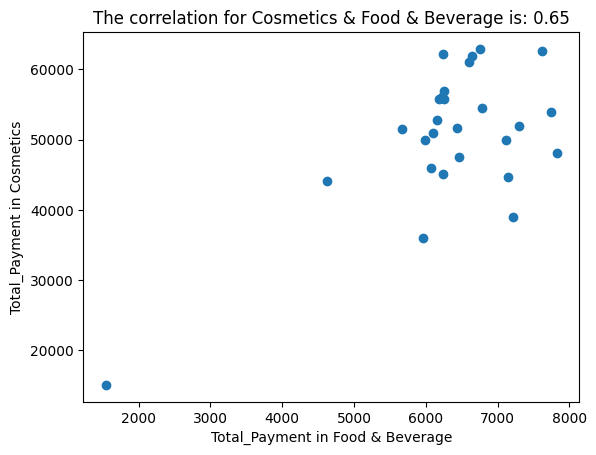

Total Monthly Payment for Toys in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31       29460.48
1    2021-02-28       26270.72
2    2021-03-31       30929.92
3    2021-04-30       24084.48
4    2021-05-31       29532.16
5    2021-06-30       29460.48
6    2021-07-31       35624.96
7    2021-08-31       31467.52
8    2021-09-30       27130.88
9    2021-10-31       30679.04
10   2021-11-30       34693.12
11   2021-12-31       33402.88
12   2022-01-31       30750.72
13   2022-02-28       31216.64
14   2022-03-31       33725.44
15   2022-04-30       25768.96
16   2022-05-31       29747.20
17   2022-06-30       29568.00
18   2022-07-31       25231.36
19   2022-08-31       34944.00
20   2022-09-30       30213.12
21   2022-10-31       27955.20
22   2022-11-30       27991.04
23   2022-12-31       32542.72
24   2023-01-31       25303.04
25   2023-02-28       34836.48
26   2023-03-31        7992.32


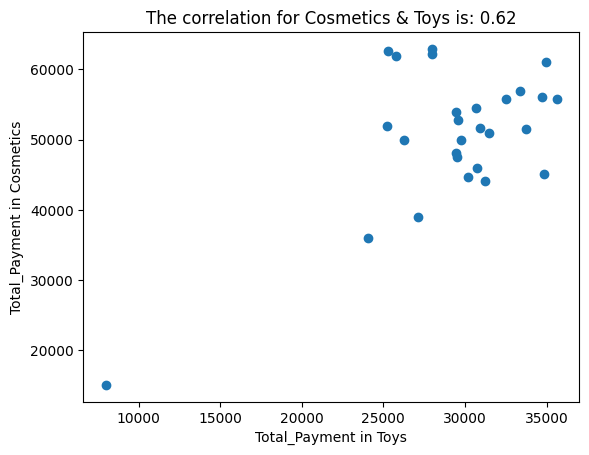

Total Monthly Payment for Technology in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31     260407.350
1    2021-02-28     193637.325
2    2021-03-31     179492.775
3    2021-04-30     174242.775
4    2021-05-31     223470.975
5    2021-06-30     229276.425
6    2021-07-31     181037.325
7    2021-08-31     219826.425
8    2021-09-30     206176.425
9    2021-10-31     140703.675
10   2021-11-30     157195.500
11   2021-12-31     175292.775
12   2022-01-31     226373.700
13   2022-02-28     180790.050
14   2022-03-31     159850.950
15   2022-04-30     145150.950
16   2022-05-31     176590.050
17   2022-06-30     201481.875
18   2022-07-31     217787.325
19   2022-08-31     221926.425
20   2022-09-30     161950.950
21   2022-10-31     269054.625
22   2022-11-30     158553.675
23   2022-12-31     223223.700
24   2023-01-31     189745.500
25   2023-02-28     194934.600
26   2023-03-31      35639.100


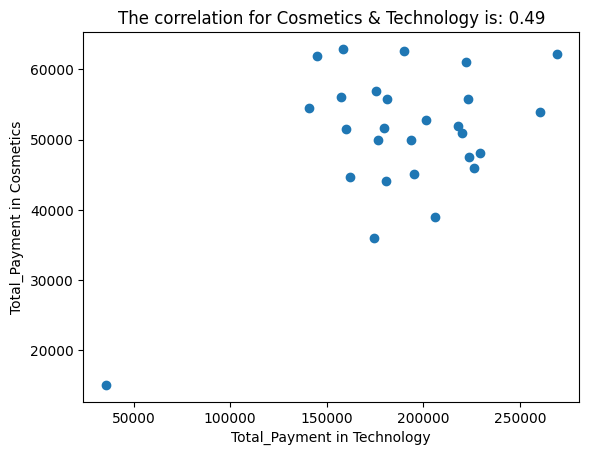

Total Monthly Payment for Souvenir in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        4211.07
1    2021-02-28        4269.72
2    2021-03-31        4304.91
3    2021-04-30        4293.18
4    2021-05-31        4246.26
5    2021-06-30        6545.34
6    2021-07-31        4152.42
7    2021-08-31        4914.87
8    2021-09-30        5032.17
9    2021-10-31        2686.17
10   2021-11-30        4703.73
11   2021-12-31        5266.77
12   2022-01-31        4480.86
13   2022-02-28        6275.55
14   2022-03-31        4738.92
15   2022-04-30        5677.32
16   2022-05-31        4105.50
17   2022-06-30        3999.93
18   2022-07-31        5489.64
19   2022-08-31        7495.47
20   2022-09-30        3389.97
21   2022-10-31        4480.86
22   2022-11-30        5865.00
23   2022-12-31        6439.77
24   2023-01-31        4433.94
25   2023-02-28        5219.85
26   2023-03-31         821.10


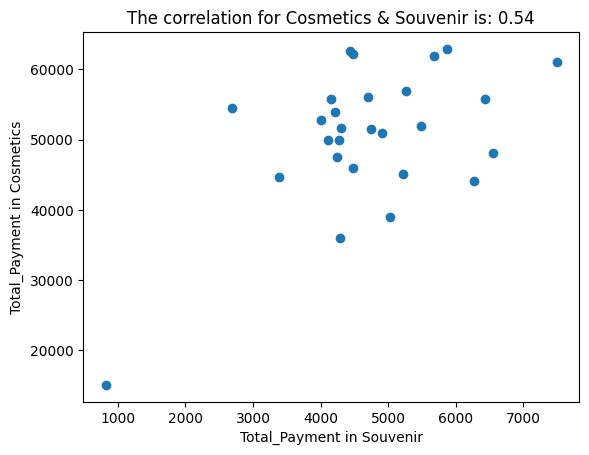

Total Monthly Payment for Food & Beverage in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        7745.63
1    2021-02-28        5993.58
2    2021-03-31        6438.13
3    2021-04-30        5967.43
4    2021-05-31        6464.28
5    2021-06-30        7824.08
6    2021-07-31        6249.85
7    2021-08-31        6103.41
8    2021-09-30        7212.17
9    2021-10-31        6778.08
10   2021-11-30        6228.93
11   2021-12-31        6260.31
12   2022-01-31        6072.03
13   2022-02-28        4623.32
14   2022-03-31        5674.55
15   2022-04-30        6647.33
16   2022-05-31        7112.80
17   2022-06-30        6160.94
18   2022-07-31        7295.85
19   2022-08-31        6605.49
20   2022-09-30        7144.18
21   2022-10-31        6234.16
22   2022-11-30        6757.16
23   2022-12-31        6181.86
24   2023-01-31        7620.11
25   2023-02-28        6239.39
26   2023-03-31        1542.85
Total Monthly Payment for Toys in Mall of Istanbul
   invoice_date  To

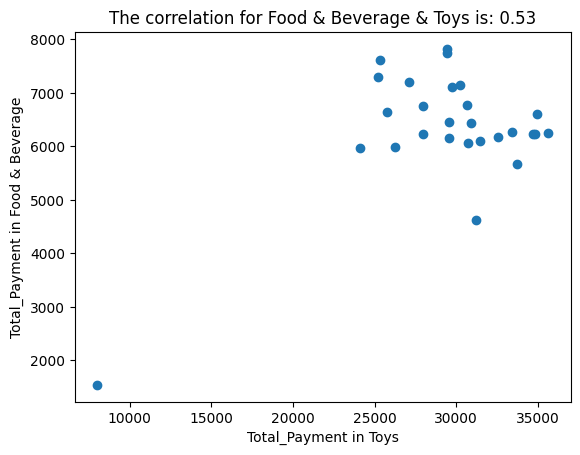

Total Monthly Payment for Technology in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31     260407.350
1    2021-02-28     193637.325
2    2021-03-31     179492.775
3    2021-04-30     174242.775
4    2021-05-31     223470.975
5    2021-06-30     229276.425
6    2021-07-31     181037.325
7    2021-08-31     219826.425
8    2021-09-30     206176.425
9    2021-10-31     140703.675
10   2021-11-30     157195.500
11   2021-12-31     175292.775
12   2022-01-31     226373.700
13   2022-02-28     180790.050
14   2022-03-31     159850.950
15   2022-04-30     145150.950
16   2022-05-31     176590.050
17   2022-06-30     201481.875
18   2022-07-31     217787.325
19   2022-08-31     221926.425
20   2022-09-30     161950.950
21   2022-10-31     269054.625
22   2022-11-30     158553.675
23   2022-12-31     223223.700
24   2023-01-31     189745.500
25   2023-02-28     194934.600
26   2023-03-31      35639.100


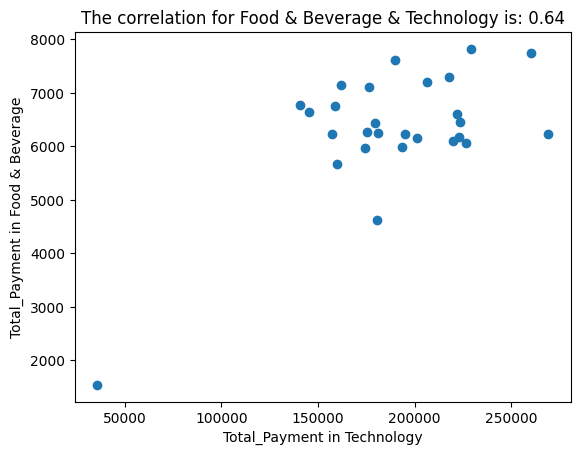

Total Monthly Payment for Souvenir in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        4211.07
1    2021-02-28        4269.72
2    2021-03-31        4304.91
3    2021-04-30        4293.18
4    2021-05-31        4246.26
5    2021-06-30        6545.34
6    2021-07-31        4152.42
7    2021-08-31        4914.87
8    2021-09-30        5032.17
9    2021-10-31        2686.17
10   2021-11-30        4703.73
11   2021-12-31        5266.77
12   2022-01-31        4480.86
13   2022-02-28        6275.55
14   2022-03-31        4738.92
15   2022-04-30        5677.32
16   2022-05-31        4105.50
17   2022-06-30        3999.93
18   2022-07-31        5489.64
19   2022-08-31        7495.47
20   2022-09-30        3389.97
21   2022-10-31        4480.86
22   2022-11-30        5865.00
23   2022-12-31        6439.77
24   2023-01-31        4433.94
25   2023-02-28        5219.85
26   2023-03-31         821.10


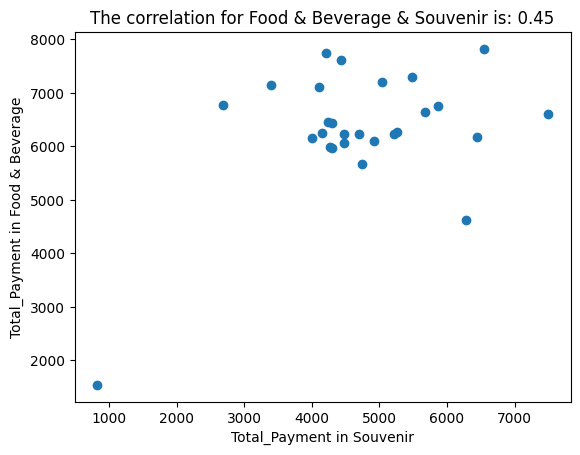

Total Monthly Payment for Toys in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31       29460.48
1    2021-02-28       26270.72
2    2021-03-31       30929.92
3    2021-04-30       24084.48
4    2021-05-31       29532.16
5    2021-06-30       29460.48
6    2021-07-31       35624.96
7    2021-08-31       31467.52
8    2021-09-30       27130.88
9    2021-10-31       30679.04
10   2021-11-30       34693.12
11   2021-12-31       33402.88
12   2022-01-31       30750.72
13   2022-02-28       31216.64
14   2022-03-31       33725.44
15   2022-04-30       25768.96
16   2022-05-31       29747.20
17   2022-06-30       29568.00
18   2022-07-31       25231.36
19   2022-08-31       34944.00
20   2022-09-30       30213.12
21   2022-10-31       27955.20
22   2022-11-30       27991.04
23   2022-12-31       32542.72
24   2023-01-31       25303.04
25   2023-02-28       34836.48
26   2023-03-31        7992.32
Total Monthly Payment for Technology in Mall of Istanbul
   invoice_date  Total_P

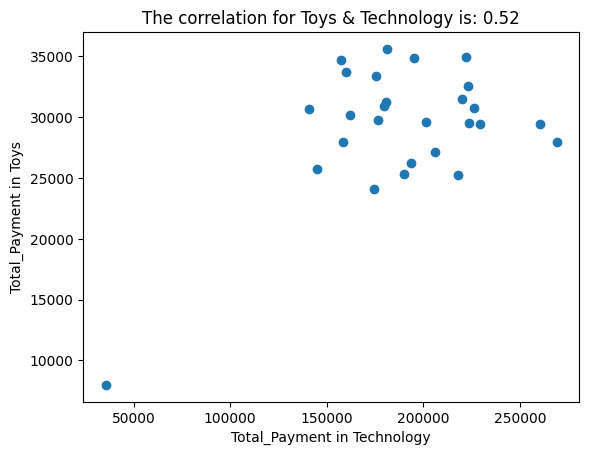

Total Monthly Payment for Souvenir in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        4211.07
1    2021-02-28        4269.72
2    2021-03-31        4304.91
3    2021-04-30        4293.18
4    2021-05-31        4246.26
5    2021-06-30        6545.34
6    2021-07-31        4152.42
7    2021-08-31        4914.87
8    2021-09-30        5032.17
9    2021-10-31        2686.17
10   2021-11-30        4703.73
11   2021-12-31        5266.77
12   2022-01-31        4480.86
13   2022-02-28        6275.55
14   2022-03-31        4738.92
15   2022-04-30        5677.32
16   2022-05-31        4105.50
17   2022-06-30        3999.93
18   2022-07-31        5489.64
19   2022-08-31        7495.47
20   2022-09-30        3389.97
21   2022-10-31        4480.86
22   2022-11-30        5865.00
23   2022-12-31        6439.77
24   2023-01-31        4433.94
25   2023-02-28        5219.85
26   2023-03-31         821.10


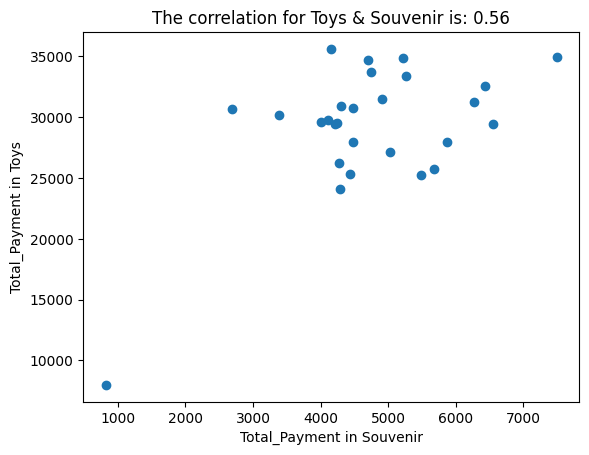

Total Monthly Payment for Technology in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31     260407.350
1    2021-02-28     193637.325
2    2021-03-31     179492.775
3    2021-04-30     174242.775
4    2021-05-31     223470.975
5    2021-06-30     229276.425
6    2021-07-31     181037.325
7    2021-08-31     219826.425
8    2021-09-30     206176.425
9    2021-10-31     140703.675
10   2021-11-30     157195.500
11   2021-12-31     175292.775
12   2022-01-31     226373.700
13   2022-02-28     180790.050
14   2022-03-31     159850.950
15   2022-04-30     145150.950
16   2022-05-31     176590.050
17   2022-06-30     201481.875
18   2022-07-31     217787.325
19   2022-08-31     221926.425
20   2022-09-30     161950.950
21   2022-10-31     269054.625
22   2022-11-30     158553.675
23   2022-12-31     223223.700
24   2023-01-31     189745.500
25   2023-02-28     194934.600
26   2023-03-31      35639.100
Total Monthly Payment for Souvenir in Mall of Istanbul
   invoice_date  Tot

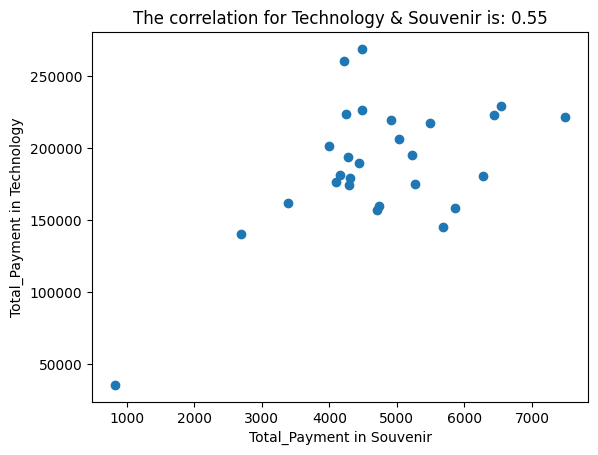

Total Monthly Payment for Souvenir in Mall of Istanbul
   invoice_date  Total_Payment
0    2021-01-31        4211.07
1    2021-02-28        4269.72
2    2021-03-31        4304.91
3    2021-04-30        4293.18
4    2021-05-31        4246.26
5    2021-06-30        6545.34
6    2021-07-31        4152.42
7    2021-08-31        4914.87
8    2021-09-30        5032.17
9    2021-10-31        2686.17
10   2021-11-30        4703.73
11   2021-12-31        5266.77
12   2022-01-31        4480.86
13   2022-02-28        6275.55
14   2022-03-31        4738.92
15   2022-04-30        5677.32
16   2022-05-31        4105.50
17   2022-06-30        3999.93
18   2022-07-31        5489.64
19   2022-08-31        7495.47
20   2022-09-30        3389.97
21   2022-10-31        4480.86
22   2022-11-30        5865.00
23   2022-12-31        6439.77
24   2023-01-31        4433.94
25   2023-02-28        5219.85
26   2023-03-31         821.10


In [66]:
# creating an empty dictionary to store the correlation values
correlation_dict_Mall_of_Istanbul = {}

categories = df['category'].unique()
for i, category_i in enumerate(categories):
    filtered_df_i = df[(df['category'] == category_i) & (df['shopping_mall'] == 'Mall of Istanbul')]

    result_df_i = filtered_df_i.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

    result_df_i = result_df_i.reset_index()

    result_df_i = result_df_i.rename(columns={'Total_Payment': 'Total_Payment'})

    print('Total Monthly Payment for', category_i, 'in Mall of Istanbul')
    print(result_df_i)

    for j in range(i + 1, len(categories)):
        category_j = categories[j]
        filtered_df_j = df[(df['category'] == category_j) & (df['shopping_mall'] == 'Mall of Istanbul')]

        result_df_j = filtered_df_j.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

        result_df_j = result_df_j.reset_index()

        result_df_j = result_df_j.rename(columns={'Total_Payment': 'Total_Payment'})

        print('Total Monthly Payment for', category_j, 'in Mall of Istanbul')
        print(result_df_j)

        correlation_key = f'The correlation for {category_i} & {category_j} is'
        correlation_value = result_df_i['Total_Payment'].corr(result_df_j['Total_Payment'])
        correlation_dict_Mall_of_Istanbul[correlation_key] = correlation_value

        plt.scatter(result_df_j['Total_Payment'], result_df_i['Total_Payment'])
        plt.xlabel(f'Total_Payment in {category_j}')
        plt.ylabel(f'Total_Payment in {category_i}')
        plt.title(f'{correlation_key}: {correlation_value:.2f}')
        plt.show()



In [67]:
correlation_dict_Mall_of_Istanbul

{'The correlation for Clothing & Shoes is': 0.7350082742464816,
 'The correlation for Clothing & Books is': 0.52252708537011,
 'The correlation for Clothing & Cosmetics is': 0.5792746043858747,
 'The correlation for Clothing & Food & Beverage is': 0.7092508418873701,
 'The correlation for Clothing & Toys is': 0.7451204248666052,
 'The correlation for Clothing & Technology is': 0.64736822953744,
 'The correlation for Clothing & Souvenir is': 0.4370160886370177,
 'The correlation for Shoes & Books is': 0.48992732715401904,
 'The correlation for Shoes & Cosmetics is': 0.6119008140356245,
 'The correlation for Shoes & Food & Beverage is': 0.7472160716138211,
 'The correlation for Shoes & Toys is': 0.5860085355769747,
 'The correlation for Shoes & Technology is': 0.5667310493792752,
 'The correlation for Shoes & Souvenir is': 0.39103400754889445,
 'The correlation for Books & Cosmetics is': 0.377444637206964,
 'The correlation for Books & Food & Beverage is': 0.40379365917358134,
 'The corr

In [68]:
# Create a new dictionary with correlations >= 0.6
filtered_correlation_dict_Mall_of_Istanbul = {key: value for key, value in correlation_dict_Mall_of_Istanbul.items() if value >= 0.65}

# Print the filtered dictionary
print(filtered_correlation_dict_Mall_of_Istanbul)

{'The correlation for Clothing & Shoes is': 0.7350082742464816, 'The correlation for Clothing & Food & Beverage is': 0.7092508418873701, 'The correlation for Clothing & Toys is': 0.7451204248666052, 'The correlation for Shoes & Food & Beverage is': 0.7472160716138211, 'The correlation for Books & Souvenir is': 0.6728630486620977, 'The correlation for Cosmetics & Food & Beverage is': 0.6523000470603415}


In [69]:
table_Mall_of_Istanbul = {
    'city': ['Istanbull','Istanbull','Istanbull','Istanbull','Istanbull','Istanbull'],
    'mall': ['Mall of Istanbul','Mall of Istanbul','Mall of Istanbul','Mall of Istanbul','Mall of Istanbul','Mall of Istanbul'],
    'correlation': [0.7350082742464816,0.7092508418873701,0.7451204248666052,0.7472160716138211,0.6728630486620977,0.6523000470603415],
    'item1': ['Clothing','Clothing','Clothing','Shoes','Books','Cosmetics'],
    'item2': ['Shoes','Food & Beverage','Toys','Food & Beverage','Souvenir','Food & Beverage']
}
# Creating a DataFrame from the data
table_Mall_of_Istanbul = pd.DataFrame(table_Mall_of_Istanbul)
correlation_table= pd.concat([correlation_table, table_Mall_of_Istanbul], ignore_index=True)
correlation_table

,city,mall,correlation,item1,item2
0,Istanbull,Forum istanbul Mall,0.697743,Cosmetics,Toys
1,Istanbull,Kanyon Mall,0.668588,Clothing,Shoes
2,Istanbull,Kanyon Mall,0.747761,Cosmetics,Technology
3,Istanbull,Metrocity Mall,0.744072,Clothing,Toys
4,Istanbull,Metrocity Mall,0.676121,Shoes,Cosmetics
5,Istanbull,Metrocity Mall,0.708054,Cosmetics,Toys
6,Istanbull,Metrocity Mall,0.668409,Cosmetics,Technology
7,Istanbull,Metropol AVM,0.719752,Clothing,Food & Beverage
8,Istanbull,Mall of Istanbul,0.735008,Clothing,Shoes
9,Istanbull,Mall of Istanbul,0.709251,Clothing,Food & Beverage


## Correlation between Different Categories for Emaar_Square_Mall

Total Monthly Payment for Clothing in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31     209538.805
1    2021-02-28     109256.775
2    2021-03-31     192106.510
3    2021-04-30     216658.585
4    2021-05-31     282185.820
5    2021-06-30     200645.375
6    2021-07-31     230080.870
7    2021-08-31     158797.630
8    2021-09-30     220723.905
9    2021-10-31     212239.525
10   2021-11-30     180048.825
11   2021-12-31     198844.895
12   2022-01-31     200045.215
13   2022-02-28     137109.730
14   2022-03-31     262898.560
15   2022-04-30     215294.810
16   2022-05-31     217614.135
17   2022-06-30     209784.400
18   2022-07-31     180594.500
19   2022-08-31     189733.525
20   2022-09-30     149167.415
21   2022-10-31     239737.915
22   2022-11-30     210329.250
23   2022-12-31     224542.805
24   2023-01-31     151950.275
25   2023-02-28     217941.045
26   2023-03-31      46103.350
Total Monthly Payment for Shoes in Emaar Square Mall
   invoice_date  Total_

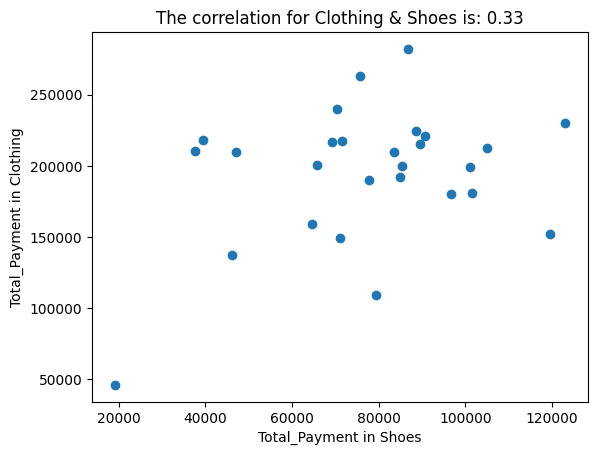

Total Monthly Payment for Books in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31         893.85
1    2021-02-28         499.95
2    2021-03-31        2211.90
3    2021-04-30        1575.60
4    2021-05-31         878.70
5    2021-06-30        1969.50
6    2021-07-31        1545.30
7    2021-08-31         772.65
8    2021-09-30        1302.90
9    2021-10-31        1484.70
10   2021-11-30        1924.05
11   2021-12-31        1757.40
12   2022-01-31        1196.85
13   2022-02-28         924.15
14   2022-03-31        1984.65
15   2022-04-30         484.80
16   2022-05-31        1454.40
17   2022-06-30        2090.70
18   2022-07-31        2242.20
19   2022-08-31        1363.50
20   2022-09-30        2121.00
21   2022-10-31        1545.30
22   2022-11-30        2863.35
23   2022-12-31        1560.45
24   2023-01-31        1848.30
25   2023-02-28        3408.75
26   2023-03-31          90.90


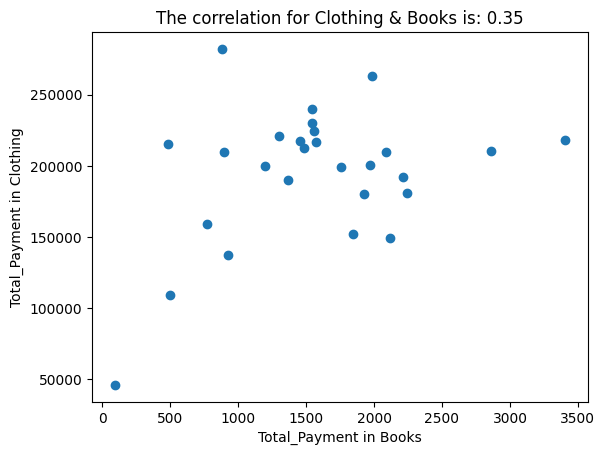

Total Monthly Payment for Cosmetics in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31       12929.88
1    2021-02-28        8741.90
2    2021-03-31       14840.90
3    2021-04-30       13092.52
4    2021-05-31       17443.14
5    2021-06-30       10937.54
6    2021-07-31       12645.26
7    2021-08-31       18459.64
8    2021-09-30       10246.32
9    2021-10-31        8497.94
10   2021-11-30       12685.92
11   2021-12-31       12279.32
12   2022-01-31       11954.04
13   2022-02-28       14027.70
14   2022-03-31       13824.40
15   2022-04-30       10449.62
16   2022-05-31        9921.04
17   2022-06-30       15206.84
18   2022-07-31       14231.00
19   2022-08-31       15369.48
20   2022-09-30       12726.58
21   2022-10-31        8010.02
22   2022-11-30       13214.50
23   2022-12-31       14474.96
24   2023-01-31       19232.18
25   2023-02-28        7074.84
26   2023-03-31        6424.28


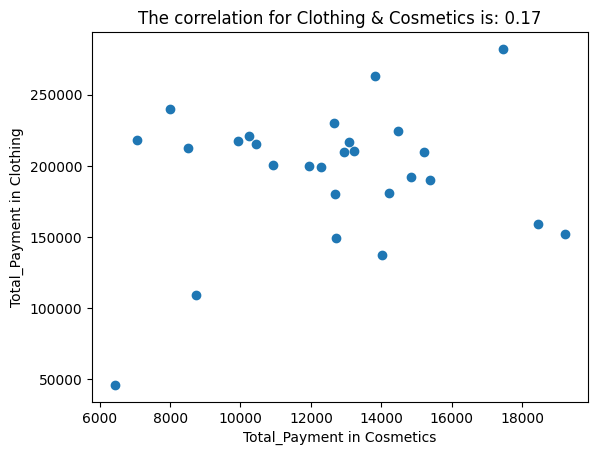

Total Monthly Payment for Food & Beverage in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1668.37
1    2021-02-28        1004.16
2    2021-03-31        2227.98
3    2021-04-30        1380.72
4    2021-05-31        1610.84
5    2021-06-30        2207.06
6    2021-07-31        1605.61
7    2021-08-31        1239.51
8    2021-09-30        1176.75
9    2021-10-31        1056.46
10   2021-11-30        1380.72
11   2021-12-31        1485.32
12   2022-01-31        1861.88
13   2022-02-28        1208.13
14   2022-03-31        1391.18
15   2022-04-30        1673.60
16   2022-05-31        1349.34
17   2022-06-30        2489.48
18   2022-07-31         716.51
19   2022-08-31        1741.59
20   2022-09-30        1715.44
21   2022-10-31        2243.67
22   2022-11-30        1218.59
23   2022-12-31        1757.28
24   2023-01-31        1281.35
25   2023-02-28        1192.44
26   2023-03-31         726.97


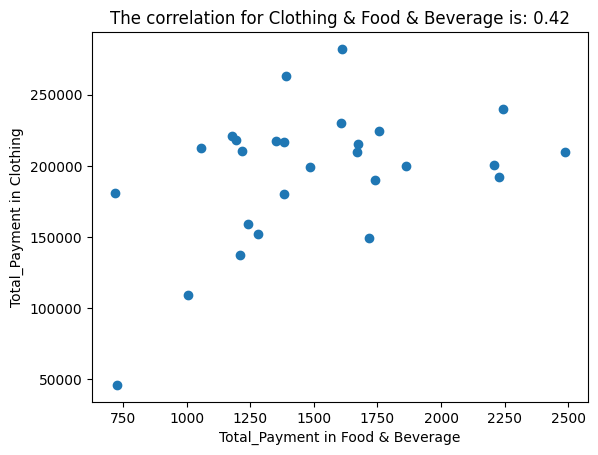

Total Monthly Payment for Toys in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        7203.84
1    2021-02-28        7777.28
2    2021-03-31        6092.80
3    2021-04-30        7203.84
4    2021-05-31        9569.28
5    2021-06-30        5089.28
6    2021-07-31        4910.08
7    2021-08-31        4408.32
8    2021-09-30        8279.04
9    2021-10-31       11432.96
10   2021-11-30        7275.52
11   2021-12-31        7598.08
12   2022-01-31        4730.88
13   2022-02-28        4730.88
14   2022-03-31        5841.92
15   2022-04-30        8780.80
16   2022-05-31        5770.24
17   2022-06-30        5949.44
18   2022-07-31        6666.24
19   2022-08-31        8350.72
20   2022-09-30        5304.32
21   2022-10-31        6200.32
22   2022-11-30        5304.32
23   2022-12-31        9139.20
24   2023-01-31        6737.92
25   2023-02-28        8099.84
26   2023-03-31         645.12


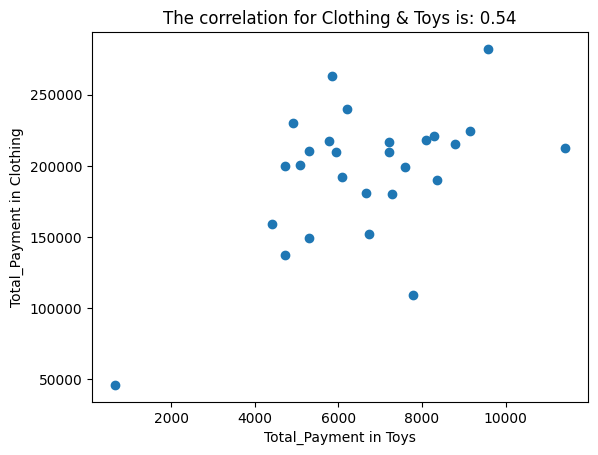

Total Monthly Payment for Technology in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31      24891.825
1    2021-02-28      55280.925
2    2021-03-31      60530.925
3    2021-04-30      50030.925
4    2021-05-31      29339.100
5    2021-06-30      46386.375
6    2021-07-31      96417.300
7    2021-08-31      60530.925
8    2021-09-30      63928.200
9    2021-10-31      83570.025
10   2021-11-30      24644.550
11   2021-12-31      61580.925
12   2022-01-31      70228.200
13   2022-02-28      15194.550
14   2022-03-31      71772.750
15   2022-04-30      50339.100
16   2022-05-31      39036.375
17   2022-06-30      29339.100
18   2022-07-31      45891.825
19   2022-08-31      54230.925
20   2022-09-30      64175.475
21   2022-10-31      52686.375
22   2022-11-30      13897.275
23   2022-12-31      46633.650
24   2023-01-31      56578.200
25   2023-02-28      31439.100
26   2023-03-31       7597.275


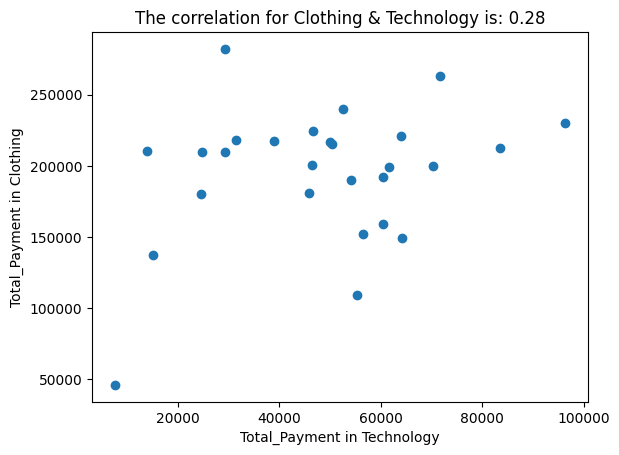

Total Monthly Payment for Souvenir in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1008.78
1    2021-02-28        1219.92
2    2021-03-31         304.98
3    2021-04-30        1853.34
4    2021-05-31         680.34
5    2021-06-30        1372.41
6    2021-07-31         868.02
7    2021-08-31        2228.70
8    2021-09-30        1477.98
9    2021-10-31         340.17
10   2021-11-30        1161.27
11   2021-12-31        1829.88
12   2022-01-31        1595.28
13   2022-02-28        1970.64
14   2022-03-31         140.76
15   2022-04-30        1431.06
16   2022-05-31        1090.89
17   2022-06-30        1290.30
18   2022-07-31         926.67
19   2022-08-31        2076.21
20   2022-09-30        1032.24
21   2022-10-31        1266.84
22   2022-11-30         997.05
23   2022-12-31         516.12
24   2023-01-31        1219.92
25   2023-02-28         938.40
26   2023-03-31         105.57


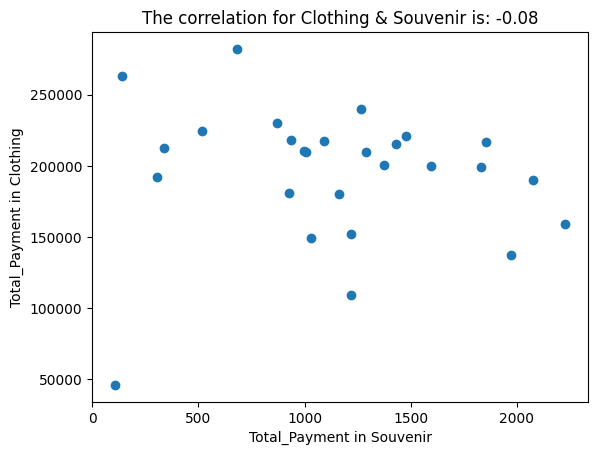

Total Monthly Payment for Shoes in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31      83641.635
1    2021-02-28      79440.445
2    2021-03-31      84841.975
3    2021-04-30      69346.745
4    2021-05-31      86697.080
5    2021-06-30      65745.725
6    2021-07-31     123089.070
7    2021-08-31      64545.385
8    2021-09-30      90789.080
9    2021-10-31     105083.970
10   2021-11-30      96681.590
11   2021-12-31     100991.970
12   2022-01-31      85332.955
13   2022-02-28      46103.900
14   2022-03-31      75784.830
15   2022-04-30      89479.550
16   2022-05-31      71529.045
17   2022-06-30      47195.050
18   2022-07-31     101482.950
19   2022-08-31      77749.125
20   2022-09-30      70983.470
21   2022-10-31      70383.300
22   2022-11-30      37701.520
23   2022-12-31      88606.780
24   2023-01-31     119542.645
25   2023-02-28      39502.030
26   2023-03-31      19096.250
Total Monthly Payment for Books in Emaar Square Mall
   invoice_date  Total_Pay

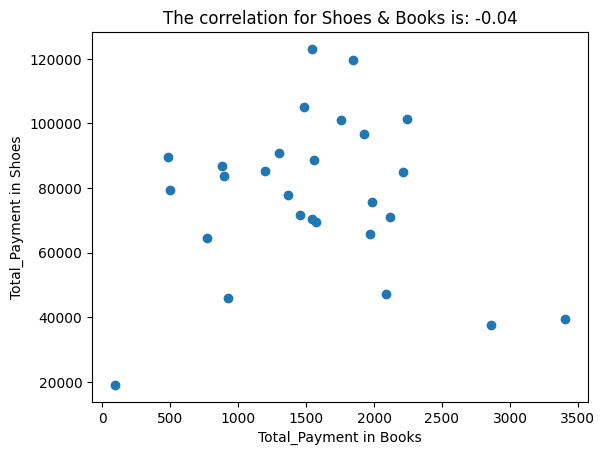

Total Monthly Payment for Cosmetics in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31       12929.88
1    2021-02-28        8741.90
2    2021-03-31       14840.90
3    2021-04-30       13092.52
4    2021-05-31       17443.14
5    2021-06-30       10937.54
6    2021-07-31       12645.26
7    2021-08-31       18459.64
8    2021-09-30       10246.32
9    2021-10-31        8497.94
10   2021-11-30       12685.92
11   2021-12-31       12279.32
12   2022-01-31       11954.04
13   2022-02-28       14027.70
14   2022-03-31       13824.40
15   2022-04-30       10449.62
16   2022-05-31        9921.04
17   2022-06-30       15206.84
18   2022-07-31       14231.00
19   2022-08-31       15369.48
20   2022-09-30       12726.58
21   2022-10-31        8010.02
22   2022-11-30       13214.50
23   2022-12-31       14474.96
24   2023-01-31       19232.18
25   2023-02-28        7074.84
26   2023-03-31        6424.28


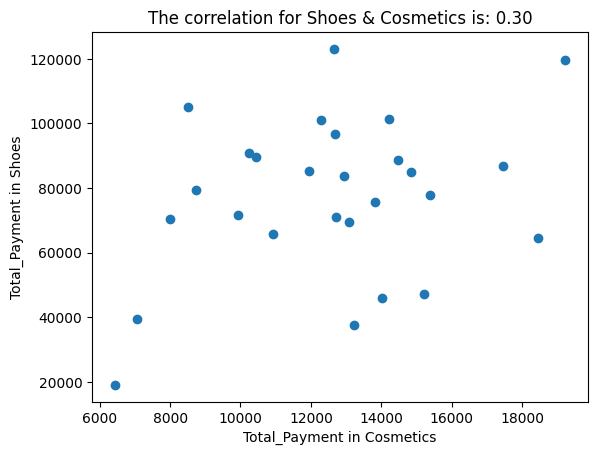

Total Monthly Payment for Food & Beverage in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1668.37
1    2021-02-28        1004.16
2    2021-03-31        2227.98
3    2021-04-30        1380.72
4    2021-05-31        1610.84
5    2021-06-30        2207.06
6    2021-07-31        1605.61
7    2021-08-31        1239.51
8    2021-09-30        1176.75
9    2021-10-31        1056.46
10   2021-11-30        1380.72
11   2021-12-31        1485.32
12   2022-01-31        1861.88
13   2022-02-28        1208.13
14   2022-03-31        1391.18
15   2022-04-30        1673.60
16   2022-05-31        1349.34
17   2022-06-30        2489.48
18   2022-07-31         716.51
19   2022-08-31        1741.59
20   2022-09-30        1715.44
21   2022-10-31        2243.67
22   2022-11-30        1218.59
23   2022-12-31        1757.28
24   2023-01-31        1281.35
25   2023-02-28        1192.44
26   2023-03-31         726.97


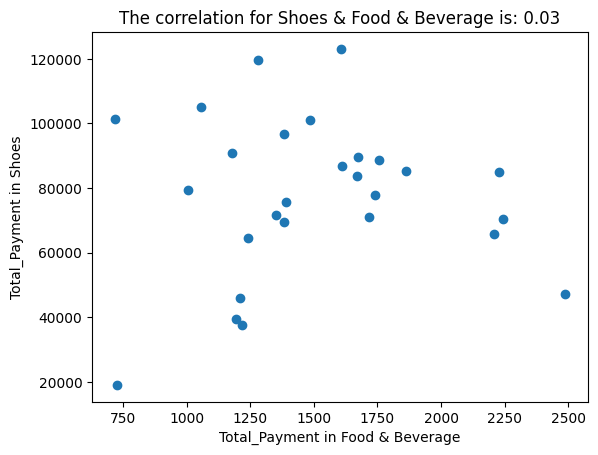

Total Monthly Payment for Toys in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        7203.84
1    2021-02-28        7777.28
2    2021-03-31        6092.80
3    2021-04-30        7203.84
4    2021-05-31        9569.28
5    2021-06-30        5089.28
6    2021-07-31        4910.08
7    2021-08-31        4408.32
8    2021-09-30        8279.04
9    2021-10-31       11432.96
10   2021-11-30        7275.52
11   2021-12-31        7598.08
12   2022-01-31        4730.88
13   2022-02-28        4730.88
14   2022-03-31        5841.92
15   2022-04-30        8780.80
16   2022-05-31        5770.24
17   2022-06-30        5949.44
18   2022-07-31        6666.24
19   2022-08-31        8350.72
20   2022-09-30        5304.32
21   2022-10-31        6200.32
22   2022-11-30        5304.32
23   2022-12-31        9139.20
24   2023-01-31        6737.92
25   2023-02-28        8099.84
26   2023-03-31         645.12


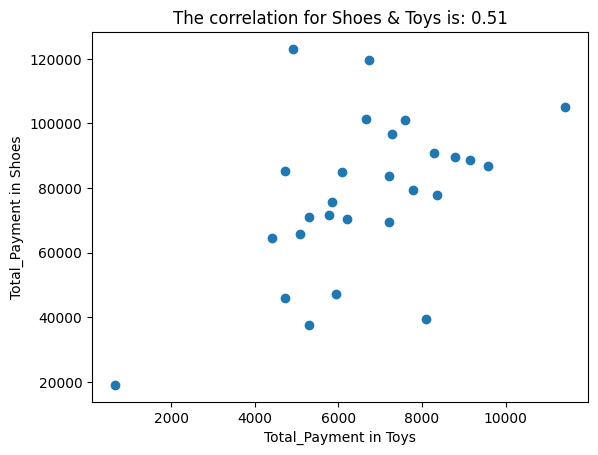

Total Monthly Payment for Technology in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31      24891.825
1    2021-02-28      55280.925
2    2021-03-31      60530.925
3    2021-04-30      50030.925
4    2021-05-31      29339.100
5    2021-06-30      46386.375
6    2021-07-31      96417.300
7    2021-08-31      60530.925
8    2021-09-30      63928.200
9    2021-10-31      83570.025
10   2021-11-30      24644.550
11   2021-12-31      61580.925
12   2022-01-31      70228.200
13   2022-02-28      15194.550
14   2022-03-31      71772.750
15   2022-04-30      50339.100
16   2022-05-31      39036.375
17   2022-06-30      29339.100
18   2022-07-31      45891.825
19   2022-08-31      54230.925
20   2022-09-30      64175.475
21   2022-10-31      52686.375
22   2022-11-30      13897.275
23   2022-12-31      46633.650
24   2023-01-31      56578.200
25   2023-02-28      31439.100
26   2023-03-31       7597.275


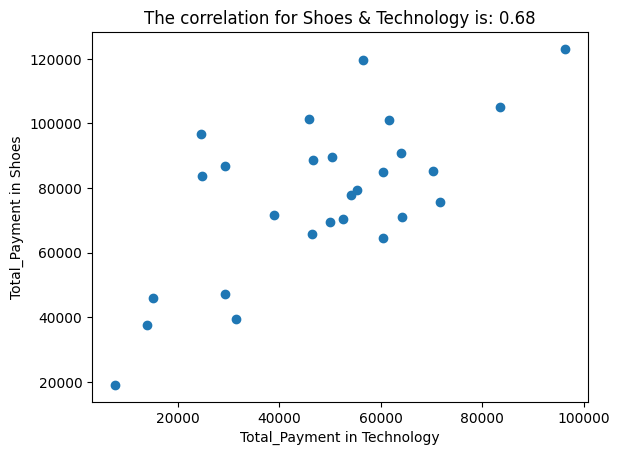

Total Monthly Payment for Souvenir in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1008.78
1    2021-02-28        1219.92
2    2021-03-31         304.98
3    2021-04-30        1853.34
4    2021-05-31         680.34
5    2021-06-30        1372.41
6    2021-07-31         868.02
7    2021-08-31        2228.70
8    2021-09-30        1477.98
9    2021-10-31         340.17
10   2021-11-30        1161.27
11   2021-12-31        1829.88
12   2022-01-31        1595.28
13   2022-02-28        1970.64
14   2022-03-31         140.76
15   2022-04-30        1431.06
16   2022-05-31        1090.89
17   2022-06-30        1290.30
18   2022-07-31         926.67
19   2022-08-31        2076.21
20   2022-09-30        1032.24
21   2022-10-31        1266.84
22   2022-11-30         997.05
23   2022-12-31         516.12
24   2023-01-31        1219.92
25   2023-02-28         938.40
26   2023-03-31         105.57


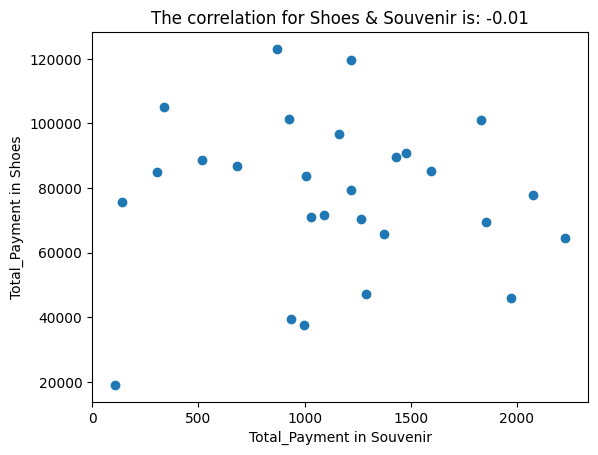

Total Monthly Payment for Books in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31         893.85
1    2021-02-28         499.95
2    2021-03-31        2211.90
3    2021-04-30        1575.60
4    2021-05-31         878.70
5    2021-06-30        1969.50
6    2021-07-31        1545.30
7    2021-08-31         772.65
8    2021-09-30        1302.90
9    2021-10-31        1484.70
10   2021-11-30        1924.05
11   2021-12-31        1757.40
12   2022-01-31        1196.85
13   2022-02-28         924.15
14   2022-03-31        1984.65
15   2022-04-30         484.80
16   2022-05-31        1454.40
17   2022-06-30        2090.70
18   2022-07-31        2242.20
19   2022-08-31        1363.50
20   2022-09-30        2121.00
21   2022-10-31        1545.30
22   2022-11-30        2863.35
23   2022-12-31        1560.45
24   2023-01-31        1848.30
25   2023-02-28        3408.75
26   2023-03-31          90.90
Total Monthly Payment for Cosmetics in Emaar Square Mall
   invoice_date  Total

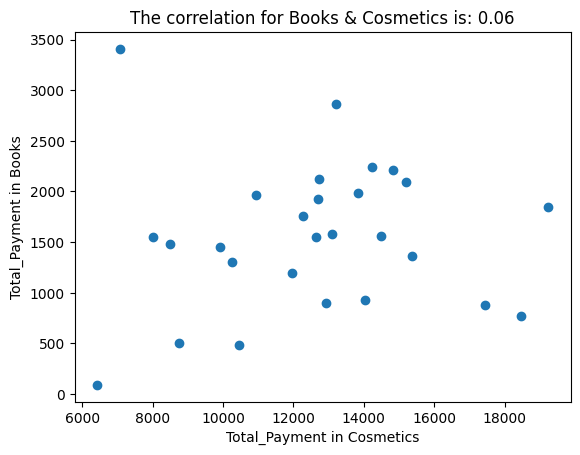

Total Monthly Payment for Food & Beverage in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1668.37
1    2021-02-28        1004.16
2    2021-03-31        2227.98
3    2021-04-30        1380.72
4    2021-05-31        1610.84
5    2021-06-30        2207.06
6    2021-07-31        1605.61
7    2021-08-31        1239.51
8    2021-09-30        1176.75
9    2021-10-31        1056.46
10   2021-11-30        1380.72
11   2021-12-31        1485.32
12   2022-01-31        1861.88
13   2022-02-28        1208.13
14   2022-03-31        1391.18
15   2022-04-30        1673.60
16   2022-05-31        1349.34
17   2022-06-30        2489.48
18   2022-07-31         716.51
19   2022-08-31        1741.59
20   2022-09-30        1715.44
21   2022-10-31        2243.67
22   2022-11-30        1218.59
23   2022-12-31        1757.28
24   2023-01-31        1281.35
25   2023-02-28        1192.44
26   2023-03-31         726.97


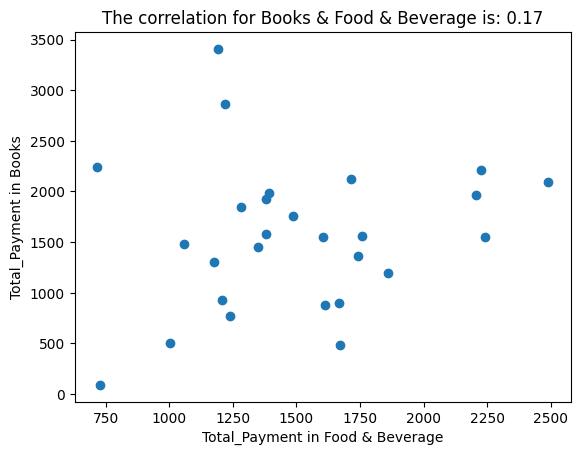

Total Monthly Payment for Toys in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        7203.84
1    2021-02-28        7777.28
2    2021-03-31        6092.80
3    2021-04-30        7203.84
4    2021-05-31        9569.28
5    2021-06-30        5089.28
6    2021-07-31        4910.08
7    2021-08-31        4408.32
8    2021-09-30        8279.04
9    2021-10-31       11432.96
10   2021-11-30        7275.52
11   2021-12-31        7598.08
12   2022-01-31        4730.88
13   2022-02-28        4730.88
14   2022-03-31        5841.92
15   2022-04-30        8780.80
16   2022-05-31        5770.24
17   2022-06-30        5949.44
18   2022-07-31        6666.24
19   2022-08-31        8350.72
20   2022-09-30        5304.32
21   2022-10-31        6200.32
22   2022-11-30        5304.32
23   2022-12-31        9139.20
24   2023-01-31        6737.92
25   2023-02-28        8099.84
26   2023-03-31         645.12


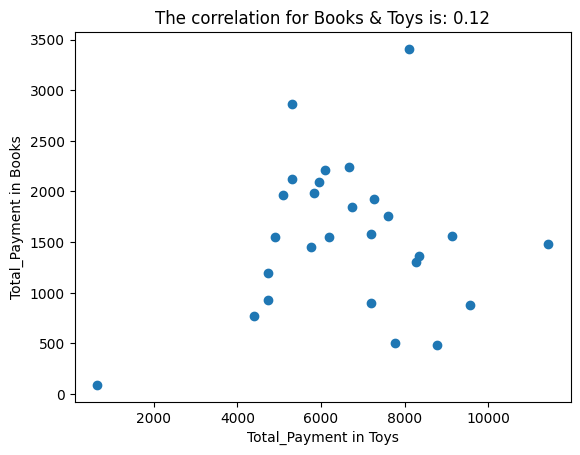

Total Monthly Payment for Technology in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31      24891.825
1    2021-02-28      55280.925
2    2021-03-31      60530.925
3    2021-04-30      50030.925
4    2021-05-31      29339.100
5    2021-06-30      46386.375
6    2021-07-31      96417.300
7    2021-08-31      60530.925
8    2021-09-30      63928.200
9    2021-10-31      83570.025
10   2021-11-30      24644.550
11   2021-12-31      61580.925
12   2022-01-31      70228.200
13   2022-02-28      15194.550
14   2022-03-31      71772.750
15   2022-04-30      50339.100
16   2022-05-31      39036.375
17   2022-06-30      29339.100
18   2022-07-31      45891.825
19   2022-08-31      54230.925
20   2022-09-30      64175.475
21   2022-10-31      52686.375
22   2022-11-30      13897.275
23   2022-12-31      46633.650
24   2023-01-31      56578.200
25   2023-02-28      31439.100
26   2023-03-31       7597.275


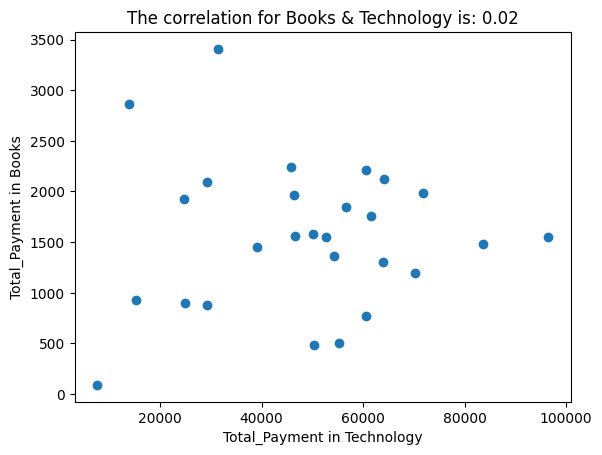

Total Monthly Payment for Souvenir in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1008.78
1    2021-02-28        1219.92
2    2021-03-31         304.98
3    2021-04-30        1853.34
4    2021-05-31         680.34
5    2021-06-30        1372.41
6    2021-07-31         868.02
7    2021-08-31        2228.70
8    2021-09-30        1477.98
9    2021-10-31         340.17
10   2021-11-30        1161.27
11   2021-12-31        1829.88
12   2022-01-31        1595.28
13   2022-02-28        1970.64
14   2022-03-31         140.76
15   2022-04-30        1431.06
16   2022-05-31        1090.89
17   2022-06-30        1290.30
18   2022-07-31         926.67
19   2022-08-31        2076.21
20   2022-09-30        1032.24
21   2022-10-31        1266.84
22   2022-11-30         997.05
23   2022-12-31         516.12
24   2023-01-31        1219.92
25   2023-02-28         938.40
26   2023-03-31         105.57


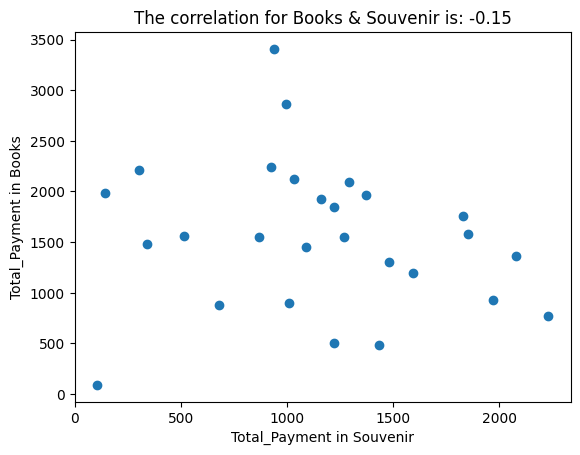

Total Monthly Payment for Cosmetics in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31       12929.88
1    2021-02-28        8741.90
2    2021-03-31       14840.90
3    2021-04-30       13092.52
4    2021-05-31       17443.14
5    2021-06-30       10937.54
6    2021-07-31       12645.26
7    2021-08-31       18459.64
8    2021-09-30       10246.32
9    2021-10-31        8497.94
10   2021-11-30       12685.92
11   2021-12-31       12279.32
12   2022-01-31       11954.04
13   2022-02-28       14027.70
14   2022-03-31       13824.40
15   2022-04-30       10449.62
16   2022-05-31        9921.04
17   2022-06-30       15206.84
18   2022-07-31       14231.00
19   2022-08-31       15369.48
20   2022-09-30       12726.58
21   2022-10-31        8010.02
22   2022-11-30       13214.50
23   2022-12-31       14474.96
24   2023-01-31       19232.18
25   2023-02-28        7074.84
26   2023-03-31        6424.28
Total Monthly Payment for Food & Beverage in Emaar Square Mall
   invoice_d

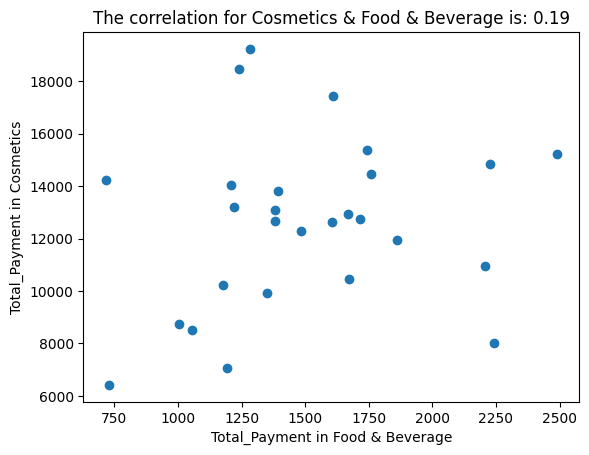

Total Monthly Payment for Toys in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        7203.84
1    2021-02-28        7777.28
2    2021-03-31        6092.80
3    2021-04-30        7203.84
4    2021-05-31        9569.28
5    2021-06-30        5089.28
6    2021-07-31        4910.08
7    2021-08-31        4408.32
8    2021-09-30        8279.04
9    2021-10-31       11432.96
10   2021-11-30        7275.52
11   2021-12-31        7598.08
12   2022-01-31        4730.88
13   2022-02-28        4730.88
14   2022-03-31        5841.92
15   2022-04-30        8780.80
16   2022-05-31        5770.24
17   2022-06-30        5949.44
18   2022-07-31        6666.24
19   2022-08-31        8350.72
20   2022-09-30        5304.32
21   2022-10-31        6200.32
22   2022-11-30        5304.32
23   2022-12-31        9139.20
24   2023-01-31        6737.92
25   2023-02-28        8099.84
26   2023-03-31         645.12


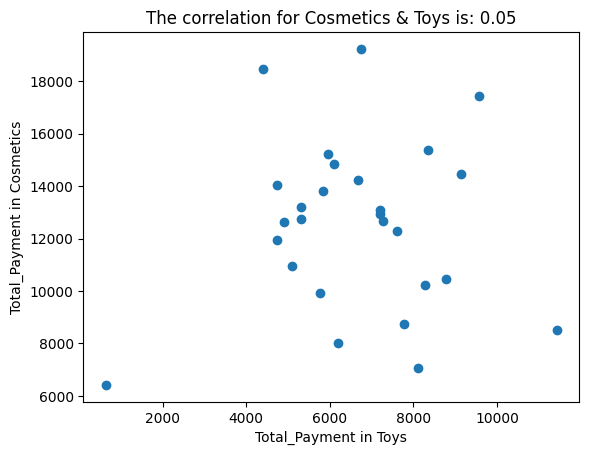

Total Monthly Payment for Technology in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31      24891.825
1    2021-02-28      55280.925
2    2021-03-31      60530.925
3    2021-04-30      50030.925
4    2021-05-31      29339.100
5    2021-06-30      46386.375
6    2021-07-31      96417.300
7    2021-08-31      60530.925
8    2021-09-30      63928.200
9    2021-10-31      83570.025
10   2021-11-30      24644.550
11   2021-12-31      61580.925
12   2022-01-31      70228.200
13   2022-02-28      15194.550
14   2022-03-31      71772.750
15   2022-04-30      50339.100
16   2022-05-31      39036.375
17   2022-06-30      29339.100
18   2022-07-31      45891.825
19   2022-08-31      54230.925
20   2022-09-30      64175.475
21   2022-10-31      52686.375
22   2022-11-30      13897.275
23   2022-12-31      46633.650
24   2023-01-31      56578.200
25   2023-02-28      31439.100
26   2023-03-31       7597.275


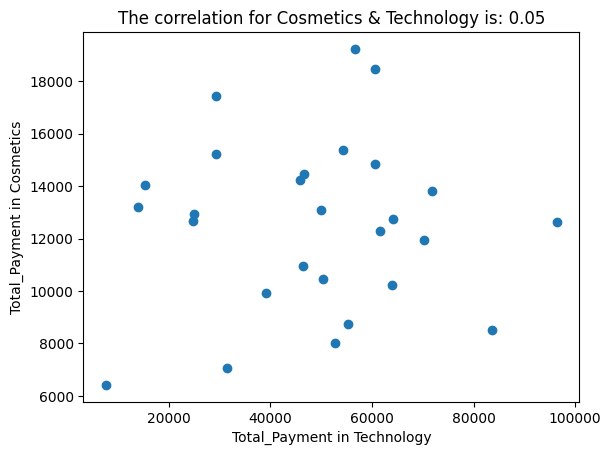

Total Monthly Payment for Souvenir in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1008.78
1    2021-02-28        1219.92
2    2021-03-31         304.98
3    2021-04-30        1853.34
4    2021-05-31         680.34
5    2021-06-30        1372.41
6    2021-07-31         868.02
7    2021-08-31        2228.70
8    2021-09-30        1477.98
9    2021-10-31         340.17
10   2021-11-30        1161.27
11   2021-12-31        1829.88
12   2022-01-31        1595.28
13   2022-02-28        1970.64
14   2022-03-31         140.76
15   2022-04-30        1431.06
16   2022-05-31        1090.89
17   2022-06-30        1290.30
18   2022-07-31         926.67
19   2022-08-31        2076.21
20   2022-09-30        1032.24
21   2022-10-31        1266.84
22   2022-11-30         997.05
23   2022-12-31         516.12
24   2023-01-31        1219.92
25   2023-02-28         938.40
26   2023-03-31         105.57


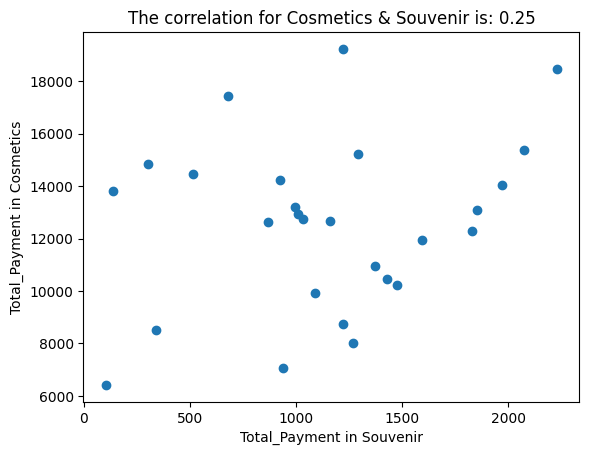

Total Monthly Payment for Food & Beverage in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1668.37
1    2021-02-28        1004.16
2    2021-03-31        2227.98
3    2021-04-30        1380.72
4    2021-05-31        1610.84
5    2021-06-30        2207.06
6    2021-07-31        1605.61
7    2021-08-31        1239.51
8    2021-09-30        1176.75
9    2021-10-31        1056.46
10   2021-11-30        1380.72
11   2021-12-31        1485.32
12   2022-01-31        1861.88
13   2022-02-28        1208.13
14   2022-03-31        1391.18
15   2022-04-30        1673.60
16   2022-05-31        1349.34
17   2022-06-30        2489.48
18   2022-07-31         716.51
19   2022-08-31        1741.59
20   2022-09-30        1715.44
21   2022-10-31        2243.67
22   2022-11-30        1218.59
23   2022-12-31        1757.28
24   2023-01-31        1281.35
25   2023-02-28        1192.44
26   2023-03-31         726.97
Total Monthly Payment for Toys in Emaar Square Mall
   invoice_date  

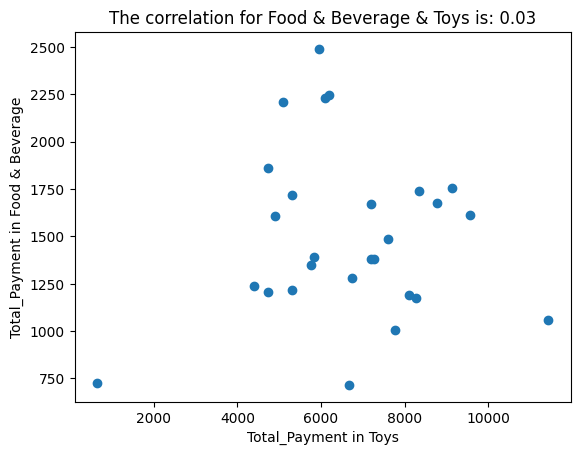

Total Monthly Payment for Technology in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31      24891.825
1    2021-02-28      55280.925
2    2021-03-31      60530.925
3    2021-04-30      50030.925
4    2021-05-31      29339.100
5    2021-06-30      46386.375
6    2021-07-31      96417.300
7    2021-08-31      60530.925
8    2021-09-30      63928.200
9    2021-10-31      83570.025
10   2021-11-30      24644.550
11   2021-12-31      61580.925
12   2022-01-31      70228.200
13   2022-02-28      15194.550
14   2022-03-31      71772.750
15   2022-04-30      50339.100
16   2022-05-31      39036.375
17   2022-06-30      29339.100
18   2022-07-31      45891.825
19   2022-08-31      54230.925
20   2022-09-30      64175.475
21   2022-10-31      52686.375
22   2022-11-30      13897.275
23   2022-12-31      46633.650
24   2023-01-31      56578.200
25   2023-02-28      31439.100
26   2023-03-31       7597.275


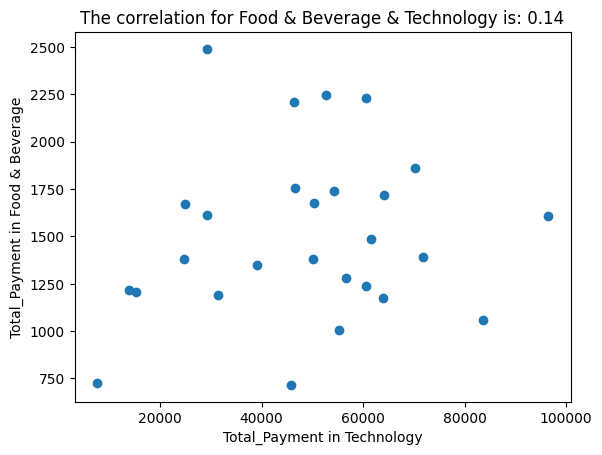

Total Monthly Payment for Souvenir in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1008.78
1    2021-02-28        1219.92
2    2021-03-31         304.98
3    2021-04-30        1853.34
4    2021-05-31         680.34
5    2021-06-30        1372.41
6    2021-07-31         868.02
7    2021-08-31        2228.70
8    2021-09-30        1477.98
9    2021-10-31         340.17
10   2021-11-30        1161.27
11   2021-12-31        1829.88
12   2022-01-31        1595.28
13   2022-02-28        1970.64
14   2022-03-31         140.76
15   2022-04-30        1431.06
16   2022-05-31        1090.89
17   2022-06-30        1290.30
18   2022-07-31         926.67
19   2022-08-31        2076.21
20   2022-09-30        1032.24
21   2022-10-31        1266.84
22   2022-11-30         997.05
23   2022-12-31         516.12
24   2023-01-31        1219.92
25   2023-02-28         938.40
26   2023-03-31         105.57


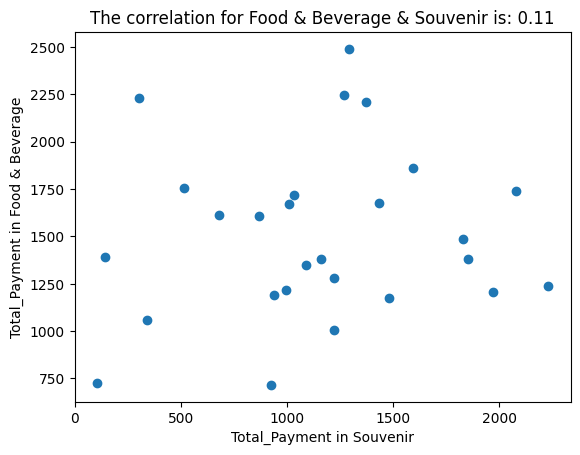

Total Monthly Payment for Toys in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        7203.84
1    2021-02-28        7777.28
2    2021-03-31        6092.80
3    2021-04-30        7203.84
4    2021-05-31        9569.28
5    2021-06-30        5089.28
6    2021-07-31        4910.08
7    2021-08-31        4408.32
8    2021-09-30        8279.04
9    2021-10-31       11432.96
10   2021-11-30        7275.52
11   2021-12-31        7598.08
12   2022-01-31        4730.88
13   2022-02-28        4730.88
14   2022-03-31        5841.92
15   2022-04-30        8780.80
16   2022-05-31        5770.24
17   2022-06-30        5949.44
18   2022-07-31        6666.24
19   2022-08-31        8350.72
20   2022-09-30        5304.32
21   2022-10-31        6200.32
22   2022-11-30        5304.32
23   2022-12-31        9139.20
24   2023-01-31        6737.92
25   2023-02-28        8099.84
26   2023-03-31         645.12
Total Monthly Payment for Technology in Emaar Square Mall
   invoice_date  Total

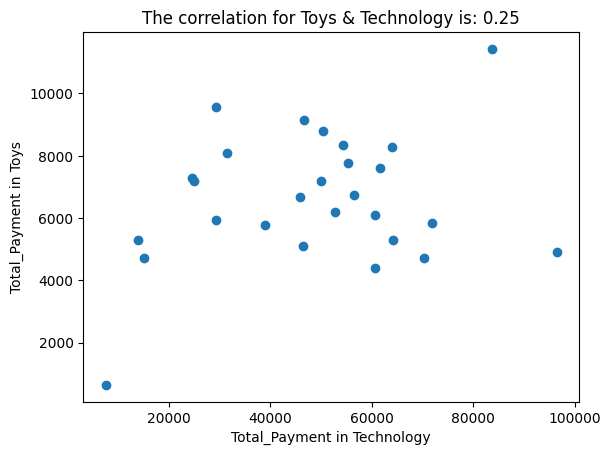

Total Monthly Payment for Souvenir in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1008.78
1    2021-02-28        1219.92
2    2021-03-31         304.98
3    2021-04-30        1853.34
4    2021-05-31         680.34
5    2021-06-30        1372.41
6    2021-07-31         868.02
7    2021-08-31        2228.70
8    2021-09-30        1477.98
9    2021-10-31         340.17
10   2021-11-30        1161.27
11   2021-12-31        1829.88
12   2022-01-31        1595.28
13   2022-02-28        1970.64
14   2022-03-31         140.76
15   2022-04-30        1431.06
16   2022-05-31        1090.89
17   2022-06-30        1290.30
18   2022-07-31         926.67
19   2022-08-31        2076.21
20   2022-09-30        1032.24
21   2022-10-31        1266.84
22   2022-11-30         997.05
23   2022-12-31         516.12
24   2023-01-31        1219.92
25   2023-02-28         938.40
26   2023-03-31         105.57


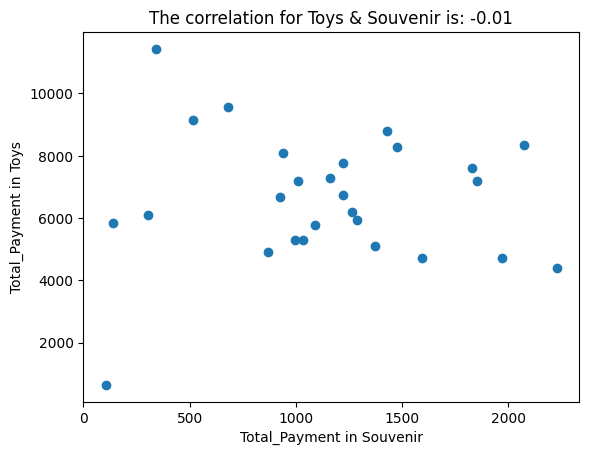

Total Monthly Payment for Technology in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31      24891.825
1    2021-02-28      55280.925
2    2021-03-31      60530.925
3    2021-04-30      50030.925
4    2021-05-31      29339.100
5    2021-06-30      46386.375
6    2021-07-31      96417.300
7    2021-08-31      60530.925
8    2021-09-30      63928.200
9    2021-10-31      83570.025
10   2021-11-30      24644.550
11   2021-12-31      61580.925
12   2022-01-31      70228.200
13   2022-02-28      15194.550
14   2022-03-31      71772.750
15   2022-04-30      50339.100
16   2022-05-31      39036.375
17   2022-06-30      29339.100
18   2022-07-31      45891.825
19   2022-08-31      54230.925
20   2022-09-30      64175.475
21   2022-10-31      52686.375
22   2022-11-30      13897.275
23   2022-12-31      46633.650
24   2023-01-31      56578.200
25   2023-02-28      31439.100
26   2023-03-31       7597.275
Total Monthly Payment for Souvenir in Emaar Square Mall
   invoice_date  T

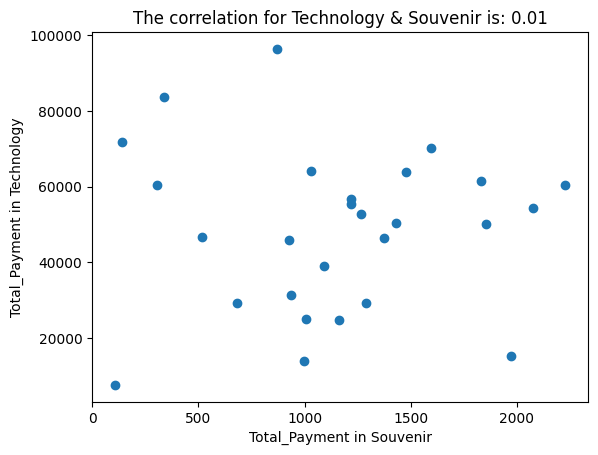

Total Monthly Payment for Souvenir in Emaar Square Mall
   invoice_date  Total_Payment
0    2021-01-31        1008.78
1    2021-02-28        1219.92
2    2021-03-31         304.98
3    2021-04-30        1853.34
4    2021-05-31         680.34
5    2021-06-30        1372.41
6    2021-07-31         868.02
7    2021-08-31        2228.70
8    2021-09-30        1477.98
9    2021-10-31         340.17
10   2021-11-30        1161.27
11   2021-12-31        1829.88
12   2022-01-31        1595.28
13   2022-02-28        1970.64
14   2022-03-31         140.76
15   2022-04-30        1431.06
16   2022-05-31        1090.89
17   2022-06-30        1290.30
18   2022-07-31         926.67
19   2022-08-31        2076.21
20   2022-09-30        1032.24
21   2022-10-31        1266.84
22   2022-11-30         997.05
23   2022-12-31         516.12
24   2023-01-31        1219.92
25   2023-02-28         938.40
26   2023-03-31         105.57


In [70]:
# creating an empty dictionary to store the correlation values
correlation_dict_Emaar_Square_Mall= {}

categories = df['category'].unique()
for i, category_i in enumerate(categories):
    filtered_df_i = df[(df['category'] == category_i) & (df['shopping_mall'] == 'Emaar Square Mall')]

    result_df_i = filtered_df_i.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

    result_df_i = result_df_i.reset_index()

    result_df_i = result_df_i.rename(columns={'Total_Payment': 'Total_Payment'})

    print('Total Monthly Payment for', category_i, 'in Emaar Square Mall')
    print(result_df_i)

    for j in range(i + 1, len(categories)):
        category_j = categories[j]
        filtered_df_j = df[(df['category'] == category_j) & (df['shopping_mall'] == 'Emaar Square Mall')]

        result_df_j = filtered_df_j.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

        result_df_j = result_df_j.reset_index()

        result_df_j = result_df_j.rename(columns={'Total_Payment': 'Total_Payment'})

        print('Total Monthly Payment for', category_j, 'in Emaar Square Mall')
        print(result_df_j)

        correlation_key = f'The correlation for {category_i} & {category_j} is'
        correlation_value = result_df_i['Total_Payment'].corr(result_df_j['Total_Payment'])
        correlation_dict_Emaar_Square_Mall[correlation_key] = correlation_value

        plt.scatter(result_df_j['Total_Payment'], result_df_i['Total_Payment'])
        plt.xlabel(f'Total_Payment in {category_j}')
        plt.ylabel(f'Total_Payment in {category_i}')
        plt.title(f'{correlation_key}: {correlation_value:.2f}')
        plt.show()



In [71]:
correlation_dict_Emaar_Square_Mall

{'The correlation for Clothing & Shoes is': 0.3278020618306169,
 'The correlation for Clothing & Books is': 0.35452576682005277,
 'The correlation for Clothing & Cosmetics is': 0.16554668619560742,
 'The correlation for Clothing & Food & Beverage is': 0.4248284129780588,
 'The correlation for Clothing & Toys is': 0.5359235393531103,
 'The correlation for Clothing & Technology is': 0.28222748203393827,
 'The correlation for Clothing & Souvenir is': -0.0765584086361198,
 'The correlation for Shoes & Books is': -0.04364038304063776,
 'The correlation for Shoes & Cosmetics is': 0.30143071294100615,
 'The correlation for Shoes & Food & Beverage is': 0.03378515907438762,
 'The correlation for Shoes & Toys is': 0.5054942024009358,
 'The correlation for Shoes & Technology is': 0.676238794007046,
 'The correlation for Shoes & Souvenir is': -0.009542952950467979,
 'The correlation for Books & Cosmetics is': 0.06052652817195238,
 'The correlation for Books & Food & Beverage is': 0.166269157114272

In [72]:
# Create a new dictionary with correlations >= 0.65
filtered_correlation_dict_Emaar_Square_Mall = {key: value for key, value in correlation_dict_Emaar_Square_Mall.items() if value >= 0.65}

# Print the filtered dictionary
print(filtered_correlation_dict_Emaar_Square_Mall)

{'The correlation for Shoes & Technology is': 0.676238794007046}


In [73]:
table_Emaar_Square = {
    'city': ['Istanbull'],
    'mall': ['Emaar Square Mall'],
    'correlation': [0.676238794007046],
    'item1': ['Shoes'],
    'item2': ['Technology']
}
# Creating a DataFrame from the data
table_Emaar_Square = pd.DataFrame(table_Emaar_Square)
correlation_table= pd.concat([correlation_table, table_Emaar_Square], ignore_index=True)
correlation_table

,city,mall,correlation,item1,item2
0,Istanbull,Forum istanbul Mall,0.697743,Cosmetics,Toys
1,Istanbull,Kanyon Mall,0.668588,Clothing,Shoes
2,Istanbull,Kanyon Mall,0.747761,Cosmetics,Technology
3,Istanbull,Metrocity Mall,0.744072,Clothing,Toys
4,Istanbull,Metrocity Mall,0.676121,Shoes,Cosmetics
5,Istanbull,Metrocity Mall,0.708054,Cosmetics,Toys
6,Istanbull,Metrocity Mall,0.668409,Cosmetics,Technology
7,Istanbull,Metropol AVM,0.719752,Clothing,Food & Beverage
8,Istanbull,Mall of Istanbul,0.735008,Clothing,Shoes
9,Istanbull,Mall of Istanbul,0.709251,Clothing,Food & Beverage


## Correlation between Different Categories for Cevahir_AVM_Mall

Total Monthly Payment for Clothing in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31     244702.650
1    2021-02-28     150695.470
2    2021-03-31     210656.985
3    2021-04-30     201517.960
4    2021-05-31     233872.940
5    2021-06-30     206592.490
6    2021-07-31     230189.840
7    2021-08-31     173665.005
8    2021-09-30     238619.735
9    2021-10-31     226752.335
10   2021-11-30     229644.165
11   2021-12-31     256242.315
12   2022-01-31     223261.170
13   2022-02-28     176747.945
14   2022-03-31     182503.950
15   2022-04-30     181221.490
16   2022-05-31     196389.770
17   2022-06-30     153641.785
18   2022-07-31     217886.560
19   2022-08-31     227925.825
20   2022-09-30     204409.790
21   2022-10-31     203891.770
22   2022-11-30     153941.865
23   2022-12-31     193715.880
24   2023-01-31     165808.440
25   2023-02-28     193634.565
26   2023-03-31      97853.735
Total Monthly Payment for Shoes in Cevahir AVM Mall
   invoice_date  Total_Pa

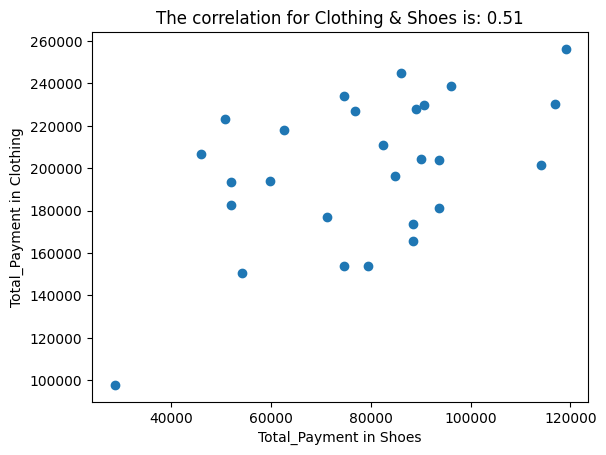

Total Monthly Payment for Books in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2378.55
1    2021-02-28        1590.75
2    2021-03-31        2105.85
3    2021-04-30        1727.10
4    2021-05-31        2984.55
5    2021-06-30        1545.30
6    2021-07-31        2181.60
7    2021-08-31        2711.85
8    2021-09-30        2181.60
9    2021-10-31        1227.15
10   2021-11-30        1333.20
11   2021-12-31        2575.50
12   2022-01-31        1151.40
13   2022-02-28        1499.85
14   2022-03-31        1060.50
15   2022-04-30         833.25
16   2022-05-31        1363.50
17   2022-06-30        2227.05
18   2022-07-31        1105.95
19   2022-08-31         712.05
20   2022-09-30        3211.80
21   2022-10-31        1348.35
22   2022-11-30        1833.15
23   2022-12-31        1515.00
24   2023-01-31        1302.90
25   2023-02-28         212.10
26   2023-03-31         621.15


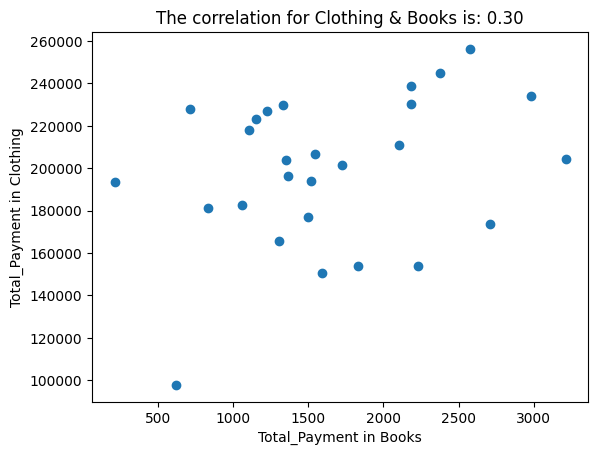

Total Monthly Payment for Cosmetics in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       13173.84
1    2021-02-28        9107.84
2    2021-03-31       13377.14
3    2021-04-30       14231.00
4    2021-05-31       17280.50
5    2021-06-30       16142.02
6    2021-07-31       12279.32
7    2021-08-31        7278.14
8    2021-09-30        8701.24
9    2021-10-31       15654.10
10   2021-11-30        9799.06
11   2021-12-31       10652.92
12   2022-01-31       15166.18
13   2022-02-28       10530.94
14   2022-03-31       11791.40
15   2022-04-30       11750.74
16   2022-05-31       14596.94
17   2022-06-30        7684.74
18   2022-07-31       11954.04
19   2022-08-31       10083.68
20   2022-09-30       15816.74
21   2022-10-31       18337.66
22   2022-11-30       10368.30
23   2022-12-31       10612.26
24   2023-01-31       12523.28
25   2023-02-28        8375.96
26   2023-03-31        3944.02


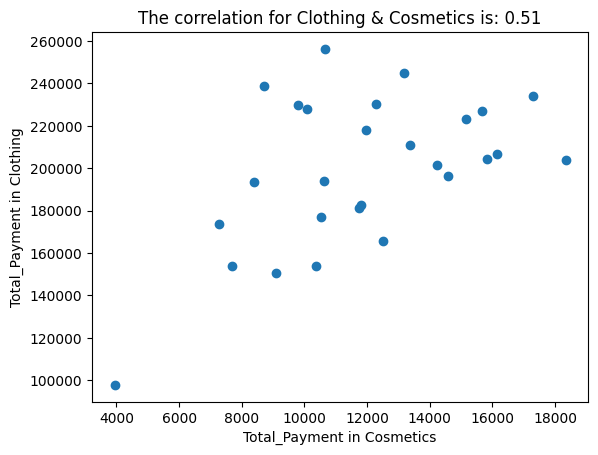

Total Monthly Payment for Food & Beverage in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2264.59
1    2021-02-28        1385.95
2    2021-03-31        1888.03
3    2021-04-30        1762.51
4    2021-05-31        1223.82
5    2021-06-30        2426.72
6    2021-07-31        1391.18
7    2021-08-31        1888.03
8    2021-09-30         753.12
9    2021-10-31        1584.69
10   2021-11-30        1636.99
11   2021-12-31        2390.11
12   2022-01-31        1365.03
13   2022-02-28        1229.05
14   2022-03-31        1772.97
15   2022-04-30        2243.67
16   2022-05-31        1527.16
17   2022-06-30        1636.99
18   2022-07-31        2505.17
19   2022-08-31        1767.74
20   2022-09-30         617.14
21   2022-10-31        1380.72
22   2022-11-30        2107.69
23   2022-12-31        1804.35
24   2023-01-31        1657.91
25   2023-02-28        1579.46
26   2023-03-31         219.66


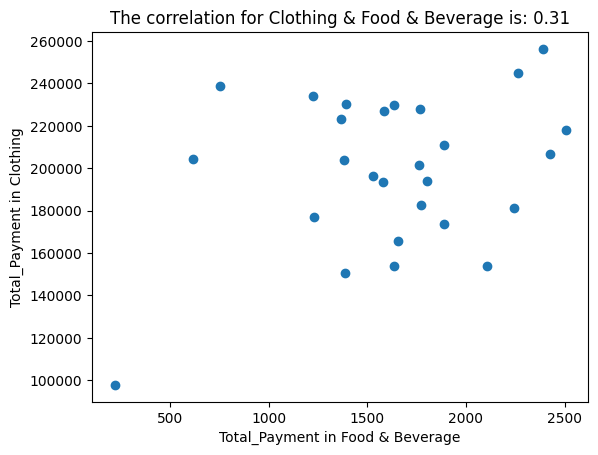

Total Monthly Payment for Toys in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       14515.20
1    2021-02-28        4551.68
2    2021-03-31        6056.96
3    2021-04-30        6164.48
4    2021-05-31        9139.20
5    2021-06-30        6272.00
6    2021-07-31       12687.36
7    2021-08-31        8709.12
8    2021-09-30        5877.76
9    2021-10-31        7168.00
10   2021-11-30        8816.64
11   2021-12-31        8314.88
12   2022-01-31        7633.92
13   2022-02-28        6487.04
14   2022-03-31       10895.36
15   2022-04-30        6415.36
16   2022-05-31        7132.16
17   2022-06-30        7311.36
18   2022-07-31        8960.00
19   2022-08-31       10214.40
20   2022-09-30        8171.52
21   2022-10-31        4945.92
22   2022-11-30       11576.32
23   2022-12-31        4444.16
24   2023-01-31        5591.04
25   2023-02-28        4910.08
26   2023-03-31        1146.88


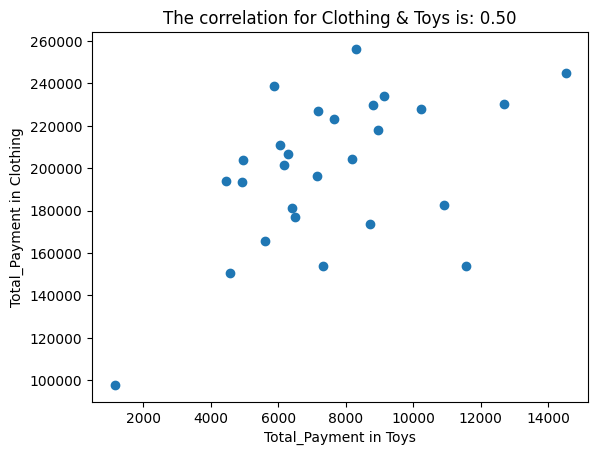

Total Monthly Payment for Technology in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      25941.825
1    2021-02-28      25941.825
2    2021-03-31      74428.200
3    2021-04-30      11797.275
4    2021-05-31      36689.100
5    2021-06-30      40086.375
6    2021-07-31      33291.825
7    2021-08-31      40086.375
8    2021-09-30      34341.825
9    2021-10-31      75170.025
10   2021-11-30      58678.200
11   2021-12-31      26189.100
12   2022-01-31      69672.750
13   2022-02-28      79122.750
14   2022-03-31      46633.650
15   2022-04-30      18344.550
16   2022-05-31      96664.575
17   2022-06-30      86720.025
18   2022-07-31      53983.650
19   2022-08-31      47930.925
20   2022-09-30      79370.025
21   2022-10-31      33786.375
22   2022-11-30      61580.925
23   2022-12-31      27239.100
24   2023-01-31      21741.825
25   2023-02-28      72575.475
26   2023-03-31       6547.275


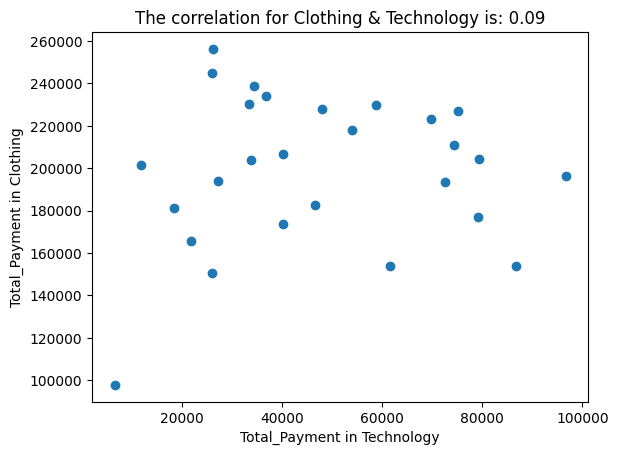

Total Monthly Payment for Souvenir in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        1243.38
1    2021-02-28        1759.50
2    2021-03-31        1419.33
3    2021-04-30        1524.90
4    2021-05-31        1266.84
5    2021-06-30        1067.43
6    2021-07-31         997.05
7    2021-08-31         727.26
8    2021-09-30         375.36
9    2021-10-31        1712.58
10   2021-11-30         914.94
11   2021-12-31         293.25
12   2022-01-31        1032.24
13   2022-02-28        1700.85
14   2022-03-31        1208.19
15   2022-04-30        1419.33
16   2022-05-31         457.47
17   2022-06-30        1935.45
18   2022-07-31        1583.55
19   2022-08-31         398.82
20   2022-09-30         504.39
21   2022-10-31        1032.24
22   2022-11-30        1736.04
23   2022-12-31        1290.30
24   2023-01-31         832.83
25   2023-02-28         844.56
26   2023-03-31         445.74


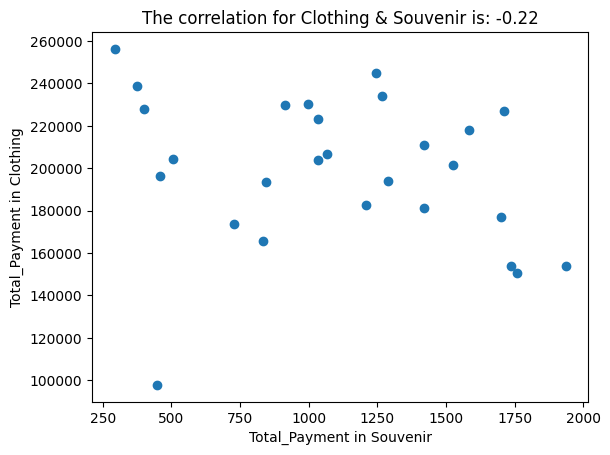

Total Monthly Payment for Shoes in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      86096.910
1    2021-02-28      54233.305
2    2021-03-31      82386.700
3    2021-04-30     114086.520
4    2021-05-31      74584.490
5    2021-06-30      45994.710
6    2021-07-31     116978.180
7    2021-08-31      88388.400
8    2021-09-30      96136.015
9    2021-10-31      76930.575
10   2021-11-30      90679.890
11   2021-12-31     119051.665
12   2022-01-31      50796.070
13   2022-02-28      71256.445
14   2022-03-31      52051.005
15   2022-04-30      93735.335
16   2022-05-31      84787.380
17   2022-06-30      79385.850
18   2022-07-31      62581.090
19   2022-08-31      89043.165
20   2022-09-30      90134.315
21   2022-10-31      93735.335
22   2022-11-30      74584.490
23   2022-12-31      59744.025
24   2023-01-31      88388.400
25   2023-02-28      51941.815
26   2023-03-31      28698.970
Total Monthly Payment for Books in Cevahir AVM Mall
   invoice_date  Total_Payme

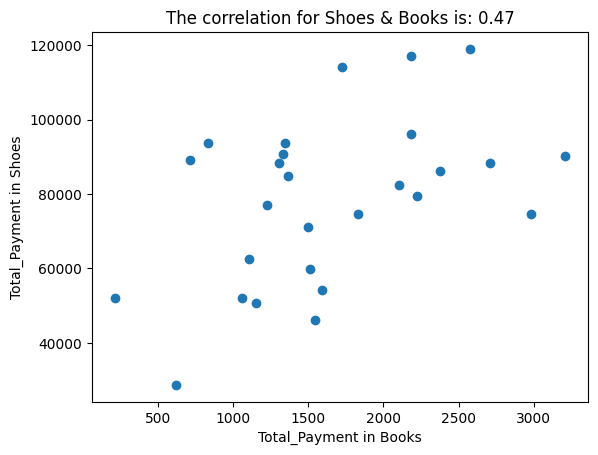

Total Monthly Payment for Cosmetics in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       13173.84
1    2021-02-28        9107.84
2    2021-03-31       13377.14
3    2021-04-30       14231.00
4    2021-05-31       17280.50
5    2021-06-30       16142.02
6    2021-07-31       12279.32
7    2021-08-31        7278.14
8    2021-09-30        8701.24
9    2021-10-31       15654.10
10   2021-11-30        9799.06
11   2021-12-31       10652.92
12   2022-01-31       15166.18
13   2022-02-28       10530.94
14   2022-03-31       11791.40
15   2022-04-30       11750.74
16   2022-05-31       14596.94
17   2022-06-30        7684.74
18   2022-07-31       11954.04
19   2022-08-31       10083.68
20   2022-09-30       15816.74
21   2022-10-31       18337.66
22   2022-11-30       10368.30
23   2022-12-31       10612.26
24   2023-01-31       12523.28
25   2023-02-28        8375.96
26   2023-03-31        3944.02


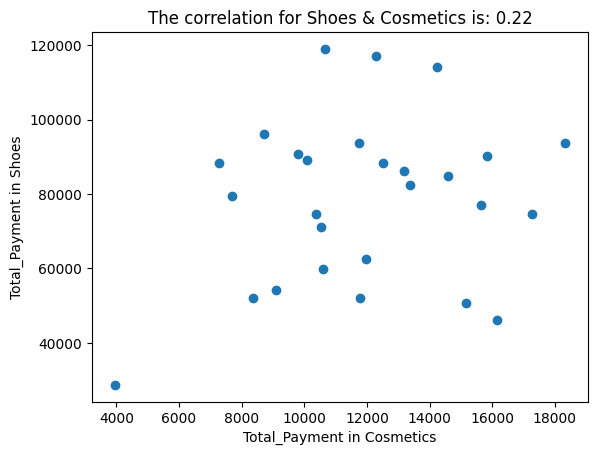

Total Monthly Payment for Food & Beverage in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2264.59
1    2021-02-28        1385.95
2    2021-03-31        1888.03
3    2021-04-30        1762.51
4    2021-05-31        1223.82
5    2021-06-30        2426.72
6    2021-07-31        1391.18
7    2021-08-31        1888.03
8    2021-09-30         753.12
9    2021-10-31        1584.69
10   2021-11-30        1636.99
11   2021-12-31        2390.11
12   2022-01-31        1365.03
13   2022-02-28        1229.05
14   2022-03-31        1772.97
15   2022-04-30        2243.67
16   2022-05-31        1527.16
17   2022-06-30        1636.99
18   2022-07-31        2505.17
19   2022-08-31        1767.74
20   2022-09-30         617.14
21   2022-10-31        1380.72
22   2022-11-30        2107.69
23   2022-12-31        1804.35
24   2023-01-31        1657.91
25   2023-02-28        1579.46
26   2023-03-31         219.66


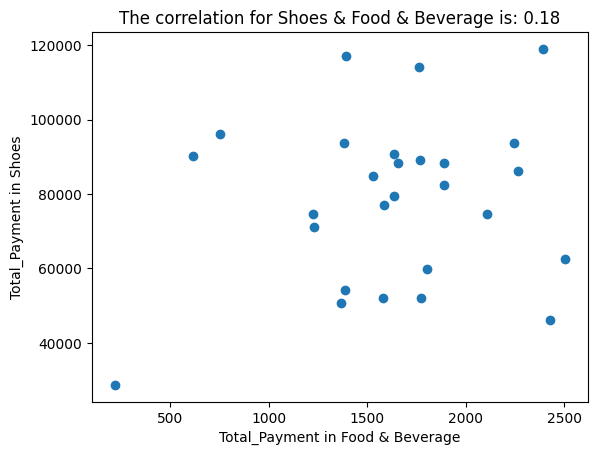

Total Monthly Payment for Toys in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       14515.20
1    2021-02-28        4551.68
2    2021-03-31        6056.96
3    2021-04-30        6164.48
4    2021-05-31        9139.20
5    2021-06-30        6272.00
6    2021-07-31       12687.36
7    2021-08-31        8709.12
8    2021-09-30        5877.76
9    2021-10-31        7168.00
10   2021-11-30        8816.64
11   2021-12-31        8314.88
12   2022-01-31        7633.92
13   2022-02-28        6487.04
14   2022-03-31       10895.36
15   2022-04-30        6415.36
16   2022-05-31        7132.16
17   2022-06-30        7311.36
18   2022-07-31        8960.00
19   2022-08-31       10214.40
20   2022-09-30        8171.52
21   2022-10-31        4945.92
22   2022-11-30       11576.32
23   2022-12-31        4444.16
24   2023-01-31        5591.04
25   2023-02-28        4910.08
26   2023-03-31        1146.88


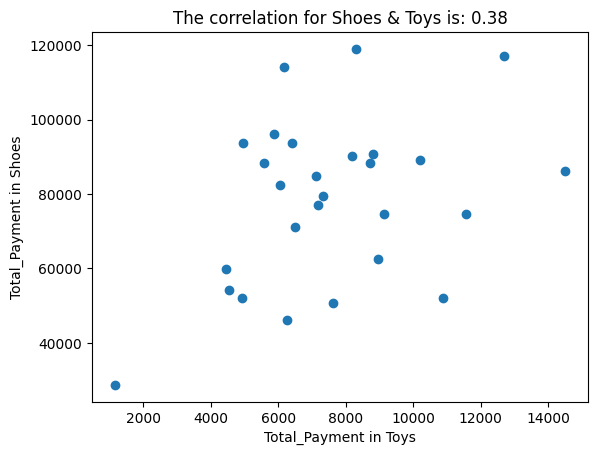

Total Monthly Payment for Technology in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      25941.825
1    2021-02-28      25941.825
2    2021-03-31      74428.200
3    2021-04-30      11797.275
4    2021-05-31      36689.100
5    2021-06-30      40086.375
6    2021-07-31      33291.825
7    2021-08-31      40086.375
8    2021-09-30      34341.825
9    2021-10-31      75170.025
10   2021-11-30      58678.200
11   2021-12-31      26189.100
12   2022-01-31      69672.750
13   2022-02-28      79122.750
14   2022-03-31      46633.650
15   2022-04-30      18344.550
16   2022-05-31      96664.575
17   2022-06-30      86720.025
18   2022-07-31      53983.650
19   2022-08-31      47930.925
20   2022-09-30      79370.025
21   2022-10-31      33786.375
22   2022-11-30      61580.925
23   2022-12-31      27239.100
24   2023-01-31      21741.825
25   2023-02-28      72575.475
26   2023-03-31       6547.275


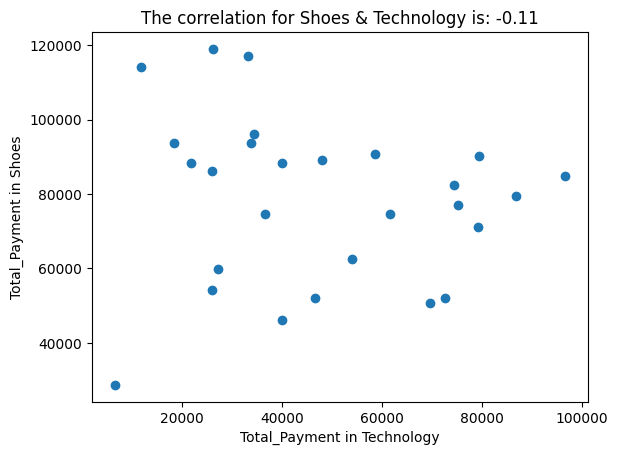

Total Monthly Payment for Souvenir in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        1243.38
1    2021-02-28        1759.50
2    2021-03-31        1419.33
3    2021-04-30        1524.90
4    2021-05-31        1266.84
5    2021-06-30        1067.43
6    2021-07-31         997.05
7    2021-08-31         727.26
8    2021-09-30         375.36
9    2021-10-31        1712.58
10   2021-11-30         914.94
11   2021-12-31         293.25
12   2022-01-31        1032.24
13   2022-02-28        1700.85
14   2022-03-31        1208.19
15   2022-04-30        1419.33
16   2022-05-31         457.47
17   2022-06-30        1935.45
18   2022-07-31        1583.55
19   2022-08-31         398.82
20   2022-09-30         504.39
21   2022-10-31        1032.24
22   2022-11-30        1736.04
23   2022-12-31        1290.30
24   2023-01-31         832.83
25   2023-02-28         844.56
26   2023-03-31         445.74


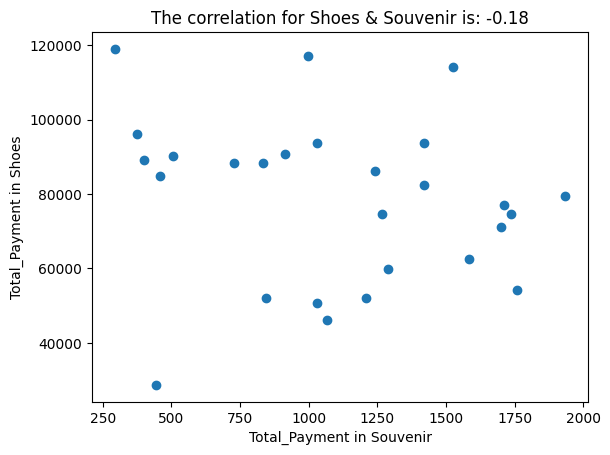

Total Monthly Payment for Books in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2378.55
1    2021-02-28        1590.75
2    2021-03-31        2105.85
3    2021-04-30        1727.10
4    2021-05-31        2984.55
5    2021-06-30        1545.30
6    2021-07-31        2181.60
7    2021-08-31        2711.85
8    2021-09-30        2181.60
9    2021-10-31        1227.15
10   2021-11-30        1333.20
11   2021-12-31        2575.50
12   2022-01-31        1151.40
13   2022-02-28        1499.85
14   2022-03-31        1060.50
15   2022-04-30         833.25
16   2022-05-31        1363.50
17   2022-06-30        2227.05
18   2022-07-31        1105.95
19   2022-08-31         712.05
20   2022-09-30        3211.80
21   2022-10-31        1348.35
22   2022-11-30        1833.15
23   2022-12-31        1515.00
24   2023-01-31        1302.90
25   2023-02-28         212.10
26   2023-03-31         621.15
Total Monthly Payment for Cosmetics in Cevahir AVM Mall
   invoice_date  Total_P

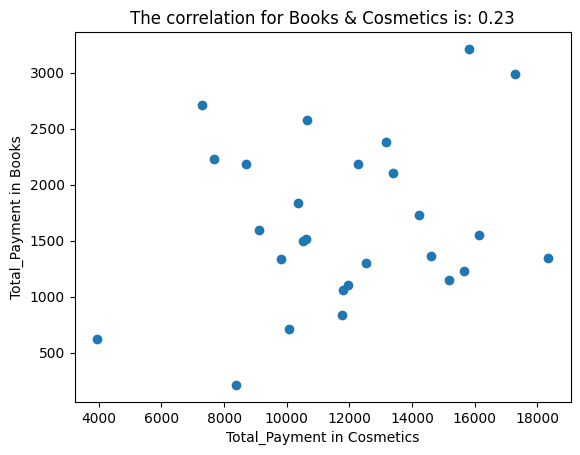

Total Monthly Payment for Food & Beverage in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2264.59
1    2021-02-28        1385.95
2    2021-03-31        1888.03
3    2021-04-30        1762.51
4    2021-05-31        1223.82
5    2021-06-30        2426.72
6    2021-07-31        1391.18
7    2021-08-31        1888.03
8    2021-09-30         753.12
9    2021-10-31        1584.69
10   2021-11-30        1636.99
11   2021-12-31        2390.11
12   2022-01-31        1365.03
13   2022-02-28        1229.05
14   2022-03-31        1772.97
15   2022-04-30        2243.67
16   2022-05-31        1527.16
17   2022-06-30        1636.99
18   2022-07-31        2505.17
19   2022-08-31        1767.74
20   2022-09-30         617.14
21   2022-10-31        1380.72
22   2022-11-30        2107.69
23   2022-12-31        1804.35
24   2023-01-31        1657.91
25   2023-02-28        1579.46
26   2023-03-31         219.66


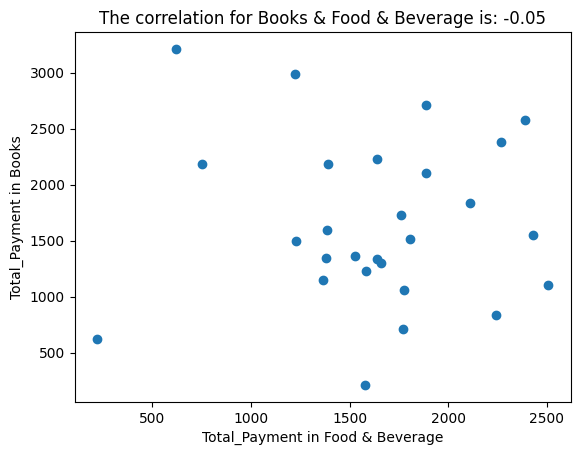

Total Monthly Payment for Toys in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       14515.20
1    2021-02-28        4551.68
2    2021-03-31        6056.96
3    2021-04-30        6164.48
4    2021-05-31        9139.20
5    2021-06-30        6272.00
6    2021-07-31       12687.36
7    2021-08-31        8709.12
8    2021-09-30        5877.76
9    2021-10-31        7168.00
10   2021-11-30        8816.64
11   2021-12-31        8314.88
12   2022-01-31        7633.92
13   2022-02-28        6487.04
14   2022-03-31       10895.36
15   2022-04-30        6415.36
16   2022-05-31        7132.16
17   2022-06-30        7311.36
18   2022-07-31        8960.00
19   2022-08-31       10214.40
20   2022-09-30        8171.52
21   2022-10-31        4945.92
22   2022-11-30       11576.32
23   2022-12-31        4444.16
24   2023-01-31        5591.04
25   2023-02-28        4910.08
26   2023-03-31        1146.88


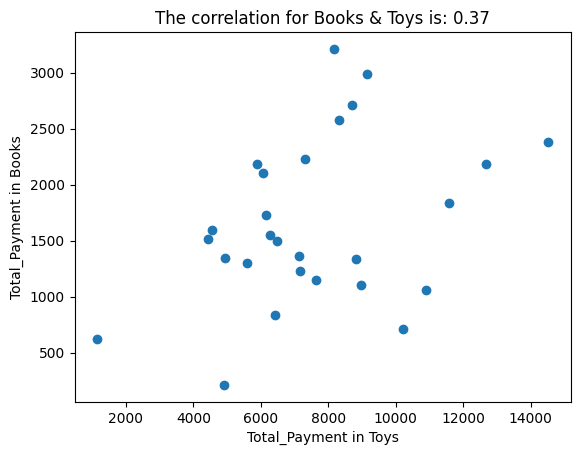

Total Monthly Payment for Technology in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      25941.825
1    2021-02-28      25941.825
2    2021-03-31      74428.200
3    2021-04-30      11797.275
4    2021-05-31      36689.100
5    2021-06-30      40086.375
6    2021-07-31      33291.825
7    2021-08-31      40086.375
8    2021-09-30      34341.825
9    2021-10-31      75170.025
10   2021-11-30      58678.200
11   2021-12-31      26189.100
12   2022-01-31      69672.750
13   2022-02-28      79122.750
14   2022-03-31      46633.650
15   2022-04-30      18344.550
16   2022-05-31      96664.575
17   2022-06-30      86720.025
18   2022-07-31      53983.650
19   2022-08-31      47930.925
20   2022-09-30      79370.025
21   2022-10-31      33786.375
22   2022-11-30      61580.925
23   2022-12-31      27239.100
24   2023-01-31      21741.825
25   2023-02-28      72575.475
26   2023-03-31       6547.275


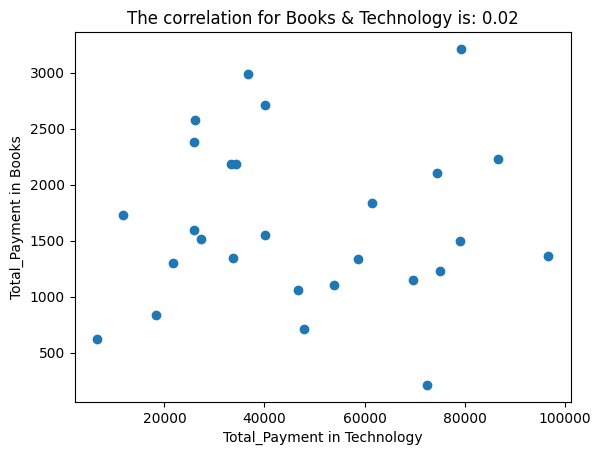

Total Monthly Payment for Souvenir in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        1243.38
1    2021-02-28        1759.50
2    2021-03-31        1419.33
3    2021-04-30        1524.90
4    2021-05-31        1266.84
5    2021-06-30        1067.43
6    2021-07-31         997.05
7    2021-08-31         727.26
8    2021-09-30         375.36
9    2021-10-31        1712.58
10   2021-11-30         914.94
11   2021-12-31         293.25
12   2022-01-31        1032.24
13   2022-02-28        1700.85
14   2022-03-31        1208.19
15   2022-04-30        1419.33
16   2022-05-31         457.47
17   2022-06-30        1935.45
18   2022-07-31        1583.55
19   2022-08-31         398.82
20   2022-09-30         504.39
21   2022-10-31        1032.24
22   2022-11-30        1736.04
23   2022-12-31        1290.30
24   2023-01-31         832.83
25   2023-02-28         844.56
26   2023-03-31         445.74


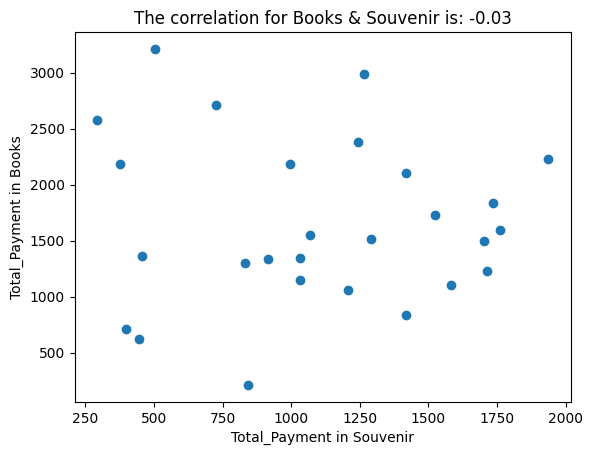

Total Monthly Payment for Cosmetics in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       13173.84
1    2021-02-28        9107.84
2    2021-03-31       13377.14
3    2021-04-30       14231.00
4    2021-05-31       17280.50
5    2021-06-30       16142.02
6    2021-07-31       12279.32
7    2021-08-31        7278.14
8    2021-09-30        8701.24
9    2021-10-31       15654.10
10   2021-11-30        9799.06
11   2021-12-31       10652.92
12   2022-01-31       15166.18
13   2022-02-28       10530.94
14   2022-03-31       11791.40
15   2022-04-30       11750.74
16   2022-05-31       14596.94
17   2022-06-30        7684.74
18   2022-07-31       11954.04
19   2022-08-31       10083.68
20   2022-09-30       15816.74
21   2022-10-31       18337.66
22   2022-11-30       10368.30
23   2022-12-31       10612.26
24   2023-01-31       12523.28
25   2023-02-28        8375.96
26   2023-03-31        3944.02
Total Monthly Payment for Food & Beverage in Cevahir AVM Mall
   invoice_dat

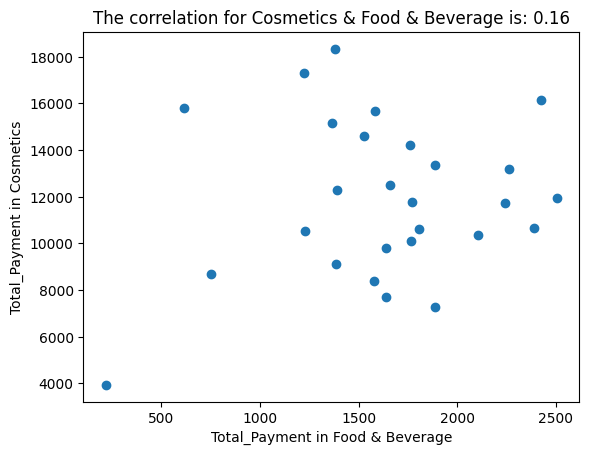

Total Monthly Payment for Toys in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       14515.20
1    2021-02-28        4551.68
2    2021-03-31        6056.96
3    2021-04-30        6164.48
4    2021-05-31        9139.20
5    2021-06-30        6272.00
6    2021-07-31       12687.36
7    2021-08-31        8709.12
8    2021-09-30        5877.76
9    2021-10-31        7168.00
10   2021-11-30        8816.64
11   2021-12-31        8314.88
12   2022-01-31        7633.92
13   2022-02-28        6487.04
14   2022-03-31       10895.36
15   2022-04-30        6415.36
16   2022-05-31        7132.16
17   2022-06-30        7311.36
18   2022-07-31        8960.00
19   2022-08-31       10214.40
20   2022-09-30        8171.52
21   2022-10-31        4945.92
22   2022-11-30       11576.32
23   2022-12-31        4444.16
24   2023-01-31        5591.04
25   2023-02-28        4910.08
26   2023-03-31        1146.88


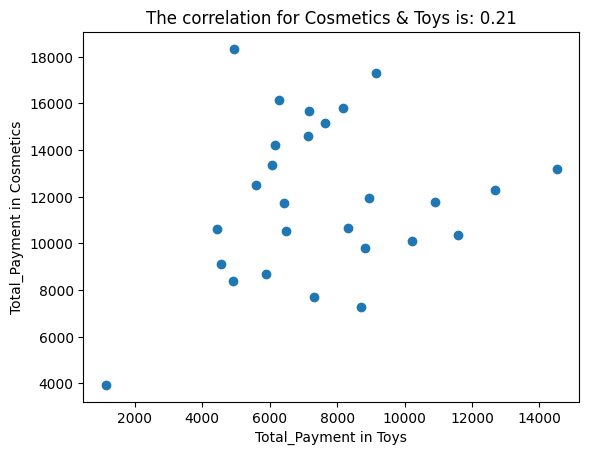

Total Monthly Payment for Technology in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      25941.825
1    2021-02-28      25941.825
2    2021-03-31      74428.200
3    2021-04-30      11797.275
4    2021-05-31      36689.100
5    2021-06-30      40086.375
6    2021-07-31      33291.825
7    2021-08-31      40086.375
8    2021-09-30      34341.825
9    2021-10-31      75170.025
10   2021-11-30      58678.200
11   2021-12-31      26189.100
12   2022-01-31      69672.750
13   2022-02-28      79122.750
14   2022-03-31      46633.650
15   2022-04-30      18344.550
16   2022-05-31      96664.575
17   2022-06-30      86720.025
18   2022-07-31      53983.650
19   2022-08-31      47930.925
20   2022-09-30      79370.025
21   2022-10-31      33786.375
22   2022-11-30      61580.925
23   2022-12-31      27239.100
24   2023-01-31      21741.825
25   2023-02-28      72575.475
26   2023-03-31       6547.275


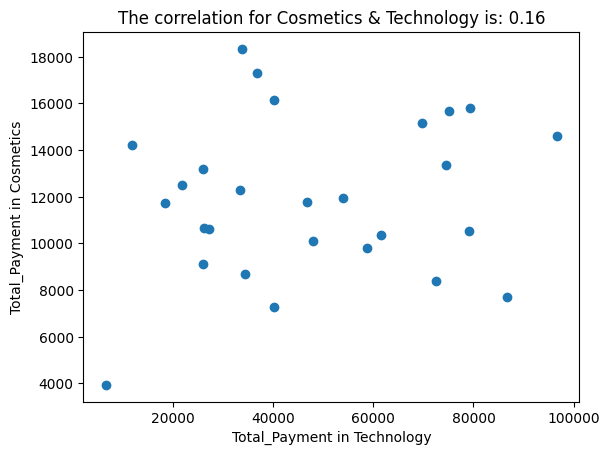

Total Monthly Payment for Souvenir in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        1243.38
1    2021-02-28        1759.50
2    2021-03-31        1419.33
3    2021-04-30        1524.90
4    2021-05-31        1266.84
5    2021-06-30        1067.43
6    2021-07-31         997.05
7    2021-08-31         727.26
8    2021-09-30         375.36
9    2021-10-31        1712.58
10   2021-11-30         914.94
11   2021-12-31         293.25
12   2022-01-31        1032.24
13   2022-02-28        1700.85
14   2022-03-31        1208.19
15   2022-04-30        1419.33
16   2022-05-31         457.47
17   2022-06-30        1935.45
18   2022-07-31        1583.55
19   2022-08-31         398.82
20   2022-09-30         504.39
21   2022-10-31        1032.24
22   2022-11-30        1736.04
23   2022-12-31        1290.30
24   2023-01-31         832.83
25   2023-02-28         844.56
26   2023-03-31         445.74


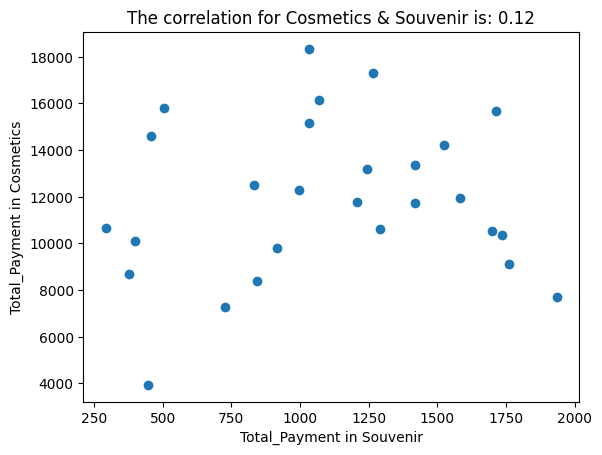

Total Monthly Payment for Food & Beverage in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        2264.59
1    2021-02-28        1385.95
2    2021-03-31        1888.03
3    2021-04-30        1762.51
4    2021-05-31        1223.82
5    2021-06-30        2426.72
6    2021-07-31        1391.18
7    2021-08-31        1888.03
8    2021-09-30         753.12
9    2021-10-31        1584.69
10   2021-11-30        1636.99
11   2021-12-31        2390.11
12   2022-01-31        1365.03
13   2022-02-28        1229.05
14   2022-03-31        1772.97
15   2022-04-30        2243.67
16   2022-05-31        1527.16
17   2022-06-30        1636.99
18   2022-07-31        2505.17
19   2022-08-31        1767.74
20   2022-09-30         617.14
21   2022-10-31        1380.72
22   2022-11-30        2107.69
23   2022-12-31        1804.35
24   2023-01-31        1657.91
25   2023-02-28        1579.46
26   2023-03-31         219.66
Total Monthly Payment for Toys in Cevahir AVM Mall
   invoice_date  To

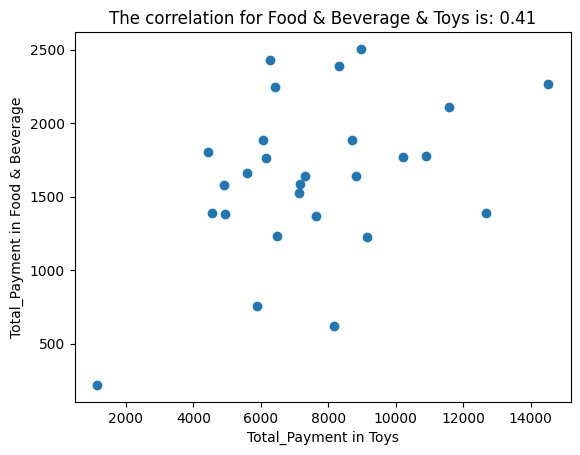

Total Monthly Payment for Technology in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      25941.825
1    2021-02-28      25941.825
2    2021-03-31      74428.200
3    2021-04-30      11797.275
4    2021-05-31      36689.100
5    2021-06-30      40086.375
6    2021-07-31      33291.825
7    2021-08-31      40086.375
8    2021-09-30      34341.825
9    2021-10-31      75170.025
10   2021-11-30      58678.200
11   2021-12-31      26189.100
12   2022-01-31      69672.750
13   2022-02-28      79122.750
14   2022-03-31      46633.650
15   2022-04-30      18344.550
16   2022-05-31      96664.575
17   2022-06-30      86720.025
18   2022-07-31      53983.650
19   2022-08-31      47930.925
20   2022-09-30      79370.025
21   2022-10-31      33786.375
22   2022-11-30      61580.925
23   2022-12-31      27239.100
24   2023-01-31      21741.825
25   2023-02-28      72575.475
26   2023-03-31       6547.275


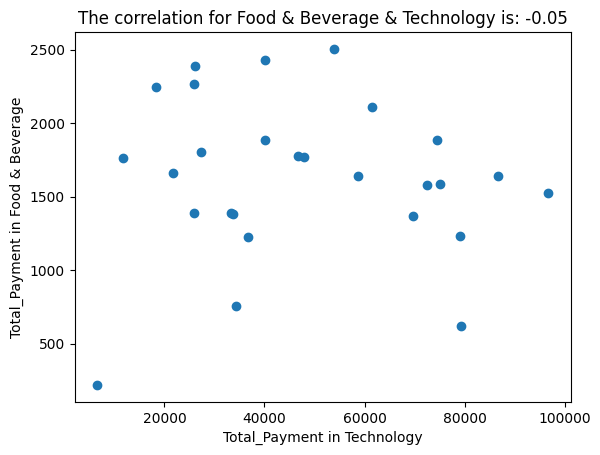

Total Monthly Payment for Souvenir in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        1243.38
1    2021-02-28        1759.50
2    2021-03-31        1419.33
3    2021-04-30        1524.90
4    2021-05-31        1266.84
5    2021-06-30        1067.43
6    2021-07-31         997.05
7    2021-08-31         727.26
8    2021-09-30         375.36
9    2021-10-31        1712.58
10   2021-11-30         914.94
11   2021-12-31         293.25
12   2022-01-31        1032.24
13   2022-02-28        1700.85
14   2022-03-31        1208.19
15   2022-04-30        1419.33
16   2022-05-31         457.47
17   2022-06-30        1935.45
18   2022-07-31        1583.55
19   2022-08-31         398.82
20   2022-09-30         504.39
21   2022-10-31        1032.24
22   2022-11-30        1736.04
23   2022-12-31        1290.30
24   2023-01-31         832.83
25   2023-02-28         844.56
26   2023-03-31         445.74


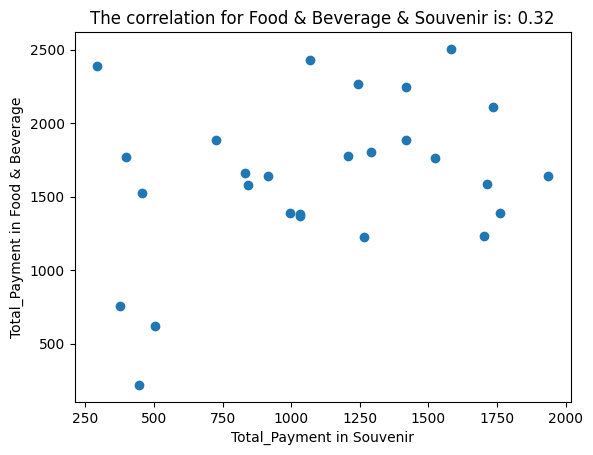

Total Monthly Payment for Toys in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31       14515.20
1    2021-02-28        4551.68
2    2021-03-31        6056.96
3    2021-04-30        6164.48
4    2021-05-31        9139.20
5    2021-06-30        6272.00
6    2021-07-31       12687.36
7    2021-08-31        8709.12
8    2021-09-30        5877.76
9    2021-10-31        7168.00
10   2021-11-30        8816.64
11   2021-12-31        8314.88
12   2022-01-31        7633.92
13   2022-02-28        6487.04
14   2022-03-31       10895.36
15   2022-04-30        6415.36
16   2022-05-31        7132.16
17   2022-06-30        7311.36
18   2022-07-31        8960.00
19   2022-08-31       10214.40
20   2022-09-30        8171.52
21   2022-10-31        4945.92
22   2022-11-30       11576.32
23   2022-12-31        4444.16
24   2023-01-31        5591.04
25   2023-02-28        4910.08
26   2023-03-31        1146.88
Total Monthly Payment for Technology in Cevahir AVM Mall
   invoice_date  Total_P

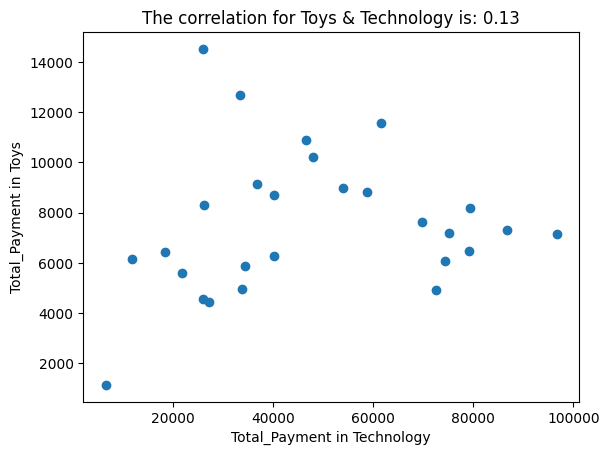

Total Monthly Payment for Souvenir in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        1243.38
1    2021-02-28        1759.50
2    2021-03-31        1419.33
3    2021-04-30        1524.90
4    2021-05-31        1266.84
5    2021-06-30        1067.43
6    2021-07-31         997.05
7    2021-08-31         727.26
8    2021-09-30         375.36
9    2021-10-31        1712.58
10   2021-11-30         914.94
11   2021-12-31         293.25
12   2022-01-31        1032.24
13   2022-02-28        1700.85
14   2022-03-31        1208.19
15   2022-04-30        1419.33
16   2022-05-31         457.47
17   2022-06-30        1935.45
18   2022-07-31        1583.55
19   2022-08-31         398.82
20   2022-09-30         504.39
21   2022-10-31        1032.24
22   2022-11-30        1736.04
23   2022-12-31        1290.30
24   2023-01-31         832.83
25   2023-02-28         844.56
26   2023-03-31         445.74


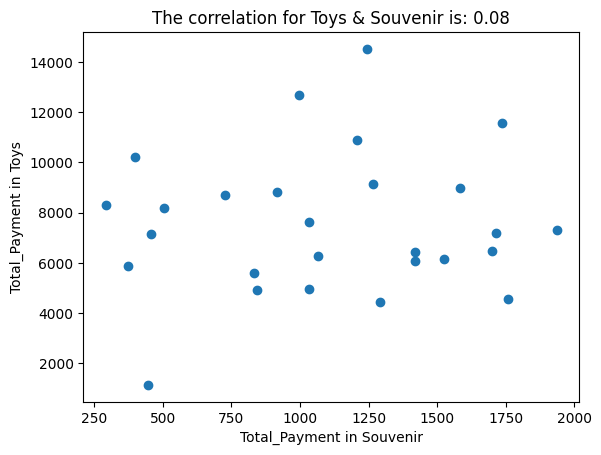

Total Monthly Payment for Technology in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31      25941.825
1    2021-02-28      25941.825
2    2021-03-31      74428.200
3    2021-04-30      11797.275
4    2021-05-31      36689.100
5    2021-06-30      40086.375
6    2021-07-31      33291.825
7    2021-08-31      40086.375
8    2021-09-30      34341.825
9    2021-10-31      75170.025
10   2021-11-30      58678.200
11   2021-12-31      26189.100
12   2022-01-31      69672.750
13   2022-02-28      79122.750
14   2022-03-31      46633.650
15   2022-04-30      18344.550
16   2022-05-31      96664.575
17   2022-06-30      86720.025
18   2022-07-31      53983.650
19   2022-08-31      47930.925
20   2022-09-30      79370.025
21   2022-10-31      33786.375
22   2022-11-30      61580.925
23   2022-12-31      27239.100
24   2023-01-31      21741.825
25   2023-02-28      72575.475
26   2023-03-31       6547.275
Total Monthly Payment for Souvenir in Cevahir AVM Mall
   invoice_date  Tot

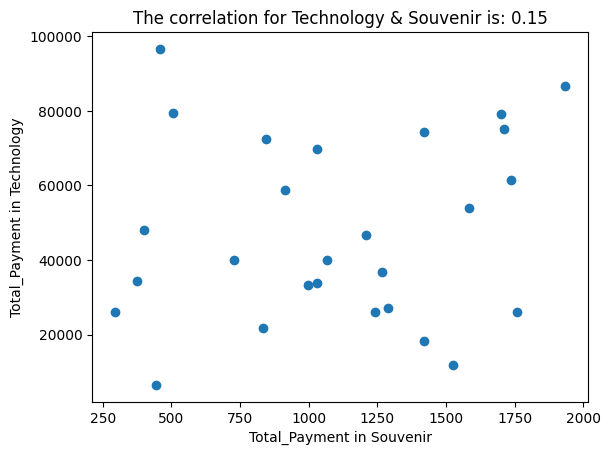

Total Monthly Payment for Souvenir in Cevahir AVM Mall
   invoice_date  Total_Payment
0    2021-01-31        1243.38
1    2021-02-28        1759.50
2    2021-03-31        1419.33
3    2021-04-30        1524.90
4    2021-05-31        1266.84
5    2021-06-30        1067.43
6    2021-07-31         997.05
7    2021-08-31         727.26
8    2021-09-30         375.36
9    2021-10-31        1712.58
10   2021-11-30         914.94
11   2021-12-31         293.25
12   2022-01-31        1032.24
13   2022-02-28        1700.85
14   2022-03-31        1208.19
15   2022-04-30        1419.33
16   2022-05-31         457.47
17   2022-06-30        1935.45
18   2022-07-31        1583.55
19   2022-08-31         398.82
20   2022-09-30         504.39
21   2022-10-31        1032.24
22   2022-11-30        1736.04
23   2022-12-31        1290.30
24   2023-01-31         832.83
25   2023-02-28         844.56
26   2023-03-31         445.74


In [74]:
# creating an empty dictionary to store the correlation values
correlation_dict_Cevahir_AVM_Mall = {}

categories = df['category'].unique()
for i, category_i in enumerate(categories):
    filtered_df_i = df[(df['category'] == category_i) & (df['shopping_mall'] == 'Cevahir AVM')]

    result_df_i = filtered_df_i.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

    result_df_i = result_df_i.reset_index()

    result_df_i = result_df_i.rename(columns={'Total_Payment': 'Total_Payment'})

    print('Total Monthly Payment for', category_i, 'in Cevahir AVM Mall')
    print(result_df_i)

    for j in range(i + 1, len(categories)):
        category_j = categories[j]
        filtered_df_j = df[(df['category'] == category_j) & (df['shopping_mall'] == 'Cevahir AVM')]

        result_df_j = filtered_df_j.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

        result_df_j = result_df_j.reset_index()

        result_df_j = result_df_j.rename(columns={'Total_Payment': 'Total_Payment'})

        print('Total Monthly Payment for', category_j, 'in Cevahir AVM Mall')
        print(result_df_j)

        correlation_key = f'The correlation for {category_i} & {category_j} is'
        correlation_value = result_df_i['Total_Payment'].corr(result_df_j['Total_Payment'])
        correlation_dict_Cevahir_AVM_Mall[correlation_key] = correlation_value

        plt.scatter(result_df_j['Total_Payment'], result_df_i['Total_Payment'])
        plt.xlabel(f'Total_Payment in {category_j}')
        plt.ylabel(f'Total_Payment in {category_i}')
        plt.title(f'{correlation_key}: {correlation_value:.2f}')
        plt.show()



In [75]:
correlation_dict_Cevahir_AVM_Mall

{'The correlation for Clothing & Shoes is': 0.5112703119970333,
 'The correlation for Clothing & Books is': 0.30365478210234964,
 'The correlation for Clothing & Cosmetics is': 0.5137851963096712,
 'The correlation for Clothing & Food & Beverage is': 0.307247292277524,
 'The correlation for Clothing & Toys is': 0.49612663942474294,
 'The correlation for Clothing & Technology is': 0.08763994421135347,
 'The correlation for Clothing & Souvenir is': -0.2209860256167467,
 'The correlation for Shoes & Books is': 0.4730686151271357,
 'The correlation for Shoes & Cosmetics is': 0.21647095942459998,
 'The correlation for Shoes & Food & Beverage is': 0.17570000855787063,
 'The correlation for Shoes & Toys is': 0.37727195299646815,
 'The correlation for Shoes & Technology is': -0.10879274005722196,
 'The correlation for Shoes & Souvenir is': -0.1796778447487324,
 'The correlation for Books & Cosmetics is': 0.2261588818065977,
 'The correlation for Books & Food & Beverage is': -0.0496921703740934

In [76]:
# Create a new dictionary with correlations >= 0.65
filtered_correlation_dict_Cevahir_AVM_Mall = {key: value for key, value in correlation_dict_Cevahir_AVM_Mall.items() if value >= 0.65}

# Print the filtered dictionary
print(filtered_correlation_dict_Cevahir_AVM_Mall)

{}


## Correlation between Different Categories for Viaport_Outlet_Mall

Total Monthly Payment for Clothing in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31     228798.410
1    2021-02-28     155742.345
2    2021-03-31     184304.430
3    2021-04-30     238537.595
4    2021-05-31     224460.665
5    2021-06-30     210439.045
6    2021-07-31     175001.950
7    2021-08-31     159861.325
8    2021-09-30     205692.250
9    2021-10-31     198708.270
10   2021-11-30     242875.340
11   2021-12-31     205092.090
12   2022-01-31     194943.855
13   2022-02-28     217941.045
14   2022-03-31     213085.280
15   2022-04-30     178820.850
16   2022-05-31     172437.855
17   2022-06-30     207247.135
18   2022-07-31     263335.265
19   2022-08-31     216358.505
20   2022-09-30     221869.740
21   2022-10-31     169846.105
22   2022-11-30     178848.505
23   2022-12-31     199690.650
24   2023-01-31     214749.135
25   2023-02-28     162044.025
26   2023-03-31      37346.545
Total Monthly Payment for Shoes in Viaport Outlet Mall
   invoice_date  To

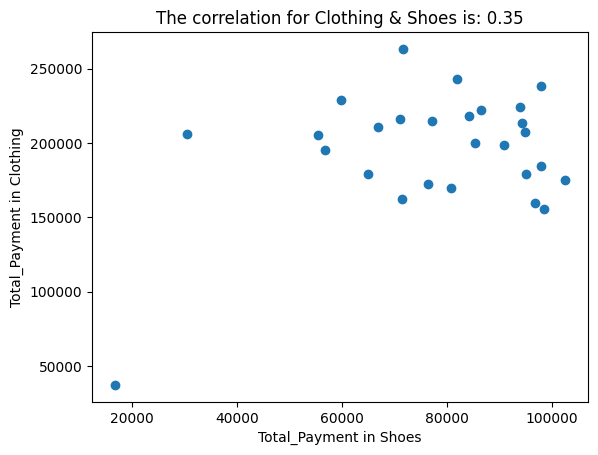

Total Monthly Payment for Books in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        2211.90
1    2021-02-28        1393.80
2    2021-03-31        2196.75
3    2021-04-30        1181.70
4    2021-05-31        1787.70
5    2021-06-30         909.00
6    2021-07-31        2136.15
7    2021-08-31         924.15
8    2021-09-30         787.80
9    2021-10-31        1590.75
10   2021-11-30        1939.20
11   2021-12-31         409.05
12   2022-01-31        2211.90
13   2022-02-28         954.45
14   2022-03-31        1242.30
15   2022-04-30        1711.95
16   2022-05-31         636.30
17   2022-06-30        3651.15
18   2022-07-31        1711.95
19   2022-08-31        1242.30
20   2022-09-30         287.85
21   2022-10-31        2257.35
22   2022-11-30        1045.35
23   2022-12-31        1302.90
24   2023-01-31        2575.50
25   2023-02-28        1318.05
26   2023-03-31          15.15


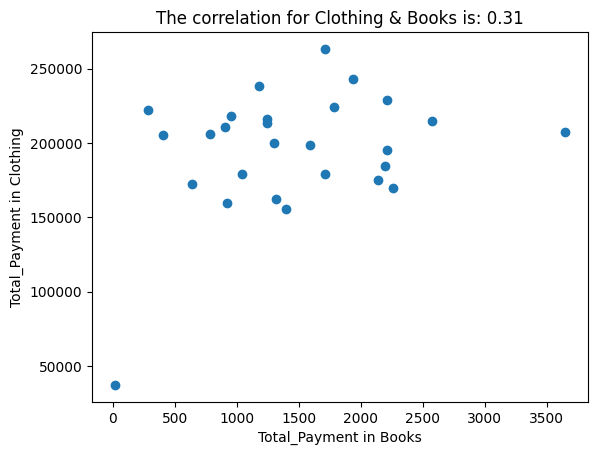

Total Monthly Payment for Cosmetics in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        9229.82
1    2021-02-28        9392.46
2    2021-03-31       15003.54
3    2021-04-30       10530.94
4    2021-05-31       12523.28
5    2021-06-30       11588.10
6    2021-07-31       20004.72
7    2021-08-31       11181.50
8    2021-09-30       20939.90
9    2021-10-31       11059.52
10   2021-11-30       14556.28
11   2021-12-31       13539.78
12   2022-01-31       12279.32
13   2022-02-28        5163.82
14   2022-03-31       14718.92
15   2022-04-30        9392.46
16   2022-05-31       12238.66
17   2022-06-30       12645.26
18   2022-07-31        9961.70
19   2022-08-31       22363.00
20   2022-09-30       15003.54
21   2022-10-31       12401.30
22   2022-11-30       11059.52
23   2022-12-31       12889.22
24   2023-01-31       19476.14
25   2023-02-28       15410.14
26   2023-03-31        2886.86


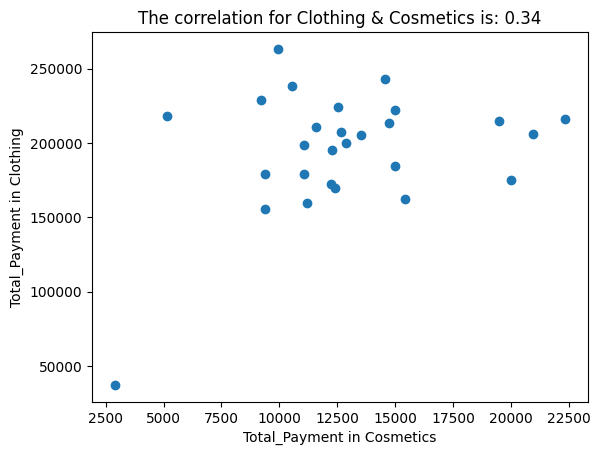

Total Monthly Payment for Food & Beverage in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1725.90
1    2021-02-28        1663.14
2    2021-03-31         889.10
3    2021-04-30        2264.59
4    2021-05-31        2463.33
5    2021-06-30        1422.56
6    2021-07-31        1616.07
7    2021-08-31        1129.68
8    2021-09-30        1548.08
9    2021-10-31        1631.76
10   2021-11-30        1605.61
11   2021-12-31        1365.03
12   2022-01-31        1155.83
13   2022-02-28        1856.65
14   2022-03-31        1417.33
15   2022-04-30        2008.32
16   2022-05-31        1610.84
17   2022-06-30         868.18
18   2022-07-31        2421.49
19   2022-08-31        1030.31
20   2022-09-30        2186.14
21   2022-10-31        1736.36
22   2022-11-30        1108.76
23   2022-12-31        1835.73
24   2023-01-31        1323.19
25   2023-02-28        1678.83
26   2023-03-31          99.37


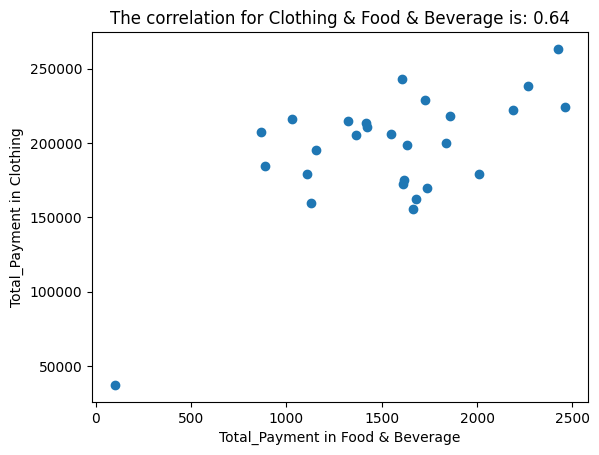

Total Monthly Payment for Toys in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        8279.04
1    2021-02-28        4802.56
2    2021-03-31        4945.92
3    2021-04-30        9963.52
4    2021-05-31        9712.64
5    2021-06-30        7848.96
6    2021-07-31        6881.28
7    2021-08-31        7848.96
8    2021-09-30        4623.36
9    2021-10-31        5483.52
10   2021-11-30        7239.68
11   2021-12-31        7633.92
12   2022-01-31        7347.20
13   2022-02-28        7418.88
14   2022-03-31        7669.76
15   2022-04-30        6128.64
16   2022-05-31        3404.80
17   2022-06-30       12293.12
18   2022-07-31        8064.00
19   2022-08-31       11612.16
20   2022-09-30        6200.32
21   2022-10-31        9640.96
22   2022-11-30        8458.24
23   2022-12-31        9999.36
24   2023-01-31        5376.00
25   2023-02-28        6021.12
26   2023-03-31        5089.28


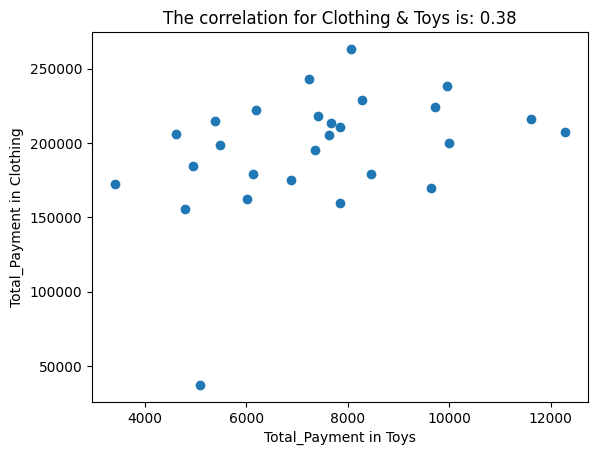

Total Monthly Payment for Technology in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31      33291.825
1    2021-02-28      22297.275
2    2021-03-31      29091.825
3    2021-04-30      45583.650
4    2021-05-31      57628.200
5    2021-06-30      36689.100
6    2021-07-31      62878.200
7    2021-08-31      66275.475
8    2021-09-30      43483.650
9    2021-10-31      81222.750
10   2021-11-30      37491.825
11   2021-12-31      61828.200
12   2022-01-31      19641.825
13   2022-02-28      35886.375
14   2022-03-31      28041.825
15   2022-04-30      47436.375
16   2022-05-31      67078.200
17   2022-06-30      36936.375
18   2022-07-31     106114.575
19   2022-08-31      33539.100
20   2022-09-30      30141.825
21   2022-10-31      74675.475
22   2022-11-30      53180.925
23   2022-12-31      69672.750
24   2023-01-31      28041.825
25   2023-02-28      64730.925
26   2023-03-31      14144.550


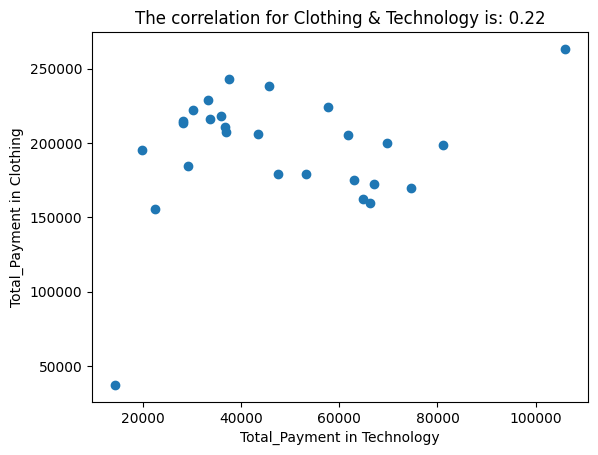

Total Monthly Payment for Souvenir in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1032.24
1    2021-02-28         668.61
2    2021-03-31         903.21
3    2021-04-30         985.32
4    2021-05-31         914.94
5    2021-06-30         914.94
6    2021-07-31         926.67
7    2021-08-31        1431.06
8    2021-09-30         586.50
9    2021-10-31        1196.46
10   2021-11-30         516.12
11   2021-12-31         504.39
12   2022-01-31        1419.33
13   2022-02-28        1466.25
14   2022-03-31        1302.03
15   2022-04-30         738.99
16   2022-05-31         469.20
17   2022-06-30        1548.36
18   2022-07-31        1759.50
19   2022-08-31        2205.24
20   2022-09-30        1442.79
21   2022-10-31        1477.98
22   2022-11-30         750.72
23   2022-12-31         410.55
24   2023-01-31         868.02
25   2023-02-28         809.37
26   2023-03-31          70.38


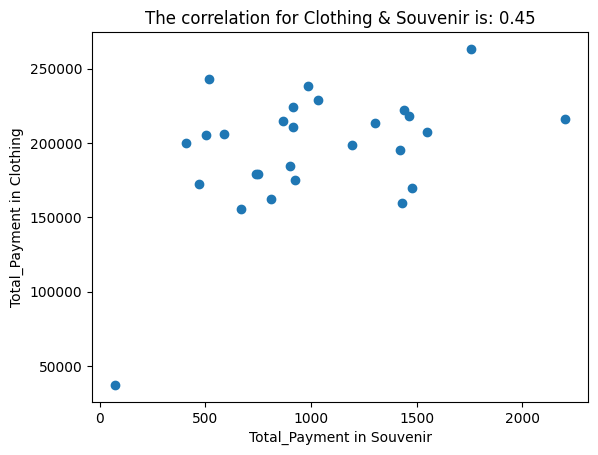

Total Monthly Payment for Shoes in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31      59853.215
1    2021-02-28      98536.695
2    2021-03-31      97991.120
3    2021-04-30      97936.525
4    2021-05-31      93953.715
5    2021-06-30      66891.470
6    2021-07-31     102574.100
7    2021-08-31      96736.185
8    2021-09-30      30444.885
9    2021-10-31      90789.080
10   2021-11-30      81950.315
11   2021-12-31      55488.240
12   2022-01-31      56743.175
13   2022-02-28      84187.210
14   2022-03-31      94280.910
15   2022-04-30      94990.270
16   2022-05-31      76330.405
17   2022-06-30      94881.080
18   2022-07-31      71583.640
19   2022-08-31      71092.660
20   2022-09-30      86478.700
21   2022-10-31      80804.570
22   2022-11-30      65036.365
23   2022-12-31      85387.550
24   2023-01-31      77148.955
25   2023-02-28      71529.045
26   2023-03-31      16695.570
Total Monthly Payment for Books in Viaport Outlet Mall
   invoice_date  Total

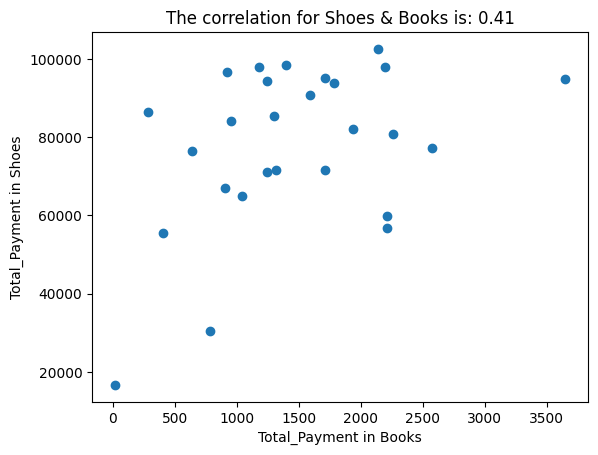

Total Monthly Payment for Cosmetics in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        9229.82
1    2021-02-28        9392.46
2    2021-03-31       15003.54
3    2021-04-30       10530.94
4    2021-05-31       12523.28
5    2021-06-30       11588.10
6    2021-07-31       20004.72
7    2021-08-31       11181.50
8    2021-09-30       20939.90
9    2021-10-31       11059.52
10   2021-11-30       14556.28
11   2021-12-31       13539.78
12   2022-01-31       12279.32
13   2022-02-28        5163.82
14   2022-03-31       14718.92
15   2022-04-30        9392.46
16   2022-05-31       12238.66
17   2022-06-30       12645.26
18   2022-07-31        9961.70
19   2022-08-31       22363.00
20   2022-09-30       15003.54
21   2022-10-31       12401.30
22   2022-11-30       11059.52
23   2022-12-31       12889.22
24   2023-01-31       19476.14
25   2023-02-28       15410.14
26   2023-03-31        2886.86


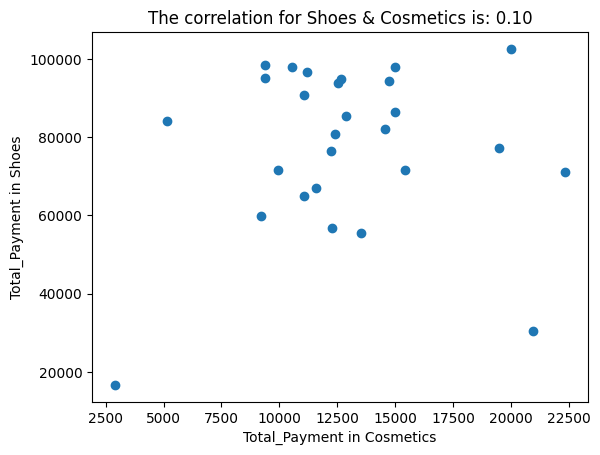

Total Monthly Payment for Food & Beverage in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1725.90
1    2021-02-28        1663.14
2    2021-03-31         889.10
3    2021-04-30        2264.59
4    2021-05-31        2463.33
5    2021-06-30        1422.56
6    2021-07-31        1616.07
7    2021-08-31        1129.68
8    2021-09-30        1548.08
9    2021-10-31        1631.76
10   2021-11-30        1605.61
11   2021-12-31        1365.03
12   2022-01-31        1155.83
13   2022-02-28        1856.65
14   2022-03-31        1417.33
15   2022-04-30        2008.32
16   2022-05-31        1610.84
17   2022-06-30         868.18
18   2022-07-31        2421.49
19   2022-08-31        1030.31
20   2022-09-30        2186.14
21   2022-10-31        1736.36
22   2022-11-30        1108.76
23   2022-12-31        1835.73
24   2023-01-31        1323.19
25   2023-02-28        1678.83
26   2023-03-31          99.37


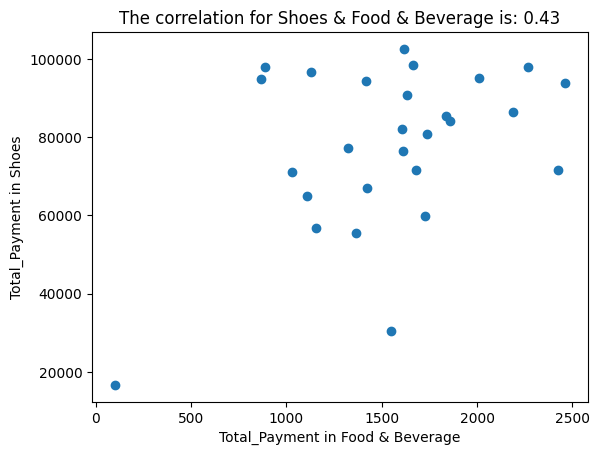

Total Monthly Payment for Toys in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        8279.04
1    2021-02-28        4802.56
2    2021-03-31        4945.92
3    2021-04-30        9963.52
4    2021-05-31        9712.64
5    2021-06-30        7848.96
6    2021-07-31        6881.28
7    2021-08-31        7848.96
8    2021-09-30        4623.36
9    2021-10-31        5483.52
10   2021-11-30        7239.68
11   2021-12-31        7633.92
12   2022-01-31        7347.20
13   2022-02-28        7418.88
14   2022-03-31        7669.76
15   2022-04-30        6128.64
16   2022-05-31        3404.80
17   2022-06-30       12293.12
18   2022-07-31        8064.00
19   2022-08-31       11612.16
20   2022-09-30        6200.32
21   2022-10-31        9640.96
22   2022-11-30        8458.24
23   2022-12-31        9999.36
24   2023-01-31        5376.00
25   2023-02-28        6021.12
26   2023-03-31        5089.28


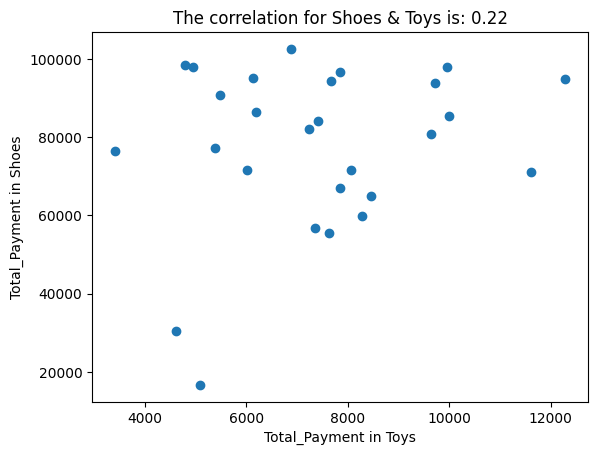

Total Monthly Payment for Technology in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31      33291.825
1    2021-02-28      22297.275
2    2021-03-31      29091.825
3    2021-04-30      45583.650
4    2021-05-31      57628.200
5    2021-06-30      36689.100
6    2021-07-31      62878.200
7    2021-08-31      66275.475
8    2021-09-30      43483.650
9    2021-10-31      81222.750
10   2021-11-30      37491.825
11   2021-12-31      61828.200
12   2022-01-31      19641.825
13   2022-02-28      35886.375
14   2022-03-31      28041.825
15   2022-04-30      47436.375
16   2022-05-31      67078.200
17   2022-06-30      36936.375
18   2022-07-31     106114.575
19   2022-08-31      33539.100
20   2022-09-30      30141.825
21   2022-10-31      74675.475
22   2022-11-30      53180.925
23   2022-12-31      69672.750
24   2023-01-31      28041.825
25   2023-02-28      64730.925
26   2023-03-31      14144.550


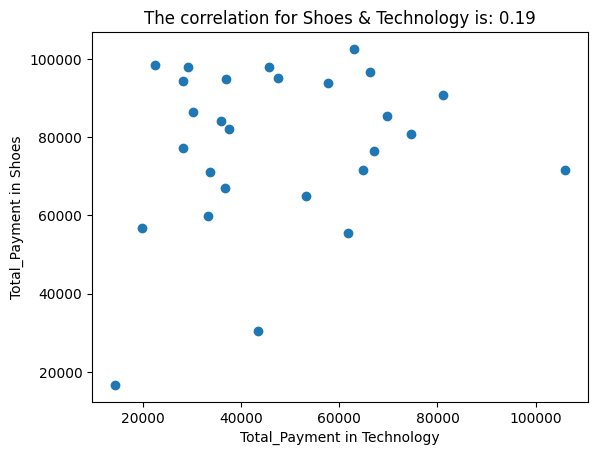

Total Monthly Payment for Souvenir in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1032.24
1    2021-02-28         668.61
2    2021-03-31         903.21
3    2021-04-30         985.32
4    2021-05-31         914.94
5    2021-06-30         914.94
6    2021-07-31         926.67
7    2021-08-31        1431.06
8    2021-09-30         586.50
9    2021-10-31        1196.46
10   2021-11-30         516.12
11   2021-12-31         504.39
12   2022-01-31        1419.33
13   2022-02-28        1466.25
14   2022-03-31        1302.03
15   2022-04-30         738.99
16   2022-05-31         469.20
17   2022-06-30        1548.36
18   2022-07-31        1759.50
19   2022-08-31        2205.24
20   2022-09-30        1442.79
21   2022-10-31        1477.98
22   2022-11-30         750.72
23   2022-12-31         410.55
24   2023-01-31         868.02
25   2023-02-28         809.37
26   2023-03-31          70.38


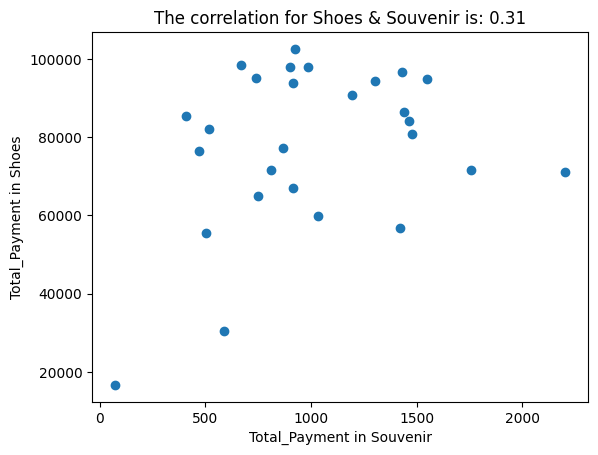

Total Monthly Payment for Books in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        2211.90
1    2021-02-28        1393.80
2    2021-03-31        2196.75
3    2021-04-30        1181.70
4    2021-05-31        1787.70
5    2021-06-30         909.00
6    2021-07-31        2136.15
7    2021-08-31         924.15
8    2021-09-30         787.80
9    2021-10-31        1590.75
10   2021-11-30        1939.20
11   2021-12-31         409.05
12   2022-01-31        2211.90
13   2022-02-28         954.45
14   2022-03-31        1242.30
15   2022-04-30        1711.95
16   2022-05-31         636.30
17   2022-06-30        3651.15
18   2022-07-31        1711.95
19   2022-08-31        1242.30
20   2022-09-30         287.85
21   2022-10-31        2257.35
22   2022-11-30        1045.35
23   2022-12-31        1302.90
24   2023-01-31        2575.50
25   2023-02-28        1318.05
26   2023-03-31          15.15
Total Monthly Payment for Cosmetics in Viaport Outlet Mall
   invoice_date  T

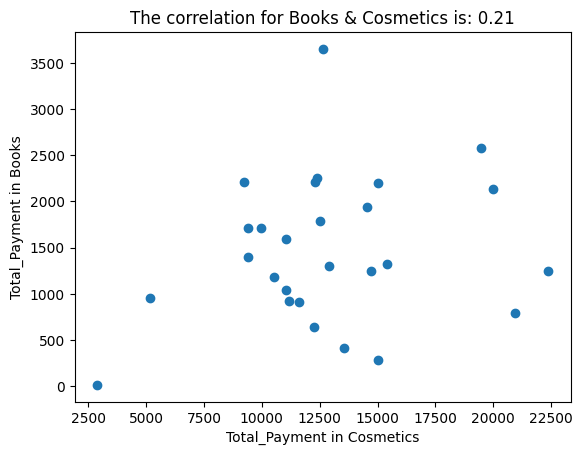

Total Monthly Payment for Food & Beverage in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1725.90
1    2021-02-28        1663.14
2    2021-03-31         889.10
3    2021-04-30        2264.59
4    2021-05-31        2463.33
5    2021-06-30        1422.56
6    2021-07-31        1616.07
7    2021-08-31        1129.68
8    2021-09-30        1548.08
9    2021-10-31        1631.76
10   2021-11-30        1605.61
11   2021-12-31        1365.03
12   2022-01-31        1155.83
13   2022-02-28        1856.65
14   2022-03-31        1417.33
15   2022-04-30        2008.32
16   2022-05-31        1610.84
17   2022-06-30         868.18
18   2022-07-31        2421.49
19   2022-08-31        1030.31
20   2022-09-30        2186.14
21   2022-10-31        1736.36
22   2022-11-30        1108.76
23   2022-12-31        1835.73
24   2023-01-31        1323.19
25   2023-02-28        1678.83
26   2023-03-31          99.37


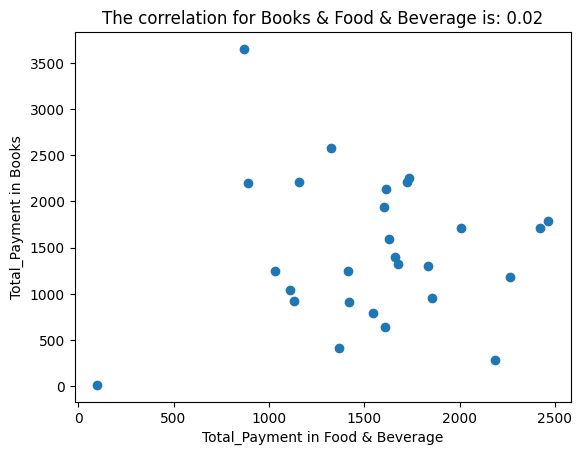

Total Monthly Payment for Toys in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        8279.04
1    2021-02-28        4802.56
2    2021-03-31        4945.92
3    2021-04-30        9963.52
4    2021-05-31        9712.64
5    2021-06-30        7848.96
6    2021-07-31        6881.28
7    2021-08-31        7848.96
8    2021-09-30        4623.36
9    2021-10-31        5483.52
10   2021-11-30        7239.68
11   2021-12-31        7633.92
12   2022-01-31        7347.20
13   2022-02-28        7418.88
14   2022-03-31        7669.76
15   2022-04-30        6128.64
16   2022-05-31        3404.80
17   2022-06-30       12293.12
18   2022-07-31        8064.00
19   2022-08-31       11612.16
20   2022-09-30        6200.32
21   2022-10-31        9640.96
22   2022-11-30        8458.24
23   2022-12-31        9999.36
24   2023-01-31        5376.00
25   2023-02-28        6021.12
26   2023-03-31        5089.28


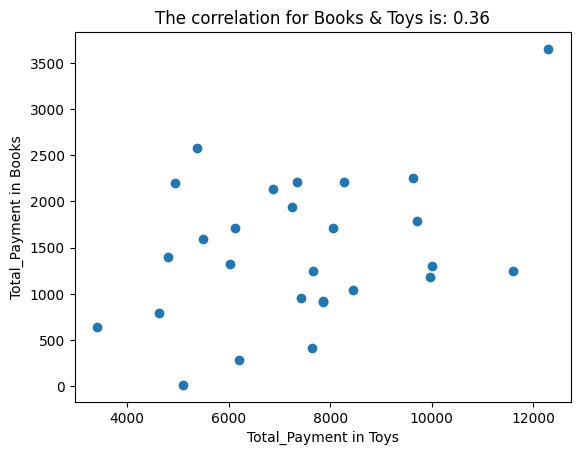

Total Monthly Payment for Technology in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31      33291.825
1    2021-02-28      22297.275
2    2021-03-31      29091.825
3    2021-04-30      45583.650
4    2021-05-31      57628.200
5    2021-06-30      36689.100
6    2021-07-31      62878.200
7    2021-08-31      66275.475
8    2021-09-30      43483.650
9    2021-10-31      81222.750
10   2021-11-30      37491.825
11   2021-12-31      61828.200
12   2022-01-31      19641.825
13   2022-02-28      35886.375
14   2022-03-31      28041.825
15   2022-04-30      47436.375
16   2022-05-31      67078.200
17   2022-06-30      36936.375
18   2022-07-31     106114.575
19   2022-08-31      33539.100
20   2022-09-30      30141.825
21   2022-10-31      74675.475
22   2022-11-30      53180.925
23   2022-12-31      69672.750
24   2023-01-31      28041.825
25   2023-02-28      64730.925
26   2023-03-31      14144.550


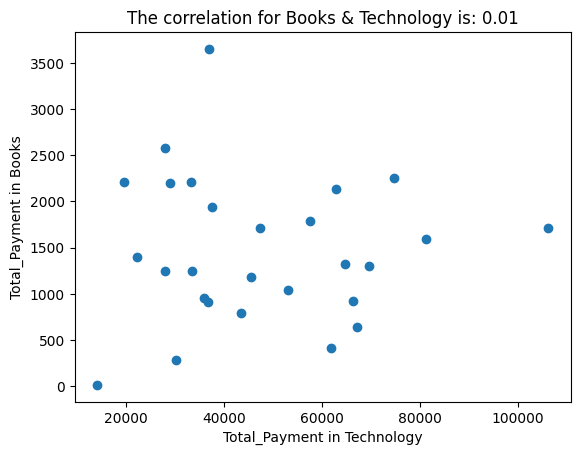

Total Monthly Payment for Souvenir in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1032.24
1    2021-02-28         668.61
2    2021-03-31         903.21
3    2021-04-30         985.32
4    2021-05-31         914.94
5    2021-06-30         914.94
6    2021-07-31         926.67
7    2021-08-31        1431.06
8    2021-09-30         586.50
9    2021-10-31        1196.46
10   2021-11-30         516.12
11   2021-12-31         504.39
12   2022-01-31        1419.33
13   2022-02-28        1466.25
14   2022-03-31        1302.03
15   2022-04-30         738.99
16   2022-05-31         469.20
17   2022-06-30        1548.36
18   2022-07-31        1759.50
19   2022-08-31        2205.24
20   2022-09-30        1442.79
21   2022-10-31        1477.98
22   2022-11-30         750.72
23   2022-12-31         410.55
24   2023-01-31         868.02
25   2023-02-28         809.37
26   2023-03-31          70.38


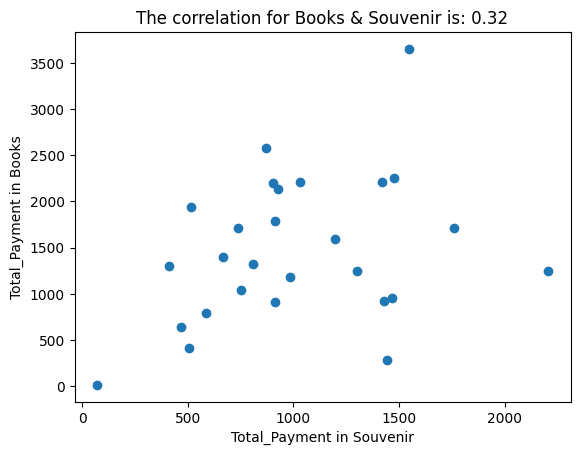

Total Monthly Payment for Cosmetics in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        9229.82
1    2021-02-28        9392.46
2    2021-03-31       15003.54
3    2021-04-30       10530.94
4    2021-05-31       12523.28
5    2021-06-30       11588.10
6    2021-07-31       20004.72
7    2021-08-31       11181.50
8    2021-09-30       20939.90
9    2021-10-31       11059.52
10   2021-11-30       14556.28
11   2021-12-31       13539.78
12   2022-01-31       12279.32
13   2022-02-28        5163.82
14   2022-03-31       14718.92
15   2022-04-30        9392.46
16   2022-05-31       12238.66
17   2022-06-30       12645.26
18   2022-07-31        9961.70
19   2022-08-31       22363.00
20   2022-09-30       15003.54
21   2022-10-31       12401.30
22   2022-11-30       11059.52
23   2022-12-31       12889.22
24   2023-01-31       19476.14
25   2023-02-28       15410.14
26   2023-03-31        2886.86
Total Monthly Payment for Food & Beverage in Viaport Outlet Mall
   invoi

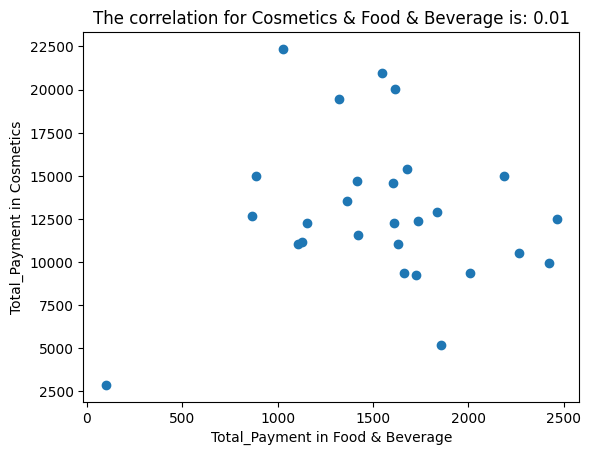

Total Monthly Payment for Toys in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        8279.04
1    2021-02-28        4802.56
2    2021-03-31        4945.92
3    2021-04-30        9963.52
4    2021-05-31        9712.64
5    2021-06-30        7848.96
6    2021-07-31        6881.28
7    2021-08-31        7848.96
8    2021-09-30        4623.36
9    2021-10-31        5483.52
10   2021-11-30        7239.68
11   2021-12-31        7633.92
12   2022-01-31        7347.20
13   2022-02-28        7418.88
14   2022-03-31        7669.76
15   2022-04-30        6128.64
16   2022-05-31        3404.80
17   2022-06-30       12293.12
18   2022-07-31        8064.00
19   2022-08-31       11612.16
20   2022-09-30        6200.32
21   2022-10-31        9640.96
22   2022-11-30        8458.24
23   2022-12-31        9999.36
24   2023-01-31        5376.00
25   2023-02-28        6021.12
26   2023-03-31        5089.28


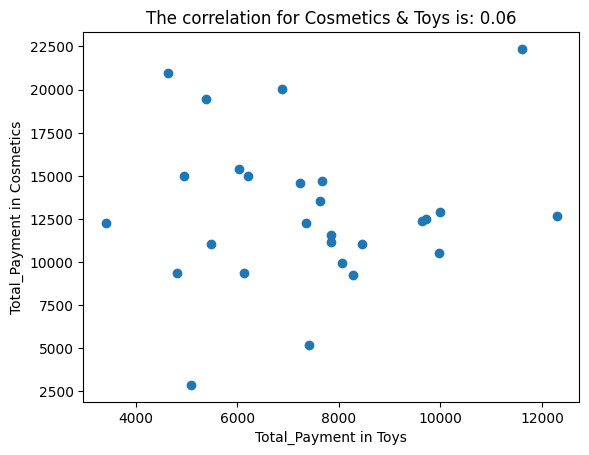

Total Monthly Payment for Technology in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31      33291.825
1    2021-02-28      22297.275
2    2021-03-31      29091.825
3    2021-04-30      45583.650
4    2021-05-31      57628.200
5    2021-06-30      36689.100
6    2021-07-31      62878.200
7    2021-08-31      66275.475
8    2021-09-30      43483.650
9    2021-10-31      81222.750
10   2021-11-30      37491.825
11   2021-12-31      61828.200
12   2022-01-31      19641.825
13   2022-02-28      35886.375
14   2022-03-31      28041.825
15   2022-04-30      47436.375
16   2022-05-31      67078.200
17   2022-06-30      36936.375
18   2022-07-31     106114.575
19   2022-08-31      33539.100
20   2022-09-30      30141.825
21   2022-10-31      74675.475
22   2022-11-30      53180.925
23   2022-12-31      69672.750
24   2023-01-31      28041.825
25   2023-02-28      64730.925
26   2023-03-31      14144.550


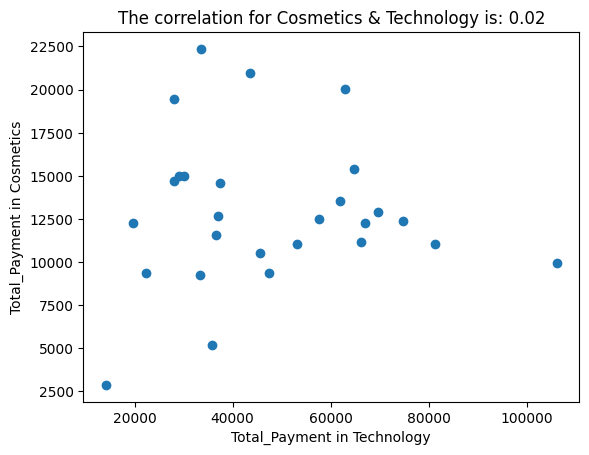

Total Monthly Payment for Souvenir in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1032.24
1    2021-02-28         668.61
2    2021-03-31         903.21
3    2021-04-30         985.32
4    2021-05-31         914.94
5    2021-06-30         914.94
6    2021-07-31         926.67
7    2021-08-31        1431.06
8    2021-09-30         586.50
9    2021-10-31        1196.46
10   2021-11-30         516.12
11   2021-12-31         504.39
12   2022-01-31        1419.33
13   2022-02-28        1466.25
14   2022-03-31        1302.03
15   2022-04-30         738.99
16   2022-05-31         469.20
17   2022-06-30        1548.36
18   2022-07-31        1759.50
19   2022-08-31        2205.24
20   2022-09-30        1442.79
21   2022-10-31        1477.98
22   2022-11-30         750.72
23   2022-12-31         410.55
24   2023-01-31         868.02
25   2023-02-28         809.37
26   2023-03-31          70.38


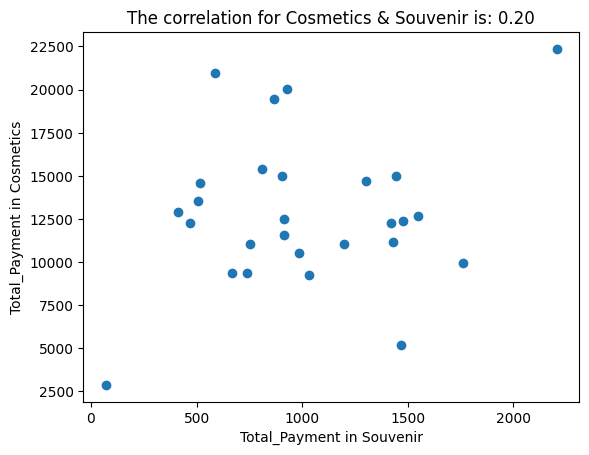

Total Monthly Payment for Food & Beverage in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1725.90
1    2021-02-28        1663.14
2    2021-03-31         889.10
3    2021-04-30        2264.59
4    2021-05-31        2463.33
5    2021-06-30        1422.56
6    2021-07-31        1616.07
7    2021-08-31        1129.68
8    2021-09-30        1548.08
9    2021-10-31        1631.76
10   2021-11-30        1605.61
11   2021-12-31        1365.03
12   2022-01-31        1155.83
13   2022-02-28        1856.65
14   2022-03-31        1417.33
15   2022-04-30        2008.32
16   2022-05-31        1610.84
17   2022-06-30         868.18
18   2022-07-31        2421.49
19   2022-08-31        1030.31
20   2022-09-30        2186.14
21   2022-10-31        1736.36
22   2022-11-30        1108.76
23   2022-12-31        1835.73
24   2023-01-31        1323.19
25   2023-02-28        1678.83
26   2023-03-31          99.37
Total Monthly Payment for Toys in Viaport Outlet Mall
   invoice_da

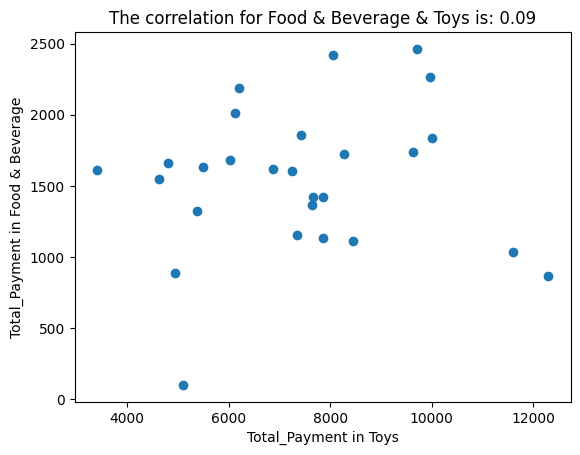

Total Monthly Payment for Technology in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31      33291.825
1    2021-02-28      22297.275
2    2021-03-31      29091.825
3    2021-04-30      45583.650
4    2021-05-31      57628.200
5    2021-06-30      36689.100
6    2021-07-31      62878.200
7    2021-08-31      66275.475
8    2021-09-30      43483.650
9    2021-10-31      81222.750
10   2021-11-30      37491.825
11   2021-12-31      61828.200
12   2022-01-31      19641.825
13   2022-02-28      35886.375
14   2022-03-31      28041.825
15   2022-04-30      47436.375
16   2022-05-31      67078.200
17   2022-06-30      36936.375
18   2022-07-31     106114.575
19   2022-08-31      33539.100
20   2022-09-30      30141.825
21   2022-10-31      74675.475
22   2022-11-30      53180.925
23   2022-12-31      69672.750
24   2023-01-31      28041.825
25   2023-02-28      64730.925
26   2023-03-31      14144.550


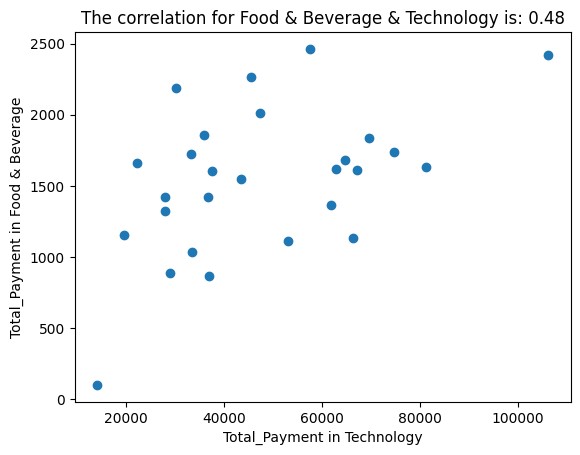

Total Monthly Payment for Souvenir in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1032.24
1    2021-02-28         668.61
2    2021-03-31         903.21
3    2021-04-30         985.32
4    2021-05-31         914.94
5    2021-06-30         914.94
6    2021-07-31         926.67
7    2021-08-31        1431.06
8    2021-09-30         586.50
9    2021-10-31        1196.46
10   2021-11-30         516.12
11   2021-12-31         504.39
12   2022-01-31        1419.33
13   2022-02-28        1466.25
14   2022-03-31        1302.03
15   2022-04-30         738.99
16   2022-05-31         469.20
17   2022-06-30        1548.36
18   2022-07-31        1759.50
19   2022-08-31        2205.24
20   2022-09-30        1442.79
21   2022-10-31        1477.98
22   2022-11-30         750.72
23   2022-12-31         410.55
24   2023-01-31         868.02
25   2023-02-28         809.37
26   2023-03-31          70.38


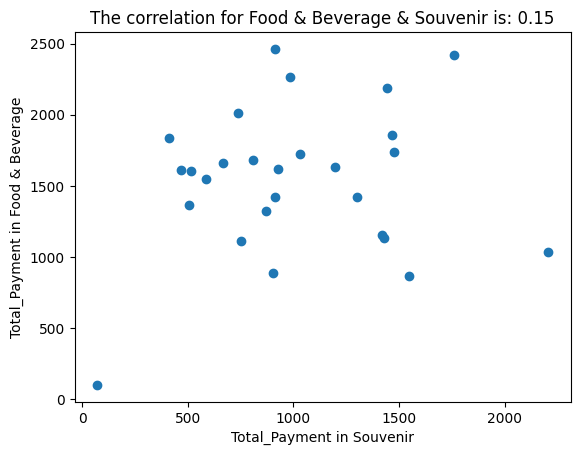

Total Monthly Payment for Toys in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        8279.04
1    2021-02-28        4802.56
2    2021-03-31        4945.92
3    2021-04-30        9963.52
4    2021-05-31        9712.64
5    2021-06-30        7848.96
6    2021-07-31        6881.28
7    2021-08-31        7848.96
8    2021-09-30        4623.36
9    2021-10-31        5483.52
10   2021-11-30        7239.68
11   2021-12-31        7633.92
12   2022-01-31        7347.20
13   2022-02-28        7418.88
14   2022-03-31        7669.76
15   2022-04-30        6128.64
16   2022-05-31        3404.80
17   2022-06-30       12293.12
18   2022-07-31        8064.00
19   2022-08-31       11612.16
20   2022-09-30        6200.32
21   2022-10-31        9640.96
22   2022-11-30        8458.24
23   2022-12-31        9999.36
24   2023-01-31        5376.00
25   2023-02-28        6021.12
26   2023-03-31        5089.28
Total Monthly Payment for Technology in Viaport Outlet Mall
   invoice_date  T

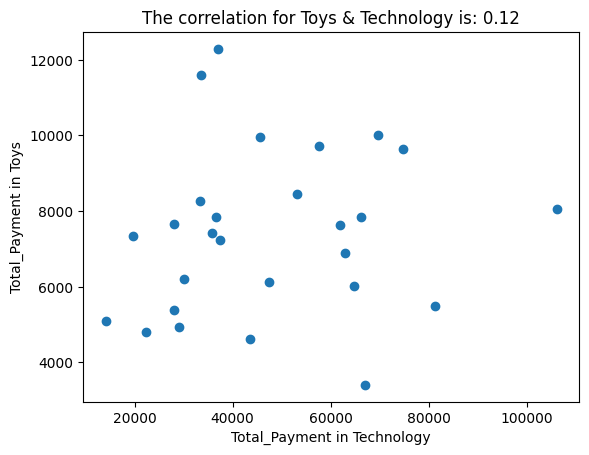

Total Monthly Payment for Souvenir in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1032.24
1    2021-02-28         668.61
2    2021-03-31         903.21
3    2021-04-30         985.32
4    2021-05-31         914.94
5    2021-06-30         914.94
6    2021-07-31         926.67
7    2021-08-31        1431.06
8    2021-09-30         586.50
9    2021-10-31        1196.46
10   2021-11-30         516.12
11   2021-12-31         504.39
12   2022-01-31        1419.33
13   2022-02-28        1466.25
14   2022-03-31        1302.03
15   2022-04-30         738.99
16   2022-05-31         469.20
17   2022-06-30        1548.36
18   2022-07-31        1759.50
19   2022-08-31        2205.24
20   2022-09-30        1442.79
21   2022-10-31        1477.98
22   2022-11-30         750.72
23   2022-12-31         410.55
24   2023-01-31         868.02
25   2023-02-28         809.37
26   2023-03-31          70.38


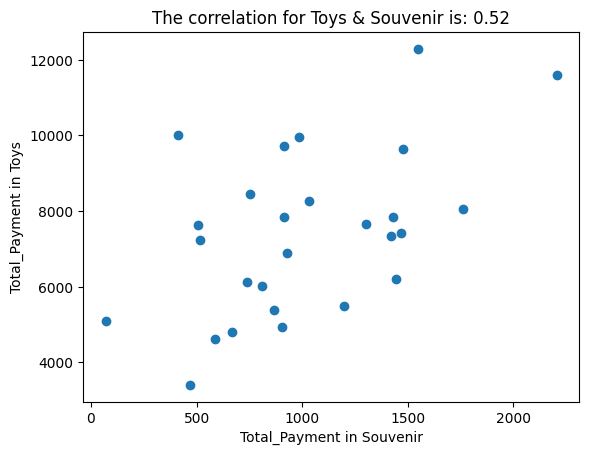

Total Monthly Payment for Technology in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31      33291.825
1    2021-02-28      22297.275
2    2021-03-31      29091.825
3    2021-04-30      45583.650
4    2021-05-31      57628.200
5    2021-06-30      36689.100
6    2021-07-31      62878.200
7    2021-08-31      66275.475
8    2021-09-30      43483.650
9    2021-10-31      81222.750
10   2021-11-30      37491.825
11   2021-12-31      61828.200
12   2022-01-31      19641.825
13   2022-02-28      35886.375
14   2022-03-31      28041.825
15   2022-04-30      47436.375
16   2022-05-31      67078.200
17   2022-06-30      36936.375
18   2022-07-31     106114.575
19   2022-08-31      33539.100
20   2022-09-30      30141.825
21   2022-10-31      74675.475
22   2022-11-30      53180.925
23   2022-12-31      69672.750
24   2023-01-31      28041.825
25   2023-02-28      64730.925
26   2023-03-31      14144.550
Total Monthly Payment for Souvenir in Viaport Outlet Mall
   invoice_dat

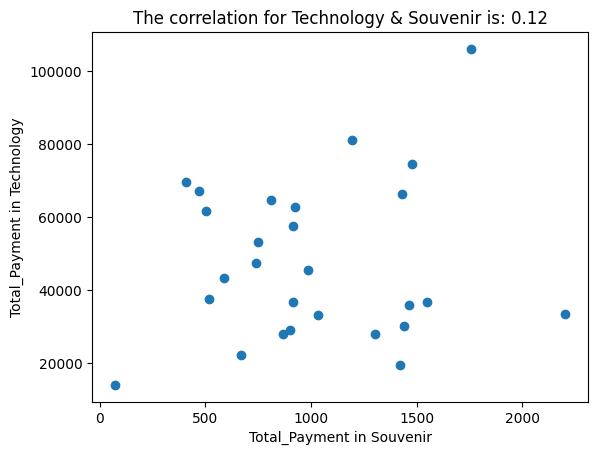

Total Monthly Payment for Souvenir in Viaport Outlet Mall
   invoice_date  Total_Payment
0    2021-01-31        1032.24
1    2021-02-28         668.61
2    2021-03-31         903.21
3    2021-04-30         985.32
4    2021-05-31         914.94
5    2021-06-30         914.94
6    2021-07-31         926.67
7    2021-08-31        1431.06
8    2021-09-30         586.50
9    2021-10-31        1196.46
10   2021-11-30         516.12
11   2021-12-31         504.39
12   2022-01-31        1419.33
13   2022-02-28        1466.25
14   2022-03-31        1302.03
15   2022-04-30         738.99
16   2022-05-31         469.20
17   2022-06-30        1548.36
18   2022-07-31        1759.50
19   2022-08-31        2205.24
20   2022-09-30        1442.79
21   2022-10-31        1477.98
22   2022-11-30         750.72
23   2022-12-31         410.55
24   2023-01-31         868.02
25   2023-02-28         809.37
26   2023-03-31          70.38


In [77]:
# creating an empty dictionary to store the correlation values
correlation_dict_Viaport_Outlet_Mall = {}

categories = df['category'].unique()
for i, category_i in enumerate(categories):
    filtered_df_i = df[(df['category'] == category_i) & (df['shopping_mall'] == 'Viaport Outlet')]

    result_df_i = filtered_df_i.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

    result_df_i = result_df_i.reset_index()

    result_df_i = result_df_i.rename(columns={'Total_Payment': 'Total_Payment'})

    print('Total Monthly Payment for', category_i, 'in Viaport Outlet Mall')
    print(result_df_i)

    for j in range(i + 1, len(categories)):
        category_j = categories[j]
        filtered_df_j = df[(df['category'] == category_j) & (df['shopping_mall'] == 'Viaport Outlet')]

        result_df_j = filtered_df_j.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

        result_df_j = result_df_j.reset_index()

        result_df_j = result_df_j.rename(columns={'Total_Payment': 'Total_Payment'})

        print('Total Monthly Payment for', category_j, 'in Viaport Outlet Mall')
        print(result_df_j)

        correlation_key = f'The correlation for {category_i} & {category_j} is'
        correlation_value = result_df_i['Total_Payment'].corr(result_df_j['Total_Payment'])
        correlation_dict_Viaport_Outlet_Mall[correlation_key] = correlation_value

        plt.scatter(result_df_j['Total_Payment'], result_df_i['Total_Payment'])
        plt.xlabel(f'Total_Payment in {category_j}')
        plt.ylabel(f'Total_Payment in {category_i}')
        plt.title(f'{correlation_key}: {correlation_value:.2f}')
        plt.show()



In [78]:
correlation_dict_Viaport_Outlet_Mall

{'The correlation for Clothing & Shoes is': 0.3533871332870977,
 'The correlation for Clothing & Books is': 0.3133594820193293,
 'The correlation for Clothing & Cosmetics is': 0.3377102101745824,
 'The correlation for Clothing & Food & Beverage is': 0.6389534143891689,
 'The correlation for Clothing & Toys is': 0.3766618997053186,
 'The correlation for Clothing & Technology is': 0.22317422918505916,
 'The correlation for Clothing & Souvenir is': 0.45211184686772726,
 'The correlation for Shoes & Books is': 0.41071269330733695,
 'The correlation for Shoes & Cosmetics is': 0.10309799221607702,
 'The correlation for Shoes & Food & Beverage is': 0.4268580027572636,
 'The correlation for Shoes & Toys is': 0.2164812598592762,
 'The correlation for Shoes & Technology is': 0.19427536194142447,
 'The correlation for Shoes & Souvenir is': 0.31394720128777087,
 'The correlation for Books & Cosmetics is': 0.21416786912410724,
 'The correlation for Books & Food & Beverage is': 0.015102769203562525,

In [79]:
# Create a new dictionary with correlations >= 0.65
filtered_correlation_dict_Viaport_Outlet_Mall = {key: value for key, value in correlation_dict_Viaport_Outlet_Mall.items() if value >= 0.65}

# Print the filtered dictionary
print(filtered_correlation_dict_Viaport_Outlet_Mall)

{}


## Correlation between Different Categories for Zorlu_Center_Mall

Total Monthly Payment for Clothing in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31     174701.870
1    2021-02-28     165153.795
2    2021-03-31     177511.560
3    2021-04-30     233845.285
4    2021-05-31     184167.805
5    2021-06-30     181303.630
6    2021-07-31     237855.295
7    2021-08-31     167445.465
8    2021-09-30     198190.250
9    2021-10-31     190197.060
10   2021-11-30     199308.430
11   2021-12-31     244020.350
12   2022-01-31     189242.335
13   2022-02-28     204000.740
14   2022-03-31     233927.425
15   2022-04-30     221951.055
16   2022-05-31     155851.315
17   2022-06-30     207547.215
18   2022-07-31     233081.670
19   2022-08-31     223697.050
20   2022-09-30     243775.580
21   2022-10-31     172655.795
22   2022-11-30     222824.465
23   2022-12-31     222251.135
24   2023-01-31     217504.340
25   2023-02-28     241429.425
26   2023-03-31      35955.115
Total Monthly Payment for Shoes in Zorlu Center Mall
   invoice_date  Total_

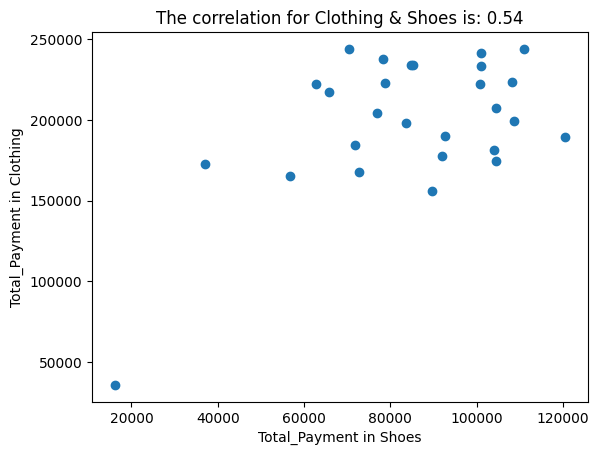

Total Monthly Payment for Books in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1424.10
1    2021-02-28        1045.35
2    2021-03-31         969.60
3    2021-04-30        1166.55
4    2021-05-31        1499.85
5    2021-06-30        2181.60
6    2021-07-31        1696.80
7    2021-08-31        2045.25
8    2021-09-30        1893.75
9    2021-10-31        2105.85
10   2021-11-30        1408.95
11   2021-12-31        2727.00
12   2022-01-31        1893.75
13   2022-02-28        2090.70
14   2022-03-31        1727.10
15   2022-04-30        1696.80
16   2022-05-31        2121.00
17   2022-06-30        1378.65
18   2022-07-31        1772.55
19   2022-08-31        1166.55
20   2022-09-30        1515.00
21   2022-10-31         575.70
22   2022-11-30        1151.40
23   2022-12-31        2817.90
24   2023-01-31        2257.35
25   2023-02-28        2636.10
26   2023-03-31         378.75


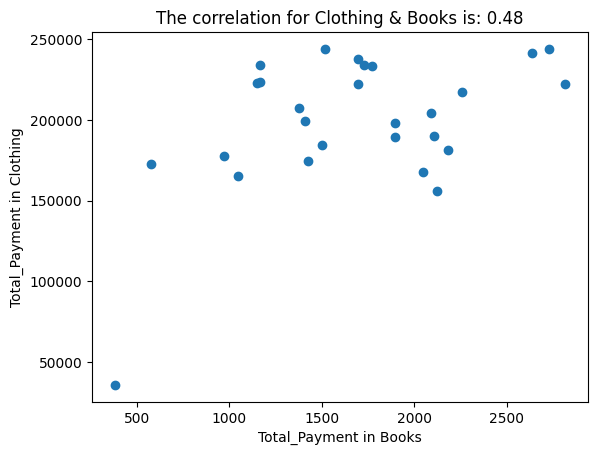

Total Monthly Payment for Cosmetics in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31       10896.88
1    2021-02-28       14840.90
2    2021-03-31       15206.84
3    2021-04-30       14434.30
4    2021-05-31       17117.86
5    2021-06-30       19476.14
6    2021-07-31       13824.40
7    2021-08-31        6912.20
8    2021-09-30       18662.94
9    2021-10-31       10774.90
10   2021-11-30       13214.50
11   2021-12-31       12767.24
12   2022-01-31       16548.62
13   2022-02-28       12319.98
14   2022-03-31       16345.32
15   2022-04-30       12441.96
16   2022-05-31       13173.84
17   2022-06-30       12929.88
18   2022-07-31       14800.24
19   2022-08-31        9555.10
20   2022-09-30       21143.20
21   2022-10-31       16711.26
22   2022-11-30       13458.46
23   2022-12-31       10571.60
24   2023-01-31       12523.28
25   2023-02-28       13743.08
26   2023-03-31        2642.90


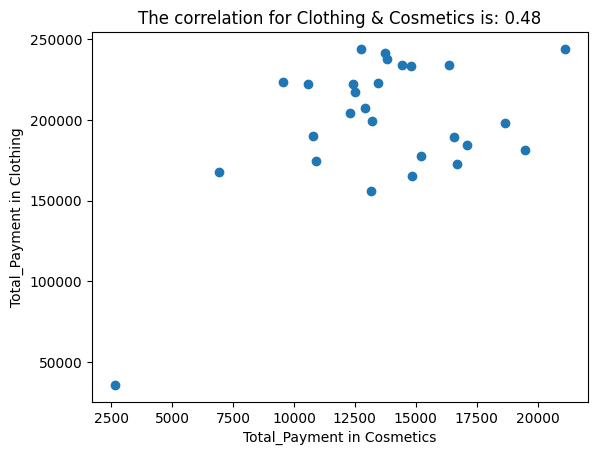

Total Monthly Payment for Food & Beverage in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1401.64
1    2021-02-28         836.80
2    2021-03-31        1652.68
3    2021-04-30        1636.99
4    2021-05-31        1412.10
5    2021-06-30        1506.24
6    2021-07-31        1197.67
7    2021-08-31        1856.65
8    2021-09-30        1516.70
9    2021-10-31        1778.20
10   2021-11-30        1490.55
11   2021-12-31        2295.97
12   2022-01-31        1150.60
13   2022-02-28        1589.92
14   2022-03-31        1657.91
15   2022-04-30        2003.09
16   2022-05-31        1537.62
17   2022-06-30        1642.22
18   2022-07-31         936.17
19   2022-08-31        1474.86
20   2022-09-30        1056.46
21   2022-10-31        1778.20
22   2022-11-30        2259.36
23   2022-12-31        2337.81
24   2023-01-31        1244.74
25   2023-02-28        2086.77
26   2023-03-31         617.14


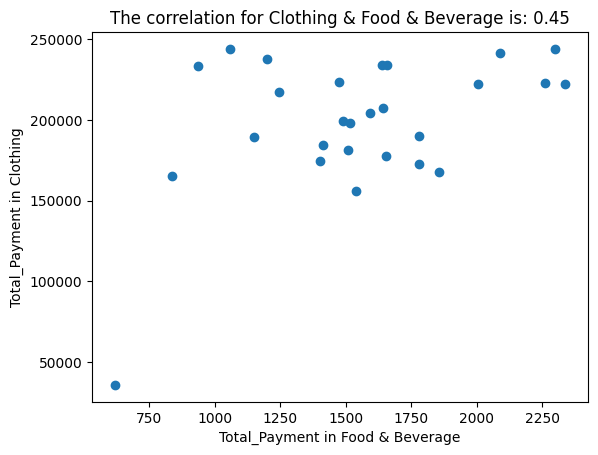

Total Monthly Payment for Toys in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        7454.72
1    2021-02-28        4408.32
2    2021-03-31        8924.16
3    2021-04-30        8279.04
4    2021-05-31        5877.76
5    2021-06-30        7060.48
6    2021-07-31        7454.72
7    2021-08-31        7096.32
8    2021-09-30        7741.44
9    2021-10-31        6164.48
10   2021-11-30       13404.16
11   2021-12-31        8064.00
12   2022-01-31        7239.68
13   2022-02-28        9820.16
14   2022-03-31        9856.00
15   2022-04-30        7418.88
16   2022-05-31        8960.00
17   2022-06-30        5662.72
18   2022-07-31       10429.44
19   2022-08-31        6056.96
20   2022-09-30        6594.56
21   2022-10-31        8135.68
22   2022-11-30        7275.52
23   2022-12-31        3512.32
24   2023-01-31        6702.08
25   2023-02-28        6056.96
26   2023-03-31        1899.52


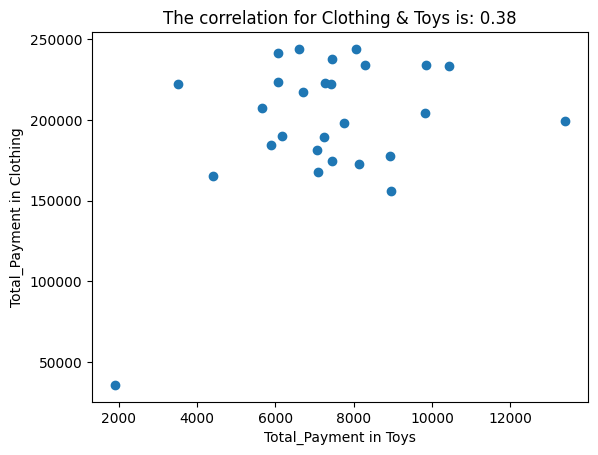

Total Monthly Payment for Technology in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31      46386.375
1    2021-02-28      18344.550
2    2021-03-31      40086.375
3    2021-04-30      37986.375
4    2021-05-31      51080.925
5    2021-06-30      46880.925
6    2021-07-31      62878.200
7    2021-08-31      52933.650
8    2021-09-30      45583.650
9    2021-10-31      52130.925
10   2021-11-30      33539.100
11   2021-12-31      33786.375
12   2022-01-31      47436.375
13   2022-02-28      37739.100
14   2022-03-31      56578.200
15   2022-04-30      34589.100
16   2022-05-31      58183.650
17   2022-06-30      47930.925
18   2022-07-31      53983.650
19   2022-08-31      41939.100
20   2022-09-30      35639.100
21   2022-10-31      41136.375
22   2022-11-30      52686.375
23   2022-12-31      68375.475
24   2023-01-31      39283.650
25   2023-02-28     113959.125
26   2023-03-31      10747.275


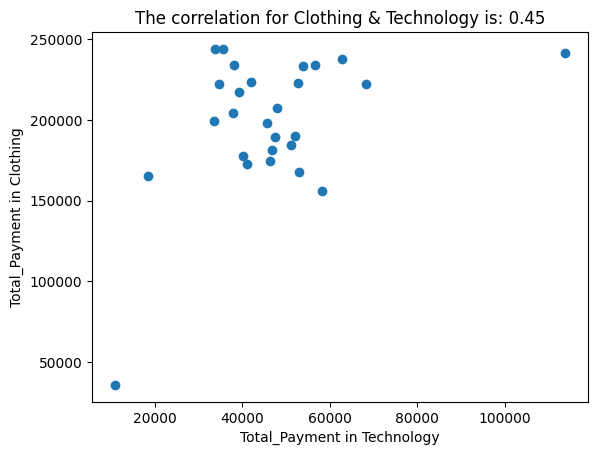

Total Monthly Payment for Souvenir in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1759.50
1    2021-02-28        1595.28
2    2021-03-31         774.18
3    2021-04-30         703.80
4    2021-05-31         774.18
5    2021-06-30        1466.25
6    2021-07-31        2181.78
7    2021-08-31        1700.85
8    2021-09-30         903.21
9    2021-10-31        1524.90
10   2021-11-30         985.32
11   2021-12-31         879.75
12   2022-01-31        1255.11
13   2022-02-28         504.39
14   2022-03-31         914.94
15   2022-04-30         410.55
16   2022-05-31         715.53
17   2022-06-30         914.94
18   2022-07-31         668.61
19   2022-08-31        1302.03
20   2022-09-30        1407.60
21   2022-10-31        1501.44
22   2022-11-30         281.52
23   2022-12-31         621.69
24   2023-01-31        2216.97
25   2023-02-28         844.56
26   2023-03-31         187.68


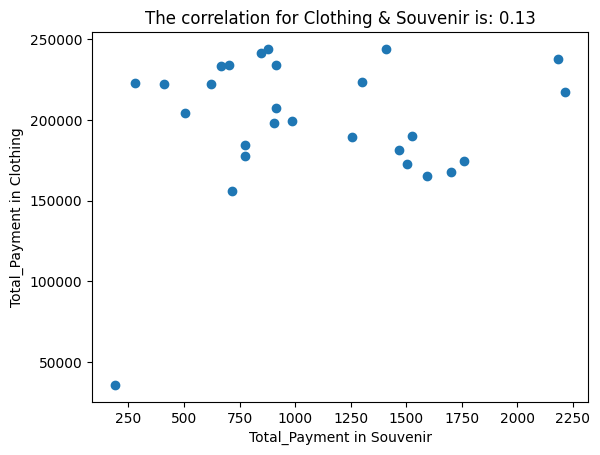

Total Monthly Payment for Shoes in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31     104429.205
1    2021-02-28      56688.580
2    2021-03-31      91934.825
3    2021-04-30      85332.955
4    2021-05-31      71802.020
5    2021-06-30     103938.225
6    2021-07-31      78185.510
7    2021-08-31      72838.575
8    2021-09-30      83641.635
9    2021-10-31      92589.590
10   2021-11-30     108630.395
11   2021-12-31      70492.490
12   2022-01-31     120579.200
13   2022-02-28      76930.575
14   2022-03-31      84732.785
15   2022-04-30     100828.185
16   2022-05-31      89588.740
17   2022-06-30     104429.205
18   2022-07-31     100937.375
19   2022-08-31     108139.415
20   2022-09-30     111031.075
21   2022-10-31      37046.755
22   2022-11-30      78731.085
23   2022-12-31      62690.280
24   2023-01-31      65854.915
25   2023-02-28     100991.970
26   2023-03-31      16095.400
Total Monthly Payment for Books in Zorlu Center Mall
   invoice_date  Total_Pay

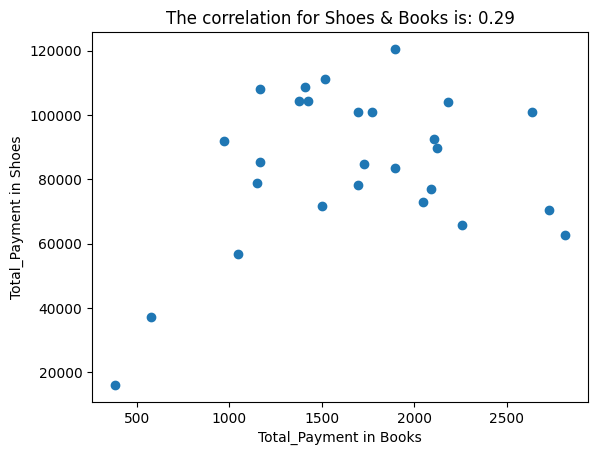

Total Monthly Payment for Cosmetics in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31       10896.88
1    2021-02-28       14840.90
2    2021-03-31       15206.84
3    2021-04-30       14434.30
4    2021-05-31       17117.86
5    2021-06-30       19476.14
6    2021-07-31       13824.40
7    2021-08-31        6912.20
8    2021-09-30       18662.94
9    2021-10-31       10774.90
10   2021-11-30       13214.50
11   2021-12-31       12767.24
12   2022-01-31       16548.62
13   2022-02-28       12319.98
14   2022-03-31       16345.32
15   2022-04-30       12441.96
16   2022-05-31       13173.84
17   2022-06-30       12929.88
18   2022-07-31       14800.24
19   2022-08-31        9555.10
20   2022-09-30       21143.20
21   2022-10-31       16711.26
22   2022-11-30       13458.46
23   2022-12-31       10571.60
24   2023-01-31       12523.28
25   2023-02-28       13743.08
26   2023-03-31        2642.90


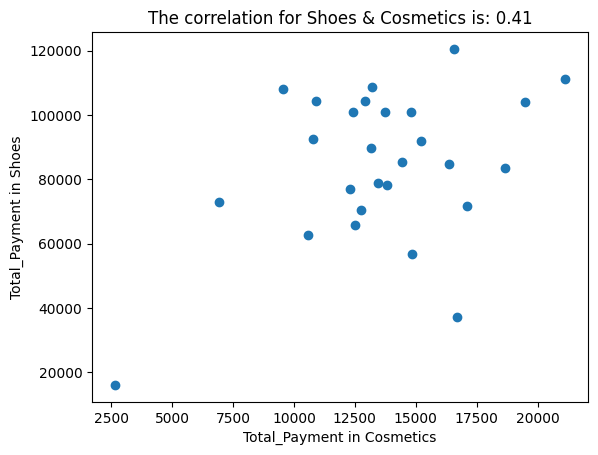

Total Monthly Payment for Food & Beverage in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1401.64
1    2021-02-28         836.80
2    2021-03-31        1652.68
3    2021-04-30        1636.99
4    2021-05-31        1412.10
5    2021-06-30        1506.24
6    2021-07-31        1197.67
7    2021-08-31        1856.65
8    2021-09-30        1516.70
9    2021-10-31        1778.20
10   2021-11-30        1490.55
11   2021-12-31        2295.97
12   2022-01-31        1150.60
13   2022-02-28        1589.92
14   2022-03-31        1657.91
15   2022-04-30        2003.09
16   2022-05-31        1537.62
17   2022-06-30        1642.22
18   2022-07-31         936.17
19   2022-08-31        1474.86
20   2022-09-30        1056.46
21   2022-10-31        1778.20
22   2022-11-30        2259.36
23   2022-12-31        2337.81
24   2023-01-31        1244.74
25   2023-02-28        2086.77
26   2023-03-31         617.14


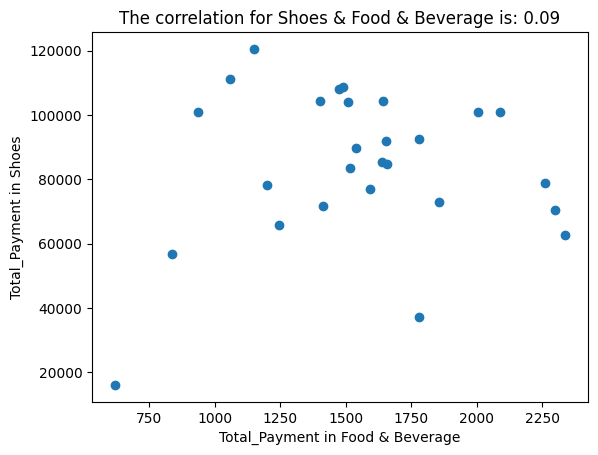

Total Monthly Payment for Toys in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        7454.72
1    2021-02-28        4408.32
2    2021-03-31        8924.16
3    2021-04-30        8279.04
4    2021-05-31        5877.76
5    2021-06-30        7060.48
6    2021-07-31        7454.72
7    2021-08-31        7096.32
8    2021-09-30        7741.44
9    2021-10-31        6164.48
10   2021-11-30       13404.16
11   2021-12-31        8064.00
12   2022-01-31        7239.68
13   2022-02-28        9820.16
14   2022-03-31        9856.00
15   2022-04-30        7418.88
16   2022-05-31        8960.00
17   2022-06-30        5662.72
18   2022-07-31       10429.44
19   2022-08-31        6056.96
20   2022-09-30        6594.56
21   2022-10-31        8135.68
22   2022-11-30        7275.52
23   2022-12-31        3512.32
24   2023-01-31        6702.08
25   2023-02-28        6056.96
26   2023-03-31        1899.52


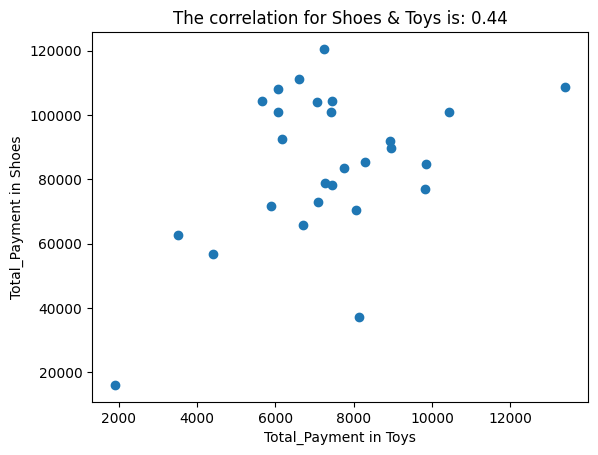

Total Monthly Payment for Technology in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31      46386.375
1    2021-02-28      18344.550
2    2021-03-31      40086.375
3    2021-04-30      37986.375
4    2021-05-31      51080.925
5    2021-06-30      46880.925
6    2021-07-31      62878.200
7    2021-08-31      52933.650
8    2021-09-30      45583.650
9    2021-10-31      52130.925
10   2021-11-30      33539.100
11   2021-12-31      33786.375
12   2022-01-31      47436.375
13   2022-02-28      37739.100
14   2022-03-31      56578.200
15   2022-04-30      34589.100
16   2022-05-31      58183.650
17   2022-06-30      47930.925
18   2022-07-31      53983.650
19   2022-08-31      41939.100
20   2022-09-30      35639.100
21   2022-10-31      41136.375
22   2022-11-30      52686.375
23   2022-12-31      68375.475
24   2023-01-31      39283.650
25   2023-02-28     113959.125
26   2023-03-31      10747.275


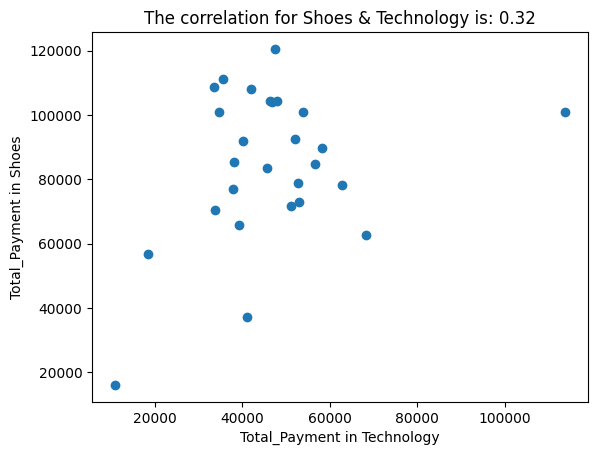

Total Monthly Payment for Souvenir in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1759.50
1    2021-02-28        1595.28
2    2021-03-31         774.18
3    2021-04-30         703.80
4    2021-05-31         774.18
5    2021-06-30        1466.25
6    2021-07-31        2181.78
7    2021-08-31        1700.85
8    2021-09-30         903.21
9    2021-10-31        1524.90
10   2021-11-30         985.32
11   2021-12-31         879.75
12   2022-01-31        1255.11
13   2022-02-28         504.39
14   2022-03-31         914.94
15   2022-04-30         410.55
16   2022-05-31         715.53
17   2022-06-30         914.94
18   2022-07-31         668.61
19   2022-08-31        1302.03
20   2022-09-30        1407.60
21   2022-10-31        1501.44
22   2022-11-30         281.52
23   2022-12-31         621.69
24   2023-01-31        2216.97
25   2023-02-28         844.56
26   2023-03-31         187.68


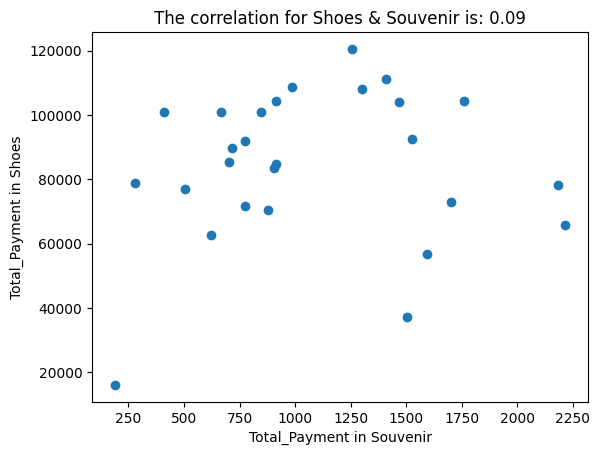

Total Monthly Payment for Books in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1424.10
1    2021-02-28        1045.35
2    2021-03-31         969.60
3    2021-04-30        1166.55
4    2021-05-31        1499.85
5    2021-06-30        2181.60
6    2021-07-31        1696.80
7    2021-08-31        2045.25
8    2021-09-30        1893.75
9    2021-10-31        2105.85
10   2021-11-30        1408.95
11   2021-12-31        2727.00
12   2022-01-31        1893.75
13   2022-02-28        2090.70
14   2022-03-31        1727.10
15   2022-04-30        1696.80
16   2022-05-31        2121.00
17   2022-06-30        1378.65
18   2022-07-31        1772.55
19   2022-08-31        1166.55
20   2022-09-30        1515.00
21   2022-10-31         575.70
22   2022-11-30        1151.40
23   2022-12-31        2817.90
24   2023-01-31        2257.35
25   2023-02-28        2636.10
26   2023-03-31         378.75
Total Monthly Payment for Cosmetics in Zorlu Center Mall
   invoice_date  Total

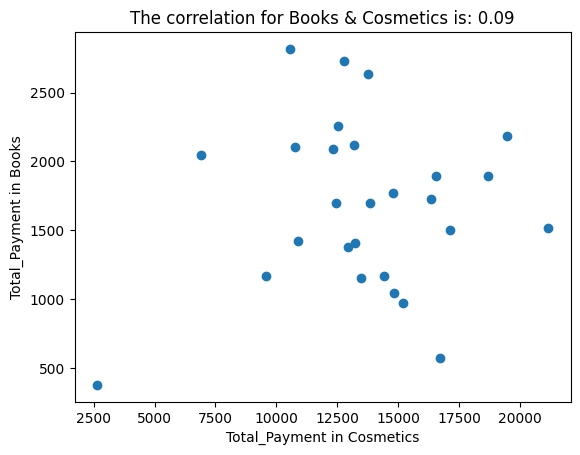

Total Monthly Payment for Food & Beverage in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1401.64
1    2021-02-28         836.80
2    2021-03-31        1652.68
3    2021-04-30        1636.99
4    2021-05-31        1412.10
5    2021-06-30        1506.24
6    2021-07-31        1197.67
7    2021-08-31        1856.65
8    2021-09-30        1516.70
9    2021-10-31        1778.20
10   2021-11-30        1490.55
11   2021-12-31        2295.97
12   2022-01-31        1150.60
13   2022-02-28        1589.92
14   2022-03-31        1657.91
15   2022-04-30        2003.09
16   2022-05-31        1537.62
17   2022-06-30        1642.22
18   2022-07-31         936.17
19   2022-08-31        1474.86
20   2022-09-30        1056.46
21   2022-10-31        1778.20
22   2022-11-30        2259.36
23   2022-12-31        2337.81
24   2023-01-31        1244.74
25   2023-02-28        2086.77
26   2023-03-31         617.14


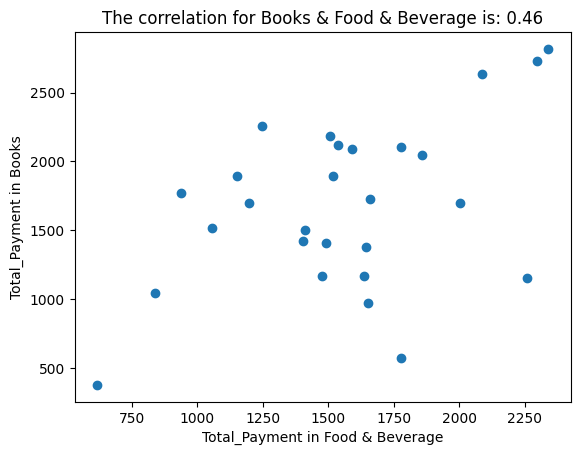

Total Monthly Payment for Toys in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        7454.72
1    2021-02-28        4408.32
2    2021-03-31        8924.16
3    2021-04-30        8279.04
4    2021-05-31        5877.76
5    2021-06-30        7060.48
6    2021-07-31        7454.72
7    2021-08-31        7096.32
8    2021-09-30        7741.44
9    2021-10-31        6164.48
10   2021-11-30       13404.16
11   2021-12-31        8064.00
12   2022-01-31        7239.68
13   2022-02-28        9820.16
14   2022-03-31        9856.00
15   2022-04-30        7418.88
16   2022-05-31        8960.00
17   2022-06-30        5662.72
18   2022-07-31       10429.44
19   2022-08-31        6056.96
20   2022-09-30        6594.56
21   2022-10-31        8135.68
22   2022-11-30        7275.52
23   2022-12-31        3512.32
24   2023-01-31        6702.08
25   2023-02-28        6056.96
26   2023-03-31        1899.52


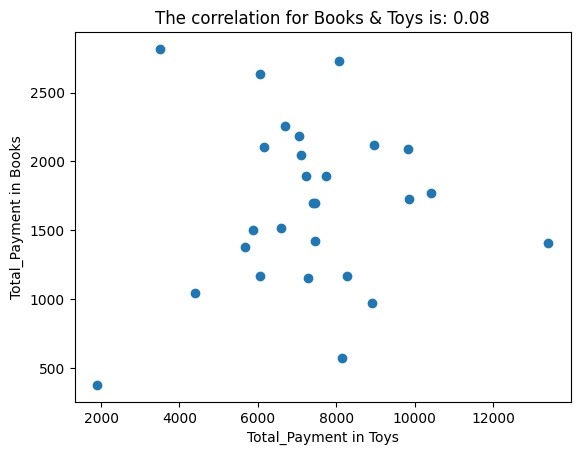

Total Monthly Payment for Technology in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31      46386.375
1    2021-02-28      18344.550
2    2021-03-31      40086.375
3    2021-04-30      37986.375
4    2021-05-31      51080.925
5    2021-06-30      46880.925
6    2021-07-31      62878.200
7    2021-08-31      52933.650
8    2021-09-30      45583.650
9    2021-10-31      52130.925
10   2021-11-30      33539.100
11   2021-12-31      33786.375
12   2022-01-31      47436.375
13   2022-02-28      37739.100
14   2022-03-31      56578.200
15   2022-04-30      34589.100
16   2022-05-31      58183.650
17   2022-06-30      47930.925
18   2022-07-31      53983.650
19   2022-08-31      41939.100
20   2022-09-30      35639.100
21   2022-10-31      41136.375
22   2022-11-30      52686.375
23   2022-12-31      68375.475
24   2023-01-31      39283.650
25   2023-02-28     113959.125
26   2023-03-31      10747.275


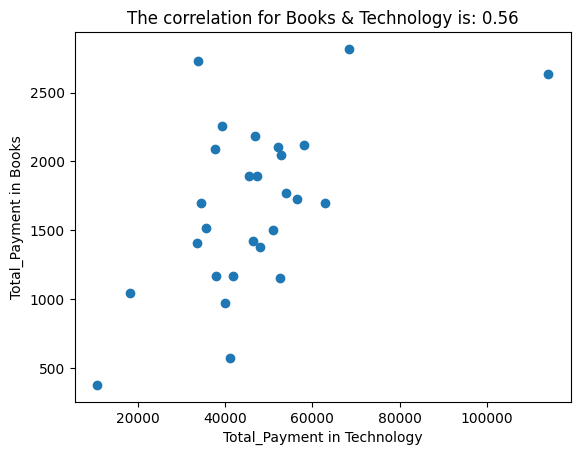

Total Monthly Payment for Souvenir in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1759.50
1    2021-02-28        1595.28
2    2021-03-31         774.18
3    2021-04-30         703.80
4    2021-05-31         774.18
5    2021-06-30        1466.25
6    2021-07-31        2181.78
7    2021-08-31        1700.85
8    2021-09-30         903.21
9    2021-10-31        1524.90
10   2021-11-30         985.32
11   2021-12-31         879.75
12   2022-01-31        1255.11
13   2022-02-28         504.39
14   2022-03-31         914.94
15   2022-04-30         410.55
16   2022-05-31         715.53
17   2022-06-30         914.94
18   2022-07-31         668.61
19   2022-08-31        1302.03
20   2022-09-30        1407.60
21   2022-10-31        1501.44
22   2022-11-30         281.52
23   2022-12-31         621.69
24   2023-01-31        2216.97
25   2023-02-28         844.56
26   2023-03-31         187.68


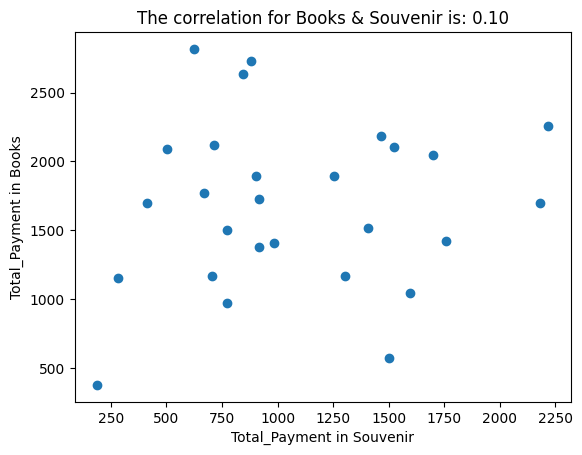

Total Monthly Payment for Cosmetics in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31       10896.88
1    2021-02-28       14840.90
2    2021-03-31       15206.84
3    2021-04-30       14434.30
4    2021-05-31       17117.86
5    2021-06-30       19476.14
6    2021-07-31       13824.40
7    2021-08-31        6912.20
8    2021-09-30       18662.94
9    2021-10-31       10774.90
10   2021-11-30       13214.50
11   2021-12-31       12767.24
12   2022-01-31       16548.62
13   2022-02-28       12319.98
14   2022-03-31       16345.32
15   2022-04-30       12441.96
16   2022-05-31       13173.84
17   2022-06-30       12929.88
18   2022-07-31       14800.24
19   2022-08-31        9555.10
20   2022-09-30       21143.20
21   2022-10-31       16711.26
22   2022-11-30       13458.46
23   2022-12-31       10571.60
24   2023-01-31       12523.28
25   2023-02-28       13743.08
26   2023-03-31        2642.90
Total Monthly Payment for Food & Beverage in Zorlu Center Mall
   invoice_d

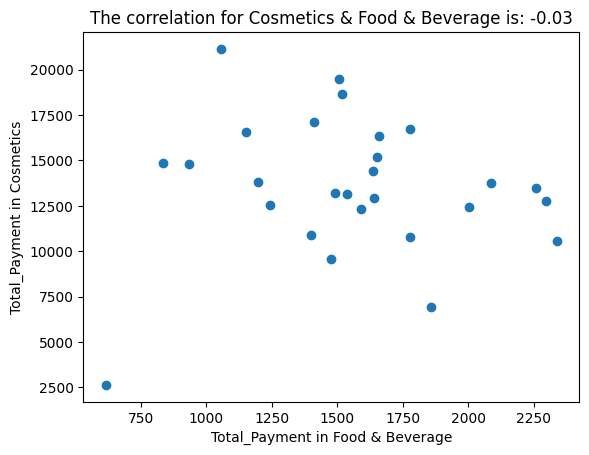

Total Monthly Payment for Toys in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        7454.72
1    2021-02-28        4408.32
2    2021-03-31        8924.16
3    2021-04-30        8279.04
4    2021-05-31        5877.76
5    2021-06-30        7060.48
6    2021-07-31        7454.72
7    2021-08-31        7096.32
8    2021-09-30        7741.44
9    2021-10-31        6164.48
10   2021-11-30       13404.16
11   2021-12-31        8064.00
12   2022-01-31        7239.68
13   2022-02-28        9820.16
14   2022-03-31        9856.00
15   2022-04-30        7418.88
16   2022-05-31        8960.00
17   2022-06-30        5662.72
18   2022-07-31       10429.44
19   2022-08-31        6056.96
20   2022-09-30        6594.56
21   2022-10-31        8135.68
22   2022-11-30        7275.52
23   2022-12-31        3512.32
24   2023-01-31        6702.08
25   2023-02-28        6056.96
26   2023-03-31        1899.52


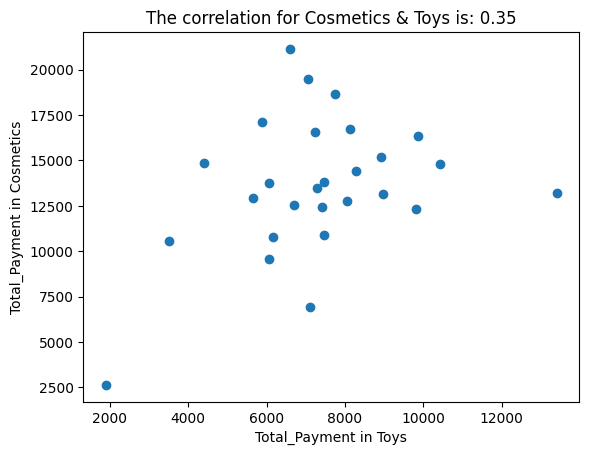

Total Monthly Payment for Technology in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31      46386.375
1    2021-02-28      18344.550
2    2021-03-31      40086.375
3    2021-04-30      37986.375
4    2021-05-31      51080.925
5    2021-06-30      46880.925
6    2021-07-31      62878.200
7    2021-08-31      52933.650
8    2021-09-30      45583.650
9    2021-10-31      52130.925
10   2021-11-30      33539.100
11   2021-12-31      33786.375
12   2022-01-31      47436.375
13   2022-02-28      37739.100
14   2022-03-31      56578.200
15   2022-04-30      34589.100
16   2022-05-31      58183.650
17   2022-06-30      47930.925
18   2022-07-31      53983.650
19   2022-08-31      41939.100
20   2022-09-30      35639.100
21   2022-10-31      41136.375
22   2022-11-30      52686.375
23   2022-12-31      68375.475
24   2023-01-31      39283.650
25   2023-02-28     113959.125
26   2023-03-31      10747.275


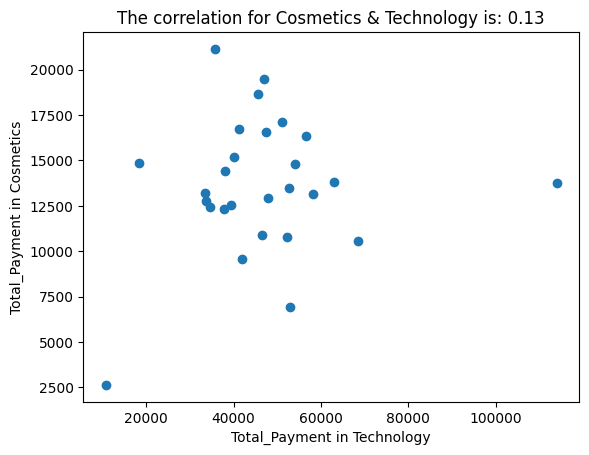

Total Monthly Payment for Souvenir in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1759.50
1    2021-02-28        1595.28
2    2021-03-31         774.18
3    2021-04-30         703.80
4    2021-05-31         774.18
5    2021-06-30        1466.25
6    2021-07-31        2181.78
7    2021-08-31        1700.85
8    2021-09-30         903.21
9    2021-10-31        1524.90
10   2021-11-30         985.32
11   2021-12-31         879.75
12   2022-01-31        1255.11
13   2022-02-28         504.39
14   2022-03-31         914.94
15   2022-04-30         410.55
16   2022-05-31         715.53
17   2022-06-30         914.94
18   2022-07-31         668.61
19   2022-08-31        1302.03
20   2022-09-30        1407.60
21   2022-10-31        1501.44
22   2022-11-30         281.52
23   2022-12-31         621.69
24   2023-01-31        2216.97
25   2023-02-28         844.56
26   2023-03-31         187.68


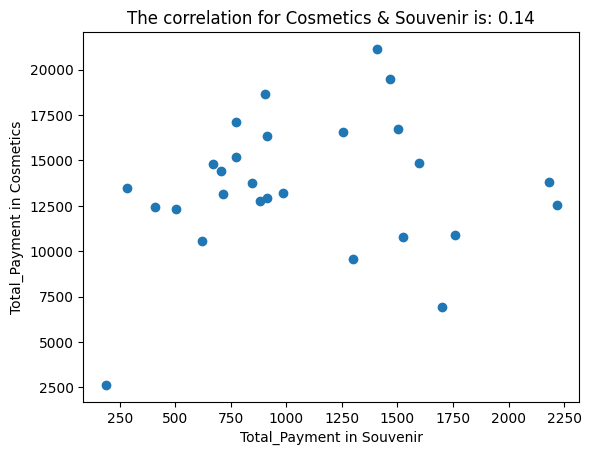

Total Monthly Payment for Food & Beverage in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1401.64
1    2021-02-28         836.80
2    2021-03-31        1652.68
3    2021-04-30        1636.99
4    2021-05-31        1412.10
5    2021-06-30        1506.24
6    2021-07-31        1197.67
7    2021-08-31        1856.65
8    2021-09-30        1516.70
9    2021-10-31        1778.20
10   2021-11-30        1490.55
11   2021-12-31        2295.97
12   2022-01-31        1150.60
13   2022-02-28        1589.92
14   2022-03-31        1657.91
15   2022-04-30        2003.09
16   2022-05-31        1537.62
17   2022-06-30        1642.22
18   2022-07-31         936.17
19   2022-08-31        1474.86
20   2022-09-30        1056.46
21   2022-10-31        1778.20
22   2022-11-30        2259.36
23   2022-12-31        2337.81
24   2023-01-31        1244.74
25   2023-02-28        2086.77
26   2023-03-31         617.14
Total Monthly Payment for Toys in Zorlu Center Mall
   invoice_date  

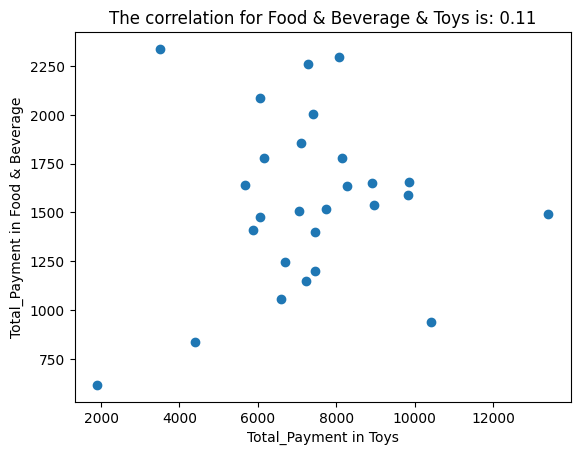

Total Monthly Payment for Technology in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31      46386.375
1    2021-02-28      18344.550
2    2021-03-31      40086.375
3    2021-04-30      37986.375
4    2021-05-31      51080.925
5    2021-06-30      46880.925
6    2021-07-31      62878.200
7    2021-08-31      52933.650
8    2021-09-30      45583.650
9    2021-10-31      52130.925
10   2021-11-30      33539.100
11   2021-12-31      33786.375
12   2022-01-31      47436.375
13   2022-02-28      37739.100
14   2022-03-31      56578.200
15   2022-04-30      34589.100
16   2022-05-31      58183.650
17   2022-06-30      47930.925
18   2022-07-31      53983.650
19   2022-08-31      41939.100
20   2022-09-30      35639.100
21   2022-10-31      41136.375
22   2022-11-30      52686.375
23   2022-12-31      68375.475
24   2023-01-31      39283.650
25   2023-02-28     113959.125
26   2023-03-31      10747.275


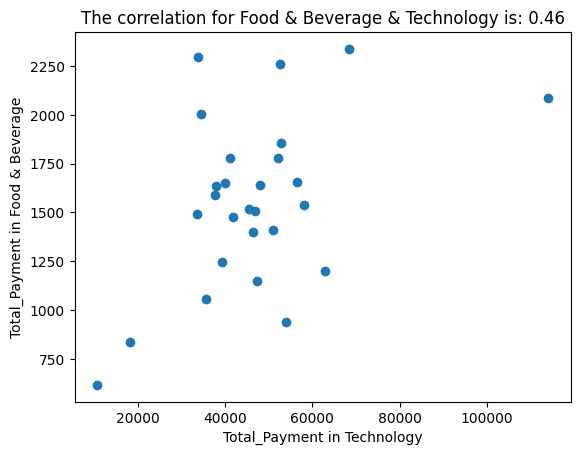

Total Monthly Payment for Souvenir in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1759.50
1    2021-02-28        1595.28
2    2021-03-31         774.18
3    2021-04-30         703.80
4    2021-05-31         774.18
5    2021-06-30        1466.25
6    2021-07-31        2181.78
7    2021-08-31        1700.85
8    2021-09-30         903.21
9    2021-10-31        1524.90
10   2021-11-30         985.32
11   2021-12-31         879.75
12   2022-01-31        1255.11
13   2022-02-28         504.39
14   2022-03-31         914.94
15   2022-04-30         410.55
16   2022-05-31         715.53
17   2022-06-30         914.94
18   2022-07-31         668.61
19   2022-08-31        1302.03
20   2022-09-30        1407.60
21   2022-10-31        1501.44
22   2022-11-30         281.52
23   2022-12-31         621.69
24   2023-01-31        2216.97
25   2023-02-28         844.56
26   2023-03-31         187.68


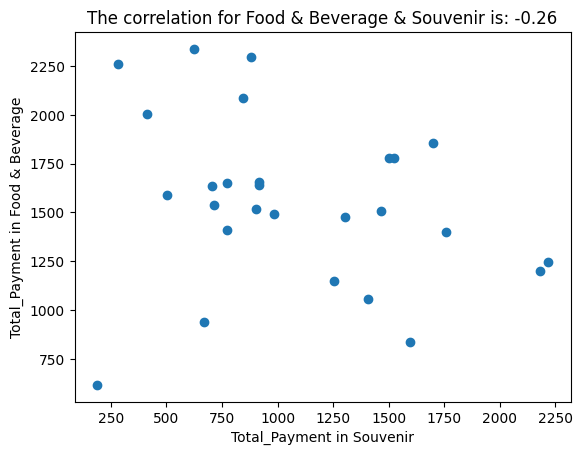

Total Monthly Payment for Toys in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        7454.72
1    2021-02-28        4408.32
2    2021-03-31        8924.16
3    2021-04-30        8279.04
4    2021-05-31        5877.76
5    2021-06-30        7060.48
6    2021-07-31        7454.72
7    2021-08-31        7096.32
8    2021-09-30        7741.44
9    2021-10-31        6164.48
10   2021-11-30       13404.16
11   2021-12-31        8064.00
12   2022-01-31        7239.68
13   2022-02-28        9820.16
14   2022-03-31        9856.00
15   2022-04-30        7418.88
16   2022-05-31        8960.00
17   2022-06-30        5662.72
18   2022-07-31       10429.44
19   2022-08-31        6056.96
20   2022-09-30        6594.56
21   2022-10-31        8135.68
22   2022-11-30        7275.52
23   2022-12-31        3512.32
24   2023-01-31        6702.08
25   2023-02-28        6056.96
26   2023-03-31        1899.52
Total Monthly Payment for Technology in Zorlu Center Mall
   invoice_date  Total

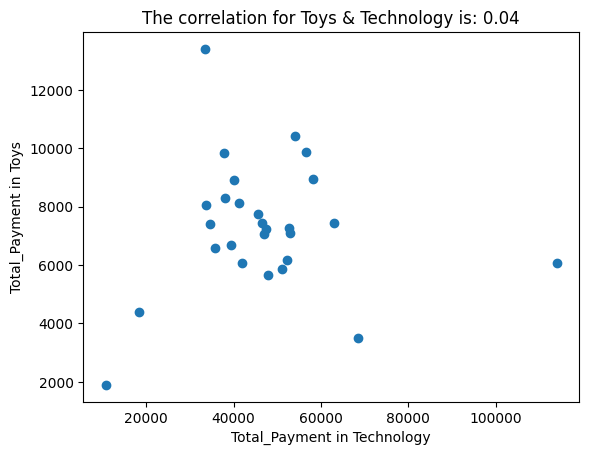

Total Monthly Payment for Souvenir in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1759.50
1    2021-02-28        1595.28
2    2021-03-31         774.18
3    2021-04-30         703.80
4    2021-05-31         774.18
5    2021-06-30        1466.25
6    2021-07-31        2181.78
7    2021-08-31        1700.85
8    2021-09-30         903.21
9    2021-10-31        1524.90
10   2021-11-30         985.32
11   2021-12-31         879.75
12   2022-01-31        1255.11
13   2022-02-28         504.39
14   2022-03-31         914.94
15   2022-04-30         410.55
16   2022-05-31         715.53
17   2022-06-30         914.94
18   2022-07-31         668.61
19   2022-08-31        1302.03
20   2022-09-30        1407.60
21   2022-10-31        1501.44
22   2022-11-30         281.52
23   2022-12-31         621.69
24   2023-01-31        2216.97
25   2023-02-28         844.56
26   2023-03-31         187.68


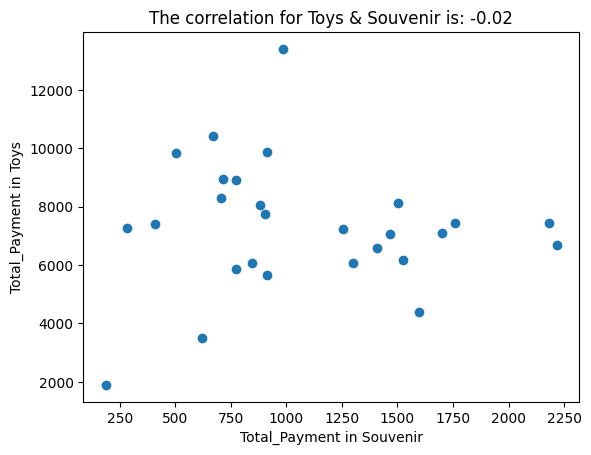

Total Monthly Payment for Technology in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31      46386.375
1    2021-02-28      18344.550
2    2021-03-31      40086.375
3    2021-04-30      37986.375
4    2021-05-31      51080.925
5    2021-06-30      46880.925
6    2021-07-31      62878.200
7    2021-08-31      52933.650
8    2021-09-30      45583.650
9    2021-10-31      52130.925
10   2021-11-30      33539.100
11   2021-12-31      33786.375
12   2022-01-31      47436.375
13   2022-02-28      37739.100
14   2022-03-31      56578.200
15   2022-04-30      34589.100
16   2022-05-31      58183.650
17   2022-06-30      47930.925
18   2022-07-31      53983.650
19   2022-08-31      41939.100
20   2022-09-30      35639.100
21   2022-10-31      41136.375
22   2022-11-30      52686.375
23   2022-12-31      68375.475
24   2023-01-31      39283.650
25   2023-02-28     113959.125
26   2023-03-31      10747.275
Total Monthly Payment for Souvenir in Zorlu Center Mall
   invoice_date  T

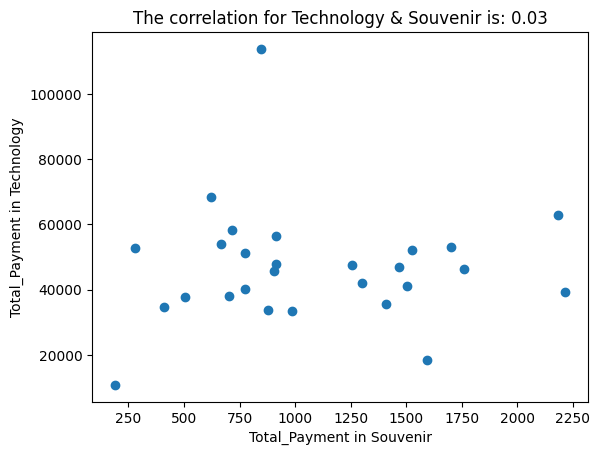

Total Monthly Payment for Souvenir in Zorlu Center Mall
   invoice_date  Total_Payment
0    2021-01-31        1759.50
1    2021-02-28        1595.28
2    2021-03-31         774.18
3    2021-04-30         703.80
4    2021-05-31         774.18
5    2021-06-30        1466.25
6    2021-07-31        2181.78
7    2021-08-31        1700.85
8    2021-09-30         903.21
9    2021-10-31        1524.90
10   2021-11-30         985.32
11   2021-12-31         879.75
12   2022-01-31        1255.11
13   2022-02-28         504.39
14   2022-03-31         914.94
15   2022-04-30         410.55
16   2022-05-31         715.53
17   2022-06-30         914.94
18   2022-07-31         668.61
19   2022-08-31        1302.03
20   2022-09-30        1407.60
21   2022-10-31        1501.44
22   2022-11-30         281.52
23   2022-12-31         621.69
24   2023-01-31        2216.97
25   2023-02-28         844.56
26   2023-03-31         187.68


In [80]:
# creating an empty dictionary to store the correlation values
correlation_dict_Zorlu_Center_Mall = {}

categories = df['category'].unique()
for i, category_i in enumerate(categories):
    filtered_df_i = df[(df['category'] == category_i) & (df['shopping_mall'] == 'Zorlu Center')]

    result_df_i = filtered_df_i.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

    result_df_i = result_df_i.reset_index()

    result_df_i = result_df_i.rename(columns={'Total_Payment': 'Total_Payment'})

    print('Total Monthly Payment for', category_i, 'in Zorlu Center Mall')
    print(result_df_i)

    for j in range(i + 1, len(categories)):
        category_j = categories[j]
        filtered_df_j = df[(df['category'] == category_j) & (df['shopping_mall'] == 'Zorlu Center')]

        result_df_j = filtered_df_j.groupby(pd.Grouper(key='invoice_date', freq='M')).agg({'Total_Payment': 'sum'})

        result_df_j = result_df_j.reset_index()

        result_df_j = result_df_j.rename(columns={'Total_Payment': 'Total_Payment'})

        print('Total Monthly Payment for', category_j, 'in Zorlu Center Mall')
        print(result_df_j)

        correlation_key = f'The correlation for {category_i} & {category_j} is'
        correlation_value = result_df_i['Total_Payment'].corr(result_df_j['Total_Payment'])
        correlation_dict_Zorlu_Center_Mall[correlation_key] = correlation_value

        plt.scatter(result_df_j['Total_Payment'], result_df_i['Total_Payment'])
        plt.xlabel(f'Total_Payment in {category_j}')
        plt.ylabel(f'Total_Payment in {category_i}')
        plt.title(f'{correlation_key}: {correlation_value:.2f}')
        plt.show()



In [81]:
correlation_dict_Zorlu_Center_Mall

{'The correlation for Clothing & Shoes is': 0.5391709479729078,
 'The correlation for Clothing & Books is': 0.47990841781644056,
 'The correlation for Clothing & Cosmetics is': 0.481246074103121,
 'The correlation for Clothing & Food & Beverage is': 0.44759036649010986,
 'The correlation for Clothing & Toys is': 0.3848555174568406,
 'The correlation for Clothing & Technology is': 0.4509171017913562,
 'The correlation for Clothing & Souvenir is': 0.13143431016809162,
 'The correlation for Shoes & Books is': 0.28864721780363434,
 'The correlation for Shoes & Cosmetics is': 0.4066500936789613,
 'The correlation for Shoes & Food & Beverage is': 0.08719195074814938,
 'The correlation for Shoes & Toys is': 0.43992350740226527,
 'The correlation for Shoes & Technology is': 0.31872514760801623,
 'The correlation for Shoes & Souvenir is': 0.0918841970499685,
 'The correlation for Books & Cosmetics is': 0.09129207902389713,
 'The correlation for Books & Food & Beverage is': 0.4643334414121627,
 

In [82]:
# Create a new dictionary with correlations >= 0.65
filtered_correlation_dict_Zorlu_Center_Mall = {key: value for key, value in correlation_dict_Zorlu_Center_Mall.items() if value >= 0.65}

# Print the filtered dictionary
print(filtered_correlation_dict_Zorlu_Center_Mall)

{}


In [83]:
correlation_table

,city,mall,correlation,item1,item2
0,Istanbull,Forum istanbul Mall,0.697743,Cosmetics,Toys
1,Istanbull,Kanyon Mall,0.668588,Clothing,Shoes
2,Istanbull,Kanyon Mall,0.747761,Cosmetics,Technology
3,Istanbull,Metrocity Mall,0.744072,Clothing,Toys
4,Istanbull,Metrocity Mall,0.676121,Shoes,Cosmetics
5,Istanbull,Metrocity Mall,0.708054,Cosmetics,Toys
6,Istanbull,Metrocity Mall,0.668409,Cosmetics,Technology
7,Istanbull,Metropol AVM,0.719752,Clothing,Food & Beverage
8,Istanbull,Mall of Istanbul,0.735008,Clothing,Shoes
9,Istanbull,Mall of Istanbul,0.709251,Clothing,Food & Beverage


The category Cosmetic and Toys have strong correlation in 2 malls in the city
which gives as information that their is chance that the customers in the city
buying cosmetic also buy toys too, so we can keep this products nearby so that
customers will show a tendency to buy the products together and thereby increase
the sales

similarly the products Clothing and Shoes,Cosmetic and Technology,Clothing and Toy,Clothing and Food & Beverage have strong correlation in more than one mall

# Time series for Food & Beverage in Metrocity mall



In [84]:
#creating the data frame for time series
df9 = df[(df['category'] == 'Food & Beverage') & (df['shopping_mall'] == 'Metrocity')].groupby(['invoice_date']).agg({'Total_Payment': 'sum'})

In [85]:
df9

,Total_Payment
invoice_date,
2021-01-01,392.25
2021-01-02,209.20
2021-01-03,146.44
2021-01-04,57.53
2021-01-06,188.28
...,...
2023-03-04,183.05
2023-03-05,94.14
2023-03-06,245.81


<Axes: xlabel='invoice_date'>

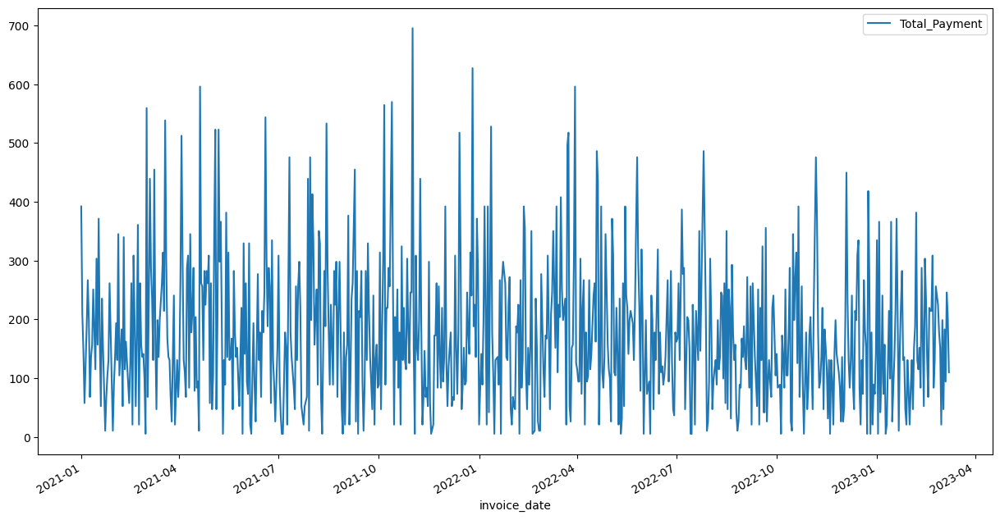

In [86]:
df9.plot(figsize=(15, 8))

In [87]:
k1=df9

In [88]:
#importing library for stationarity check
from statsmodels.tsa.stattools import adfuller

In [89]:
def adf_test(series):
    result=adfuller(series)
    print('ADF Statistics: {}'.format(result[0]))
    print('p- value: {}'.format(result[1]))
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

In [90]:
adf_test(k1)

ADF Statistics: -26.172871041530314
p- value: 0.0
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


In [91]:
k1

,Total_Payment
invoice_date,
2021-01-01,392.25
2021-01-02,209.20
2021-01-03,146.44
2021-01-04,57.53
2021-01-06,188.28
...,...
2023-03-04,183.05
2023-03-05,94.14
2023-03-06,245.81


In [92]:
split_index = int(0.8 * len(k1))
# Split the data into train and test sets
train_data = k1[:split_index]
test_data = k1[split_index:]

In [93]:
test_data

,Total_Payment
invoice_date,
2022-10-04,88.91
2022-10-05,5.23
2022-10-06,172.59
2022-10-07,130.75
2022-10-08,83.68
...,...
2023-03-04,183.05
2023-03-05,94.14
2023-03-06,245.81


In [94]:
train_data

,Total_Payment
invoice_date,
2021-01-01,392.25
2021-01-02,209.20
2021-01-03,146.44
2021-01-04,57.53
2021-01-06,188.28
...,...
2022-09-27,219.66
2022-09-28,240.58
2022-09-30,104.60


In [95]:
#prediction
pred_start_date=test_data.index[0]
pred_end_date=test_data.index[-1]

In [96]:
pred_end_date

Timestamp('2023-03-08 00:00:00')

In [97]:
# create a ARIMA model
from statsmodels.tsa.arima.model import ARIMA

In [98]:
model_ARIMA=ARIMA(k1['Total_Payment'],order=(4,3,1))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



In [99]:
model_Arima_fit=model_ARIMA.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



In [100]:
model_Arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:          Total_Payment   No. Observations:                  747
Model:                 ARIMA(4, 3, 1)   Log Likelihood               -4859.803
Date:                Wed, 06 Sep 2023   AIC                           9731.606
Time:                        15:03:45   BIC                           9759.278
Sample:                             0   HQIC                          9742.272
                                - 747                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2924      0.032    -40.835      0.000      -1.354      -1.230
ar.L2         -1.1735      0.048    -24.321      0.000      -1.268      -1.079
ar.L3         -0.7857      0.051    -15.399      0.000      -0.886      -0.686
ar.L4         -0.3484      0.033    -10.552      0.000      -0.413      -0.284
ma.L1         -1.0000      0.050    -19.879      0.000      -1.099      -0.901
sigma2      2.723e+04   1.85e-06   1.47e+10      0.000    2.72e+04    2.72e+04
===================================================================================
Ljung-Box (L1) (Q):                   8.10   Jarque-Bera (JB):                 3.38
Prob(Q):                              0.00   Prob(JB):                         0.18
Heteroskedasticity (H):               0.60   Skew:                             0.15
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.15
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.19e+26. Standard errors may be unstable.
"""

In [101]:
##prediction
pred_start_date=test_data.index[0]
pred_end_date=test_data.index[-1]
print(pred_start_date)
print(pred_end_date)

2022-10-04 00:00:00
2023-03-08 00:00:00


In [102]:
pred=model_Arima_fit.predict(start=pred_start_date,end=pred_end_date)
residuals=test_data['Total_Payment']-pred

In [103]:
pred

invoice_date
2022-10-04    114.321431
2022-10-05     42.727517
2022-10-06    -23.235531
2022-10-07    103.763896
2022-10-08    113.158844
                 ...    
2023-03-04     34.175579
2023-03-05    128.283521
2023-03-06    110.023858
2023-03-07    239.730797
2023-03-08    206.842076
Name: predicted_mean, Length: 150, dtype: float64

In [104]:
residuals

invoice_date
2022-10-04    -25.411431
2022-10-05    -37.497517
2022-10-06    195.825531
2022-10-07     26.986104
2022-10-08    -29.478844
                 ...    
2023-03-04    148.874421
2023-03-05    -34.143521
2023-03-06    135.786142
2023-03-07    -35.760797
2023-03-08    -97.012076
Length: 150, dtype: float64

<Axes: ylabel='Density'>

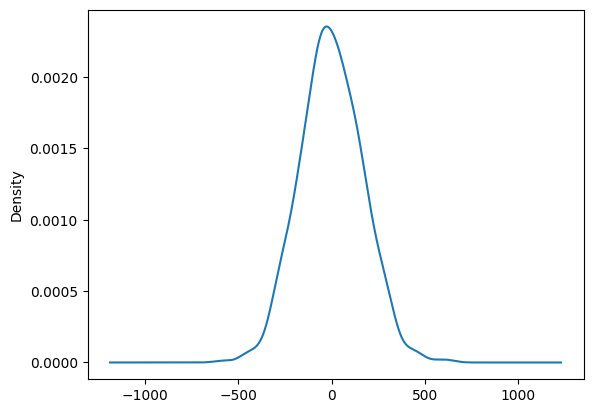

In [105]:
model_Arima_fit.resid.plot(kind='kde')

In [106]:
test_data['Predicted_ARIMA']=pred

<ipython-input-106-69896c9f46c9>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<Axes: xlabel='invoice_date'>

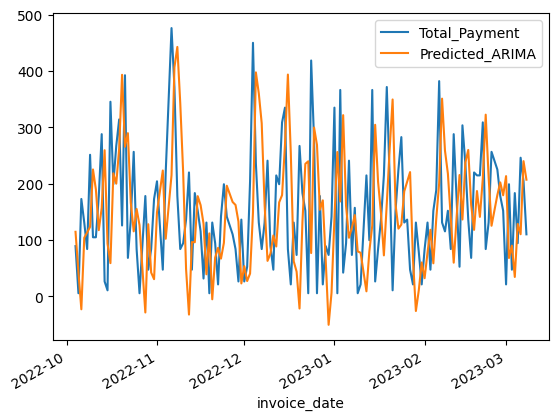

In [107]:
test_data[['Total_Payment','Predicted_ARIMA']].plot()


Here we can see that the predicted values are moving close to the actuall value that indicates the good performance of the model


Next 10 days forcasted values for food and beverages of Forum Istanbul mall


In [108]:

start_date = pd.to_datetime("2023-03-09")
date_range = pd.date_range(start=start_date, periods=10, freq='D')

# Create a DataFrame with the dates and forecasted values
forcast1 = pd.DataFrame({'Date': date_range, 'Forecasted_Values': model_Arima_fit.forecast(10)})

forcast1.reset_index(drop=True, inplace=True)

print(forcast1)

        Date  Forecasted_Values
0 2023-03-09         200.005222
1 2023-03-10         181.903259
2 2023-03-11         196.260461
3 2023-03-12         169.450666
4 2023-03-13         178.941826
5 2023-03-14         202.361714
6 2023-03-15         186.536592
7 2023-03-16         191.222942
8 2023-03-17         192.184607
9 2023-03-18         200.191493


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



This predicts the possible purchase value that can occur in future based on the historic data

similarly the retailers can make prediction for future days after 2023-03-18 also


# Time series for Food & Beverage in Forum Istanbul mall





In [109]:
#creating the data frame
df10 = df[(df['category'] == 'Food & Beverage') & (df['shopping_mall'] == 'Forum Istanbul')].groupby(['invoice_date']).agg({'Total_Payment': 'sum'})

In [110]:
df10

,Total_Payment
invoice_date,
2021-01-02,10.46
2021-01-03,67.99
2021-01-04,88.91
2021-01-05,109.83
2021-01-06,183.05
...,...
2023-03-02,130.75
2023-03-03,83.68
2023-03-04,52.30


<Axes: xlabel='invoice_date'>

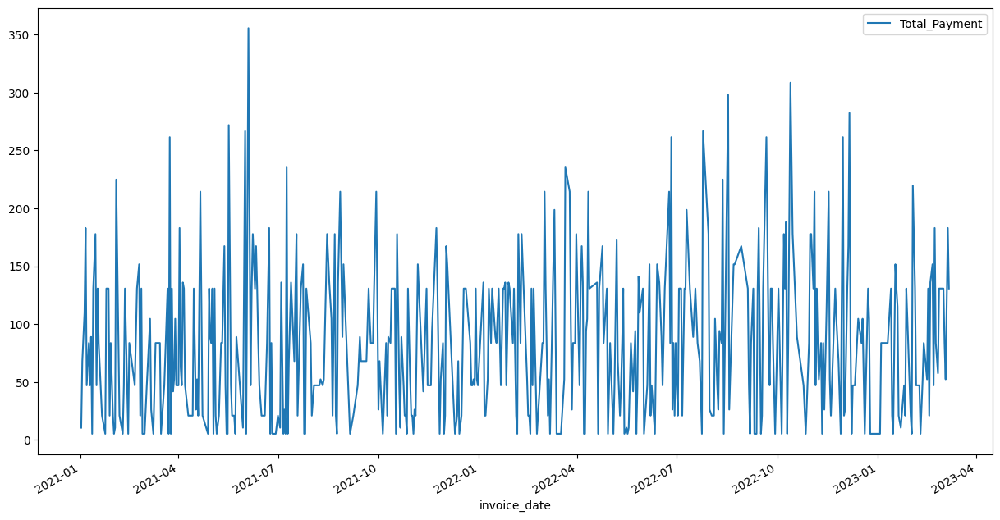

In [111]:
df10.plot(figsize=(15, 8))

In [112]:
k=df10

In [113]:
#importing the library to check stationarity
from statsmodels.tsa.stattools import adfuller

In [114]:
def adf_test(series):
    result=adfuller(series)
    print('ADF Statistics: {}'.format(result[0]))
    print('p- value: {}'.format(result[1]))
    if result[1] <= 0.05:
        print("strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

In [115]:
adf_test(k)

ADF Statistics: -21.964584280041866
p- value: 0.0
strong evidence against the null hypothesis, reject the null hypothesis. Data has no unit root and is stationary


In [116]:
k

,Total_Payment
invoice_date,
2021-01-02,10.46
2021-01-03,67.99
2021-01-04,88.91
2021-01-05,109.83
2021-01-06,183.05
...,...
2023-03-02,130.75
2023-03-03,83.68
2023-03-04,52.30


In [117]:
split_index = int(0.8 * len(k))
# Split the data into train and test sets
train_data = k[:split_index]
test_data = k[split_index:]

In [118]:
train_data

,Total_Payment
invoice_date,
2021-01-02,10.46
2021-01-03,67.99
2021-01-04,88.91
2021-01-05,109.83
2021-01-06,183.05
...,...
2022-09-21,261.50
2022-09-23,83.68
2022-09-24,47.07


In [119]:
test_data

,Total_Payment
invoice_date,
2022-09-27,83.68
2022-09-29,5.23
2022-10-02,130.75
2022-10-04,47.07
2022-10-05,5.23
...,...
2023-03-02,130.75
2023-03-03,83.68
2023-03-04,52.30


In [120]:
##prediction
pred_start_date=test_data.index[0]
pred_end_date=test_data.index[-1]

In [121]:
pred_end_date

Timestamp('2023-03-07 00:00:00')

In [122]:
## create a ARIMA model
from statsmodels.tsa.arima.model import ARIMA

In [123]:
model_ARIMA=ARIMA(k['Total_Payment'],order=(4,3,1))

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



In [124]:
model_Arima_fit1=model_ARIMA.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



In [125]:
model_Arima_fit1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:          Total_Payment   No. Observations:                  476
Model:                 ARIMA(4, 3, 1)   Log Likelihood               -2803.243
Date:                Wed, 06 Sep 2023   AIC                           5618.486
Time:                        15:03:47   BIC                           5643.440
Sample:                             0   HQIC                          5628.301
                                - 476                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.3269      0.041    -32.613      0.000      -1.407      -1.247
ar.L2         -1.2077      0.065    -18.592      0.000      -1.335      -1.080
ar.L3         -0.8858      0.064    -13.833      0.000      -1.011      -0.760
ar.L4         -0.3986      0.047     -8.486      0.000      -0.491      -0.307
ma.L1         -1.0000     14.983     -0.067      0.947     -30.366      28.366
sigma2      8034.9427    1.2e+05      0.067      0.947   -2.28e+05    2.44e+05
===================================================================================
Ljung-Box (L1) (Q):                   4.95   Jarque-Bera (JB):                 3.78
Prob(Q):                              0.03   Prob(JB):                         0.15
Heteroskedasticity (H):               0.95   Skew:                             0.21
Prob(H) (two-sided):                  0.76   Kurtosis:                         3.12
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [126]:
##prediction
pred_start_date=test_data.index[0]
pred_end_date=test_data.index[-1]
print(pred_start_date)
print(pred_end_date)

2022-09-27 00:00:00
2023-03-07 00:00:00


In [127]:
pred=model_Arima_fit1.predict(start=pred_start_date,end=pred_end_date)
residuals=test_data['Total_Payment']-pred

In [128]:
pred

invoice_date
2022-09-27     94.003112
2022-09-29     36.832318
2022-10-02     50.900598
2022-10-04     98.246506
2022-10-05     40.733624
                 ...    
2023-03-02     95.987107
2023-03-03    136.661891
2023-03-04     69.982807
2023-03-06     81.852337
2023-03-07    150.475083
Name: predicted_mean, Length: 96, dtype: float64

In [129]:
residuals

invoice_date
2022-09-27    -10.323112
2022-09-29    -31.602318
2022-10-02     79.849402
2022-10-04    -51.176506
2022-10-05    -35.503624
                 ...    
2023-03-02     34.762893
2023-03-03    -52.981891
2023-03-04    -17.682807
2023-03-06    101.197663
2023-03-07    -19.725083
Length: 96, dtype: float64

<Axes: ylabel='Density'>

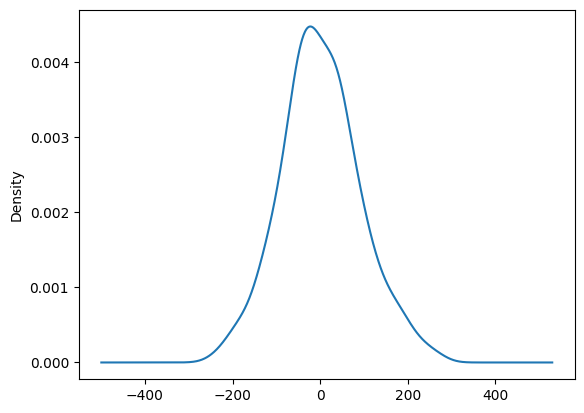

In [130]:
model_Arima_fit1.resid.plot(kind='kde')

In [131]:
test_data['Predicted_ARIMA']=pred

<ipython-input-131-69896c9f46c9>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<Axes: xlabel='invoice_date'>

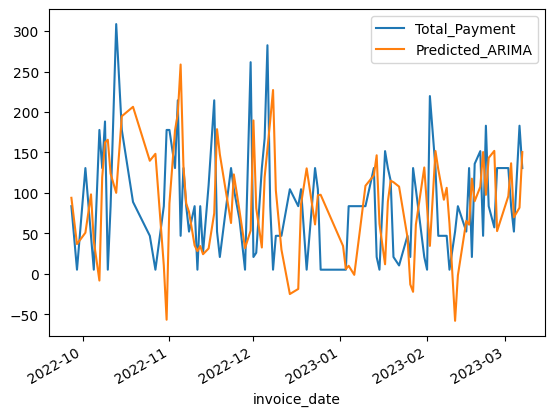

In [132]:
test_data[['Total_Payment','Predicted_ARIMA']].plot()


In [133]:

start_date = pd.to_datetime("2023-03-09")
date_range = pd.date_range(start=start_date, periods=10, freq='D')

# Create a DataFrame with the dates and forecasted values
forcast2 = pd.DataFrame({'Date': date_range, 'Forecasted_Values': model_Arima_fit1.forecast(10)})

forcast2.reset_index(drop=True, inplace=True)

print(forcast2)

        Date  Forecasted_Values
0 2023-03-09         130.224768
1 2023-03-10         132.037882
2 2023-03-11         165.563121
3 2023-03-12         181.124706
4 2023-03-13         159.342146
5 2023-03-14         179.615145
6 2023-03-15         192.287913
7 2023-03-16         204.324409
8 2023-03-17         203.848967
9 2023-03-18         210.542187


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning:

No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.



By using this model, we can predict future purchase amounts and make proactive
arrangements for necessary stock, cash balance, and other resources based on that
foresight.
This is not limited to 10 days we can also run it for future dates and adding the future
data to the database will increase the accuracy of the model for predicting further

The detailed Results and insights are attached along with the report